In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn
import torch

In [2]:
pd.set_option('display.max_columns', None)
df = pd.read_csv('data/all-2175.csv')
df_gene = pd.read_csv('data/gene_exp.csv')

print(df.shape)
print(df_gene.shape)

(3465, 210)
(1000, 101)


In [3]:
df.head()

,case_id,case_submitter_id,project_id,age_at_index,age_is_obfuscated,cause_of_death,cause_of_death_source,country_of_birth,country_of_residence_at_enrollment,days_to_birth,days_to_death,education_level,ethnicity,gender,marital_status,occupation_duration_years,premature_at_birth,race,vital_status,weeks_gestation_at_birth,year_of_birth,year_of_death,adrenal_hormone,age_at_diagnosis,ajcc_clinical_m,ajcc_clinical_n,ajcc_clinical_stage,ajcc_clinical_t,ajcc_pathologic_m,ajcc_pathologic_n,ajcc_pathologic_stage,ajcc_pathologic_t,ajcc_staging_system_edition,ann_arbor_b_symptoms,ann_arbor_b_symptoms_described,ann_arbor_clinical_stage,ann_arbor_extranodal_involvement,ann_arbor_pathologic_stage,best_overall_response,burkitt_lymphoma_clinical_variant,cancer_detection_method,child_pugh_classification,clark_level,classification_of_tumor,cog_liver_stage,cog_neuroblastoma_risk_group,cog_renal_stage,cog_rhabdomyosarcoma_risk_group,contiguous_organ_invaded,days_to_best_overall_response,days_to_diagnosis,days_to_last_follow_up,days_to_last_known_disease_status,days_to_recurrence,diagnosis_is_primary_disease,double_expressor_lymphoma,double_hit_lymphoma,eln_risk_classification,enneking_msts_grade,enneking_msts_metastasis,enneking_msts_stage,enneking_msts_tumor_site,ensat_clinical_m,ensat_pathologic_n,ensat_pathologic_stage,ensat_pathologic_t,esophageal_columnar_dysplasia_degree,esophageal_columnar_metaplasia_present,fab_morphology_code,figo_stage,figo_staging_edition_year,first_symptom_longest_duration,first_symptom_prior_to_diagnosis,gastric_esophageal_junction_involvement,gleason_grade_group,gleason_grade_tertiary,gleason_patterns_percent,gleason_score,goblet_cells_columnar_mucosa_present,icd_10_code,igcccg_stage,inpc_grade,inpc_histologic_group,inrg_stage,inss_stage,international_prognostic_index,irs_group,irs_stage,ishak_fibrosis_score,iss_stage,last_known_disease_status,laterality,margin_distance,margins_involved_site,masaoka_stage,max_tumor_bulk_site,medulloblastoma_molecular_classification,melanoma_known_primary,metastasis_at_diagnosis,metastasis_at_diagnosis_site,method_of_diagnosis,micropapillary_features,mitosis_karyorrhexis_index,mitotic_count,morphology,ovarian_specimen_status,ovarian_surface_involvement,papillary_renal_cell_type,pediatric_kidney_staging,peritoneal_fluid_cytological_status,pregnant_at_diagnosis,primary_diagnosis,primary_disease,primary_gleason_grade,prior_malignancy,prior_treatment,progression_or_recurrence,residual_disease,satellite_nodule_present,secondary_gleason_grade,site_of_resection_or_biopsy,sites_of_involvement,sites_of_involvement_count,supratentorial_localization,synchronous_malignancy,tissue_or_organ_of_origin,tumor_burden,tumor_confined_to_organ_of_origin,tumor_depth,tumor_focality,tumor_grade,tumor_grade_category,tumor_regression_grade,uicc_clinical_m,uicc_clinical_n,uicc_clinical_stage,uicc_clinical_t,uicc_pathologic_m,uicc_pathologic_n,uicc_pathologic_stage,uicc_pathologic_t,uicc_staging_system_edition,ulceration_indicator,weiss_assessment_findings,weiss_assessment_score,who_cns_grade,who_nte_grade,wilms_tumor_histologic_subtype,year_of_diagnosis,anaplasia_present,anaplasia_present_type,breslow_thickness,circumferential_resection_margin,greatest_tumor_dimension,gross_tumor_weight,largest_extrapelvic_peritoneal_focus,lymph_node_involved_site,lymph_nodes_positive,lymph_nodes_tested,lymphatic_invasion_present,non_nodal_regional_disease,non_nodal_tumor_deposits,percent_tumor_invasion,perineural_invasion_present,peripancreatic_lymph_nodes_positive,peripancreatic_lymph_nodes_tested,transglottic_extension,tumor_largest_dimension_diameter,tumor_stage,vascular_invasion_present,vascular_invasion_type,chemo_concurrent_to_radiation,clinical_trial_indicator,course_number,days_to_treatment_end,days_to_treatment_start,drug_category,embolic_agent,initial_disease_status,lesions_treated_number,number_of_cycles,number_of_fractions,prescribed_dose,protocol_identifier,radiosensitizing_agent,reason_treatment_ended,reason_tre

In [4]:
df_gene.head()

,Case,SOCS1,LCP1,CD79A,PRF1,CD74,B2M,HLA-A,TNFRSF14,CDKN1A,ID3,LMO2,LEF1,AXIN2,CREB3L1,TENT5C,ALDH2,CDH1,TMPRSS2,ESR1,PIK3R1,TP53,GATA2,FGFR2,MECOM,ERBB4,PREX2,MET,POU5F1,PAX8,FGFR4,TFRC,CDKN2C,CDKN1B,CCNE1,APOBEC3B,CXCR4,MYCL,NFIB,CEBPA,NDRG1,MYC,BCL9L,WT1,BCL6,SLC34A2,MUC16,IGF2BP2,HMGA1,TPM4,CDKN2A,MLF1,SDHD,BTG2,JUN,KLF6,SGK1,BIRC3,TNFAIP3,PTK6,CBLC,MUC1,ELF3,BCL3,CARD11,ERBB3,MACC1,TBX3,FAT1,PTPN13,TNC,PRRX1,MLLT11,CHST11,SFRP4,HOXA11,FSTL3,CSF1R,SIRPA,PDGFRA,MAF,MAFB,PDGFRB,COL3A1,COL1A1,CDH11,CCND1,ETV4,ETV5,SIX1,FGFR1,MYCN,CCND2,ERBB2,ATP1A1,PCBP1,WNK2,FBLN2,ELN,FGFR3,ACKR3
0,TCGA-N1-A6IA,-0.767204,-0.461749,-0.332902,-0.257786,-0.842213,0.003660,-0.527104,-0.822228,-0.343772,1.501626,-0.295488,0.139715,-0.380656,1.263603,-0.740763,-0.319106,-1.726621,-0.673239,-0.872486,0.377933,-1.433076,-0.486024,0.058893,-1.487496,-0.866327,-0.673629,-0.484130,-0.475253,-1.453000,-0.497579,0.429827,2.658164,0.119110,-0.386797,-0.260156,-1.000197,-0.315184,-0.756292,-0.580260,-0.381754,0.197716,-0.443828,-0.601349,0.647759,-0.824761,-0.652394,-0.757409,-1.252593,2.547049,-0.397943,-0.131313,-0.490966,-0.752673,0.709557,1.252128,1.267643,-0.445184,-0.532872,-0.607437,-0.878111,-1.056234,-1.613706,-0.781105,-0.640612,-1.128860,-0.759845,0.929133,1.157744,0.448694,8.260491,9.395804,6.386373,0.660883,6.537780,0.838784,-0.423304,0.180986,1.314447,4.869807,1.997252,16.704231,4.202193,15.756646,10.360689,3.328097,-0.871948,-0.848257,-0.549535,0.635468,0.429827,-0.647902,-0.301046,-0.329624,0.543024,-0.939416,-0.921838,-0.203160,0.554093,-0.395300,-0.100925
1,HCM-CSHL-0810-C54,-0.930200,-0.346224,-0.325549,-0.405903,-0.980809,-0.918285,-0.566394,-1.011501,-0.269388,-0.476920,-0.859492,-0.861554,-0.618994,-0.395784,-0.886891,-0.125757,1.082894,12.331326,-1.043412,0.092914,-0.971831,-0.620610,-0.749988,-0.017502,-0.870980,-0.764033,3.223587,-0.446171,-1.444788,0.970887,1.662240,-0.603880,-0.847480,-0.067483,1.296977,-1.200012,-0.268273,-0.975802,1.892916,0.374015,0.788297,-0.820295,-0.763331,-0.996315,-0.827256,-0.653494,0.825677,-0.668593,-0.234372,-0.514641,-0.506694,0.198370,-0.690780,-1.039576,-0.143426,-0.738068,2.208961,-0.496460,1.518054,1.232752,-1.048023,-0.143120,-1.342941,3.638255,21.266446,7.191491,1.940652,9.449655,2.099031,-0.478821,-0.527675,-0.409178,-0.862794,-0.352656,-0.515034,-0.104033,-0.927062,-1.045497,-0.623015,-0.693148,-0.926729,-0.839006,-0.531234,-0.596023,-0.895637,0.176269,-0.393456,-0.663407,-0.564348,-1.145868,-0.636888,2.483832,0.193859,0.610308,-1.141286,-0.574715,-0.460560,-0.389508,1.119991,-0.739754
2,TCGA-A5-A2K3,3.187190,4.934528,10.272691,23.847947,2.032977,5.452049,2.996784,5.350055,-0.051616,-0.026854,0.631557,-0.728904,-0.656230,-0.500964,4.176929,1.687911,-0.680556,-0.657767,-1.020769,-0.635925,-0.303844,-0.398905,-0.915168,-1.028921,-0.861300,-0.490115,0.126862,0.160840,-0.134846,1.816131,-0.808469,-0.137511,0.772040,1.046011,-0.926715,0.271204,-0.249647,-1.116455,1.509498,-0.199184,-0.563112,-1.071296,-0.754901,-1.021309,-0.738764,-0.615113,0.239369,0.944980,-0.777451,-0.657258,-0.755335,-0.038114,0.229497,-1.005829,-0.133118,-0.055435,0.960478,-0.272713,0.819067,-0.864329,0.116901,-0.710385,0.204856,1.476919,-0.265997,-0.626509,-0.487762,-0.618498,-0.565194,-0.362575,-0.457240,-0.470335,1.205507,-0.343892,-0.110298,0.076275,2.228129,1.252134,-0.324935,0.855639,0.781631,-0.380367,-0.450409,-0.534577,-0.657206,-0.465834,-0.146940,-0.011711,-0.442881,-0.928209,-0.531504,0.216982,-0.213752,-1.296785,-1.072676,-0.141773,-0.404139,-0.366525,-0.238704,-0.567200
3,HTMCP-01-06-00146,0.385451,13.630531,18.445673,3.642983,0.493165,0.128107,-0.078765,0.141171,-0.628181,-0.445226,0.259070,-0.555138,-0.652305,-0.580799,1.954068,-0.796063,-1.737488,-0.676941,-1.008433,0.088864,0.510458,-0.622305,-1.088998,-1.591131,-0.867826,-0.794723,1.717199,-0.431973,-1.454286,-0.466026,2.936317,-0.029727,-0.424332,-0.524904,3.453634,1.349412,-0.288460,-0.937326,-0.131706,-0.829805,0.634857,-0.539979,-0.763331,2.859743,-0.82

In [5]:
df.replace(r'--' , np.nan , regex= True , inplace= True ) # removing the regex 

C:\Users\Gaming Store\AppData\Local\Temp\ipykernel_19720\791709727.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.replace(r'--' , np.nan , regex= True , inplace= True ) # removing the regex


In [6]:
df.isnull().sum()  # there is some null values we need to remove 

case_id                          0
case_submitter_id                0
project_id                       0
age_at_index                  1020
age_is_obfuscated             3357
                              ... 
treatment_intent_type         3404
treatment_or_therapy           970
treatment_outcome             3435
treatment_outcome_duration    3465
treatment_type                 982
Length: 210, dtype: int64

In [7]:
df.dropna(thresh=df.shape[0]*0.5 , axis= 1 , inplace  = True) # removing the columns which have 50 percent missing values 

In [8]:
pd.set_option('display.max_rows', 0)
df.loc[df.duplicated(subset=['case_submitter_id'] , keep=False), :]

,case_id,case_submitter_id,project_id,age_at_index,days_to_birth,ethnicity,gender,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_diagnosis,days_to_last_follow_up,figo_stage,icd_10_code,last_known_disease_status,morphology,primary_diagnosis,prior_malignancy,prior_treatment,progression_or_recurrence,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,tumor_grade,year_of_diagnosis,treatment_or_therapy,treatment_type
1,001e0309-9c50-42b0-9e38-347883ee2cd3,TCGA-D1-A17N,TCGA-UCEC,46,-17045,not hispanic or latino,female,not reported,Alive,1963,17045,not reported,0,46,Stage IA,C54.1,not reported,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,not reported,Endometrium,No,Endometrium,Not Reported,2009,no,"Pharmaceutical Therapy, NOS"
2,001e0309-9c50-42b0-9e38-347883ee2cd3,TCGA-D1-A17N,TCGA-UCEC,46,-17045,not hispanic or latino,female,not reported,Alive,1963,17045,not reported,0,46,Stage IA,C54.1,not reported,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,not reported,Endometrium,No,Endometrium,Not Reported,2009,no,"Radiation Therapy, NOS"
4,0020317d-d10e-4e75-8fa6-7c1bdcdee471,TCGA-HS-A5NA,TCGA-SARC,65,-24025,not reported,female,not reported,Alive,NaN,24025,not reported,0,298,NaN,C55,not reported,8890/3,"Leiomyosarcoma, NOS",no,No,not reported,"Uterus, NOS",No,"Uterus, NOS",Not Reported,NaN,yes,"Radiation Therapy, NOS"
5,0020317d-d10e-4e75-8fa6-7c1bdcdee471,TCGA-HS-A5NA,TCGA-SARC,65,-24025,not reported,female,not reported,Alive,NaN,24025,not reported,0,298,NaN,C55,not reported,8890/3,"Leiomyosarcoma, NOS",no,No,not reported,"Uterus, NOS",No,"Uterus, NOS",Not Reported,NaN,no,"Pharmaceutical Therapy, NOS"
6,002724fa-7051-49fa-9c58-4bcb7eba4ac6,TCGA-BG-A0M6,TCGA-UCEC,73,-26666,not hispanic or latino,female,white,Dead,1935,26666,not reported,0,241,Stage IIIC2,C54.1,not reported,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,not reported,Endometrium,Not Reported,Endometrium,Not Reported,2008,yes,"Pharmaceutical Therapy, NOS"
7,002724fa-7051-49fa-9c58-4bcb7eba4ac6,TCGA-BG-A0M6,TCGA-UCEC,73,-26666,not hispanic or latino,female,white,Dead,1935,26666,not reported,0,241,Stage IIIC2,C54.1,not reported,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,not reported,Endometrium,Not Reported,Endometrium,Not Reported,2008,yes,"Radiation Therapy, NOS"
8,005a6517-2e5a-4ea3-ab36-531522723607,TCGA-61-1740,TCGA-OV,71,-26169,not hispanic or latino,female,white,Dead,1934,26169,not reported,0,74,Stage IIIC,C56.9,not reported,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,not reported,Ovary,Not Reported,Ovary,Not Reported,2005,no,"Radiation Therapy, NOS"
9,005a6517-2e5a-4ea3-ab36-531522723607,TCGA-61-1740,TCGA-OV,71,-26169,not hispanic or latino,female,white,Dead,1934,26169,not reported,0,74,Stage IIIC,C56.9,not reported,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,not reported,Ovary,Not Reported,Ovary,Not Reported,2005,yes,"Pharmaceutical Therapy, NOS"
10,00630714-7ab3-44e1-afff-186300edae44,TCGA-13-0761,TCGA-OV,51,-18697,not hispanic or latino,female,white,Dead,1955,18697,not reported,0,1036,Stage IV,C56.9,not reported,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,not reported,Ovary,Not Reported,Ovary,Not Reported,2006,no,"Radiation Therapy, NOS"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


In [9]:
df['prior_treatment'].value_counts(dropna=False)

prior_treatment
No     2479
NaN     971
Yes      15
Name: count, dtype: int64

In [10]:
# need to remove days to diagnosis  , last known disease status , icd10 code , tumor grade , progression or recurrence beacuse so many nan values and 
# need to see the synchronous_malignancy	, prior treatment after removing the duplicates what does it do 

df.drop(['days_to_diagnosis' , 'last_known_disease_status', 'icd_10_code','tumor_grade' , 'progression_or_recurrence'] , axis=1 ,  inplace=True)
print("success removing the columns ")

success removing the columns 


In [11]:
df.shape

(3465, 24)

In [12]:
df['treatment_type'].value_counts(dropna=False)

treatment_type
Pharmaceutical Therapy, NOS                    1210
Radiation Therapy, NOS                         1210
NaN                                             982
Chemotherapy                                     38
Surgery, NOS                                      6
Hormone Therapy                                   5
Targeted Molecular Therapy                        5
Immunotherapy (Including Vaccines)                5
Brachytherapy, High Dose                          2
Radiation, Intensity-Modulated Radiotherapy       1
External Beam Radiation                           1
Name: count, dtype: int64

In [13]:
# replaceing the not reported in the treatment and the therapy column with np.nan
df['treatment_or_therapy'].replace(['not reported' , 'unknown'], np.nan  , inplace=True)

C:\Users\Gaming Store\AppData\Local\Temp\ipykernel_19720\1492964615.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['treatment_or_therapy'].replace(['not reported' , 'unknown'], np.nan  , inplace=True)


In [14]:
df.head()

,case_id,case_submitter_id,project_id,age_at_index,days_to_birth,ethnicity,gender,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
0,0014c2a8-850a-4305-a0d0-8a08b815a641,AD4306,FM-AD,NaN,NaN,not reported,female,not reported,Not Reported,NaN,26205,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN
1,001e0309-9c50-42b0-9e38-347883ee2cd3,TCGA-D1-A17N,TCGA-UCEC,46,-17045,not hispanic or latino,female,not reported,Alive,1963,17045,not reported,46,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
2,001e0309-9c50-42b0-9e38-347883ee2cd3,TCGA-D1-A17N,TCGA-UCEC,46,-17045,not hispanic or latino,female,not reported,Alive,1963,17045,not reported,46,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
3,001e8d94-7884-4320-80f4-dbbac349394b,AD8086,FM-AD,NaN,NaN,not reported,female,not reported,Not Reported,NaN,20592,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Colon, NOS",NaN,NaN,NaN
4,0020317d-d10e-4e75-8fa6-7c1bdcdee471,TCGA-HS-A5NA,TCGA-SARC,65,-24025,not reported,female,not reported,Alive,NaN,24025,not reported,298,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",NaN,yes,"Radiation Therapy, NOS"


In [15]:
# need to remove or aggergate the duplicates to see the effect on all and i should remove the case submitter id and the project and the gender 
# and make the duplicate based on the case id 

df.drop(['case_id',  'project_id' , 'gender']  , axis=1 , inplace= True)

In [16]:
df.head()

,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
0,AD4306,NaN,NaN,not reported,not reported,Not Reported,NaN,26205,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN
1,TCGA-D1-A17N,46,-17045,not hispanic or latino,not reported,Alive,1963,17045,not reported,46,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
2,TCGA-D1-A17N,46,-17045,not hispanic or latino,not reported,Alive,1963,17045,not reported,46,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
3,AD8086,NaN,NaN,not reported,not reported,Not Reported,NaN,20592,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Colon, NOS",NaN,NaN,NaN
4,TCGA-HS-A5NA,65,-24025,not reported,not reported,Alive,NaN,24025,not reported,298,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",NaN,yes,"Radiation Therapy, NOS"


In [17]:
for column in df.columns:
    print(f" the value counts for this {column } is : {df[column].value_counts(dropna=False)}")
    print("\n")

 the value counts for this case_submitter_id is : case_submitter_id
BLGSP-71-30-00662    13
BLGSP-71-30-00643    13
HCM-WCMC-0673-C56    10
HCM-CSHL-0803-C54     8
HCM-CSHL-0806-C54     8
HTMCP-01-06-00146     8
HCM-CSHL-0811-C55     8
HCM-CSHL-0810-C54     8
ER-ABPA               6
BLGSP-71-08-00030     5
BLGSP-71-08-00050     3
BLGSP-71-19-00130     3
                     ..
AD4836                1
AD3008                1
AD2835                1
AD6853                1
C3N-01876             1
AD16098               1
AD12252               1
AD12817               1
C3L-00932             1
AD4371                1
AD15498               1
AD6602                1
Name: count, Length: 2175, dtype: int64


 the value counts for this age_at_index is : age_at_index
NaN    1020
60       98
58       90
63       86
53       83
61       82
65       82
57       78
64       76
67       76
59       74
71       72
       ... 
86        8
9         6
36        6
34        6
7         5
88        4
89  

In [18]:
# doing some analysis to make sure the diffrent duplicate values doesnt appear except in the treatment type and the treatment or therapy column 
from IPython.display import display
for i , case_id in enumerate(df['case_submitter_id'].value_counts().index):
    print(f"number {i} in the case id is { case_id}")
    display(df[df['case_submitter_id'] == case_id])

number 0 in the case id is BLGSP-71-30-00662


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3152,BLGSP-71-30-00662,27,-10164,not hispanic or latino,asian,Alive,NaN,10164,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2014,yes,Chemotherapy
3153,BLGSP-71-30-00662,27,-10164,not hispanic or latino,asian,Alive,NaN,10164,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2014,yes,Chemotherapy
3154,BLGSP-71-30-00662,27,-10164,not hispanic or latino,asian,Alive,NaN,10164,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2014,no,"Radiation Therapy, NOS"
3155,BLGSP-71-30-00662,27,-10164,not hispanic or latino,asian,Alive,NaN,10164,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2014,yes,Chemotherapy
3156,BLGSP-71-30-00662,27,-10164,not hispanic or latino,asian,Alive,NaN,10164,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2014,yes,"Pharmaceutical Therapy, NOS"
3157,BLGSP-71-30-00662,27,-10164,not hispanic or latino,asian,Alive,NaN,10164,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2014,yes,Chemotherapy
3158,BLGSP-71-30-00662,27,-10164,not hispanic or latino,asian,Alive,NaN,10164,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2014,yes,Chemotherapy
3159,BLGSP-71-30-00662,27,-10164,not hispanic or latino,asian,Alive,NaN,10164,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2014,yes,Chemotherapy
3160,BLGSP-71-30-00662,27,-10164,not hispanic or latino,asian,Alive,NaN,10164,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2014,yes,Chemotherapy
3161,BLGSP-71-30-00662,27,-10164,not hispanic or latino,asian,Alive,NaN,10164,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2014,no,NaN


number 1 in the case id is BLGSP-71-30-00643


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1847,BLGSP-71-30-00643,53,-19594,Unknown,Unknown,Alive,NaN,19594,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2006,yes,Chemotherapy
1848,BLGSP-71-30-00643,53,-19594,Unknown,Unknown,Alive,NaN,19594,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2006,yes,Chemotherapy
1849,BLGSP-71-30-00643,53,-19594,Unknown,Unknown,Alive,NaN,19594,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2006,yes,"Pharmaceutical Therapy, NOS"
1850,BLGSP-71-30-00643,53,-19594,Unknown,Unknown,Alive,NaN,19594,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2006,no,NaN
1851,BLGSP-71-30-00643,53,-19594,Unknown,Unknown,Alive,NaN,19594,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2006,yes,Chemotherapy
1852,BLGSP-71-30-00643,53,-19594,Unknown,Unknown,Alive,NaN,19594,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2006,yes,Chemotherapy
1853,BLGSP-71-30-00643,53,-19594,Unknown,Unknown,Alive,NaN,19594,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2006,yes,Chemotherapy
1854,BLGSP-71-30-00643,53,-19594,Unknown,Unknown,Alive,NaN,19594,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2006,yes,Chemotherapy
1855,BLGSP-71-30-00643,53,-19594,Unknown,Unknown,Alive,NaN,19594,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2006,yes,Chemotherapy
1856,BLGSP-71-30-00643,53,-19594,Unknown,Unknown,Alive,NaN,19594,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2006,no,"Radiation Therapy, NOS"


number 2 in the case id is HCM-WCMC-0673-C56


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
191,HCM-WCMC-0673-C56,NaN,-12015,not hispanic or latino,asian,Unknown,1986,NaN,primary,NaN,Stage III,8480/3,Mucinous adenocarcinoma,no,NaN,Ovary,NaN,Ovary,NaN,yes,Chemotherapy
192,HCM-WCMC-0673-C56,NaN,-12015,not hispanic or latino,asian,Unknown,1986,12015,primary,NaN,Stage III,8480/3,Mucinous adenocarcinoma,no,Yes,Ovary,NaN,Ovary,NaN,no,"Surgery, NOS"
193,HCM-WCMC-0673-C56,NaN,-12015,not hispanic or latino,asian,Unknown,1986,12015,primary,NaN,Stage III,8480/3,Mucinous adenocarcinoma,no,Yes,Ovary,NaN,Ovary,NaN,NaN,Immunotherapy (Including Vaccines)
194,HCM-WCMC-0673-C56,NaN,-12015,not hispanic or latino,asian,Unknown,1986,12015,primary,NaN,Stage III,8480/3,Mucinous adenocarcinoma,no,Yes,Ovary,NaN,Ovary,NaN,yes,Chemotherapy
195,HCM-WCMC-0673-C56,NaN,-12015,not hispanic or latino,asian,Unknown,1986,12015,primary,NaN,Stage III,8480/3,Mucinous adenocarcinoma,no,Yes,Ovary,NaN,Ovary,NaN,yes,Chemotherapy
196,HCM-WCMC-0673-C56,NaN,-12015,not hispanic or latino,asian,Unknown,1986,12015,primary,NaN,Stage III,8480/3,Mucinous adenocarcinoma,no,Yes,Ovary,NaN,Ovary,NaN,NaN,Hormone Therapy
197,HCM-WCMC-0673-C56,NaN,-12015,not hispanic or latino,asian,Unknown,1986,12015,primary,NaN,Stage III,8480/3,Mucinous adenocarcinoma,no,Yes,Ovary,NaN,Ovary,NaN,NaN,Targeted Molecular Therapy
198,HCM-WCMC-0673-C56,NaN,-12015,not hispanic or latino,asian,Unknown,1986,12015,primary,NaN,Stage III,8480/3,Mucinous adenocarcinoma,no,Yes,Ovary,NaN,Ovary,NaN,yes,Chemotherapy
199,HCM-WCMC-0673-C56,NaN,-12015,not hispanic or latino,asian,Unknown,1986,12015,primary,NaN,Stage III,8480/3,Mucinous adenocarcinoma,no,Yes,Ovary,NaN,Ovary,NaN,yes,Chemotherapy
200,HCM-WCMC-0673-C56,NaN,-12015,not hispanic or latino,asian,Unknown,1986,12015,primary,NaN,Stage III,8480/3,Mucinous adenocarcinoma,no,Yes,Ovary,NaN,Ovary,NaN,NaN,"Radiation Therapy, NOS"


number 3 in the case id is HCM-CSHL-0803-C54


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
897,HCM-CSHL-0803-C54,NaN,-23448,not hispanic or latino,black or african american,Alive,1957,NaN,primary,NaN,Stage IA,8980/3,"Carcinosarcoma, NOS",yes,No,Endometrium,NaN,Endometrium,NaN,no,Immunotherapy (Including Vaccines)
898,HCM-CSHL-0803-C54,NaN,-23448,not hispanic or latino,black or african american,Alive,1957,NaN,primary,NaN,Stage IA,8980/3,"Carcinosarcoma, NOS",yes,No,Endometrium,NaN,Endometrium,NaN,no,Targeted Molecular Therapy
899,HCM-CSHL-0803-C54,NaN,-23448,not hispanic or latino,black or african american,Alive,1957,NaN,primary,NaN,Stage IA,8980/3,"Carcinosarcoma, NOS",yes,No,Endometrium,NaN,Endometrium,NaN,no,Hormone Therapy
900,HCM-CSHL-0803-C54,NaN,-23448,not hispanic or latino,black or african american,Alive,1957,NaN,primary,NaN,Stage IA,8980/3,"Carcinosarcoma, NOS",yes,No,Endometrium,NaN,Endometrium,NaN,yes,"Surgery, NOS"
901,HCM-CSHL-0803-C54,NaN,-23448,not hispanic or latino,black or african american,Alive,1957,NaN,primary,NaN,Stage IA,8980/3,"Carcinosarcoma, NOS",yes,No,Endometrium,NaN,Endometrium,NaN,yes,Chemotherapy
902,HCM-CSHL-0803-C54,NaN,-23448,not hispanic or latino,black or african american,Alive,1957,NaN,primary,NaN,Stage IA,8980/3,"Carcinosarcoma, NOS",yes,No,Endometrium,NaN,Endometrium,NaN,yes,Chemotherapy
903,HCM-CSHL-0803-C54,NaN,-23448,not hispanic or latino,black or african american,Alive,1957,NaN,primary,NaN,Stage IA,8980/3,"Carcinosarcoma, NOS",yes,No,Endometrium,NaN,Endometrium,NaN,no,NaN
904,HCM-CSHL-0803-C54,NaN,-23448,not hispanic or latino,black or african american,Alive,1957,NaN,primary,NaN,Stage IA,8980/3,"Carcinosarcoma, NOS",yes,No,Endometrium,NaN,Endometrium,NaN,yes,"Brachytherapy, High Dose"


number 4 in the case id is HCM-CSHL-0806-C54


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
584,HCM-CSHL-0806-C54,NaN,-27353,not hispanic or latino,black or african american,Alive,1945,NaN,primary,NaN,Stage IIIC1,8461/3,Serous surface papillary carcinoma,no,No,Endometrium,NaN,Endometrium,NaN,no,Targeted Molecular Therapy
585,HCM-CSHL-0806-C54,NaN,-27353,not hispanic or latino,black or african american,Alive,1945,NaN,primary,NaN,Stage IIIC1,8461/3,Serous surface papillary carcinoma,no,No,Endometrium,NaN,Endometrium,NaN,yes,Chemotherapy
586,HCM-CSHL-0806-C54,NaN,-27353,not hispanic or latino,black or african american,Alive,1945,NaN,primary,NaN,Stage IIIC1,8461/3,Serous surface papillary carcinoma,no,No,Endometrium,NaN,Endometrium,NaN,yes,Chemotherapy
587,HCM-CSHL-0806-C54,NaN,-27353,not hispanic or latino,black or african american,Alive,1945,NaN,primary,NaN,Stage IIIC1,8461/3,Serous surface papillary carcinoma,no,No,Endometrium,NaN,Endometrium,NaN,yes,"Surgery, NOS"
588,HCM-CSHL-0806-C54,NaN,-27353,not hispanic or latino,black or african american,Alive,1945,NaN,primary,NaN,Stage IIIC1,8461/3,Serous surface papillary carcinoma,no,No,Endometrium,NaN,Endometrium,NaN,yes,"Radiation, Intensity-Modulated Radiotherapy"
589,HCM-CSHL-0806-C54,NaN,-27353,not hispanic or latino,black or african american,Alive,1945,NaN,primary,NaN,Stage IIIC1,8461/3,Serous surface papillary carcinoma,no,No,Endometrium,NaN,Endometrium,NaN,no,NaN
590,HCM-CSHL-0806-C54,NaN,-27353,not hispanic or latino,black or african american,Alive,1945,NaN,primary,NaN,Stage IIIC1,8461/3,Serous surface papillary carcinoma,no,No,Endometrium,NaN,Endometrium,NaN,no,Immunotherapy (Including Vaccines)
591,HCM-CSHL-0806-C54,NaN,-27353,not hispanic or latino,black or african american,Alive,1945,NaN,primary,NaN,Stage IIIC1,8461/3,Serous surface papillary carcinoma,no,No,Endometrium,NaN,Endometrium,NaN,no,Hormone Therapy


number 5 in the case id is HTMCP-01-06-00146


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
50,HTMCP-01-06-00146,38,NaN,not hispanic or latino,black or african american,Dead,NaN,NaN,primary,NaN,NaN,9680/3,"Diffuse large B-cell lymphoma, NOS",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2013,yes,Chemotherapy
51,HTMCP-01-06-00146,38,NaN,not hispanic or latino,black or african american,Dead,NaN,NaN,primary,NaN,NaN,9680/3,"Diffuse large B-cell lymphoma, NOS",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2013,yes,Chemotherapy
52,HTMCP-01-06-00146,38,NaN,not hispanic or latino,black or african american,Dead,NaN,NaN,primary,NaN,NaN,9680/3,"Diffuse large B-cell lymphoma, NOS",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2013,yes,Chemotherapy
53,HTMCP-01-06-00146,38,NaN,not hispanic or latino,black or african american,Dead,NaN,NaN,primary,NaN,NaN,9680/3,"Diffuse large B-cell lymphoma, NOS",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2013,no,NaN
54,HTMCP-01-06-00146,38,NaN,not hispanic or latino,black or african american,Dead,NaN,NaN,primary,NaN,NaN,9680/3,"Diffuse large B-cell lymphoma, NOS",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2013,yes,"Pharmaceutical Therapy, NOS"
55,HTMCP-01-06-00146,38,NaN,not hispanic or latino,black or african american,Dead,NaN,NaN,primary,NaN,NaN,9680/3,"Diffuse large B-cell lymphoma, NOS",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2013,no,"Radiation Therapy, NOS"
56,HTMCP-01-06-00146,38,NaN,not hispanic or latino,black or african american,Dead,NaN,NaN,primary,NaN,NaN,9680/3,"Diffuse large B-cell lymphoma, NOS",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2013,yes,Chemotherapy
57,HTMCP-01-06-00146,38,NaN,not hispanic or latino,black or african american,Dead,NaN,NaN,primary,NaN,NaN,9680/3,"Diffuse large B-cell lymphoma, NOS",no,No,"Uterus, NOS",No,"Hematopoietic system, NOS",2013,yes,Chemotherapy


number 6 in the case id is HCM-CSHL-0811-C55


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
99,HCM-CSHL-0811-C55,NaN,-30090,not hispanic or latino,white,Alive,1938,NaN,primary,NaN,Stage IB,8020/3,"Carcinoma, undifferentiated, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,no,NaN
100,HCM-CSHL-0811-C55,NaN,-30090,not hispanic or latino,white,Alive,1938,NaN,primary,NaN,Stage IB,8020/3,"Carcinoma, undifferentiated, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,yes,Chemotherapy
101,HCM-CSHL-0811-C55,NaN,-30090,not hispanic or latino,white,Alive,1938,NaN,primary,NaN,Stage IB,8020/3,"Carcinoma, undifferentiated, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,no,Hormone Therapy
102,HCM-CSHL-0811-C55,NaN,-30090,not hispanic or latino,white,Alive,1938,NaN,primary,NaN,Stage IB,8020/3,"Carcinoma, undifferentiated, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,yes,Chemotherapy
103,HCM-CSHL-0811-C55,NaN,-30090,not hispanic or latino,white,Alive,1938,NaN,primary,NaN,Stage IB,8020/3,"Carcinoma, undifferentiated, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,no,Targeted Molecular Therapy
104,HCM-CSHL-0811-C55,NaN,-30090,not hispanic or latino,white,Alive,1938,NaN,primary,NaN,Stage IB,8020/3,"Carcinoma, undifferentiated, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,yes,"Surgery, NOS"
105,HCM-CSHL-0811-C55,NaN,-30090,not hispanic or latino,white,Alive,1938,NaN,primary,NaN,Stage IB,8020/3,"Carcinoma, undifferentiated, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,yes,"Brachytherapy, High Dose"
106,HCM-CSHL-0811-C55,NaN,-30090,not hispanic or latino,white,Alive,1938,NaN,primary,NaN,Stage IB,8020/3,"Carcinoma, undifferentiated, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,no,Immunotherapy (Including Vaccines)


number 7 in the case id is HCM-CSHL-0810-C54


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1086,HCM-CSHL-0810-C54,NaN,-22014,not hispanic or latino,black or african american,Alive,1960,NaN,primary,NaN,NaN,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,yes,"Surgery, NOS"
1087,HCM-CSHL-0810-C54,NaN,-22014,not hispanic or latino,black or african american,Alive,1960,NaN,primary,NaN,NaN,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,no,Hormone Therapy
1088,HCM-CSHL-0810-C54,NaN,-22014,not hispanic or latino,black or african american,Alive,1960,NaN,primary,NaN,NaN,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,no,Immunotherapy (Including Vaccines)
1089,HCM-CSHL-0810-C54,NaN,-22014,not hispanic or latino,black or african american,Alive,1960,NaN,primary,NaN,NaN,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,no,NaN
1090,HCM-CSHL-0810-C54,NaN,-22014,not hispanic or latino,black or african american,Alive,1960,NaN,primary,NaN,NaN,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,no,Targeted Molecular Therapy
1091,HCM-CSHL-0810-C54,NaN,-22014,not hispanic or latino,black or african american,Alive,1960,NaN,primary,NaN,NaN,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,yes,Chemotherapy
1092,HCM-CSHL-0810-C54,NaN,-22014,not hispanic or latino,black or african american,Alive,1960,NaN,primary,NaN,NaN,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,yes,Chemotherapy
1093,HCM-CSHL-0810-C54,NaN,-22014,not hispanic or latino,black or african american,Alive,1960,NaN,primary,NaN,NaN,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Corpus uteri,NaN,"Uterus, NOS",NaN,yes,External Beam Radiation


number 8 in the case id is ER-ABPA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3373,ER-ABPA,NaN,-16529,not hispanic or latino,white,Alive,1962,16529,primary,NaN,NaN,8041/3,"Small cell carcinoma, NOS",no,NaN,Ovary,NaN,Ovary,2007,NaN,NaN
3374,ER-ABPA,NaN,-16529,not hispanic or latino,white,Alive,1962,16529,primary,NaN,NaN,8041/3,"Small cell carcinoma, NOS",no,NaN,Ovary,NaN,Ovary,2007,NaN,NaN
3375,ER-ABPA,NaN,-16529,not hispanic or latino,white,Alive,1962,16529,primary,NaN,NaN,8041/3,"Small cell carcinoma, NOS",no,NaN,Ovary,NaN,Ovary,2007,NaN,NaN
3376,ER-ABPA,NaN,-16529,not hispanic or latino,white,Alive,1962,16529,primary,NaN,NaN,8041/3,"Small cell carcinoma, NOS",no,NaN,Ovary,NaN,Ovary,2007,NaN,NaN
3377,ER-ABPA,NaN,-16529,not hispanic or latino,white,Alive,1962,16529,primary,NaN,NaN,8041/3,"Small cell carcinoma, NOS",no,NaN,Ovary,NaN,Ovary,2007,NaN,NaN
3378,ER-ABPA,NaN,-16529,not hispanic or latino,white,Alive,1962,16529,primary,NaN,NaN,8041/3,"Small cell carcinoma, NOS",no,NaN,Ovary,NaN,Ovary,2007,NaN,NaN


number 9 in the case id is BLGSP-71-08-00030


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
793,BLGSP-71-08-00030,7,-2706,not hispanic or latino,black or african american,Alive,NaN,2706,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2013,no,"Pharmaceutical Therapy, NOS"
794,BLGSP-71-08-00030,7,-2706,not hispanic or latino,black or african american,Alive,NaN,2706,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2013,yes,"Pharmaceutical Therapy, NOS"
795,BLGSP-71-08-00030,7,-2706,not hispanic or latino,black or african american,Alive,NaN,2706,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2013,no,NaN
796,BLGSP-71-08-00030,7,-2706,not hispanic or latino,black or african american,Alive,NaN,2706,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2013,no,"Surgery, NOS"
797,BLGSP-71-08-00030,7,-2706,not hispanic or latino,black or african american,Alive,NaN,2706,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2013,no,"Radiation Therapy, NOS"


number 10 in the case id is BLGSP-71-08-00050


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1278,BLGSP-71-08-00050,10,-3949,not hispanic or latino,black or african american,Alive,NaN,3949,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2014,no,"Pharmaceutical Therapy, NOS"
1279,BLGSP-71-08-00050,10,-3949,not hispanic or latino,black or african american,Alive,NaN,3949,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2014,no,"Radiation Therapy, NOS"
1280,BLGSP-71-08-00050,10,-3949,not hispanic or latino,black or african american,Alive,NaN,3949,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2014,no,NaN


number 11 in the case id is BLGSP-71-19-00130


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2453,BLGSP-71-19-00130,3,-1126,Unknown,white,Alive,NaN,1126,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2008,no,"Radiation Therapy, NOS"
2454,BLGSP-71-19-00130,3,-1126,Unknown,white,Alive,NaN,1126,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2008,no,"Pharmaceutical Therapy, NOS"
2455,BLGSP-71-19-00130,3,-1126,Unknown,white,Alive,NaN,1126,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2008,no,NaN


number 12 in the case id is BLGSP-71-08-00025


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1396,BLGSP-71-08-00025,9,-3545,not hispanic or latino,black or african american,Dead,NaN,3545,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2013,NaN,"Pharmaceutical Therapy, NOS"
1397,BLGSP-71-08-00025,9,-3545,not hispanic or latino,black or african american,Dead,NaN,3545,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2013,NaN,"Radiation Therapy, NOS"
1398,BLGSP-71-08-00025,9,-3545,not hispanic or latino,black or african american,Dead,NaN,3545,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2013,no,NaN


number 13 in the case id is BLGSP-71-08-00034


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2035,BLGSP-71-08-00034,9,NaN,not hispanic or latino,black or african american,Alive,NaN,NaN,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2014,no,"Radiation Therapy, NOS"
2036,BLGSP-71-08-00034,9,NaN,not hispanic or latino,black or african american,Alive,NaN,NaN,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2014,no,"Pharmaceutical Therapy, NOS"
2037,BLGSP-71-08-00034,9,NaN,not hispanic or latino,black or african american,Alive,NaN,NaN,primary,NaN,NaN,9687/3,"Burkitt lymphoma, NOS (Includes all variants)",no,No,Ovary,No,"Hematopoietic system, NOS",2014,no,NaN


number 14 in the case id is TCGA-25-2398


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3414,TCGA-25-2398,71,-26267,not hispanic or latino,white,Dead,1933,26267,not reported,1369,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
3415,TCGA-25-2398,71,-26267,not hispanic or latino,white,Dead,1933,26267,not reported,1369,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 15 in the case id is TCGA-29-2433


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3416,TCGA-29-2433,61,-22315,not reported,white,Alive,1947,22315,not reported,620,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
3417,TCGA-29-2433,61,-22315,not reported,white,Alive,1947,22315,not reported,620,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 16 in the case id is TCGA-H5-A2HR


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3419,TCGA-H5-A2HR,71,-25986,not hispanic or latino,black or african american,Alive,1935,25986,not reported,53,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,NaN,"Pharmaceutical Therapy, NOS"
3420,TCGA-H5-A2HR,71,-25986,not hispanic or latino,black or african american,Alive,1935,25986,not reported,53,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,NaN,"Radiation Therapy, NOS"


number 17 in the case id is TCGA-25-2408


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3421,TCGA-25-2408,37,-13606,not hispanic or latino,white,Dead,1968,13606,not reported,943,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
3422,TCGA-25-2408,37,-13606,not hispanic or latino,white,Dead,1968,13606,not reported,943,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 18 in the case id is TCGA-23-1120


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3423,TCGA-23-1120,60,-22148,not hispanic or latino,white,Alive,1948,22148,not reported,130,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
3424,TCGA-23-1120,60,-22148,not hispanic or latino,white,Alive,1948,22148,not reported,130,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 19 in the case id is TCGA-29-1699


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3425,TCGA-29-1699,57,-21130,not reported,white,Dead,1947,21130,not reported,16,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,NaN,"Pharmaceutical Therapy, NOS"
3426,TCGA-29-1699,57,-21130,not reported,white,Dead,1947,21130,not reported,16,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,NaN,"Radiation Therapy, NOS"


number 20 in the case id is TCGA-EO-A3KX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3427,TCGA-EO-A3KX,80,-29260,hispanic or latino,white,Alive,1931,29260,not reported,1170,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"
3428,TCGA-EO-A3KX,80,-29260,hispanic or latino,white,Alive,1931,29260,not reported,1170,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 21 in the case id is TCGA-BS-A0UJ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3454,TCGA-BS-A0UJ,68,-25149,not hispanic or latino,asian,Alive,1936,25149,not reported,2506,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Pharmaceutical Therapy, NOS"
3455,TCGA-BS-A0UJ,68,-25149,not hispanic or latino,asian,Alive,1936,25149,not reported,2506,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Radiation Therapy, NOS"


number 22 in the case id is TCGA-13-0761


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
10,TCGA-13-0761,51,-18697,not hispanic or latino,white,Dead,1955,18697,not reported,1036,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
11,TCGA-13-0761,51,-18697,not hispanic or latino,white,Dead,1955,18697,not reported,1036,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 23 in the case id is TCGA-61-1740


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
8,TCGA-61-1740,71,-26169,not hispanic or latino,white,Dead,1934,26169,not reported,74,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
9,TCGA-61-1740,71,-26169,not hispanic or latino,white,Dead,1934,26169,not reported,74,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 24 in the case id is TCGA-BG-A0M6


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
6,TCGA-BG-A0M6,73,-26666,not hispanic or latino,white,Dead,1935,26666,not reported,241,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
7,TCGA-BG-A0M6,73,-26666,not hispanic or latino,white,Dead,1935,26666,not reported,241,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 25 in the case id is TCGA-HS-A5NA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
4,TCGA-HS-A5NA,65,-24025,not reported,not reported,Alive,NaN,24025,not reported,298,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",NaN,yes,"Radiation Therapy, NOS"
5,TCGA-HS-A5NA,65,-24025,not reported,not reported,Alive,NaN,24025,not reported,298,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",NaN,no,"Pharmaceutical Therapy, NOS"


number 26 in the case id is TCGA-BS-A0TD


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3458,TCGA-BS-A0TD,65,-23950,not hispanic or latino,asian,Alive,1940,23950,not reported,2379,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Corpus uteri,No,Corpus uteri,2005,no,"Pharmaceutical Therapy, NOS"
3459,TCGA-BS-A0TD,65,-23950,not hispanic or latino,asian,Alive,1940,23950,not reported,2379,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Corpus uteri,No,Corpus uteri,2005,no,"Radiation Therapy, NOS"


number 27 in the case id is TCGA-EY-A3L3


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
92,TCGA-EY-A3L3,82,-30138,not hispanic or latino,black or african american,Alive,1929,30138,not reported,832,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
93,TCGA-EY-A3L3,82,-30138,not hispanic or latino,black or african american,Alive,1929,30138,not reported,832,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 28 in the case id is TCGA-13-0807


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
94,TCGA-13-0807,54,-19890,not hispanic or latino,white,Dead,1951,19890,not reported,414,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
95,TCGA-13-0807,54,-19890,not hispanic or latino,white,Dead,1951,19890,not reported,414,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 29 in the case id is TCGA-EY-A2OO


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
96,TCGA-EY-A2OO,56,-20797,not hispanic or latino,white,Alive,1953,20797,not reported,1392,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
97,TCGA-EY-A2OO,56,-20797,not hispanic or latino,white,Alive,1953,20797,not reported,1392,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 30 in the case id is TCGA-EY-A2OQ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
38,TCGA-EY-A2OQ,61,-22309,not hispanic or latino,white,Alive,1950,22309,not reported,885,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"
39,TCGA-EY-A2OQ,61,-22309,not hispanic or latino,white,Alive,1950,22309,not reported,885,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"


number 31 in the case id is TCGA-B5-A1MR


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
40,TCGA-B5-A1MR,65,-24017,not reported,white,Alive,1930,24017,not reported,6859,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,1995,yes,"Radiation Therapy, NOS"
41,TCGA-B5-A1MR,65,-24017,not reported,white,Alive,1930,24017,not reported,6859,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,1995,no,"Pharmaceutical Therapy, NOS"


number 32 in the case id is TCGA-A5-A0R7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
42,TCGA-A5-A0R7,55,-20250,not hispanic or latino,white,Alive,1955,20250,not reported,535,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
43,TCGA-A5-A0R7,55,-20250,not hispanic or latino,white,Alive,1955,20250,not reported,535,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 33 in the case id is TCGA-D1-A17M


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
44,TCGA-D1-A17M,56,-20685,not hispanic or latino,white,Alive,1953,20685,not reported,311,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
45,TCGA-D1-A17M,56,-20685,not hispanic or latino,white,Alive,1953,20685,not reported,311,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 34 in the case id is TCGA-KD-A5QU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
46,TCGA-KD-A5QU,41,-15018,not hispanic or latino,white,Dead,1969,15018,not reported,259,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2010,yes,"Pharmaceutical Therapy, NOS"
47,TCGA-KD-A5QU,41,-15018,not hispanic or latino,white,Dead,1969,15018,not reported,259,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2010,no,"Radiation Therapy, NOS"


number 35 in the case id is TCGA-24-1427


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
48,TCGA-24-1427,58,-21423,not reported,not reported,Alive,1950,21423,not reported,147,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
49,TCGA-24-1427,58,-21423,not reported,not reported,Alive,1950,21423,not reported,147,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 36 in the case id is TCGA-D1-A161


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
58,TCGA-D1-A161,78,-28695,not hispanic or latino,white,Alive,1930,28695,not reported,892,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
59,TCGA-D1-A161,78,-28695,not hispanic or latino,white,Alive,1930,28695,not reported,892,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 37 in the case id is TCGA-QS-A5YQ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
60,TCGA-QS-A5YQ,55,-20425,not hispanic or latino,black or african american,Alive,1958,20425,not reported,759,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,yes,"Radiation Therapy, NOS"
61,TCGA-QS-A5YQ,55,-20425,not hispanic or latino,black or african american,Alive,1958,20425,not reported,759,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,yes,"Pharmaceutical Therapy, NOS"


number 38 in the case id is TCGA-13-0764


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
62,TCGA-13-0764,62,-22965,not hispanic or latino,white,Dead,1944,22965,not reported,944,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
63,TCGA-13-0764,62,-22965,not hispanic or latino,white,Dead,1944,22965,not reported,944,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 39 in the case id is TCGA-04-1365


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
68,TCGA-04-1365,87,-31925,not hispanic or latino,white,Alive,1916,31925,not reported,947,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
69,TCGA-04-1365,87,-31925,not hispanic or latino,white,Alive,1916,31925,not reported,947,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 40 in the case id is TCGA-36-2532


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
70,TCGA-36-2532,61,-22333,not reported,not reported,Alive,1946,22333,not reported,897,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
71,TCGA-36-2532,61,-22333,not reported,not reported,Alive,1946,22333,not reported,897,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 41 in the case id is TCGA-13-0924


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3402,TCGA-13-0924,45,-16670,not hispanic or latino,white,Alive,1963,16670,not reported,2614,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
3403,TCGA-13-0924,45,-16670,not hispanic or latino,white,Alive,1963,16670,not reported,2614,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 42 in the case id is TCGA-13-0891


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
114,TCGA-13-0891,73,-26886,not hispanic or latino,white,Dead,1930,26886,not reported,2099,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
115,TCGA-13-0891,73,-26886,not hispanic or latino,white,Dead,1930,26886,not reported,2099,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 43 in the case id is TCGA-42-2591


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
117,TCGA-42-2591,51,-18654,not hispanic or latino,white,Alive,1958,18654,not reported,1240,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
118,TCGA-42-2591,51,-18654,not hispanic or latino,white,Alive,1958,18654,not reported,1240,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 44 in the case id is TCGA-25-1877


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
120,TCGA-25-1877,81,-29615,not hispanic or latino,white,Dead,1912,29615,not reported,549,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1993,yes,"Pharmaceutical Therapy, NOS"
121,TCGA-25-1877,81,-29615,not hispanic or latino,white,Dead,1912,29615,not reported,549,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1993,no,"Radiation Therapy, NOS"


number 45 in the case id is TCGA-E6-A2P9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
122,TCGA-E6-A2P9,65,-24088,not hispanic or latino,white,Alive,1946,24088,not reported,1386,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"
123,TCGA-E6-A2P9,65,-24088,not hispanic or latino,white,Alive,1946,24088,not reported,1386,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 46 in the case id is TCGA-25-1326


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
124,TCGA-25-1326,61,-22339,not hispanic or latino,white,Dead,1941,22339,not reported,945,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
125,TCGA-25-1326,61,-22339,not hispanic or latino,white,Dead,1941,22339,not reported,945,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 47 in the case id is TCGA-B5-A11L


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
126,TCGA-B5-A11L,71,-26120,not reported,white,Dead,1936,26120,not reported,1396,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"
127,TCGA-B5-A11L,71,-26120,not reported,white,Dead,1936,26120,not reported,1396,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,yes,"Radiation Therapy, NOS"


number 48 in the case id is TCGA-D1-A3JQ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
128,TCGA-D1-A3JQ,61,-22297,not hispanic or latino,white,Alive,1950,22297,not reported,526,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"
129,TCGA-D1-A3JQ,61,-22297,not hispanic or latino,white,Alive,1950,22297,not reported,526,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 49 in the case id is TCGA-AP-A1DH


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
130,TCGA-AP-A1DH,62,-22652,not reported,white,Alive,1943,22652,not reported,2180,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Radiation Therapy, NOS"
131,TCGA-AP-A1DH,62,-22652,not reported,white,Alive,1943,22652,not reported,2180,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Pharmaceutical Therapy, NOS"


number 50 in the case id is TCGA-61-1733


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
72,TCGA-61-1733,71,-26180,not reported,white,Alive,1935,26180,not reported,967,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
73,TCGA-61-1733,71,-26180,not reported,white,Alive,1935,26180,not reported,967,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 51 in the case id is TCGA-29-1688


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
74,TCGA-29-1688,39,-14574,not reported,white,Dead,1953,14574,not reported,2400,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1992,yes,"Radiation Therapy, NOS"
75,TCGA-29-1688,39,-14574,not reported,white,Dead,1953,14574,not reported,2400,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1992,yes,"Pharmaceutical Therapy, NOS"


number 52 in the case id is TCGA-61-2104


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
76,TCGA-61-2104,53,-19432,not reported,white,Alive,1950,19432,not reported,2338,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
77,TCGA-61-2104,53,-19432,not reported,white,Alive,1950,19432,not reported,2338,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 53 in the case id is TCGA-A5-A0GP


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
78,TCGA-A5-A0GP,58,-21365,not hispanic or latino,asian,Alive,1949,21365,not reported,1416,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"
79,TCGA-A5-A0GP,58,-21365,not hispanic or latino,asian,Alive,1949,21365,not reported,1416,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"


number 54 in the case id is TCGA-24-1422


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
83,TCGA-24-1422,82,-30234,not reported,black or african american,Dead,1926,30234,not reported,23,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
84,TCGA-24-1422,82,-30234,not reported,black or african american,Dead,1926,30234,not reported,23,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Pharmaceutical Therapy, NOS"


number 55 in the case id is TCGA-09-2049


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
85,TCGA-09-2049,64,-23410,not hispanic or latino,white,Alive,1935,23410,not reported,3419,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"
86,TCGA-09-2049,64,-23410,not hispanic or latino,white,Alive,1935,23410,not reported,3419,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"


number 56 in the case id is TCGA-24-2035


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
88,TCGA-24-2035,65,-23855,not reported,white,Dead,1931,23855,not reported,857,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1996,yes,"Pharmaceutical Therapy, NOS"
89,TCGA-24-2035,65,-23855,not reported,white,Dead,1931,23855,not reported,857,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1996,no,"Radiation Therapy, NOS"


number 57 in the case id is TCGA-A5-A0VO


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
90,TCGA-A5-A0VO,64,-23547,not hispanic or latino,white,Dead,1946,23547,not reported,364,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
91,TCGA-A5-A0VO,64,-23547,not hispanic or latino,white,Dead,1946,23547,not reported,364,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 58 in the case id is TCGA-24-1466


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
153,TCGA-24-1466,74,-27307,not reported,white,Dead,1924,27307,not reported,1373,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,no,"Radiation Therapy, NOS"
154,TCGA-24-1466,74,-27307,not reported,white,Dead,1924,27307,not reported,1373,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"


number 59 in the case id is TCGA-24-1842


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
156,TCGA-24-1842,49,-18227,not reported,white,Alive,1960,18227,not reported,253,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
157,TCGA-24-1842,49,-18227,not reported,white,Alive,1960,18227,not reported,253,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 60 in the case id is TCGA-09-1661


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3371,TCGA-09-1661,75,-27486,not hispanic or latino,white,Dead,1925,27486,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"
3372,TCGA-09-1661,75,-27486,not hispanic or latino,white,Dead,1925,27486,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"


number 61 in the case id is TCGA-24-1416


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3379,TCGA-24-1416,34,-12772,not reported,white,Alive,1974,12772,not reported,194,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
3380,TCGA-24-1416,34,-12772,not reported,white,Alive,1974,12772,not reported,194,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 62 in the case id is TCGA-30-1867


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3381,TCGA-30-1867,46,-17159,not reported,not reported,Dead,1958,17159,not reported,37,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
3382,TCGA-30-1867,46,-17159,not reported,not reported,Dead,1958,17159,not reported,37,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Pharmaceutical Therapy, NOS"


number 63 in the case id is TCGA-N6-A4VC


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3383,TCGA-N6-A4VC,83,-30643,not hispanic or latino,white,Dead,1926,30643,not reported,NaN,Stage III,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2009,no,"Radiation Therapy, NOS"
3384,TCGA-N6-A4VC,83,-30643,not hispanic or latino,white,Dead,1926,30643,not reported,NaN,Stage III,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2009,yes,"Pharmaceutical Therapy, NOS"


number 64 in the case id is TCGA-29-1705


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3385,TCGA-29-1705,47,-17530,not reported,white,Dead,1958,17530,not reported,555,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
3386,TCGA-29-1705,47,-17530,not reported,white,Dead,1958,17530,not reported,555,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 65 in the case id is TCGA-D1-A102


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3387,TCGA-D1-A102,49,-17991,not hispanic or latino,white,Alive,1960,17991,not reported,135,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2009,no,"Radiation Therapy, NOS"
3388,TCGA-D1-A102,49,-17991,not hispanic or latino,white,Alive,1960,17991,not reported,135,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 66 in the case id is TCGA-24-1104


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3390,TCGA-24-1104,56,-20527,not reported,white,Dead,1945,20527,not reported,1933,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Radiation Therapy, NOS"
3391,TCGA-24-1104,56,-20527,not reported,white,Dead,1945,20527,not reported,1933,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 67 in the case id is TCGA-AJ-A4ZG


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3395,TCGA-AJ-A4ZG,53,-19492,not hispanic or latino,black or african american,Alive,1959,19492,not reported,498,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,yes,"Pharmaceutical Therapy, NOS"
3396,TCGA-AJ-A4ZG,53,-19492,not hispanic or latino,black or african american,Alive,1959,19492,not reported,498,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,yes,"Radiation Therapy, NOS"


number 68 in the case id is TCGA-BS-A0U8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3397,TCGA-BS-A0U8,55,-20402,not hispanic or latino,white,Alive,1949,20402,not reported,2963,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,yes,"Radiation Therapy, NOS"
3398,TCGA-BS-A0U8,55,-20402,not hispanic or latino,white,Alive,1949,20402,not reported,2963,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,yes,"Pharmaceutical Therapy, NOS"


number 69 in the case id is TCGA-AX-A1CI


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3400,TCGA-AX-A1CI,61,-22582,not hispanic or latino,white,Alive,1943,22582,not reported,2600,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Pharmaceutical Therapy, NOS"
3401,TCGA-AX-A1CI,61,-22582,not hispanic or latino,white,Alive,1943,22582,not reported,2600,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Radiation Therapy, NOS"


number 70 in the case id is TCGA-A5-A0R8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
107,TCGA-A5-A0R8,81,-29777,not hispanic or latino,white,Alive,1929,29777,not reported,596,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
108,TCGA-A5-A0R8,81,-29777,not hispanic or latino,white,Alive,1929,29777,not reported,596,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 71 in the case id is TCGA-30-1861


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
112,TCGA-30-1861,74,-27103,not hispanic or latino,white,Dead,1928,27103,not reported,1058,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,NaN,"Pharmaceutical Therapy, NOS"
113,TCGA-30-1861,74,-27103,not hispanic or latino,white,Dead,1928,27103,not reported,1058,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,NaN,"Radiation Therapy, NOS"


number 72 in the case id is TCGA-61-1736


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
161,TCGA-61-1736,45,-16613,not hispanic or latino,white,Dead,1960,16613,not reported,1484,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
162,TCGA-61-1736,45,-16613,not hispanic or latino,white,Dead,1960,16613,not reported,1484,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 73 in the case id is TCGA-24-2024


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
163,TCGA-24-2024,72,-26476,not reported,black or african american,Dead,1922,26476,not reported,1769,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1994,no,"Radiation Therapy, NOS"
164,TCGA-24-2024,72,-26476,not reported,black or african american,Dead,1922,26476,not reported,1769,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1994,yes,"Pharmaceutical Therapy, NOS"


number 74 in the case id is TCGA-D1-A1NY


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
168,TCGA-D1-A1NY,67,-24683,not hispanic or latino,white,Alive,1943,24683,not reported,513,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
169,TCGA-D1-A1NY,67,-24683,not hispanic or latino,white,Alive,1943,24683,not reported,513,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 75 in the case id is TCGA-61-1737


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
170,TCGA-61-1737,42,-15515,not hispanic or latino,white,Alive,1963,15515,not reported,1364,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
171,TCGA-61-1737,42,-15515,not hispanic or latino,white,Alive,1963,15515,not reported,1364,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 76 in the case id is TCGA-61-1915


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
173,TCGA-61-1915,50,-18424,not reported,white,Alive,1953,18424,not reported,2061,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
174,TCGA-61-1915,50,-18424,not reported,white,Alive,1953,18424,not reported,2061,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 77 in the case id is TCGA-25-1314


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
176,TCGA-25-1314,42,-15462,not hispanic or latino,white,Dead,1958,15462,not reported,974,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"
177,TCGA-25-1314,42,-15462,not hispanic or latino,white,Dead,1958,15462,not reported,974,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"


number 78 in the case id is TCGA-AP-A1E4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
178,TCGA-AP-A1E4,54,-19814,not reported,white,Alive,1956,19814,not reported,1555,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
179,TCGA-AP-A1E4,54,-19814,not reported,white,Alive,1956,19814,not reported,1555,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 79 in the case id is TCGA-13-0904


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
180,TCGA-13-0904,63,-23278,not hispanic or latino,white,Dead,1941,23278,not reported,1470,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
181,TCGA-13-0904,63,-23278,not hispanic or latino,white,Dead,1941,23278,not reported,1470,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 80 in the case id is TCGA-61-1728


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
132,TCGA-61-1728,59,-21582,not hispanic or latino,white,Alive,1948,21582,not reported,848,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
133,TCGA-61-1728,59,-21582,not hispanic or latino,white,Alive,1948,21582,not reported,848,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 81 in the case id is TCGA-BG-A0MT


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
136,TCGA-BG-A0MT,64,-23574,not hispanic or latino,white,Alive,1945,23574,not reported,644,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
137,TCGA-BG-A0MT,64,-23574,not hispanic or latino,white,Alive,1945,23574,not reported,644,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 82 in the case id is TCGA-EO-A3AY


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
138,TCGA-EO-A3AY,58,-21291,not reported,not reported,Alive,1953,21291,not reported,1158,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"
139,TCGA-EO-A3AY,58,-21291,not reported,not reported,Alive,1953,21291,not reported,1158,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"


number 83 in the case id is ER-B1I5


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
140,ER-B1I5,NaN,-24155,not hispanic or latino,white,Alive,1941,24155,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",no,NaN,Fallopian tube,NaN,Fallopian tube,2007,NaN,NaN
141,ER-B1I5,NaN,-24155,not hispanic or latino,white,Alive,1941,24155,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",no,NaN,Fallopian tube,NaN,Fallopian tube,2007,NaN,NaN


number 84 in the case id is TCGA-AP-A05N


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
142,TCGA-AP-A05N,58,-21254,not reported,white,Dead,1951,21254,not reported,239,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
143,TCGA-AP-A05N,58,-21254,not reported,white,Dead,1951,21254,not reported,239,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 85 in the case id is TCGA-24-1553


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
144,TCGA-24-1553,53,-19393,not reported,white,Dead,1944,19393,not reported,1767,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,no,"Radiation Therapy, NOS"
145,TCGA-24-1553,53,-19393,not reported,white,Dead,1944,19393,not reported,1767,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"


number 86 in the case id is TCGA-BS-A0TE


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
146,TCGA-BS-A0TE,35,-12983,not hispanic or latino,asian,Dead,1970,12983,not reported,NaN,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Corpus uteri,No,Corpus uteri,2005,yes,"Radiation Therapy, NOS"
147,TCGA-BS-A0TE,35,-12983,not hispanic or latino,asian,Dead,1970,12983,not reported,NaN,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Corpus uteri,No,Corpus uteri,2005,yes,"Pharmaceutical Therapy, NOS"


number 87 in the case id is TCGA-30-1714


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
151,TCGA-30-1714,68,-25032,not hispanic or latino,white,Dead,1933,25032,not reported,1158,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Radiation Therapy, NOS"
152,TCGA-30-1714,68,-25032,not hispanic or latino,white,Dead,1933,25032,not reported,1158,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 88 in the case id is TCGA-B5-A11U


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
186,TCGA-B5-A11U,74,-27160,not reported,black or african american,Alive,1935,27160,not reported,509,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
187,TCGA-B5-A11U,74,-27160,not reported,black or african american,Alive,1935,27160,not reported,509,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 89 in the case id is TCGA-13-0908


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
189,TCGA-13-0908,58,-21422,not hispanic or latino,white,Dead,1947,21422,not reported,1364,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
190,TCGA-13-0908,58,-21422,not hispanic or latino,white,Dead,1947,21422,not reported,1364,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 90 in the case id is TCGA-D1-A0ZV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
202,TCGA-D1-A0ZV,58,-21374,not hispanic or latino,white,Alive,1951,21374,not reported,728,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
203,TCGA-D1-A0ZV,58,-21374,not hispanic or latino,white,Alive,1951,21374,not reported,728,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 91 in the case id is TCGA-B5-A3FB


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
204,TCGA-B5-A3FB,73,-26779,not reported,black or african american,Alive,1933,26779,not reported,2844,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"
205,TCGA-B5-A3FB,73,-26779,not reported,black or african american,Alive,1933,26779,not reported,2844,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 92 in the case id is TCGA-04-1542


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
206,TCGA-04-1542,52,-19263,not reported,white,Dead,1949,19263,not reported,NaN,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
207,TCGA-04-1542,52,-19263,not reported,white,Dead,1949,19263,not reported,NaN,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 93 in the case id is TCGA-BS-A0TJ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3346,TCGA-BS-A0TJ,59,-21663,not hispanic or latino,asian,Alive,1947,21663,not reported,2068,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"
3347,TCGA-BS-A0TJ,59,-21663,not hispanic or latino,asian,Alive,1947,21663,not reported,2068,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Radiation Therapy, NOS"


number 94 in the case id is TCGA-AX-A3G9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3348,TCGA-AX-A3G9,63,-23361,not hispanic or latino,white,Alive,1947,23361,not reported,558,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
3349,TCGA-AX-A3G9,63,-23361,not hispanic or latino,white,Alive,1947,23361,not reported,558,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 95 in the case id is TCGA-04-1348


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3352,TCGA-04-1348,44,-16236,hispanic or latino,white,Dead,1960,16236,not reported,NaN,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
3353,TCGA-04-1348,44,-16236,hispanic or latino,white,Dead,1960,16236,not reported,NaN,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 96 in the case id is TCGA-BS-A0UF


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3354,TCGA-BS-A0UF,65,-23771,not hispanic or latino,asian,Alive,1939,23771,not reported,2611,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Fundus uteri,No,Fundus uteri,2004,no,"Radiation Therapy, NOS"
3355,TCGA-BS-A0UF,65,-23771,not hispanic or latino,asian,Alive,1939,23771,not reported,2611,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Fundus uteri,No,Fundus uteri,2004,no,"Pharmaceutical Therapy, NOS"


number 97 in the case id is TCGA-36-2533


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3358,TCGA-36-2533,55,-20187,not reported,not reported,Not Reported,1952,20187,not reported,0,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,NaN,"Pharmaceutical Therapy, NOS"
3359,TCGA-36-2533,55,-20187,not reported,not reported,Not Reported,1952,20187,not reported,0,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,NaN,"Radiation Therapy, NOS"


number 98 in the case id is TCGA-30-1887


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3360,TCGA-30-1887,67,-24495,not hispanic or latino,white,Dead,1938,24495,not reported,738,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
3361,TCGA-30-1887,67,-24495,not hispanic or latino,white,Dead,1938,24495,not reported,738,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 99 in the case id is TCGA-AP-A05D


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3362,TCGA-AP-A05D,67,-24597,not reported,white,Alive,1940,24597,not reported,1758,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2007,yes,"Pharmaceutical Therapy, NOS"
3363,TCGA-AP-A05D,67,-24597,not reported,white,Alive,1940,24597,not reported,1758,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2007,yes,"Radiation Therapy, NOS"


number 100 in the case id is TCGA-BG-A0MA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3364,TCGA-BG-A0MA,60,-22036,not hispanic or latino,white,Dead,1948,22036,not reported,NaN,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
3365,TCGA-BG-A0MA,60,-22036,not hispanic or latino,white,Dead,1948,22036,not reported,NaN,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 101 in the case id is TCGA-04-1655


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3367,TCGA-04-1655,49,-17988,not reported,white,Dead,1950,17988,not reported,NaN,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
3368,TCGA-04-1655,49,-17988,not reported,white,Dead,1950,17988,not reported,NaN,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 102 in the case id is TCGA-EY-A1GW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3369,TCGA-EY-A1GW,73,-26979,hispanic or latino,white,Dead,1937,26979,not reported,260,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Fundus uteri,No,Fundus uteri,2010,yes,"Pharmaceutical Therapy, NOS"
3370,TCGA-EY-A1GW,73,-26979,hispanic or latino,white,Dead,1937,26979,not reported,260,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Fundus uteri,No,Fundus uteri,2010,no,"Radiation Therapy, NOS"


number 103 in the case id is TCGA-13-2071


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
221,TCGA-13-2071,63,-23367,not hispanic or latino,white,Dead,1946,23367,not reported,191,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
222,TCGA-13-2071,63,-23367,not hispanic or latino,white,Dead,1946,23367,not reported,191,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 104 in the case id is TCGA-13-0720


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
223,TCGA-13-0720,48,-17799,not hispanic or latino,white,Dead,1953,17799,not reported,1355,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"
224,TCGA-13-0720,48,-17799,not hispanic or latino,white,Dead,1953,17799,not reported,1355,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"


number 105 in the case id is TCGA-13-1403


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
226,TCGA-13-1403,48,-17697,not hispanic or latino,white,Dead,1960,17697,not reported,331,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
227,TCGA-13-1403,48,-17697,not hispanic or latino,white,Dead,1960,17697,not reported,331,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 106 in the case id is TCGA-IW-A3M4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
230,TCGA-IW-A3M4,48,-17721,not hispanic or latino,white,Alive,1957,17721,not reported,2615,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2005,yes,"Pharmaceutical Therapy, NOS"
231,TCGA-IW-A3M4,48,-17721,not hispanic or latino,white,Alive,1957,17721,not reported,2615,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2005,no,"Radiation Therapy, NOS"


number 107 in the case id is TCGA-B5-A0JS


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
232,TCGA-B5-A0JS,54,-19995,not reported,white,Alive,1953,19995,not reported,2627,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"
233,TCGA-B5-A0JS,54,-19995,not reported,white,Alive,1953,19995,not reported,2627,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"


number 108 in the case id is TCGA-61-1906


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3320,TCGA-61-1906,55,-20378,not hispanic or latino,white,Dead,1951,20378,not reported,1038,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
3321,TCGA-61-1906,55,-20378,not hispanic or latino,white,Dead,1951,20378,not reported,1038,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 109 in the case id is TCGA-29-1711


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3323,TCGA-29-1711,45,-16485,not reported,black or african american,Alive,1961,16485,not reported,1053,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
3324,TCGA-29-1711,45,-16485,not reported,black or african american,Alive,1961,16485,not reported,1053,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 110 in the case id is TCGA-B5-A11W


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3325,TCGA-B5-A11W,61,-22365,not reported,white,Alive,1949,22365,not reported,593,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
3326,TCGA-B5-A11W,61,-22365,not reported,white,Alive,1949,22365,not reported,593,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 111 in the case id is TCGA-24-1423


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3329,TCGA-24-1423,61,-22281,not reported,white,Alive,1947,22281,not reported,190,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
3330,TCGA-24-1423,61,-22281,not reported,white,Alive,1947,22281,not reported,190,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 112 in the case id is TCGA-36-1578


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3331,TCGA-36-1578,63,-23329,not hispanic or latino,asian,Alive,1944,23329,not reported,847,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
3332,TCGA-36-1578,63,-23329,not hispanic or latino,asian,Alive,1944,23329,not reported,847,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 113 in the case id is TCGA-B5-A11I


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3333,TCGA-B5-A11I,65,-23857,not reported,black or african american,Alive,1940,23857,not reported,2303,Stage IVB,8140/3,"Adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Radiation Therapy, NOS"
3334,TCGA-B5-A11I,65,-23857,not reported,black or african american,Alive,1940,23857,not reported,2303,Stage IVB,8140/3,"Adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Pharmaceutical Therapy, NOS"


number 114 in the case id is TCGA-29-1781


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3336,TCGA-29-1781,69,-25404,not reported,white,Alive,1940,25404,not reported,255,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
3337,TCGA-29-1781,69,-25404,not reported,white,Alive,1940,25404,not reported,255,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Pharmaceutical Therapy, NOS"


number 115 in the case id is TCGA-D1-A15V


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3339,TCGA-D1-A15V,68,-24886,not hispanic or latino,white,Alive,1940,24886,not reported,1201,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
3340,TCGA-D1-A15V,68,-24886,not hispanic or latino,white,Alive,1940,24886,not reported,1201,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 116 in the case id is TCGA-B5-A11X


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3341,TCGA-B5-A11X,66,-24217,not reported,black or african american,Alive,1944,24217,not reported,596,Stage IIIC2,8020/3,"Carcinoma, undifferentiated, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
3342,TCGA-B5-A11X,66,-24217,not reported,black or african american,Alive,1944,24217,not reported,596,Stage IIIC2,8020/3,"Carcinoma, undifferentiated, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 117 in the case id is TCGA-EY-A2OP


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3343,TCGA-EY-A2OP,63,-23090,not hispanic or latino,white,Alive,1947,23090,not reported,944,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
3344,TCGA-EY-A2OP,63,-23090,not hispanic or latino,white,Alive,1947,23090,not reported,944,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 118 in the case id is TCGA-D1-A16S


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
184,TCGA-D1-A16S,70,-25690,not hispanic or latino,white,Alive,1940,25690,not reported,568,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
185,TCGA-D1-A16S,70,-25690,not hispanic or latino,white,Alive,1940,25690,not reported,568,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 119 in the case id is TCGA-A5-A1OJ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
255,TCGA-A5-A1OJ,31,-11635,not hispanic or latino,asian,Alive,1979,11635,not reported,1006,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
256,TCGA-A5-A1OJ,31,-11635,not hispanic or latino,asian,Alive,1979,11635,not reported,1006,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 120 in the case id is TCGA-B5-A1MV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
257,TCGA-B5-A1MV,84,-30926,not reported,white,Alive,1926,30926,not reported,1565,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
258,TCGA-B5-A1MV,84,-30926,not reported,white,Alive,1926,30926,not reported,1565,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 121 in the case id is TCGA-04-1350


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
259,TCGA-04-1350,46,-16942,not reported,white,Dead,1957,16942,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
260,TCGA-04-1350,46,-16942,not reported,white,Dead,1957,16942,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 122 in the case id is TCGA-36-1570


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
261,TCGA-36-1570,49,-17956,not reported,white,Alive,1958,17956,not reported,655,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
262,TCGA-36-1570,49,-17956,not reported,white,Alive,1958,17956,not reported,655,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 123 in the case id is TCGA-36-2545


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3293,TCGA-36-2545,42,-15444,not reported,not reported,Alive,1966,15444,not reported,557,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
3294,TCGA-36-2545,42,-15444,not reported,not reported,Alive,1966,15444,not reported,557,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 124 in the case id is TCGA-A5-A2K7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3297,TCGA-A5-A2K7,41,-14980,hispanic or latino,not reported,Alive,1970,14980,not reported,1063,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
3298,TCGA-A5-A2K7,41,-14980,hispanic or latino,not reported,Alive,1970,14980,not reported,1063,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 125 in the case id is TCGA-BG-A0W2


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3301,TCGA-BG-A0W2,57,-20998,not reported,white,Alive,1950,20998,not reported,1721,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"
3302,TCGA-BG-A0W2,57,-20998,not reported,white,Alive,1950,20998,not reported,1721,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"


number 126 in the case id is TCGA-AX-A06L


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3304,TCGA-AX-A06L,63,-23294,not reported,white,Alive,1943,23294,not reported,1845,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"
3305,TCGA-AX-A06L,63,-23294,not reported,white,Alive,1943,23294,not reported,1845,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 127 in the case id is TCGA-13-2059


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3306,TCGA-13-2059,50,-18449,not hispanic or latino,white,Alive,1959,18449,not reported,2387,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
3307,TCGA-13-2059,50,-18449,not hispanic or latino,white,Alive,1959,18449,not reported,2387,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 128 in the case id is TCGA-59-2363


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3309,TCGA-59-2363,40,NaN,not hispanic or latino,asian,Alive,1967,NaN,not reported,165,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
3310,TCGA-59-2363,40,NaN,not hispanic or latino,asian,Alive,1967,NaN,not reported,165,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 129 in the case id is TCGA-25-2391


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3311,TCGA-25-2391,57,-20939,not hispanic or latino,white,Dead,1946,20939,not reported,1492,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
3312,TCGA-25-2391,57,-20939,not hispanic or latino,white,Dead,1946,20939,not reported,1492,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 130 in the case id is TCGA-13-1494


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3313,TCGA-13-1494,43,-15993,not hispanic or latino,white,Dead,1961,15993,not reported,1162,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
3314,TCGA-13-1494,43,-15993,not hispanic or latino,white,Dead,1961,15993,not reported,1162,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 131 in the case id is TCGA-K1-A3PN


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3315,TCGA-K1-A3PN,64,-23631,not hispanic or latino,white,Alive,1942,23631,not reported,3080,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2006,yes,"Pharmaceutical Therapy, NOS"
3316,TCGA-K1-A3PN,64,-23631,not hispanic or latino,white,Alive,1942,23631,not reported,3080,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2006,yes,"Radiation Therapy, NOS"


number 132 in the case id is TCGA-B5-A1MU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3317,TCGA-B5-A1MU,79,-29027,not reported,white,Dead,1927,29027,not reported,NaN,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"
3318,TCGA-B5-A1MU,79,-29027,not reported,white,Dead,1927,29027,not reported,NaN,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"


number 133 in the case id is TCGA-EO-A2CH


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
214,TCGA-EO-A2CH,73,-26966,not reported,not reported,Dead,1936,26966,not reported,NaN,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
215,TCGA-EO-A2CH,73,-26966,not reported,not reported,Dead,1936,26966,not reported,NaN,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 134 in the case id is TCGA-D1-A0ZR


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
217,TCGA-D1-A0ZR,57,-21157,not hispanic or latino,white,Alive,1952,21157,not reported,17,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
218,TCGA-D1-A0ZR,57,-21157,not hispanic or latino,white,Alive,1952,21157,not reported,17,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 135 in the case id is TCGA-13-A5FT


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3286,TCGA-13-A5FT,67,-24743,not reported,black or african american,Alive,1942,24743,not reported,2143,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Ovary,No,Ovary,2009,no,"Radiation Therapy, NOS"
3287,TCGA-13-A5FT,67,-24743,not reported,black or african american,Alive,1942,24743,not reported,2143,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Ovary,No,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 136 in the case id is TCGA-BG-A2AE


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3288,TCGA-BG-A2AE,57,-21069,not hispanic or latino,white,Alive,1954,21069,not reported,721,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"
3289,TCGA-BG-A2AE,57,-21069,not hispanic or latino,white,Alive,1954,21069,not reported,721,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 137 in the case id is TCGA-13-1482


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3291,TCGA-13-1482,52,-19178,not hispanic or latino,white,Dead,1948,19178,not reported,1877,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
3292,TCGA-13-1482,52,-19178,not hispanic or latino,white,Dead,1948,19178,not reported,1877,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 138 in the case id is TCGA-BG-A187


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
263,TCGA-BG-A187,65,-24099,not hispanic or latino,white,Alive,1945,24099,not reported,448,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
264,TCGA-BG-A187,65,-24099,not hispanic or latino,white,Alive,1945,24099,not reported,448,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 139 in the case id is TCGA-09-1675


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
265,TCGA-09-1675,50,-18596,not hispanic or latino,not reported,Alive,1951,18596,not reported,2967,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
266,TCGA-09-1675,50,-18596,not hispanic or latino,not reported,Alive,1951,18596,not reported,2967,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 140 in the case id is TCGA-61-1730


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
273,TCGA-61-1730,78,-28508,not reported,white,Dead,1929,28508,not reported,132,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Pharmaceutical Therapy, NOS"
274,TCGA-61-1730,78,-28508,not reported,white,Dead,1929,28508,not reported,132,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 141 in the case id is TCGA-N5-A4RJ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
275,TCGA-N5-A4RJ,61,-22341,not hispanic or latino,white,Dead,1948,22341,not reported,NaN,Stage IVB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2009,no,"Radiation Therapy, NOS"
276,TCGA-N5-A4RJ,61,-22341,not hispanic or latino,white,Dead,1948,22341,not reported,NaN,Stage IVB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2009,yes,"Pharmaceutical Therapy, NOS"


number 142 in the case id is TCGA-61-2610


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
277,TCGA-61-2610,61,-22481,not reported,white,Dead,1937,22481,not reported,1579,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Radiation Therapy, NOS"
278,TCGA-61-2610,61,-22481,not reported,white,Dead,1937,22481,not reported,1579,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"


number 143 in the case id is TCGA-EO-A22X


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
280,TCGA-EO-A22X,36,-13245,not reported,not reported,Alive,1972,13245,not reported,1752,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
281,TCGA-EO-A22X,36,-13245,not reported,not reported,Alive,1972,13245,not reported,1752,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 144 in the case id is TCGA-61-1895


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
236,TCGA-61-1895,52,-19060,not hispanic or latino,white,Alive,1957,19060,not reported,44,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
237,TCGA-61-1895,52,-19060,not hispanic or latino,white,Alive,1957,19060,not reported,44,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 145 in the case id is TCGA-13-0797


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
238,TCGA-13-0797,49,-18051,not hispanic or latino,white,Alive,1959,18051,not reported,2121,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
239,TCGA-13-0797,49,-18051,not hispanic or latino,white,Alive,1959,18051,not reported,2121,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 146 in the case id is TCGA-29-1702


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
240,TCGA-29-1702,84,-30910,not reported,white,Dead,1921,30910,not reported,568,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
241,TCGA-29-1702,84,-30910,not reported,white,Dead,1921,30910,not reported,568,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 147 in the case id is TCGA-09-1668


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
242,TCGA-09-1668,57,-20972,not hispanic or latino,white,Alive,1947,20972,not reported,1684,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
243,TCGA-09-1668,57,-20972,not hispanic or latino,white,Alive,1947,20972,not reported,1684,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 148 in the case id is TCGA-29-2432


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
246,TCGA-29-2432,61,-22605,not reported,white,Dead,1947,22605,not reported,360,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
247,TCGA-29-2432,61,-22605,not reported,white,Dead,1947,22605,not reported,360,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 149 in the case id is TCGA-D1-A16Y


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
248,TCGA-D1-A16Y,56,-20455,not hispanic or latino,white,Alive,1953,20455,not reported,532,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
249,TCGA-D1-A16Y,56,-20455,not hispanic or latino,white,Alive,1953,20455,not reported,532,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 150 in the case id is TCGA-AP-A1DR


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
251,TCGA-AP-A1DR,59,-21904,not reported,black or african american,Alive,1949,21904,not reported,1495,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
252,TCGA-AP-A1DR,59,-21904,not reported,black or african american,Alive,1949,21904,not reported,1495,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"


number 151 in the case id is TCGA-BG-A0MQ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
308,TCGA-BG-A0MQ,71,-26284,not hispanic or latino,white,Alive,1937,26284,not reported,1817,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
309,TCGA-BG-A0MQ,71,-26284,not hispanic or latino,white,Alive,1937,26284,not reported,1817,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 152 in the case id is TCGA-AP-A0LP


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3243,TCGA-AP-A0LP,76,-27898,not reported,white,Alive,1929,27898,not reported,1875,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Radiation Therapy, NOS"
3244,TCGA-AP-A0LP,76,-27898,not reported,white,Alive,1929,27898,not reported,1875,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Pharmaceutical Therapy, NOS"


number 153 in the case id is TCGA-20-1686


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3246,TCGA-20-1686,75,-27588,not hispanic or latino,white,Alive,1933,27588,not reported,89,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
3247,TCGA-20-1686,75,-27588,not hispanic or latino,white,Alive,1933,27588,not reported,89,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 154 in the case id is TCGA-B5-A11R


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3248,TCGA-B5-A11R,51,-18878,not reported,black or african american,Alive,1957,18878,not reported,2349,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
3249,TCGA-B5-A11R,51,-18878,not reported,black or african american,Alive,1957,18878,not reported,2349,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 155 in the case id is TCGA-D1-A1O5


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3250,TCGA-D1-A1O5,61,-22580,not hispanic or latino,white,Alive,1949,22580,not reported,458,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
3251,TCGA-D1-A1O5,61,-22580,not hispanic or latino,white,Alive,1949,22580,not reported,458,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 156 in the case id is TCGA-D1-A175


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3254,TCGA-D1-A175,48,-17802,not hispanic or latino,white,Alive,1961,17802,not reported,202,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
3255,TCGA-D1-A175,48,-17802,not hispanic or latino,white,Alive,1961,17802,not reported,202,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 157 in the case id is TCGA-04-1347


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3256,TCGA-04-1347,81,-29695,not hispanic or latino,white,Alive,1923,29695,not reported,1919,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
3257,TCGA-04-1347,81,-29695,not hispanic or latino,white,Alive,1923,29695,not reported,1919,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 158 in the case id is TCGA-61-2017


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3258,TCGA-61-2017,64,-23509,not reported,white,Alive,1941,23509,not reported,1398,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
3259,TCGA-61-2017,64,-23509,not reported,white,Alive,1941,23509,not reported,1398,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 159 in the case id is TCGA-EC-A1QX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3261,TCGA-EC-A1QX,71,-26259,not hispanic or latino,white,Alive,1939,26259,not reported,224,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
3262,TCGA-EC-A1QX,71,-26259,not hispanic or latino,white,Alive,1939,26259,not reported,224,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 160 in the case id is TCGA-AX-A06F


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3263,TCGA-AX-A06F,59,-21624,not hispanic or latino,white,Alive,1947,21624,not reported,1748,Stage IVA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"
3264,TCGA-AX-A06F,59,-21624,not hispanic or latino,white,Alive,1947,21624,not reported,1748,Stage IVA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Pharmaceutical Therapy, NOS"


number 161 in the case id is TCGA-BG-A0RY


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3270,TCGA-BG-A0RY,68,-24952,not hispanic or latino,white,Alive,1942,24952,not reported,469,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
3271,TCGA-BG-A0RY,68,-24952,not hispanic or latino,white,Alive,1942,24952,not reported,469,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 162 in the case id is TCGA-NF-A4WU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3273,TCGA-NF-A4WU,59,-21901,not hispanic or latino,white,Alive,1952,21901,not reported,298,Stage IA,8980/3,"Carcinosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2011,no,"Radiation Therapy, NOS"
3274,TCGA-NF-A4WU,59,-21901,not hispanic or latino,white,Alive,1952,21901,not reported,298,Stage IA,8980/3,"Carcinosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2011,no,"Pharmaceutical Therapy, NOS"


number 163 in the case id is TCGA-24-2260


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3275,TCGA-24-2260,74,-27112,not reported,white,Dead,1918,27112,not reported,1100,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1992,yes,"Pharmaceutical Therapy, NOS"
3276,TCGA-24-2260,74,-27112,not reported,white,Dead,1918,27112,not reported,1100,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1992,no,"Radiation Therapy, NOS"


number 164 in the case id is TCGA-13-1407


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3277,TCGA-13-1407,51,-18896,not hispanic or latino,white,Alive,1957,18896,not reported,2534,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
3278,TCGA-13-1407,51,-18896,not hispanic or latino,white,Alive,1957,18896,not reported,2534,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 165 in the case id is TCGA-24-1545


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3279,TCGA-24-1545,69,-25460,not reported,white,Dead,1928,25460,not reported,1746,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,no,"Radiation Therapy, NOS"
3280,TCGA-24-1545,69,-25460,not reported,white,Dead,1928,25460,not reported,1746,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"


number 166 in the case id is TCGA-24-1103


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3282,TCGA-24-1103,50,-18583,not reported,black or african american,Dead,1951,18583,not reported,1646,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"
3283,TCGA-24-1103,50,-18583,not reported,black or african american,Dead,1951,18583,not reported,1646,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"


number 167 in the case id is TCGA-25-1318


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
312,TCGA-25-1318,54,-19755,not hispanic or latino,white,Dead,1946,19755,not reported,1064,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"
313,TCGA-25-1318,54,-19755,not hispanic or latino,white,Dead,1946,19755,not reported,1064,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"


number 168 in the case id is TCGA-B5-A3FH


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
315,TCGA-B5-A3FH,74,-27221,not reported,black or african american,Alive,1937,27221,not reported,841,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"
316,TCGA-B5-A3FH,74,-27221,not reported,black or african american,Alive,1937,27221,not reported,841,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"


number 169 in the case id is TCGA-EY-A1GJ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
318,TCGA-EY-A1GJ,73,-26715,not hispanic or latino,black or african american,Alive,1936,26715,not reported,727,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
319,TCGA-EY-A1GJ,73,-26715,not hispanic or latino,black or african american,Alive,1936,26715,not reported,727,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 170 in the case id is TCGA-61-2018


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
321,TCGA-61-2018,62,-22929,not hispanic or latino,white,Alive,1943,22929,not reported,1381,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
322,TCGA-61-2018,62,-22929,not hispanic or latino,white,Alive,1943,22929,not reported,1381,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 171 in the case id is TCGA-BS-A0TG


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
323,TCGA-BS-A0TG,60,-22043,not hispanic or latino,white,Alive,1945,22043,not reported,2371,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Radiation Therapy, NOS"
324,TCGA-BS-A0TG,60,-22043,not hispanic or latino,white,Alive,1945,22043,not reported,2371,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Pharmaceutical Therapy, NOS"


number 172 in the case id is TCGA-13-1477


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
325,TCGA-13-1477,49,-18111,not hispanic or latino,white,Dead,1951,18111,not reported,1662,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
326,TCGA-13-1477,49,-18111,not hispanic or latino,white,Dead,1951,18111,not reported,1662,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Radiation Therapy, NOS"


number 173 in the case id is TCGA-N6-A4VD


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
327,TCGA-N6-A4VD,81,-29658,not hispanic or latino,white,Dead,1928,29658,not reported,NaN,Stage IIIA,8950/3,Mullerian mixed tumor,yes,No,Endometrium,Not Reported,Corpus uteri,2009,no,"Pharmaceutical Therapy, NOS"
328,TCGA-N6-A4VD,81,-29658,not hispanic or latino,white,Dead,1928,29658,not reported,NaN,Stage IIIA,8950/3,Mullerian mixed tumor,yes,No,Endometrium,Not Reported,Corpus uteri,2009,no,"Radiation Therapy, NOS"


number 174 in the case id is TCGA-A5-A0GD


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
333,TCGA-A5-A0GD,75,-27399,not reported,white,Dead,1924,27399,not reported,98,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,1999,no,"Pharmaceutical Therapy, NOS"
334,TCGA-A5-A0GD,75,-27399,not reported,white,Dead,1924,27399,not reported,98,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,1999,no,"Radiation Therapy, NOS"


number 175 in the case id is TCGA-AX-A0IZ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
285,TCGA-AX-A0IZ,53,-19364,not hispanic or latino,white,Alive,1954,19364,not reported,1333,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"
286,TCGA-AX-A0IZ,53,-19364,not hispanic or latino,white,Alive,1954,19364,not reported,1333,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"


number 176 in the case id is TCGA-BK-A6W3


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
292,TCGA-BK-A6W3,34,-12590,not hispanic or latino,black or african american,Alive,1979,12590,not reported,305,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,no,"Pharmaceutical Therapy, NOS"
293,TCGA-BK-A6W3,34,-12590,not hispanic or latino,black or african american,Alive,1979,12590,not reported,305,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,no,"Radiation Therapy, NOS"


number 177 in the case id is TCGA-AP-A0LD


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
295,TCGA-AP-A0LD,63,-23216,not reported,white,Alive,1939,23216,not reported,3589,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2002,no,"Pharmaceutical Therapy, NOS"
296,TCGA-AP-A0LD,63,-23216,not reported,white,Alive,1939,23216,not reported,3589,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2002,yes,"Radiation Therapy, NOS"


number 178 in the case id is TCGA-36-1571


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
297,TCGA-36-1571,53,-19608,not reported,white,Dead,1954,19608,not reported,695,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
298,TCGA-36-1571,53,-19608,not reported,white,Dead,1954,19608,not reported,695,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 179 in the case id is ER-ADJ2


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
299,ER-ADJ2,NaN,-23016,not reported,white,Alive,1948,23016,primary,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",2011,NaN,NaN
300,ER-ADJ2,NaN,-23016,not reported,white,Alive,1948,23016,primary,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",2011,NaN,NaN


number 180 in the case id is TCGA-D1-A17F


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
302,TCGA-D1-A17F,68,-25116,not hispanic or latino,white,Alive,1942,25116,not reported,39,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
303,TCGA-D1-A17F,68,-25116,not hispanic or latino,white,Alive,1942,25116,not reported,39,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 181 in the case id is TCGA-04-1351


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
304,TCGA-04-1351,76,-28045,not hispanic or latino,white,Alive,1928,28045,not reported,1991,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
305,TCGA-04-1351,76,-28045,not hispanic or latino,white,Alive,1928,28045,not reported,1991,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 182 in the case id is TCGA-FX-A48G


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
306,TCGA-FX-A48G,56,-20756,not hispanic or latino,white,Dead,1955,20756,not reported,2,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2011,no,"Radiation Therapy, NOS"
307,TCGA-FX-A48G,56,-20756,not hispanic or latino,white,Dead,1955,20756,not reported,2,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2011,yes,"Pharmaceutical Therapy, NOS"


number 183 in the case id is TCGA-23-2072


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
351,TCGA-23-2072,58,-21523,not hispanic or latino,white,Dead,1942,21523,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"
352,TCGA-23-2072,58,-21523,not hispanic or latino,white,Dead,1942,21523,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"


number 184 in the case id is TCGA-13-0751


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
353,TCGA-13-0751,44,-16304,not hispanic or latino,white,Dead,1955,16304,not reported,1678,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
354,TCGA-13-0751,44,-16304,not hispanic or latino,white,Dead,1955,16304,not reported,1678,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 185 in the case id is TCGA-25-1870


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
357,TCGA-25-1870,59,-21550,not hispanic or latino,white,Dead,1935,21550,not reported,455,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1994,yes,"Pharmaceutical Therapy, NOS"
358,TCGA-25-1870,59,-21550,not hispanic or latino,white,Dead,1935,21550,not reported,455,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1994,no,"Radiation Therapy, NOS"


number 186 in the case id is TCGA-57-1993


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
359,TCGA-57-1993,56,-20498,not hispanic or latino,white,Alive,1951,20498,not reported,763,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
360,TCGA-57-1993,56,-20498,not hispanic or latino,white,Alive,1951,20498,not reported,763,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 187 in the case id is TCGA-N5-A4RF


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3216,TCGA-N5-A4RF,68,-25041,not reported,white,Alive,1940,25041,not reported,1806,Stage IA,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2008,yes,"Pharmaceutical Therapy, NOS"
3217,TCGA-N5-A4RF,68,-25041,not reported,white,Alive,1940,25041,not reported,1806,Stage IA,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2008,yes,"Radiation Therapy, NOS"


number 188 in the case id is TCGA-DI-A2QT


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3218,TCGA-DI-A2QT,51,-18835,hispanic or latino,american indian or alaska native,Dead,1957,18835,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,NaN,"Radiation Therapy, NOS"
3219,TCGA-DI-A2QT,51,-18835,hispanic or latino,american indian or alaska native,Dead,1957,18835,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,NaN,"Pharmaceutical Therapy, NOS"


number 189 in the case id is TCGA-B5-A3FD


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3221,TCGA-B5-A3FD,70,-25813,not reported,black or african american,Dead,1939,25813,not reported,1007,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
3222,TCGA-B5-A3FD,70,-25813,not reported,black or african american,Dead,1939,25813,not reported,1007,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 190 in the case id is TCGA-36-1574


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3223,TCGA-36-1574,48,-17847,not reported,asian,Alive,1959,17847,not reported,686,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
3224,TCGA-36-1574,48,-17847,not reported,asian,Alive,1959,17847,not reported,686,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 191 in the case id is TCGA-N8-A4PM


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3225,TCGA-N8-A4PM,73,-26971,not hispanic or latino,white,Alive,1938,26971,not reported,829,Stage IB,8980/3,"Carcinosarcoma, NOS",yes,No,Fundus uteri,Not Reported,Corpus uteri,2011,yes,"Pharmaceutical Therapy, NOS"
3226,TCGA-N8-A4PM,73,-26971,not hispanic or latino,white,Alive,1938,26971,not reported,829,Stage IB,8980/3,"Carcinosarcoma, NOS",yes,No,Fundus uteri,Not Reported,Corpus uteri,2011,no,"Radiation Therapy, NOS"


number 192 in the case id is TCGA-24-2261


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3227,TCGA-24-2261,76,-27897,not reported,white,Dead,1916,27897,not reported,24,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1992,no,"Pharmaceutical Therapy, NOS"
3228,TCGA-24-2261,76,-27897,not reported,white,Dead,1916,27897,not reported,24,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1992,no,"Radiation Therapy, NOS"


number 193 in the case id is TCGA-42-2587


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3230,TCGA-42-2587,75,-27510,not hispanic or latino,white,Alive,1934,27510,not reported,722,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
3231,TCGA-42-2587,75,-27510,not hispanic or latino,white,Alive,1934,27510,not reported,722,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 194 in the case id is TCGA-23-2077


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3235,TCGA-23-2077,45,-16552,not hispanic or latino,white,Alive,1954,16552,not reported,3525,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
3236,TCGA-23-2077,45,-16552,not hispanic or latino,white,Alive,1954,16552,not reported,3525,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 195 in the case id is TCGA-36-1581


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3237,TCGA-36-1581,63,-23272,not reported,white,Alive,1944,23272,not reported,751,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
3238,TCGA-36-1581,63,-23272,not reported,white,Alive,1944,23272,not reported,751,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 196 in the case id is TCGA-61-1900


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3239,TCGA-61-1900,51,-18963,not hispanic or latino,black or african american,Alive,1957,18963,not reported,176,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
3240,TCGA-61-1900,51,-18963,not hispanic or latino,black or african american,Alive,1957,18963,not reported,176,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 197 in the case id is TCGA-D1-A17T


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3241,TCGA-D1-A17T,67,-24652,not hispanic or latino,white,Alive,1943,24652,not reported,71,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
3242,TCGA-D1-A17T,67,-24652,not hispanic or latino,white,Alive,1943,24652,not reported,71,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 198 in the case id is TCGA-AJ-A3OK


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
310,TCGA-AJ-A3OK,73,-26851,not reported,white,Alive,1938,26851,not reported,485,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"
311,TCGA-AJ-A3OK,73,-26851,not reported,white,Alive,1938,26851,not reported,485,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 199 in the case id is TCGA-EY-A1GI


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
372,TCGA-EY-A1GI,52,-19117,not hispanic or latino,white,Alive,1957,19117,not reported,710,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
373,TCGA-EY-A1GI,52,-19117,not hispanic or latino,white,Alive,1957,19117,not reported,710,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 200 in the case id is TCGA-61-1741


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
374,TCGA-61-1741,76,-27762,not hispanic or latino,white,Dead,1928,27762,not reported,1024,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
375,TCGA-61-1741,76,-27762,not hispanic or latino,white,Dead,1928,27762,not reported,1024,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 201 in the case id is TCGA-D1-A16G


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
376,TCGA-D1-A16G,74,-27065,not hispanic or latino,white,Dead,1934,27065,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
377,TCGA-D1-A16G,74,-27065,not hispanic or latino,white,Dead,1934,27065,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 202 in the case id is TCGA-D1-A160


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
379,TCGA-D1-A160,70,-25673,not hispanic or latino,white,Alive,1938,25673,not reported,112,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
380,TCGA-D1-A160,70,-25673,not hispanic or latino,white,Alive,1938,25673,not reported,112,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 203 in the case id is TCGA-24-2038


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
381,TCGA-24-2038,68,-24957,not reported,white,Dead,1932,24957,not reported,1354,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
382,TCGA-24-2038,68,-24957,not reported,white,Dead,1932,24957,not reported,1354,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 204 in the case id is TCGA-24-1463


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
383,TCGA-24-1463,70,-25734,not hispanic or latino,white,Dead,1930,25734,not reported,2218,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
384,TCGA-24-1463,70,-25734,not hispanic or latino,white,Dead,1930,25734,not reported,2218,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 205 in the case id is TCGA-AX-A0J1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3196,TCGA-AX-A0J1,80,-29501,not hispanic or latino,white,Alive,1925,29501,not reported,2354,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Pharmaceutical Therapy, NOS"
3197,TCGA-AX-A0J1,80,-29501,not hispanic or latino,white,Alive,1925,29501,not reported,2354,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Radiation Therapy, NOS"


number 206 in the case id is TCGA-57-1584


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3204,TCGA-57-1584,47,-17263,not hispanic or latino,white,Alive,1960,17263,not reported,643,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
3205,TCGA-57-1584,47,-17263,not hispanic or latino,white,Alive,1960,17263,not reported,643,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 207 in the case id is TCGA-BG-A0VZ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3212,TCGA-BG-A0VZ,58,-21414,not hispanic or latino,white,Alive,1950,21414,not reported,1601,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
3213,TCGA-BG-A0VZ,58,-21414,not hispanic or latino,white,Alive,1950,21414,not reported,1601,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 208 in the case id is TCGA-13-0890


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3214,TCGA-13-0890,56,-20770,not hispanic or latino,white,Alive,1947,20770,not reported,4424,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
3215,TCGA-13-0890,56,-20770,not hispanic or latino,white,Alive,1947,20770,not reported,4424,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 209 in the case id is TCGA-D1-A15X


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
336,TCGA-D1-A15X,45,-16532,not hispanic or latino,white,Alive,1963,16532,not reported,909,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
337,TCGA-D1-A15X,45,-16532,not hispanic or latino,white,Alive,1963,16532,not reported,909,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 210 in the case id is TCGA-13-0887


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
338,TCGA-13-0887,42,-15669,not hispanic or latino,white,Dead,1960,15669,not reported,2028,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
339,TCGA-13-0887,42,-15669,not hispanic or latino,white,Dead,1960,15669,not reported,2028,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 211 in the case id is TCGA-AJ-A3EK


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
341,TCGA-AJ-A3EK,53,-19609,hispanic or latino,white,Alive,1958,19609,not reported,446,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
342,TCGA-AJ-A3EK,53,-19609,hispanic or latino,white,Alive,1958,19609,not reported,446,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 212 in the case id is TCGA-13-0893


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
344,TCGA-13-0893,48,-17573,not hispanic or latino,black or african american,Dead,1955,17573,not reported,1319,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
345,TCGA-13-0893,48,-17573,not hispanic or latino,black or african american,Dead,1955,17573,not reported,1319,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 213 in the case id is TCGA-25-1634


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
347,TCGA-25-1634,75,-27749,not hispanic or latino,white,Dead,1927,27749,not reported,1081,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Radiation Therapy, NOS"
348,TCGA-25-1634,75,-27749,not hispanic or latino,white,Dead,1927,27749,not reported,1081,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 214 in the case id is TCGA-N5-A59F


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
349,TCGA-N5-A59F,65,-23826,not reported,black or african american,Dead,1947,23826,not reported,NaN,Stage IB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2012,yes,"Pharmaceutical Therapy, NOS"
350,TCGA-N5-A59F,65,-23826,not reported,black or african american,Dead,1947,23826,not reported,NaN,Stage IB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2012,yes,"Radiation Therapy, NOS"


number 215 in the case id is TCGA-13-1409


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
400,TCGA-13-1409,73,-26836,not hispanic or latino,white,Dead,1935,26836,not reported,208,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
401,TCGA-13-1409,73,-26836,not hispanic or latino,white,Dead,1935,26836,not reported,208,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 216 in the case id is TCGA-24-1603


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
403,TCGA-24-1603,53,-19681,not reported,white,Dead,1943,19681,not reported,2742,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1996,yes,"Pharmaceutical Therapy, NOS"
404,TCGA-24-1603,53,-19681,not reported,white,Dead,1943,19681,not reported,2742,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1996,no,"Radiation Therapy, NOS"


number 217 in the case id is TCGA-EY-A5W2


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
405,TCGA-EY-A5W2,72,-26498,not hispanic or latino,black or african american,Alive,1940,26498,not reported,516,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,yes,"Radiation Therapy, NOS"
406,TCGA-EY-A5W2,72,-26498,not hispanic or latino,black or african american,Alive,1940,26498,not reported,516,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Pharmaceutical Therapy, NOS"


number 218 in the case id is TCGA-B5-A121


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
408,TCGA-B5-A121,57,-21018,not reported,white,Alive,1953,21018,not reported,504,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
409,TCGA-B5-A121,57,-21018,not reported,white,Alive,1953,21018,not reported,504,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 219 in the case id is TCGA-24-1418


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
410,TCGA-24-1418,68,-24842,not reported,white,Alive,1940,24842,not reported,243,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
411,TCGA-24-1418,68,-24842,not reported,white,Alive,1940,24842,not reported,243,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 220 in the case id is TCGA-PG-A915


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3172,TCGA-PG-A915,60,-22119,not hispanic or latino,black or african american,Alive,1953,22119,not reported,249,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,no,"Pharmaceutical Therapy, NOS"
3173,TCGA-PG-A915,60,-22119,not hispanic or latino,black or african american,Alive,1953,22119,not reported,249,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,no,"Radiation Therapy, NOS"


number 221 in the case id is TCGA-IS-A3K6


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3174,TCGA-IS-A3K6,55,-20205,not reported,white,Dead,1945,20205,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",yes,No,"Uterus, NOS",Not Reported,"Uterus, NOS",2000,NaN,"Radiation Therapy, NOS"
3175,TCGA-IS-A3K6,55,-20205,not reported,white,Dead,1945,20205,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",yes,No,"Uterus, NOS",Not Reported,"Uterus, NOS",2000,NaN,"Pharmaceutical Therapy, NOS"


number 222 in the case id is TCGA-13-1484


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3176,TCGA-13-1484,62,-22698,not hispanic or latino,white,Dead,1938,22698,not reported,2982,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"
3177,TCGA-13-1484,62,-22698,not hispanic or latino,white,Dead,1938,22698,not reported,2982,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"


number 223 in the case id is TCGA-E6-A8L9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3180,TCGA-E6-A8L9,61,-22333,not hispanic or latino,black or african american,Alive,1951,22333,not reported,1013,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2012,yes,"Pharmaceutical Therapy, NOS"
3181,TCGA-E6-A8L9,61,-22333,not hispanic or latino,black or african american,Alive,1951,22333,not reported,1013,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2012,yes,"Radiation Therapy, NOS"


number 224 in the case id is TCGA-61-2098


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3184,TCGA-61-2098,62,-22876,not reported,white,Alive,1941,22876,not reported,1993,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
3185,TCGA-61-2098,62,-22876,not reported,white,Alive,1941,22876,not reported,1993,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 225 in the case id is TCGA-N8-A4PP


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3187,TCGA-N8-A4PP,88,-32415,not hispanic or latino,white,Dead,1924,32415,not reported,457,Stage IIIC1,8980/3,"Carcinosarcoma, NOS",yes,No,Endometrium,Not Reported,Corpus uteri,2012,yes,"Radiation Therapy, NOS"
3188,TCGA-N8-A4PP,88,-32415,not hispanic or latino,white,Dead,1924,32415,not reported,457,Stage IIIC1,8980/3,"Carcinosarcoma, NOS",yes,No,Endometrium,Not Reported,Corpus uteri,2012,no,"Pharmaceutical Therapy, NOS"


number 226 in the case id is TCGA-EY-A1GC


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3189,TCGA-EY-A1GC,62,-22656,not hispanic or latino,white,Alive,1947,22656,not reported,1647,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
3190,TCGA-EY-A1GC,62,-22656,not hispanic or latino,white,Alive,1947,22656,not reported,1647,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 227 in the case id is TCGA-B5-A3FC


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3193,TCGA-B5-A3FC,53,-19422,not hispanic or latino,black or african american,Alive,1953,19422,not reported,2185,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"
3194,TCGA-B5-A3FC,53,-19422,not hispanic or latino,black or african american,Alive,1953,19422,not reported,2185,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"


number 228 in the case id is TCGA-AX-A3G3


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
364,TCGA-AX-A3G3,58,-21308,not reported,white,Alive,1951,21308,not reported,42,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2009,NaN,"Pharmaceutical Therapy, NOS"
365,TCGA-AX-A3G3,58,-21308,not reported,white,Alive,1951,21308,not reported,42,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2009,NaN,"Radiation Therapy, NOS"


number 229 in the case id is TCGA-59-2351


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
367,TCGA-59-2351,51,NaN,not hispanic or latino,white,Alive,1948,NaN,not reported,3532,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"
368,TCGA-59-2351,51,NaN,not hispanic or latino,white,Alive,1948,NaN,not reported,3532,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"


number 230 in the case id is TCGA-5B-A90C


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
370,TCGA-5B-A90C,69,-25518,not hispanic or latino,black or african american,Alive,1942,25518,not reported,1202,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"
371,TCGA-5B-A90C,69,-25518,not hispanic or latino,black or african american,Alive,1942,25518,not reported,1202,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 231 in the case id is TCGA-BK-A4ZD


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
434,TCGA-BK-A4ZD,42,-15536,not hispanic or latino,black or african american,Alive,1970,15536,not reported,506,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Radiation Therapy, NOS"
435,TCGA-BK-A4ZD,42,-15536,not hispanic or latino,black or african american,Alive,1970,15536,not reported,506,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Pharmaceutical Therapy, NOS"


number 232 in the case id is TCGA-AX-A0J0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
436,TCGA-AX-A0J0,47,-17466,not hispanic or latino,white,Alive,1959,17466,not reported,1220,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"
437,TCGA-AX-A0J0,47,-17466,not hispanic or latino,white,Alive,1959,17466,not reported,1220,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"


number 233 in the case id is TCGA-PG-A6IB


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3136,TCGA-PG-A6IB,68,-24969,not hispanic or latino,black or african american,Alive,1944,24969,not reported,648,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,NaN,"Radiation Therapy, NOS"
3137,TCGA-PG-A6IB,68,-24969,not hispanic or latino,black or african american,Alive,1944,24969,not reported,648,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,NaN,"Pharmaceutical Therapy, NOS"


number 234 in the case id is TCGA-04-1514


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3140,TCGA-04-1514,45,-16725,not hispanic or latino,white,Dead,1959,16725,not reported,NaN,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
3141,TCGA-04-1514,45,-16725,not hispanic or latino,white,Dead,1959,16725,not reported,NaN,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 235 in the case id is TCGA-59-2350


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3145,TCGA-59-2350,44,NaN,not reported,not reported,Dead,1951,NaN,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,NaN,"Pharmaceutical Therapy, NOS"
3146,TCGA-59-2350,44,NaN,not reported,not reported,Dead,1951,NaN,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,NaN,"Radiation Therapy, NOS"


number 236 in the case id is TCGA-04-1519


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3147,TCGA-04-1519,48,-17671,not reported,not reported,Alive,1959,17671,not reported,24,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,NaN,"Pharmaceutical Therapy, NOS"
3148,TCGA-04-1519,48,-17671,not reported,not reported,Alive,1959,17671,not reported,24,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,NaN,"Radiation Therapy, NOS"


number 237 in the case id is TCGA-DI-A2QU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3150,TCGA-DI-A2QU,67,-24488,not hispanic or latino,white,Dead,1938,24488,not reported,NaN,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,NaN,"Pharmaceutical Therapy, NOS"
3151,TCGA-DI-A2QU,67,-24488,not hispanic or latino,white,Dead,1938,24488,not reported,NaN,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,NaN,"Radiation Therapy, NOS"


number 238 in the case id is TCGA-EY-A210


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3165,TCGA-EY-A210,82,-30095,not hispanic or latino,black or african american,Alive,1929,30095,not reported,383,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"
3166,TCGA-EY-A210,82,-30095,not hispanic or latino,black or african american,Alive,1929,30095,not reported,383,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"


number 239 in the case id is TCGA-09-2053


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3167,TCGA-09-2053,72,-26433,not hispanic or latino,white,Alive,1933,26433,not reported,1209,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
3168,TCGA-09-2053,72,-26433,not hispanic or latino,white,Alive,1933,26433,not reported,1209,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 240 in the case id is TCGA-09-2056


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3170,TCGA-09-2056,62,-22864,hispanic or latino,white,Alive,1946,22864,not reported,379,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
3171,TCGA-09-2056,62,-22864,hispanic or latino,white,Alive,1946,22864,not reported,379,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 241 in the case id is TCGA-N5-A4RT


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
386,TCGA-N5-A4RT,69,-25386,not reported,white,Alive,1938,25386,not reported,2485,Stage IIIC1,8950/3,Mullerian mixed tumor,yes,No,Endometrium,Not Reported,Corpus uteri,2007,yes,"Pharmaceutical Therapy, NOS"
387,TCGA-N5-A4RT,69,-25386,not reported,white,Alive,1938,25386,not reported,2485,Stage IIIC1,8950/3,Mullerian mixed tumor,yes,No,Endometrium,Not Reported,Corpus uteri,2007,yes,"Radiation Therapy, NOS"


number 242 in the case id is TCGA-09-2048


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
388,TCGA-09-2048,63,-23043,not hispanic or latino,white,Dead,1936,23043,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
389,TCGA-09-2048,63,-23043,not hispanic or latino,white,Dead,1936,23043,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 243 in the case id is TCGA-24-1550


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
391,TCGA-24-1550,49,-18049,not reported,white,Dead,1948,18049,not reported,1249,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"
392,TCGA-24-1550,49,-18049,not reported,white,Dead,1948,18049,not reported,1249,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,no,"Radiation Therapy, NOS"


number 244 in the case id is TCGA-31-1959


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
393,TCGA-31-1959,49,-18247,not hispanic or latino,white,Alive,1960,18247,not reported,67,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
394,TCGA-31-1959,49,-18247,not hispanic or latino,white,Alive,1960,18247,not reported,67,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 245 in the case id is TCGA-29-1698


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
398,TCGA-29-1698,53,-19611,not reported,black or african american,Alive,1951,19611,not reported,2078,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
399,TCGA-29-1698,53,-19611,not reported,black or african american,Alive,1951,19611,not reported,2078,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 246 in the case id is TCGA-13-1506


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
440,TCGA-13-1506,45,-16734,not hispanic or latino,white,Dead,1963,16734,not reported,134,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
441,TCGA-13-1506,45,-16734,not hispanic or latino,white,Dead,1963,16734,not reported,134,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 247 in the case id is TCGA-24-2262


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
445,TCGA-24-2262,57,-20861,not reported,white,Dead,1935,20861,not reported,11,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1992,no,"Pharmaceutical Therapy, NOS"
446,TCGA-24-2262,57,-20861,not reported,white,Dead,1935,20861,not reported,11,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1992,no,"Radiation Therapy, NOS"


number 248 in the case id is TCGA-04-1362


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
448,TCGA-04-1362,59,-21745,not reported,white,Dead,1943,21745,not reported,NaN,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
449,TCGA-04-1362,59,-21745,not reported,white,Dead,1943,21745,not reported,NaN,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 249 in the case id is TCGA-N5-A4RN


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
450,TCGA-N5-A4RN,71,-26054,not hispanic or latino,white,Alive,1940,26054,not reported,1053,Stage IVB,8950/3,Mullerian mixed tumor,yes,No,Endometrium,Not Reported,Corpus uteri,2011,yes,"Pharmaceutical Therapy, NOS"
451,TCGA-N5-A4RN,71,-26054,not hispanic or latino,white,Alive,1940,26054,not reported,1053,Stage IVB,8950/3,Mullerian mixed tumor,yes,No,Endometrium,Not Reported,Corpus uteri,2011,yes,"Radiation Therapy, NOS"


number 250 in the case id is TCGA-09-0369


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
452,TCGA-09-0369,56,-20705,not hispanic or latino,white,Dead,1947,20705,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
453,TCGA-09-0369,56,-20705,not hispanic or latino,white,Dead,1947,20705,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 251 in the case id is TCGA-BG-A0M7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
454,TCGA-BG-A0M7,60,-22096,not hispanic or latino,white,Alive,1948,22096,not reported,1937,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
455,TCGA-BG-A0M7,60,-22096,not hispanic or latino,white,Alive,1948,22096,not reported,1937,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"


number 252 in the case id is TCGA-29-1694


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
457,TCGA-29-1694,45,-16523,not reported,white,Dead,1957,16523,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Radiation Therapy, NOS"
458,TCGA-29-1694,45,-16523,not reported,white,Dead,1957,16523,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 253 in the case id is TCGA-AJ-A3NE


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
460,TCGA-AJ-A3NE,46,-16957,not hispanic or latino,white,Alive,1965,16957,not reported,628,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"
461,TCGA-AJ-A3NE,46,-16957,not hispanic or latino,white,Alive,1965,16957,not reported,628,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"


number 254 in the case id is TCGA-13-2060


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
413,TCGA-13-2060,51,-18635,not reported,white,Alive,1958,18635,not reported,2369,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
414,TCGA-13-2060,51,-18635,not reported,white,Alive,1958,18635,not reported,2369,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 255 in the case id is TCGA-EY-A1GM


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
416,TCGA-EY-A1GM,60,-22010,not reported,black or african american,Dead,1950,22010,not reported,210,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
417,TCGA-EY-A1GM,60,-22010,not reported,black or african american,Dead,1950,22010,not reported,210,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 256 in the case id is TCGA-KJ-A3U4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
419,TCGA-KJ-A3U4,55,-20392,hispanic or latino,white,Alive,1957,20392,not reported,1095,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2012,no,"Radiation Therapy, NOS"
420,TCGA-KJ-A3U4,55,-20392,hispanic or latino,white,Alive,1957,20392,not reported,1095,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2012,yes,"Pharmaceutical Therapy, NOS"


number 257 in the case id is TCGA-AJ-A3NG


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
422,TCGA-AJ-A3NG,83,-30351,not hispanic or latino,white,Alive,1928,30351,not reported,475,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
423,TCGA-AJ-A3NG,83,-30351,not hispanic or latino,white,Alive,1928,30351,not reported,475,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"


number 258 in the case id is TCGA-29-1785


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
424,TCGA-29-1785,55,-20417,not reported,white,Dead,1951,20417,not reported,1053,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
425,TCGA-29-1785,55,-20417,not reported,white,Dead,1951,20417,not reported,1053,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 259 in the case id is TCGA-FI-A2D0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
427,TCGA-FI-A2D0,55,-20393,not hispanic or latino,white,Alive,1953,20393,not reported,1213,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
428,TCGA-FI-A2D0,55,-20393,not hispanic or latino,white,Alive,1953,20393,not reported,1213,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 260 in the case id is TCGA-AP-A1DV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
429,TCGA-AP-A1DV,59,-21901,not hispanic or latino,white,Alive,1949,21901,not reported,204,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
430,TCGA-AP-A1DV,59,-21901,not hispanic or latino,white,Alive,1949,21901,not reported,204,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 261 in the case id is TCGA-61-1721


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
432,TCGA-61-1721,38,-13894,not hispanic or latino,white,Alive,1970,13894,not reported,338,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,Yes,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
433,TCGA-61-1721,38,-13894,not hispanic or latino,white,Alive,1970,13894,not reported,338,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,Yes,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 262 in the case id is TCGA-N7-A59B


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
474,TCGA-N7-A59B,69,-25360,not hispanic or latino,white,Alive,1943,25360,not reported,827,Stage IA,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2012,NaN,"Radiation Therapy, NOS"
475,TCGA-N7-A59B,69,-25360,not hispanic or latino,white,Alive,1943,25360,not reported,827,Stage IA,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2012,NaN,"Pharmaceutical Therapy, NOS"


number 263 in the case id is TCGA-25-1633


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
477,TCGA-25-1633,64,-23407,not hispanic or latino,white,Dead,1938,23407,not reported,1843,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
478,TCGA-25-1633,64,-23407,not hispanic or latino,white,Dead,1938,23407,not reported,1843,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 264 in the case id is TCGA-13-0905


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
479,TCGA-13-0905,51,-18757,not hispanic or latino,white,Alive,1954,18757,not reported,3746,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
480,TCGA-13-0905,51,-18757,not hispanic or latino,white,Alive,1954,18757,not reported,3746,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 265 in the case id is TCGA-24-0982


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
482,TCGA-24-0982,77,-28201,not reported,white,Dead,1926,28201,not reported,679,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
483,TCGA-24-0982,77,-28201,not reported,white,Dead,1926,28201,not reported,679,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 266 in the case id is TCGA-61-2012


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
485,TCGA-61-2012,81,-29830,not hispanic or latino,white,Alive,1925,29830,not reported,932,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
486,TCGA-61-2012,81,-29830,not hispanic or latino,white,Alive,1925,29830,not reported,932,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Radiation Therapy, NOS"


number 267 in the case id is TCGA-B5-A0KB


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3111,TCGA-B5-A0KB,62,-22669,not reported,black or african american,Alive,1948,22669,not reported,824,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,Yes,Endometrium,Not Reported,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
3112,TCGA-B5-A0KB,62,-22669,not reported,black or african american,Alive,1948,22669,not reported,824,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,Yes,Endometrium,Not Reported,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 268 in the case id is TCGA-EO-A22Y


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3113,TCGA-EO-A22Y,68,-25127,not hispanic or latino,white,Alive,1941,25127,not reported,1567,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
3114,TCGA-EO-A22Y,68,-25127,not hispanic or latino,white,Alive,1941,25127,not reported,1567,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 269 in the case id is TCGA-10-0926


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3115,TCGA-10-0926,63,-23307,not reported,white,Dead,1937,23307,not reported,788,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
3116,TCGA-10-0926,63,-23307,not reported,white,Dead,1937,23307,not reported,788,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Radiation Therapy, NOS"


number 270 in the case id is TCGA-D1-A16E


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3119,TCGA-D1-A16E,73,-26859,not hispanic or latino,white,Alive,1935,26859,not reported,1119,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
3120,TCGA-D1-A16E,73,-26859,not hispanic or latino,white,Alive,1935,26859,not reported,1119,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 271 in the case id is TCGA-BK-A13B


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3121,TCGA-BK-A13B,58,-21493,not hispanic or latino,black or african american,Alive,1952,21493,not reported,966,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
3122,TCGA-BK-A13B,58,-21493,not hispanic or latino,black or african american,Alive,1952,21493,not reported,966,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 272 in the case id is TCGA-13-0768


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3123,TCGA-13-0768,73,-26999,not hispanic or latino,white,Dead,1935,26999,not reported,257,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
3124,TCGA-13-0768,73,-26999,not hispanic or latino,white,Dead,1935,26999,not reported,257,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 273 in the case id is TCGA-BG-A221


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3125,TCGA-BG-A221,84,-30960,not hispanic or latino,white,Alive,1926,30960,not reported,55,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
3126,TCGA-BG-A221,84,-30960,not hispanic or latino,white,Alive,1926,30960,not reported,55,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,no,"Radiation Therapy, NOS"


number 274 in the case id is TCGA-13-0894


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3129,TCGA-13-0894,53,-19466,not hispanic or latino,white,Dead,1950,19466,not reported,1509,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
3130,TCGA-13-0894,53,-19466,not hispanic or latino,white,Dead,1950,19466,not reported,1509,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 275 in the case id is TCGA-AX-A063


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3132,TCGA-AX-A063,63,-23045,not hispanic or latino,white,Alive,1941,23045,not reported,2417,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Pharmaceutical Therapy, NOS"
3133,TCGA-AX-A063,63,-23045,not hispanic or latino,white,Alive,1941,23045,not reported,2417,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Radiation Therapy, NOS"


number 276 in the case id is TCGA-D1-A177


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3134,TCGA-D1-A177,70,-25602,not hispanic or latino,white,Alive,1940,25602,not reported,548,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
3135,TCGA-D1-A177,70,-25602,not hispanic or latino,white,Alive,1940,25602,not reported,548,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 277 in the case id is TCGA-04-1516


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
438,TCGA-04-1516,48,-17768,not reported,white,Alive,1958,17768,not reported,1265,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
439,TCGA-04-1516,48,-17768,not reported,white,Alive,1958,17768,not reported,1265,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 278 in the case id is TCGA-D1-A1O8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
510,TCGA-D1-A1O8,70,-25789,not hispanic or latino,white,Dead,1940,25789,not reported,NaN,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
511,TCGA-D1-A1O8,70,-25789,not hispanic or latino,white,Dead,1940,25789,not reported,NaN,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 279 in the case id is TCGA-25-2404


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
512,TCGA-25-2404,38,-14184,not hispanic or latino,american indian or alaska native,Dead,1967,14184,not reported,883,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
513,TCGA-25-2404,38,-14184,not hispanic or latino,american indian or alaska native,Dead,1967,14184,not reported,883,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 280 in the case id is TCGA-AX-A2H2


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3085,TCGA-AX-A2H2,86,-31524,not hispanic or latino,black or african american,Dead,1922,31524,not reported,NaN,Stage IIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
3086,TCGA-AX-A2H2,86,-31524,not hispanic or latino,black or african american,Dead,1922,31524,not reported,NaN,Stage IIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 281 in the case id is TCGA-DI-A1BY


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3088,TCGA-DI-A1BY,63,-23113,not hispanic or latino,white,Alive,1945,23113,not reported,1114,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
3089,TCGA-DI-A1BY,63,-23113,not hispanic or latino,white,Alive,1945,23113,not reported,1114,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 282 in the case id is TCGA-AX-A3GI


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3090,TCGA-AX-A3GI,66,-24388,not hispanic or latino,black or african american,Alive,1945,24388,not reported,12,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,NaN,"Pharmaceutical Therapy, NOS"
3091,TCGA-AX-A3GI,66,-24388,not hispanic or latino,black or african american,Alive,1945,24388,not reported,12,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,NaN,"Radiation Therapy, NOS"


number 283 in the case id is TCGA-D1-A1NZ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3092,TCGA-D1-A1NZ,60,-22027,not hispanic or latino,white,Alive,1950,22027,not reported,548,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
3093,TCGA-D1-A1NZ,60,-22027,not hispanic or latino,white,Alive,1950,22027,not reported,548,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 284 in the case id is TCGA-D1-A17B


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3097,TCGA-D1-A17B,69,-25504,not hispanic or latino,white,Alive,1940,25504,not reported,213,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
3098,TCGA-D1-A17B,69,-25504,not hispanic or latino,white,Alive,1940,25504,not reported,213,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 285 in the case id is TCGA-D1-A1NU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3099,TCGA-D1-A1NU,74,-27272,not hispanic or latino,white,Alive,1936,27272,not reported,402,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
3100,TCGA-D1-A1NU,74,-27272,not hispanic or latino,white,Alive,1936,27272,not reported,402,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 286 in the case id is TCGA-AX-A05U


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3101,TCGA-AX-A05U,56,-20533,not hispanic or latino,american indian or alaska native,Alive,1952,20533,not reported,903,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
3102,TCGA-AX-A05U,56,-20533,not hispanic or latino,american indian or alaska native,Alive,1952,20533,not reported,903,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 287 in the case id is TCGA-13-1496


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3104,TCGA-13-1496,65,-23993,not hispanic or latino,white,Dead,1939,23993,not reported,129,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
3105,TCGA-13-1496,65,-23993,not hispanic or latino,white,Dead,1939,23993,not reported,129,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 288 in the case id is TCGA-AJ-A3I9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3106,TCGA-AJ-A3I9,52,-19139,not hispanic or latino,white,Dead,1959,19139,not reported,39,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"
3107,TCGA-AJ-A3I9,52,-19139,not hispanic or latino,white,Dead,1959,19139,not reported,39,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 289 in the case id is TCGA-AX-A06H


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3108,TCGA-AX-A06H,60,-22270,not hispanic or latino,american indian or alaska native,Alive,1948,22270,not reported,833,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
3109,TCGA-AX-A06H,60,-22270,not hispanic or latino,american indian or alaska native,Alive,1948,22270,not reported,833,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 290 in the case id is TCGA-13-0714


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
463,TCGA-13-0714,55,-20109,not hispanic or latino,white,Dead,1945,20109,not reported,189,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
464,TCGA-13-0714,55,-20109,not hispanic or latino,white,Dead,1945,20109,not reported,189,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 291 in the case id is TCGA-09-1674


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
466,TCGA-09-1674,79,-28878,not hispanic or latino,white,Alive,1929,28878,not reported,260,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
467,TCGA-09-1674,79,-28878,not hispanic or latino,white,Alive,1929,28878,not reported,260,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 292 in the case id is TCGA-BG-A0MK


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
469,TCGA-BG-A0MK,52,-19034,not hispanic or latino,black or african american,Dead,1954,19034,not reported,NaN,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Radiation Therapy, NOS"
470,TCGA-BG-A0MK,52,-19034,not hispanic or latino,black or african american,Dead,1954,19034,not reported,NaN,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 293 in the case id is TCGA-04-1536


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
472,TCGA-04-1536,60,-21939,not reported,black or african american,Dead,1941,21939,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
473,TCGA-04-1536,60,-21939,not reported,black or african american,Dead,1941,21939,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 294 in the case id is TCGA-D1-A16X


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
517,TCGA-D1-A16X,54,-19799,not hispanic or latino,white,Alive,1955,19799,not reported,111,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
518,TCGA-D1-A16X,54,-19799,not hispanic or latino,white,Alive,1955,19799,not reported,111,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 295 in the case id is TCGA-PG-A5BC


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
519,TCGA-PG-A5BC,72,-26436,not hispanic or latino,black or african american,Alive,1940,26436,not reported,707,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Radiation Therapy, NOS"
520,TCGA-PG-A5BC,72,-26436,not hispanic or latino,black or african american,Alive,1940,26436,not reported,707,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Pharmaceutical Therapy, NOS"


number 296 in the case id is TCGA-B5-A0JV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
525,TCGA-B5-A0JV,63,-23295,not reported,black or african american,Alive,1944,23295,not reported,2616,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,yes,"Radiation Therapy, NOS"
526,TCGA-B5-A0JV,63,-23295,not reported,black or african american,Alive,1944,23295,not reported,2616,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"


number 297 in the case id is TCGA-A5-A0VQ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
527,TCGA-A5-A0VQ,62,-22995,hispanic or latino,not reported,Alive,1948,22995,not reported,485,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
528,TCGA-A5-A0VQ,62,-22995,hispanic or latino,not reported,Alive,1948,22995,not reported,485,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 298 in the case id is TCGA-29-1784


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
531,TCGA-29-1784,55,-20210,not reported,white,Alive,1954,20210,not reported,163,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
532,TCGA-29-1784,55,-20210,not reported,white,Alive,1954,20210,not reported,163,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 299 in the case id is TCGA-AJ-A3EL


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
533,TCGA-AJ-A3EL,47,-17442,not reported,native hawaiian or other pacific islander,Alive,1963,17442,not reported,684,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
534,TCGA-AJ-A3EL,47,-17442,not reported,native hawaiian or other pacific islander,Alive,1963,17442,not reported,684,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 300 in the case id is TCGA-B5-A0K8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
535,TCGA-B5-A0K8,71,-25992,not reported,white,Alive,1938,25992,not reported,847,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
536,TCGA-B5-A0K8,71,-25992,not reported,white,Alive,1938,25992,not reported,847,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 301 in the case id is TCGA-61-2088


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
537,TCGA-61-2088,51,-18770,not hispanic or latino,white,Alive,1958,18770,not reported,145,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
538,TCGA-61-2088,51,-18770,not hispanic or latino,white,Alive,1958,18770,not reported,145,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 302 in the case id is TCGA-59-2348


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
488,TCGA-59-2348,59,NaN,not hispanic or latino,white,Alive,1935,NaN,not reported,5481,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1994,NaN,"Radiation Therapy, NOS"
489,TCGA-59-2348,59,NaN,not hispanic or latino,white,Alive,1935,NaN,not reported,5481,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1994,NaN,"Pharmaceutical Therapy, NOS"


number 303 in the case id is TCGA-AX-A1CF


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
490,TCGA-AX-A1CF,69,-25300,not hispanic or latino,white,Alive,1935,25300,not reported,2337,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,yes,"Radiation Therapy, NOS"
491,TCGA-AX-A1CF,69,-25300,not hispanic or latino,white,Alive,1935,25300,not reported,2337,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,yes,"Pharmaceutical Therapy, NOS"


number 304 in the case id is TCGA-AP-A3K1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
493,TCGA-AP-A3K1,56,-20594,not hispanic or latino,white,Dead,1954,20594,not reported,555,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
494,TCGA-AP-A3K1,56,-20594,not hispanic or latino,white,Dead,1954,20594,not reported,555,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 305 in the case id is TCGA-BG-A2L7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
496,TCGA-BG-A2L7,68,-25091,not hispanic or latino,white,Alive,1943,25091,not reported,612,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"
497,TCGA-BG-A2L7,68,-25091,not hispanic or latino,white,Alive,1943,25091,not reported,612,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 306 in the case id is TCGA-B5-A3F9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
500,TCGA-B5-A3F9,56,-20523,not reported,black or african american,Alive,1947,20523,not reported,4155,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,no,"Pharmaceutical Therapy, NOS"
501,TCGA-B5-A3F9,56,-20523,not reported,black or african american,Alive,1947,20523,not reported,4155,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,no,"Radiation Therapy, NOS"


number 307 in the case id is TCGA-24-1847


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
502,TCGA-24-1847,45,-16529,not reported,white,Alive,1964,16529,not reported,343,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
503,TCGA-24-1847,45,-16529,not reported,white,Alive,1964,16529,not reported,343,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 308 in the case id is TCGA-24-2027


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
504,TCGA-24-2027,51,-18835,not reported,white,Dead,1944,18835,not reported,3337,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,no,"Radiation Therapy, NOS"
505,TCGA-24-2027,51,-18835,not reported,white,Dead,1944,18835,not reported,3337,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,yes,"Pharmaceutical Therapy, NOS"


number 309 in the case id is TCGA-24-1544


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
508,TCGA-24-1544,71,-26141,not reported,black or african american,Dead,1929,26141,not reported,820,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"
509,TCGA-24-1544,71,-26141,not reported,black or african american,Dead,1929,26141,not reported,820,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"


number 310 in the case id is TCGA-24-2026


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
549,TCGA-24-2026,79,-29050,not reported,white,Dead,1916,29050,not reported,1059,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,no,"Radiation Therapy, NOS"
550,TCGA-24-2026,79,-29050,not reported,white,Dead,1916,29050,not reported,1059,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,yes,"Pharmaceutical Therapy, NOS"


number 311 in the case id is TCGA-AP-A0LQ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
551,TCGA-AP-A0LQ,59,-21629,not reported,white,Alive,1946,21629,not reported,2457,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Pharmaceutical Therapy, NOS"
552,TCGA-AP-A0LQ,59,-21629,not reported,white,Alive,1946,21629,not reported,2457,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Radiation Therapy, NOS"


number 312 in the case id is TCGA-N5-A4RM


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
555,TCGA-N5-A4RM,62,-22886,not hispanic or latino,white,Dead,1948,22886,not reported,NaN,Stage IVB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2010,yes,"Pharmaceutical Therapy, NOS"
556,TCGA-N5-A4RM,62,-22886,not hispanic or latino,white,Dead,1948,22886,not reported,NaN,Stage IVB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2010,no,"Radiation Therapy, NOS"


number 313 in the case id is TCGA-IS-A3KA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
557,TCGA-IS-A3KA,73,-26775,not hispanic or latino,white,Dead,1931,26775,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2004,no,"Radiation Therapy, NOS"
558,TCGA-IS-A3KA,73,-26775,not hispanic or latino,white,Dead,1931,26775,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2004,yes,"Pharmaceutical Therapy, NOS"


number 314 in the case id is TCGA-04-1346


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
560,TCGA-04-1346,73,-26865,not hispanic or latino,white,Alive,1930,26865,not reported,1993,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
561,TCGA-04-1346,73,-26865,not hispanic or latino,white,Alive,1930,26865,not reported,1993,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Pharmaceutical Therapy, NOS"


number 315 in the case id is TCGA-FI-A2F9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
562,TCGA-FI-A2F9,79,-28886,not hispanic or latino,white,Alive,1930,28886,not reported,1803,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
563,TCGA-FI-A2F9,79,-28886,not hispanic or latino,white,Alive,1930,28886,not reported,1803,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 316 in the case id is TCGA-BS-A0UT


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3059,TCGA-BS-A0UT,62,-22775,not hispanic or latino,asian,Alive,1943,22775,not reported,2212,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Pharmaceutical Therapy, NOS"
3060,TCGA-BS-A0UT,62,-22775,not hispanic or latino,asian,Alive,1943,22775,not reported,2212,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Radiation Therapy, NOS"


number 317 in the case id is TCGA-B5-A1MW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3062,TCGA-B5-A1MW,55,-20183,not reported,white,Alive,1955,20183,not reported,447,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
3063,TCGA-B5-A1MW,55,-20183,not reported,white,Alive,1955,20183,not reported,447,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 318 in the case id is TCGA-AX-A3G6


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3064,TCGA-AX-A3G6,67,-24681,not hispanic or latino,white,Alive,1943,24681,not reported,8,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,NaN,"Pharmaceutical Therapy, NOS"
3065,TCGA-AX-A3G6,67,-24681,not hispanic or latino,white,Alive,1943,24681,not reported,8,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,NaN,"Radiation Therapy, NOS"


number 319 in the case id is TCGA-3P-A9WA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3066,TCGA-3P-A9WA,55,-20211,not hispanic or latino,black or african american,Alive,1958,20211,not reported,420,Stage IIB,8440/3,"Cystadenocarcinoma, NOS",no,No,Ovary,Yes,Ovary,2013,yes,"Pharmaceutical Therapy, NOS"
3067,TCGA-3P-A9WA,55,-20211,not hispanic or latino,black or african american,Alive,1958,20211,not reported,420,Stage IIB,8440/3,"Cystadenocarcinoma, NOS",no,No,Ovary,Yes,Ovary,2013,no,"Radiation Therapy, NOS"


number 320 in the case id is TCGA-13-0889


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3069,TCGA-13-0889,75,-27674,not hispanic or latino,white,Dead,1928,27674,not reported,1881,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
3070,TCGA-13-0889,75,-27674,not hispanic or latino,white,Dead,1928,27674,not reported,1881,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 321 in the case id is TCGA-E6-A1M0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3074,TCGA-E6-A1M0,56,-20629,not hispanic or latino,white,Alive,1954,20629,not reported,1793,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
3075,TCGA-E6-A1M0,56,-20629,not hispanic or latino,white,Alive,1954,20629,not reported,1793,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 322 in the case id is TCGA-EY-A1GV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3076,TCGA-EY-A1GV,75,-27581,not hispanic or latino,white,Alive,1935,27581,not reported,481,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
3077,TCGA-EY-A1GV,75,-27581,not hispanic or latino,white,Alive,1935,27581,not reported,481,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 323 in the case id is TCGA-BS-A0V4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3078,TCGA-BS-A0V4,56,-20777,not hispanic or latino,white,Alive,1950,20777,not reported,1810,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"
3079,TCGA-BS-A0V4,56,-20777,not hispanic or latino,white,Alive,1950,20777,not reported,1810,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"


number 324 in the case id is TCGA-13-0906


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3082,TCGA-13-0906,50,-18383,not hispanic or latino,white,Alive,1955,18383,not reported,3619,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
3083,TCGA-13-0906,50,-18383,not hispanic or latino,white,Alive,1955,18383,not reported,3619,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 325 in the case id is TCGA-59-2349


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
515,TCGA-59-2349,71,NaN,not reported,not reported,Dead,1923,NaN,not reported,NaN,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1994,NaN,"Pharmaceutical Therapy, NOS"
516,TCGA-59-2349,71,NaN,not reported,not reported,Dead,1923,NaN,not reported,NaN,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1994,NaN,"Radiation Therapy, NOS"


number 326 in the case id is TCGA-42-2590


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
575,TCGA-42-2590,57,-20965,not hispanic or latino,white,Dead,1952,20965,not reported,227,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
576,TCGA-42-2590,57,-20965,not hispanic or latino,white,Dead,1952,20965,not reported,227,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 327 in the case id is TCGA-NF-A4X2


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
579,TCGA-NF-A4X2,59,-21908,not hispanic or latino,white,Alive,1953,21908,not reported,81,Stage II,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2012,no,"Pharmaceutical Therapy, NOS"
580,TCGA-NF-A4X2,59,-21908,not hispanic or latino,white,Alive,1953,21908,not reported,81,Stage II,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2012,no,"Radiation Therapy, NOS"


number 328 in the case id is TCGA-13-0901


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
582,TCGA-13-0901,41,-15333,not hispanic or latino,asian,Alive,1963,15333,not reported,589,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
583,TCGA-13-0901,41,-15333,not hispanic or latino,asian,Alive,1963,15333,not reported,589,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 329 in the case id is TCGA-BS-A0U7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
593,TCGA-BS-A0U7,63,-23166,not hispanic or latino,white,Dead,1940,23166,not reported,NaN,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,no,"Pharmaceutical Therapy, NOS"
594,TCGA-BS-A0U7,63,-23166,not hispanic or latino,white,Dead,1940,23166,not reported,NaN,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,no,"Radiation Therapy, NOS"


number 330 in the case id is TCGA-31-1956


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3036,TCGA-31-1956,60,-22100,not hispanic or latino,white,Alive,1945,22100,not reported,1342,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
3037,TCGA-31-1956,60,-22100,not hispanic or latino,white,Alive,1945,22100,not reported,1342,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 331 in the case id is TCGA-JV-A5VE


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3038,TCGA-JV-A5VE,60,-21933,not hispanic or latino,black or african american,Alive,1952,21933,not reported,499,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2012,no,"Radiation Therapy, NOS"
3039,TCGA-JV-A5VE,60,-21933,not hispanic or latino,black or african american,Alive,1952,21933,not reported,499,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2012,yes,"Pharmaceutical Therapy, NOS"


number 332 in the case id is TCGA-D1-A3DA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3041,TCGA-D1-A3DA,77,-28142,not hispanic or latino,white,Alive,1934,28142,not reported,483,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"
3042,TCGA-D1-A3DA,77,-28142,not hispanic or latino,white,Alive,1934,28142,not reported,483,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"


number 333 in the case id is TCGA-AP-A0LI


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3047,TCGA-AP-A0LI,67,-24573,not reported,black or african american,Alive,1936,24573,not reported,2972,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,yes,"Radiation Therapy, NOS"
3048,TCGA-AP-A0LI,67,-24573,not reported,black or african american,Alive,1936,24573,not reported,2972,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,yes,"Pharmaceutical Therapy, NOS"


number 334 in the case id is TCGA-24-2020


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3049,TCGA-24-2020,67,-24682,not reported,white,Dead,1927,24682,not reported,4624,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1994,yes,"Pharmaceutical Therapy, NOS"
3050,TCGA-24-2020,67,-24682,not reported,white,Dead,1927,24682,not reported,4624,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1994,no,"Radiation Therapy, NOS"


number 335 in the case id is TCGA-36-1577


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3054,TCGA-36-1577,43,-15804,not reported,asian,Alive,1964,15804,not reported,783,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
3055,TCGA-36-1577,43,-15804,not reported,asian,Alive,1964,15804,not reported,783,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Radiation Therapy, NOS"


number 336 in the case id is TCGA-AX-A1CP


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3056,TCGA-AX-A1CP,84,-30737,not hispanic or latino,white,Alive,1924,30737,not reported,1107,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2008,no,"Radiation Therapy, NOS"
3057,TCGA-AX-A1CP,84,-30737,not hispanic or latino,white,Alive,1924,30737,not reported,1107,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"


number 337 in the case id is TCGA-29-1763


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
539,TCGA-29-1763,43,-16021,not reported,black or african american,Alive,1961,16021,not reported,2032,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
540,TCGA-29-1763,43,-16021,not reported,black or african american,Alive,1961,16021,not reported,2032,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Radiation Therapy, NOS"


number 338 in the case id is TCGA-D1-A17S


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
541,TCGA-D1-A17S,59,-21794,not hispanic or latino,white,Alive,1950,21794,not reported,739,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
542,TCGA-D1-A17S,59,-21794,not hispanic or latino,white,Alive,1950,21794,not reported,739,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 339 in the case id is TCGA-N7-A4Y5


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
544,TCGA-N7-A4Y5,87,-32058,not reported,white,Dead,1918,32058,not reported,NaN,Stage IIB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2005,no,"Pharmaceutical Therapy, NOS"
545,TCGA-N7-A4Y5,87,-32058,not reported,white,Dead,1918,32058,not reported,NaN,Stage IIB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2005,no,"Radiation Therapy, NOS"


number 340 in the case id is TCGA-23-2647


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
546,TCGA-23-2647,49,-18205,not hispanic or latino,asian,Alive,1960,18205,not reported,135,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
547,TCGA-23-2647,49,-18205,not hispanic or latino,asian,Alive,1960,18205,not reported,135,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 341 in the case id is TCGA-EY-A4KR


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3008,TCGA-EY-A4KR,56,-20669,not hispanic or latino,black or african american,Dead,1956,20669,not reported,196,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,yes,"Pharmaceutical Therapy, NOS"
3009,TCGA-EY-A4KR,56,-20669,not hispanic or latino,black or african american,Dead,1956,20669,not reported,196,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,yes,"Radiation Therapy, NOS"


number 342 in the case id is TCGA-23-1028


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3010,TCGA-23-1028,43,-16018,hispanic or latino,white,Alive,1961,16018,not reported,1503,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
3011,TCGA-23-1028,43,-16018,hispanic or latino,white,Alive,1961,16018,not reported,1503,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 343 in the case id is TCGA-BS-A0TI


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3013,TCGA-BS-A0TI,64,-23705,not hispanic or latino,white,Alive,1942,23705,not reported,1882,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"
3014,TCGA-BS-A0TI,64,-23705,not hispanic or latino,white,Alive,1942,23705,not reported,1882,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 344 in the case id is TCGA-42-2589


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3015,TCGA-42-2589,54,-19852,not hispanic or latino,white,Alive,1955,19852,not reported,1278,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
3016,TCGA-42-2589,54,-19852,not hispanic or latino,white,Alive,1955,19852,not reported,1278,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 345 in the case id is TCGA-FI-A2CX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3017,TCGA-FI-A2CX,82,-30224,not hispanic or latino,white,Alive,1926,30224,not reported,2031,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
3018,TCGA-FI-A2CX,82,-30224,not hispanic or latino,white,Alive,1926,30224,not reported,2031,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2008,no,"Radiation Therapy, NOS"


number 346 in the case id is TCGA-AJ-A2QN


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3020,TCGA-AJ-A2QN,60,-21915,not reported,white,Alive,1950,21915,not reported,1069,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
3021,TCGA-AJ-A2QN,60,-21915,not reported,white,Alive,1950,21915,not reported,1069,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 347 in the case id is TCGA-04-1360


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3022,TCGA-04-1360,65,-23993,not reported,not reported,Alive,1940,23993,not reported,NaN,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
3023,TCGA-04-1360,65,-23993,not reported,not reported,Alive,1940,23993,not reported,NaN,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 348 in the case id is TCGA-BG-A0M8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3024,TCGA-BG-A0M8,50,-18308,not hispanic or latino,white,Alive,1958,18308,not reported,2020,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2008,no,"Radiation Therapy, NOS"
3025,TCGA-BG-A0M8,50,-18308,not hispanic or latino,white,Alive,1958,18308,not reported,2020,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 349 in the case id is TCGA-10-0931


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3028,TCGA-10-0931,44,-16262,not reported,white,Dead,1958,16262,not reported,982,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
3029,TCGA-10-0931,44,-16262,not reported,white,Dead,1958,16262,not reported,982,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 350 in the case id is TCGA-36-2534


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3030,TCGA-36-2534,72,-26621,not reported,white,Alive,1935,26621,not reported,907,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
3031,TCGA-36-2534,72,-26621,not reported,white,Alive,1935,26621,not reported,907,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 351 in the case id is TCGA-BS-A0WQ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3032,TCGA-BS-A0WQ,55,-20131,not hispanic or latino,asian,Alive,1951,20131,not reported,2022,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"
3033,TCGA-BS-A0WQ,55,-20131,not hispanic or latino,asian,Alive,1951,20131,not reported,2022,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"


number 352 in the case id is TCGA-EY-A1GT


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3034,TCGA-EY-A1GT,68,-25151,not hispanic or latino,white,Alive,1942,25151,not reported,490,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
3035,TCGA-EY-A1GT,68,-25151,not hispanic or latino,white,Alive,1942,25151,not reported,490,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 353 in the case id is TCGA-OY-A56P


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
565,TCGA-OY-A56P,48,-17580,not hispanic or latino,black or african american,Alive,1962,17580,not reported,1207,Stage IIIB,8460/3,Papillary serous cystadenocarcinoma,no,No,Ovary,No,Ovary,2010,yes,"Pharmaceutical Therapy, NOS"
566,TCGA-OY-A56P,48,-17580,not hispanic or latino,black or african american,Alive,1962,17580,not reported,1207,Stage IIIB,8460/3,Papillary serous cystadenocarcinoma,no,No,Ovary,No,Ovary,2010,no,"Radiation Therapy, NOS"


number 354 in the case id is TCGA-25-1630


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
567,TCGA-25-1630,73,-27006,not hispanic or latino,white,Dead,1929,27006,not reported,239,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
568,TCGA-25-1630,73,-27006,not hispanic or latino,white,Dead,1929,27006,not reported,239,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 355 in the case id is TCGA-24-1924


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
569,TCGA-24-1924,65,-23801,not reported,white,Dead,1936,23801,not reported,919,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"
570,TCGA-24-1924,65,-23801,not reported,white,Dead,1936,23801,not reported,919,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"


number 356 in the case id is TCGA-AX-A1C9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
573,TCGA-AX-A1C9,73,-26903,not hispanic or latino,white,Alive,1936,26903,not reported,802,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
574,TCGA-AX-A1C9,73,-26903,not hispanic or latino,white,Alive,1936,26903,not reported,802,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 357 in the case id is TCGA-N5-A4RA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
632,TCGA-N5-A4RA,63,-23359,hispanic or latino,white,Dead,1941,23359,not reported,NaN,Stage IIIC2,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2004,no,"Radiation Therapy, NOS"
633,TCGA-N5-A4RA,63,-23359,hispanic or latino,white,Dead,1941,23359,not reported,NaN,Stage IIIC2,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2004,yes,"Pharmaceutical Therapy, NOS"


number 358 in the case id is TCGA-24-2297


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
635,TCGA-24-2297,56,-20487,not reported,white,Dead,1937,20487,not reported,1699,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1993,yes,"Pharmaceutical Therapy, NOS"
636,TCGA-24-2297,56,-20487,not reported,white,Dead,1937,20487,not reported,1699,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1993,no,"Radiation Therapy, NOS"


number 359 in the case id is TCGA-61-1724


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
637,TCGA-61-1724,47,-17168,not hispanic or latino,white,Dead,1960,17168,not reported,637,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
638,TCGA-61-1724,47,-17168,not hispanic or latino,white,Dead,1960,17168,not reported,637,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 360 in the case id is TCGA-EY-A2OM


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
642,TCGA-EY-A2OM,55,-20398,not hispanic or latino,white,Alive,1956,20398,not reported,694,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
643,TCGA-EY-A2OM,55,-20398,not hispanic or latino,white,Alive,1956,20398,not reported,694,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 361 in the case id is TCGA-BS-A0V8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
644,TCGA-BS-A0V8,68,-24981,not hispanic or latino,native hawaiian or other pacific islander,Alive,1938,24981,not reported,2544,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Radiation Therapy, NOS"
645,TCGA-BS-A0V8,68,-24981,not hispanic or latino,native hawaiian or other pacific islander,Alive,1938,24981,not reported,2544,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 362 in the case id is TCGA-AP-A1E1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
646,TCGA-AP-A1E1,74,-27072,not reported,white,Alive,1935,27072,not reported,1395,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
647,TCGA-AP-A1E1,74,-27072,not reported,white,Alive,1935,27072,not reported,1395,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 363 in the case id is TCGA-A5-A0R9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
597,TCGA-A5-A0R9,51,-18982,not hispanic or latino,white,Alive,1958,18982,not reported,749,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
598,TCGA-A5-A0R9,51,-18982,not hispanic or latino,white,Alive,1958,18982,not reported,749,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 364 in the case id is TCGA-A5-A1OF


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
599,TCGA-A5-A1OF,47,-17308,hispanic or latino,not reported,Alive,1963,17308,not reported,973,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
600,TCGA-A5-A1OF,47,-17308,hispanic or latino,not reported,Alive,1963,17308,not reported,973,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 365 in the case id is TCGA-24-2288


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
604,TCGA-24-2288,70,-25831,not reported,white,Dead,1929,25831,not reported,25,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
605,TCGA-24-2288,70,-25831,not reported,white,Dead,1929,25831,not reported,25,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 366 in the case id is TCGA-HS-A5N9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
606,TCGA-HS-A5N9,58,-21463,not reported,not reported,Alive,NaN,21463,not reported,1585,NaN,8890/3,"Leiomyosarcoma, NOS",yes,No,"Uterus, NOS",Not Reported,"Uterus, NOS",NaN,yes,"Pharmaceutical Therapy, NOS"
607,TCGA-HS-A5N9,58,-21463,not reported,not reported,Alive,NaN,21463,not reported,1585,NaN,8890/3,"Leiomyosarcoma, NOS",yes,No,"Uterus, NOS",Not Reported,"Uterus, NOS",NaN,no,"Radiation Therapy, NOS"


number 367 in the case id is TCGA-29-2436


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
608,TCGA-29-2436,36,-13346,not reported,white,Alive,1973,13346,not reported,297,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
609,TCGA-29-2436,36,-13346,not reported,white,Alive,1973,13346,not reported,297,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 368 in the case id is TCGA-13-0755


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
610,TCGA-13-0755,75,-27438,not hispanic or latino,white,Dead,1928,27438,not reported,76,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
611,TCGA-13-0755,75,-27438,not hispanic or latino,white,Dead,1928,27438,not reported,76,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 369 in the case id is TCGA-61-2000


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
613,TCGA-61-2000,67,-24723,not hispanic or latino,white,Alive,1941,24723,not reported,441,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
614,TCGA-61-2000,67,-24723,not hispanic or latino,white,Alive,1941,24723,not reported,441,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 370 in the case id is TCGA-B5-A0K0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
616,TCGA-B5-A0K0,48,-17810,not reported,white,Alive,1960,17810,not reported,1478,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
617,TCGA-B5-A0K0,48,-17810,not reported,white,Alive,1960,17810,not reported,1478,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 371 in the case id is TCGA-10-0928


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
618,TCGA-10-0928,71,-26066,not reported,white,Dead,1929,26066,not reported,563,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
619,TCGA-10-0928,71,-26066,not reported,white,Dead,1929,26066,not reported,563,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 372 in the case id is TCGA-13-1405


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
620,TCGA-13-1405,49,-18218,not hispanic or latino,white,Dead,1959,18218,not reported,224,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
621,TCGA-13-1405,49,-18218,not hispanic or latino,white,Dead,1959,18218,not reported,224,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 373 in the case id is TCGA-61-1904


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
665,TCGA-61-1904,60,-22009,not hispanic or latino,white,Alive,1947,22009,not reported,276,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
666,TCGA-61-1904,60,-22009,not hispanic or latino,white,Alive,1947,22009,not reported,276,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 374 in the case id is TCGA-EO-A3B1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
668,TCGA-EO-A3B1,63,-23162,not reported,not reported,Alive,1948,23162,not reported,820,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
669,TCGA-EO-A3B1,63,-23162,not reported,not reported,Alive,1948,23162,not reported,820,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 375 in the case id is TCGA-BK-A56F


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
671,TCGA-BK-A56F,75,-27523,not hispanic or latino,black or african american,Alive,1937,27523,not reported,401,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,yes,"Radiation Therapy, NOS"
672,TCGA-BK-A56F,75,-27523,not hispanic or latino,black or african american,Alive,1937,27523,not reported,401,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Pharmaceutical Therapy, NOS"


number 376 in the case id is TCGA-FI-A2D5


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2983,TCGA-FI-A2D5,56,-20666,not hispanic or latino,white,Dead,1953,20666,not reported,NaN,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2009,yes,"Radiation Therapy, NOS"
2984,TCGA-FI-A2D5,56,-20666,not hispanic or latino,white,Dead,1953,20666,not reported,NaN,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 377 in the case id is TCGA-AP-A0LE


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2985,TCGA-AP-A0LE,57,-20967,not reported,white,Alive,1945,20967,not reported,3357,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2002,yes,"Radiation Therapy, NOS"
2986,TCGA-AP-A0LE,57,-20967,not reported,white,Alive,1945,20967,not reported,3357,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2002,no,"Pharmaceutical Therapy, NOS"


number 378 in the case id is TCGA-NF-A5CP


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2989,TCGA-NF-A5CP,90,-32871,not reported,white,Dead,1917,32871,not reported,NaN,Stage IIIC2,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2007,no,"Radiation Therapy, NOS"
2990,TCGA-NF-A5CP,90,-32871,not reported,white,Dead,1917,32871,not reported,NaN,Stage IIIC2,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2007,yes,"Pharmaceutical Therapy, NOS"


number 379 in the case id is TCGA-EO-A1Y8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2994,TCGA-EO-A1Y8,87,-31971,not reported,not reported,Alive,1923,31971,not reported,901,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
2995,TCGA-EO-A1Y8,87,-31971,not reported,not reported,Alive,1923,31971,not reported,901,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 380 in the case id is TCGA-36-1568


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2996,TCGA-36-1568,52,-19311,not reported,not reported,Alive,1955,19311,not reported,875,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
2997,TCGA-36-1568,52,-19311,not reported,not reported,Alive,1955,19311,not reported,875,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 381 in the case id is TCGA-AJ-A2QK


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2998,TCGA-AJ-A2QK,65,-23945,hispanic or latino,white,Alive,1946,23945,not reported,643,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"
2999,TCGA-AJ-A2QK,65,-23945,hispanic or latino,white,Alive,1946,23945,not reported,643,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 382 in the case id is TCGA-A5-A7WK


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3001,TCGA-A5-A7WK,71,-26044,not hispanic or latino,black or african american,Alive,1942,26044,not reported,560,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,no,"Radiation Therapy, NOS"
3002,TCGA-A5-A7WK,71,-26044,not hispanic or latino,black or african american,Alive,1942,26044,not reported,560,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,yes,"Pharmaceutical Therapy, NOS"


number 383 in the case id is TCGA-B5-A11H


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3004,TCGA-B5-A11H,67,-24556,not reported,white,Alive,1937,24556,not reported,2687,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,yes,"Pharmaceutical Therapy, NOS"
3005,TCGA-B5-A11H,67,-24556,not reported,white,Alive,1937,24556,not reported,2687,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Radiation Therapy, NOS"


number 384 in the case id is TCGA-D1-A1NX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3006,TCGA-D1-A1NX,66,-24441,not hispanic or latino,white,Alive,1944,24441,not reported,555,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
3007,TCGA-D1-A1NX,66,-24441,not hispanic or latino,white,Alive,1944,24441,not reported,555,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 385 in the case id is TCGA-SL-A6JA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
622,TCGA-SL-A6JA,77,-28401,not hispanic or latino,black or african american,Alive,1936,28401,not reported,7,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,no,"Pharmaceutical Therapy, NOS"
623,TCGA-SL-A6JA,77,-28401,not hispanic or latino,black or african american,Alive,1936,28401,not reported,7,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,no,"Radiation Therapy, NOS"


number 386 in the case id is TCGA-A5-A3LO


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
624,TCGA-A5-A3LO,64,-23401,not hispanic or latino,white,Alive,1947,23401,not reported,776,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
625,TCGA-A5-A3LO,64,-23401,not hispanic or latino,white,Alive,1947,23401,not reported,776,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 387 in the case id is TCGA-13-0805


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
626,TCGA-13-0805,57,-21014,not hispanic or latino,white,Dead,1948,21014,not reported,1073,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
627,TCGA-13-0805,57,-21014,not hispanic or latino,white,Dead,1948,21014,not reported,1073,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 388 in the case id is TCGA-13-0885


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
629,TCGA-13-0885,70,-25763,not hispanic or latino,white,Alive,1930,25763,not reported,3388,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
630,TCGA-13-0885,70,-25763,not hispanic or latino,white,Alive,1930,25763,not reported,3388,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 389 in the case id is TCGA-13-0730


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
692,TCGA-13-0730,71,-26086,not hispanic or latino,white,Dead,1932,26086,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,NaN,"Pharmaceutical Therapy, NOS"
693,TCGA-13-0730,71,-26086,not hispanic or latino,white,Dead,1932,26086,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,NaN,"Radiation Therapy, NOS"


number 390 in the case id is TCGA-25-1323


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
694,TCGA-25-1323,72,-26602,not hispanic or latino,white,Dead,1929,26602,not reported,365,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"
695,TCGA-25-1323,72,-26602,not hispanic or latino,white,Dead,1929,26602,not reported,365,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"


number 391 in the case id is TCGA-B5-A0K7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
696,TCGA-B5-A0K7,64,-23429,not reported,white,Alive,1945,23429,not reported,1933,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
697,TCGA-B5-A0K7,64,-23429,not reported,white,Alive,1945,23429,not reported,1933,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 392 in the case id is TCGA-EY-A1G8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2960,TCGA-EY-A1G8,83,-30517,not hispanic or latino,white,Dead,1925,30517,not reported,NaN,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
2961,TCGA-EY-A1G8,83,-30517,not hispanic or latino,white,Dead,1925,30517,not reported,NaN,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 393 in the case id is TCGA-EO-A3KU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2963,TCGA-EO-A3KU,68,-25116,not reported,not reported,Alive,1943,25116,not reported,677,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
2964,TCGA-EO-A3KU,68,-25116,not reported,not reported,Alive,1943,25116,not reported,677,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 394 in the case id is TCGA-D1-A16N


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2966,TCGA-D1-A16N,51,-18787,not hispanic or latino,white,Alive,1958,18787,not reported,945,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
2967,TCGA-D1-A16N,51,-18787,not hispanic or latino,white,Alive,1958,18787,not reported,945,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 395 in the case id is TCGA-61-2109


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2972,TCGA-61-2109,40,-14900,not hispanic or latino,white,Dead,1959,14900,not reported,629,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
2973,TCGA-61-2109,40,-14900,not hispanic or latino,white,Dead,1959,14900,not reported,629,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 396 in the case id is TCGA-IS-A3K8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2977,TCGA-IS-A3K8,44,-16265,not reported,white,Alive,1958,16265,not reported,4845,NaN,8896/3,Myxoid leiomyosarcoma,yes,No,"Uterus, NOS",Not Reported,"Uterus, NOS",2002,no,"Pharmaceutical Therapy, NOS"
2978,TCGA-IS-A3K8,44,-16265,not reported,white,Alive,1958,16265,not reported,4845,NaN,8896/3,Myxoid leiomyosarcoma,yes,No,"Uterus, NOS",Not Reported,"Uterus, NOS",2002,no,"Radiation Therapy, NOS"


number 397 in the case id is TCGA-25-2409


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2979,TCGA-25-2409,71,-26267,not hispanic or latino,white,Dead,1934,26267,not reported,821,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
2980,TCGA-25-2409,71,-26267,not hispanic or latino,white,Dead,1934,26267,not reported,821,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 398 in the case id is TCGA-AJ-A2QO


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2981,TCGA-AJ-A2QO,85,-31222,not reported,white,Dead,1926,31222,not reported,92,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"
2982,TCGA-AJ-A2QO,85,-31222,not reported,white,Dead,1926,31222,not reported,92,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"


number 399 in the case id is TCGA-BK-A0CC


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
648,TCGA-BK-A0CC,69,-25479,hispanic or latino,black or african american,Alive,1941,25479,not reported,1067,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
649,TCGA-BK-A0CC,69,-25479,hispanic or latino,black or african american,Alive,1941,25479,not reported,1067,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 400 in the case id is TCGA-04-1525


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
650,TCGA-04-1525,47,-17469,not hispanic or latino,white,Dead,1958,17469,not reported,1167,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
651,TCGA-04-1525,47,-17469,not hispanic or latino,white,Dead,1958,17469,not reported,1167,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 401 in the case id is TCGA-EO-A3AS


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
655,TCGA-EO-A3AS,86,-31450,not reported,not reported,Alive,1923,31450,not reported,1046,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
656,TCGA-EO-A3AS,86,-31450,not reported,not reported,Alive,1923,31450,not reported,1046,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 402 in the case id is TCGA-13-0757


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
657,TCGA-13-0757,71,-25999,not hispanic or latino,white,Dead,1934,25999,not reported,340,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
658,TCGA-13-0757,71,-25999,not hispanic or latino,white,Dead,1934,25999,not reported,340,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 403 in the case id is TCGA-24-1567


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
661,TCGA-24-1567,54,-19843,not reported,white,Dead,1945,19843,not reported,524,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
662,TCGA-24-1567,54,-19843,not reported,white,Dead,1945,19843,not reported,524,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 404 in the case id is TCGA-23-2084


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
663,TCGA-23-2084,45,-16493,not hispanic or latino,white,Dead,1955,16493,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"
664,TCGA-23-2084,45,-16493,not hispanic or latino,white,Dead,1955,16493,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"


number 405 in the case id is TCGA-04-1338


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
719,TCGA-04-1338,78,-28789,not hispanic or latino,white,Alive,1927,28789,not reported,1418,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
720,TCGA-04-1338,78,-28789,not hispanic or latino,white,Alive,1927,28789,not reported,1418,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 406 in the case id is TCGA-13-0760


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2935,TCGA-13-0760,63,-23036,not hispanic or latino,white,Dead,1943,23036,not reported,351,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
2936,TCGA-13-0760,63,-23036,not hispanic or latino,white,Dead,1943,23036,not reported,351,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 407 in the case id is TCGA-BG-A0YV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2937,TCGA-BG-A0YV,67,-24567,not hispanic or latino,white,Alive,1943,24567,not reported,382,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,yes,"Radiation Therapy, NOS"
2938,TCGA-BG-A0YV,67,-24567,not hispanic or latino,white,Alive,1943,24567,not reported,382,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 408 in the case id is TCGA-N5-A4RD


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2939,TCGA-N5-A4RD,69,-25413,not hispanic or latino,white,Dead,1938,25413,not reported,NaN,Stage IVB,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2007,NaN,"Pharmaceutical Therapy, NOS"
2940,TCGA-N5-A4RD,69,-25413,not hispanic or latino,white,Dead,1938,25413,not reported,NaN,Stage IVB,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2007,NaN,"Radiation Therapy, NOS"


number 409 in the case id is TCGA-AJ-A2QM


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2943,TCGA-AJ-A2QM,67,-24776,not hispanic or latino,white,Alive,1944,24776,not reported,894,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2011,yes,"Radiation Therapy, NOS"
2944,TCGA-AJ-A2QM,67,-24776,not hispanic or latino,white,Alive,1944,24776,not reported,894,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 410 in the case id is TCGA-AX-A2H8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2945,TCGA-AX-A2H8,64,-23448,not hispanic or latino,white,Alive,1942,23448,not reported,1861,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2006,yes,"Radiation Therapy, NOS"
2946,TCGA-AX-A2H8,64,-23448,not hispanic or latino,white,Alive,1942,23448,not reported,1861,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 411 in the case id is TCGA-31-1946


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2947,TCGA-31-1946,30,-11146,not reported,not reported,Alive,1976,11146,not reported,918,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
2948,TCGA-31-1946,30,-11146,not reported,not reported,Alive,1976,11146,not reported,918,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 412 in the case id is TCGA-30-1859


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2950,TCGA-30-1859,56,-20498,not hispanic or latino,white,Dead,1946,20498,not reported,1463,NaN,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
2951,TCGA-30-1859,56,-20498,not hispanic or latino,white,Dead,1946,20498,not reported,1463,NaN,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 413 in the case id is TCGA-13-1510


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2952,TCGA-13-1510,62,-22708,not hispanic or latino,white,Dead,1946,22708,not reported,78,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,NaN,"Pharmaceutical Therapy, NOS"
2953,TCGA-13-1510,62,-22708,not hispanic or latino,white,Dead,1946,22708,not reported,78,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 414 in the case id is TCGA-AX-A0IW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2957,TCGA-AX-A0IW,67,-24488,not hispanic or latino,white,Alive,1941,24488,not reported,1149,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
2958,TCGA-AX-A0IW,67,-24488,not hispanic or latino,white,Alive,1941,24488,not reported,1149,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"


number 415 in the case id is TCGA-BG-A0W1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
673,TCGA-BG-A0W1,89,-32750,not hispanic or latino,white,Alive,1918,32750,not reported,122,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"
674,TCGA-BG-A0W1,89,-32750,not hispanic or latino,white,Alive,1918,32750,not reported,122,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"


number 416 in the case id is TCGA-36-2552


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
678,TCGA-36-2552,64,-23379,not reported,not reported,Alive,1945,23379,not reported,349,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
679,TCGA-36-2552,64,-23379,not reported,not reported,Alive,1945,23379,not reported,349,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 417 in the case id is TCGA-A5-A0VP


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
681,TCGA-A5-A0VP,74,-27335,not hispanic or latino,white,Alive,1934,27335,not reported,1288,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
682,TCGA-A5-A0VP,74,-27335,not hispanic or latino,white,Alive,1934,27335,not reported,1288,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 418 in the case id is TCGA-23-1119


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
684,TCGA-23-1119,64,-23686,not hispanic or latino,white,Alive,1933,23686,not reported,3953,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"
685,TCGA-23-1119,64,-23686,not hispanic or latino,white,Alive,1933,23686,not reported,3953,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,no,"Radiation Therapy, NOS"


number 419 in the case id is TCGA-09-2043


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
686,TCGA-09-2043,69,-25480,not hispanic or latino,white,Alive,1940,25480,not reported,188,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Pharmaceutical Therapy, NOS"
687,TCGA-09-2043,69,-25480,not hispanic or latino,white,Alive,1940,25480,not reported,188,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 420 in the case id is TCGA-AX-A0IS


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
688,TCGA-AX-A0IS,52,-19173,not hispanic or latino,white,Dead,1956,19173,not reported,1541,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
689,TCGA-AX-A0IS,52,-19173,not hispanic or latino,white,Dead,1956,19173,not reported,1541,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 421 in the case id is TCGA-13-0921


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
723,TCGA-13-0921,72,-26606,not hispanic or latino,white,Dead,1936,26606,not reported,141,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
724,TCGA-13-0921,72,-26606,not hispanic or latino,white,Dead,1936,26606,not reported,141,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 422 in the case id is TCGA-IE-A4EH


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
728,TCGA-IE-A4EH,35,-12871,not hispanic or latino,white,Alive,1976,12871,not reported,819,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,Corpus uteri,No,Corpus uteri,2011,yes,"Pharmaceutical Therapy, NOS"
729,TCGA-IE-A4EH,35,-12871,not hispanic or latino,white,Alive,1976,12871,not reported,819,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,Corpus uteri,No,Corpus uteri,2011,no,"Radiation Therapy, NOS"


number 423 in the case id is TCGA-AX-A2HJ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
730,TCGA-AX-A2HJ,35,-13112,not hispanic or latino,asian,Alive,1974,13112,not reported,935,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
731,TCGA-AX-A2HJ,35,-13112,not hispanic or latino,asian,Alive,1974,13112,not reported,935,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 424 in the case id is TCGA-36-2548


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
732,TCGA-36-2548,57,-20897,not reported,not reported,Alive,1951,20897,not reported,431,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
733,TCGA-36-2548,57,-20897,not reported,not reported,Alive,1951,20897,not reported,431,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 425 in the case id is TCGA-13-0726


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
734,TCGA-13-0726,55,-20134,not hispanic or latino,white,Dead,1947,20134,not reported,946,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
735,TCGA-13-0726,55,-20134,not hispanic or latino,white,Dead,1947,20134,not reported,946,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 426 in the case id is TCGA-D1-A2G7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
736,TCGA-D1-A2G7,65,-23913,not hispanic or latino,white,Dead,1942,23913,not reported,1365,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"
737,TCGA-D1-A2G7,65,-23913,not hispanic or latino,white,Dead,1942,23913,not reported,1365,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"


number 427 in the case id is TCGA-09-1667


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
742,TCGA-09-1667,61,-22306,not hispanic or latino,white,Alive,1943,22306,not reported,1882,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
743,TCGA-09-1667,61,-22306,not hispanic or latino,white,Alive,1943,22306,not reported,1882,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Radiation Therapy, NOS"


number 428 in the case id is TCGA-A5-A0GH


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
744,TCGA-A5-A0GH,57,-21090,not hispanic or latino,white,Alive,1947,21090,not reported,2254,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Pharmaceutical Therapy, NOS"
745,TCGA-A5-A0GH,57,-21090,not hispanic or latino,white,Alive,1947,21090,not reported,2254,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Radiation Therapy, NOS"


number 429 in the case id is TCGA-A5-A0GB


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
698,TCGA-A5-A0GB,65,-23883,not reported,white,Alive,1943,23883,not reported,997,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
699,TCGA-A5-A0GB,65,-23883,not reported,white,Alive,1943,23883,not reported,997,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 430 in the case id is TCGA-A5-A1OK


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
701,TCGA-A5-A1OK,63,-23179,not hispanic or latino,white,Alive,1947,23179,not reported,917,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,yes,"Radiation Therapy, NOS"
702,TCGA-A5-A1OK,63,-23179,not hispanic or latino,white,Alive,1947,23179,not reported,917,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 431 in the case id is TCGA-24-1430


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
703,TCGA-24-1430,68,-24939,not reported,white,Dead,1932,24939,not reported,863,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"
704,TCGA-24-1430,68,-24939,not reported,white,Dead,1932,24939,not reported,863,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"


number 432 in the case id is TCGA-AX-A3FW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
705,TCGA-AX-A3FW,66,-24419,not hispanic or latino,white,Alive,1943,24419,not reported,17,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,NaN,"Pharmaceutical Therapy, NOS"
706,TCGA-AX-A3FW,66,-24419,not hispanic or latino,white,Alive,1943,24419,not reported,17,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,NaN,"Radiation Therapy, NOS"


number 433 in the case id is TCGA-DF-A2KR


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
707,TCGA-DF-A2KR,84,-31007,not reported,not reported,Alive,NaN,31007,not reported,1865,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,yes,"Radiation Therapy, NOS"
708,TCGA-DF-A2KR,84,-31007,not reported,not reported,Alive,NaN,31007,not reported,1865,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,no,"Pharmaceutical Therapy, NOS"


number 434 in the case id is TCGA-04-1367


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
709,TCGA-04-1367,50,-18577,not hispanic or latino,white,Alive,1953,18577,not reported,3145,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
710,TCGA-04-1367,50,-18577,not hispanic or latino,white,Alive,1953,18577,not reported,3145,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 435 in the case id is TCGA-EO-A22U


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
711,TCGA-EO-A22U,83,-30557,not reported,white,Alive,1926,30557,not reported,1407,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
712,TCGA-EO-A22U,83,-30557,not reported,white,Alive,1926,30557,not reported,1407,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 436 in the case id is TCGA-04-1649


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
716,TCGA-04-1649,74,-27165,not reported,white,Alive,1929,27165,not reported,1966,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
717,TCGA-04-1649,74,-27165,not reported,white,Alive,1929,27165,not reported,1966,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 437 in the case id is TCGA-EY-A1GD


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
761,TCGA-EY-A1GD,51,-18638,not hispanic or latino,black or african american,Alive,1958,18638,not reported,1639,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
762,TCGA-EY-A1GD,51,-18638,not hispanic or latino,black or african american,Alive,1958,18638,not reported,1639,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 438 in the case id is TCGA-BS-A0VI


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
763,TCGA-BS-A0VI,58,-21198,not hispanic or latino,white,Alive,1948,21198,not reported,2646,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"
764,TCGA-BS-A0VI,58,-21198,not hispanic or latino,white,Alive,1948,21198,not reported,2646,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 439 in the case id is TCGA-EY-A547


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
767,TCGA-EY-A547,75,-27686,not hispanic or latino,black or african american,Alive,1936,27686,not reported,545,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"
768,TCGA-EY-A547,75,-27686,not hispanic or latino,black or african american,Alive,1936,27686,not reported,545,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 440 in the case id is TCGA-NA-A5I1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
769,TCGA-NA-A5I1,80,-29329,not hispanic or latino,white,Dead,1926,29329,not reported,2596,Stage IIIB,8980/3,"Carcinosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2006,no,"Pharmaceutical Therapy, NOS"
770,TCGA-NA-A5I1,80,-29329,not hispanic or latino,white,Dead,1926,29329,not reported,2596,Stage IIIB,8980/3,"Carcinosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2006,yes,"Radiation Therapy, NOS"


number 441 in the case id is TCGA-K6-A3WQ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2907,TCGA-K6-A3WQ,60,-22092,not hispanic or latino,white,Dead,1952,22092,not reported,400,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,yes,"Pharmaceutical Therapy, NOS"
2908,TCGA-K6-A3WQ,60,-22092,not hispanic or latino,white,Dead,1952,22092,not reported,400,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,yes,"Radiation Therapy, NOS"


number 442 in the case id is TCGA-D1-A15W


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2909,TCGA-D1-A15W,58,-21545,not hispanic or latino,white,Alive,1950,21545,not reported,915,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
2910,TCGA-D1-A15W,58,-21545,not hispanic or latino,white,Alive,1950,21545,not reported,915,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"


number 443 in the case id is TCGA-AX-A1CN


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2911,TCGA-AX-A1CN,54,-19860,not hispanic or latino,white,Alive,1955,19860,not reported,1143,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
2912,TCGA-AX-A1CN,54,-19860,not hispanic or latino,white,Alive,1955,19860,not reported,1143,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 444 in the case id is TCGA-D1-A1NW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2914,TCGA-D1-A1NW,72,-26556,not hispanic or latino,white,Alive,1938,26556,not reported,22,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
2915,TCGA-D1-A1NW,72,-26556,not hispanic or latino,white,Alive,1938,26556,not reported,22,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 445 in the case id is TCGA-25-1313


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2916,TCGA-25-1313,62,-22982,not hispanic or latino,white,Dead,1938,22982,not reported,820,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
2917,TCGA-25-1313,62,-22982,not hispanic or latino,white,Dead,1938,22982,not reported,820,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 446 in the case id is TCGA-D1-A0ZU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2918,TCGA-D1-A0ZU,34,-12458,not hispanic or latino,white,Alive,1975,12458,not reported,872,Stage IB,8382/3,"Endometrioid adenocarcinoma, secretory variant",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
2919,TCGA-D1-A0ZU,34,-12458,not hispanic or latino,white,Alive,1975,12458,not reported,872,Stage IB,8382/3,"Endometrioid adenocarcinoma, secretory variant",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 447 in the case id is TCGA-AP-A054


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2920,TCGA-AP-A054,64,-23404,not hispanic or latino,white,Dead,1940,23404,not reported,NaN,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,yes,"Pharmaceutical Therapy, NOS"
2921,TCGA-AP-A054,64,-23404,not hispanic or latino,white,Dead,1940,23404,not reported,NaN,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Radiation Therapy, NOS"


number 448 in the case id is TCGA-24-1564


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2922,TCGA-24-1564,67,-24668,not reported,white,Dead,1930,24668,not reported,787,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Radiation Therapy, NOS"
2923,TCGA-24-1564,67,-24668,not reported,white,Dead,1930,24668,not reported,787,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"


number 449 in the case id is TCGA-59-2354


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2924,TCGA-59-2354,63,NaN,not hispanic or latino,white,Dead,1942,NaN,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
2925,TCGA-59-2354,63,NaN,not hispanic or latino,white,Dead,1942,NaN,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 450 in the case id is TCGA-B5-A1N2


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2926,TCGA-B5-A1N2,70,-25612,not reported,black or african american,Dead,1940,25612,not reported,389,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
2927,TCGA-B5-A1N2,70,-25612,not reported,black or african american,Dead,1940,25612,not reported,389,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 451 in the case id is TCGA-24-1474


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2928,TCGA-24-1474,57,-20902,not reported,black or african american,Dead,1943,20902,not reported,676,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"
2929,TCGA-24-1474,57,-20902,not reported,black or african american,Dead,1943,20902,not reported,676,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"


number 452 in the case id is TCGA-20-0996


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2931,TCGA-20-0996,59,-21572,not hispanic or latino,white,Alive,1942,21572,not reported,2196,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
2932,TCGA-20-0996,59,-21572,not hispanic or latino,white,Alive,1942,21572,not reported,2196,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 453 in the case id is TCGA-24-1467


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
779,TCGA-24-1467,51,-18652,not reported,white,Dead,1947,18652,not reported,3224,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"
780,TCGA-24-1467,51,-18652,not reported,white,Dead,1947,18652,not reported,3224,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,no,"Radiation Therapy, NOS"


number 454 in the case id is TCGA-04-1517


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
782,TCGA-04-1517,79,-29045,not reported,white,Dead,1927,29045,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
783,TCGA-04-1517,79,-29045,not reported,white,Dead,1927,29045,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 455 in the case id is TCGA-61-1899


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
784,TCGA-61-1899,81,-29692,not reported,white,Alive,1927,29692,not reported,256,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
785,TCGA-61-1899,81,-29692,not reported,white,Alive,1927,29692,not reported,256,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 456 in the case id is TCGA-20-0991


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
788,TCGA-20-0991,78,-28694,not hispanic or latino,white,Alive,1928,28694,not reported,797,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
789,TCGA-20-0991,78,-28694,not hispanic or latino,white,Alive,1928,28694,not reported,797,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 457 in the case id is TCGA-29-1774


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2884,TCGA-29-1774,82,-29991,not hispanic or latino,white,Alive,1926,29991,not reported,527,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
2885,TCGA-29-1774,82,-29991,not hispanic or latino,white,Alive,1926,29991,not reported,527,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 458 in the case id is TCGA-DI-A1NO


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2886,TCGA-DI-A1NO,68,-24996,not hispanic or latino,black or african american,Dead,1941,24996,not reported,NaN,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
2887,TCGA-DI-A1NO,68,-24996,not hispanic or latino,black or african american,Dead,1941,24996,not reported,NaN,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 459 in the case id is TCGA-DF-A2KN


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2890,TCGA-DF-A2KN,NaN,NaN,not reported,not reported,Alive,NaN,NaN,not reported,67,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,no,"Pharmaceutical Therapy, NOS"
2891,TCGA-DF-A2KN,NaN,NaN,not reported,not reported,Alive,NaN,NaN,not reported,67,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,NaN,"Radiation Therapy, NOS"


number 460 in the case id is TCGA-EY-A1GL


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2893,TCGA-EY-A1GL,51,-18761,not reported,white,Alive,1959,18761,not reported,1014,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
2894,TCGA-EY-A1GL,51,-18761,not reported,white,Alive,1959,18761,not reported,1014,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 461 in the case id is TCGA-24-1852


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2895,TCGA-24-1852,55,-20390,not reported,white,Dead,1942,20390,not reported,2201,Stage IIIC,8461/3,Serous surface papillary carcinoma,not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"
2896,TCGA-24-1852,55,-20390,not reported,white,Dead,1942,20390,not reported,2201,Stage IIIC,8461/3,Serous surface papillary carcinoma,not reported,No,Ovary,Not Reported,Ovary,1997,no,"Radiation Therapy, NOS"


number 462 in the case id is TCGA-B5-A5OE


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2903,TCGA-B5-A5OE,68,-24905,not reported,black or african american,Alive,1943,24905,not reported,1063,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"
2904,TCGA-B5-A5OE,68,-24905,not reported,black or african american,Alive,1943,24905,not reported,1063,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 463 in the case id is TCGA-B5-A0JT


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2905,TCGA-B5-A0JT,63,-23041,not reported,white,Alive,1944,23041,not reported,1682,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"
2906,TCGA-B5-A0JT,63,-23041,not reported,white,Alive,1944,23041,not reported,1682,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,yes,"Pharmaceutical Therapy, NOS"


number 464 in the case id is TCGA-AP-A1DO


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
751,TCGA-AP-A1DO,62,-22787,not hispanic or latino,white,Alive,1945,22787,not reported,952,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"
752,TCGA-AP-A1DO,62,-22787,not hispanic or latino,white,Alive,1945,22787,not reported,952,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"


number 465 in the case id is TCGA-N8-A56S


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
753,TCGA-N8-A56S,75,-27519,not hispanic or latino,white,Dead,1937,27519,not reported,295,Stage IB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2012,yes,"Pharmaceutical Therapy, NOS"
754,TCGA-N8-A56S,75,-27519,not hispanic or latino,white,Dead,1937,27519,not reported,295,Stage IB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2012,no,"Radiation Therapy, NOS"


number 466 in the case id is TCGA-29-1695


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
756,TCGA-29-1695,62,-22895,not reported,white,Dead,1941,22895,not reported,24,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,NaN,"Pharmaceutical Therapy, NOS"
757,TCGA-29-1695,62,-22895,not reported,white,Dead,1941,22895,not reported,24,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 467 in the case id is TCGA-61-2003


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
759,TCGA-61-2003,53,-19605,not hispanic or latino,white,Alive,1955,19605,not reported,122,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
760,TCGA-61-2003,53,-19605,not hispanic or latino,white,Alive,1955,19605,not reported,122,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 468 in the case id is TCGA-D1-A179


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
817,TCGA-D1-A179,76,-28037,hispanic or latino,white,Dead,1934,28037,not reported,206,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
818,TCGA-D1-A179,76,-28037,hispanic or latino,white,Dead,1934,28037,not reported,206,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 469 in the case id is TCGA-D1-A0ZQ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
819,TCGA-D1-A0ZQ,90,-32872,not hispanic or latino,white,Alive,1919,32872,not reported,0,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
820,TCGA-D1-A0ZQ,90,-32872,not hispanic or latino,white,Alive,1919,32872,not reported,0,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 470 in the case id is TCGA-24-1431


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
821,TCGA-24-1431,67,-24758,not reported,white,Dead,1932,24758,not reported,583,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
822,TCGA-24-1431,67,-24758,not reported,white,Dead,1932,24758,not reported,583,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 471 in the case id is TCGA-13-0717


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
824,TCGA-13-0717,54,-20042,not hispanic or latino,white,Dead,1946,20042,not reported,748,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
825,TCGA-13-0717,54,-20042,not hispanic or latino,white,Dead,1946,20042,not reported,748,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 472 in the case id is TCGA-B5-A11G


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2863,TCGA-B5-A11G,71,-25995,not reported,black or african american,Alive,1930,25995,not reported,3448,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2001,no,"Radiation Therapy, NOS"
2864,TCGA-B5-A11G,71,-25995,not reported,black or african american,Alive,1930,25995,not reported,3448,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2001,no,"Pharmaceutical Therapy, NOS"


number 473 in the case id is TCGA-23-1122


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2865,TCGA-23-1122,53,-19537,not reported,white,Dead,1945,19537,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Radiation Therapy, NOS"
2866,TCGA-23-1122,53,-19537,not reported,white,Dead,1945,19537,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"


number 474 in the case id is TCGA-24-2030


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2867,TCGA-24-2030,87,-31900,not reported,white,Dead,1908,31900,not reported,972,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,no,"Radiation Therapy, NOS"
2868,TCGA-24-2030,87,-31900,not reported,white,Dead,1908,31900,not reported,972,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,yes,"Pharmaceutical Therapy, NOS"


number 475 in the case id is TCGA-24-1614


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2871,TCGA-24-1614,57,-20993,not reported,white,Dead,1944,20993,not reported,1470,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"
2872,TCGA-24-1614,57,-20993,not reported,white,Dead,1944,20993,not reported,1470,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"


number 476 in the case id is TCGA-EO-A3AV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2874,TCGA-EO-A3AV,51,-18713,not reported,not reported,Alive,1959,18713,not reported,1069,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
2875,TCGA-EO-A3AV,51,-18713,not reported,not reported,Alive,1959,18713,not reported,1069,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 477 in the case id is TCGA-04-1646


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2876,TCGA-04-1646,60,-22207,not reported,white,Dead,1943,22207,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
2877,TCGA-04-1646,60,-22207,not reported,white,Dead,1943,22207,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 478 in the case id is TCGA-AJ-A23M


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2879,TCGA-AJ-A23M,61,-22430,not reported,white,Dead,1949,22430,not reported,36,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
2880,TCGA-AJ-A23M,61,-22430,not reported,white,Dead,1949,22430,not reported,36,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 479 in the case id is TCGA-B5-A11V


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2882,TCGA-B5-A11V,64,-23630,not reported,black or african american,Alive,1946,23630,not reported,595,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
2883,TCGA-B5-A11V,64,-23630,not reported,black or african american,Alive,1946,23630,not reported,595,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 480 in the case id is TCGA-09-1664


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
771,TCGA-09-1664,37,-13739,not hispanic or latino,white,Dead,1965,13739,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
772,TCGA-09-1664,37,-13739,not hispanic or latino,white,Dead,1965,13739,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 481 in the case id is TCGA-36-1576


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
773,TCGA-36-1576,76,-27778,not reported,not reported,Alive,1930,27778,not reported,915,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
774,TCGA-36-1576,76,-27778,not reported,not reported,Alive,1930,27778,not reported,915,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 482 in the case id is TCGA-61-1918


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
775,TCGA-61-1918,45,-16689,not hispanic or latino,white,Dead,1957,16689,not reported,479,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
776,TCGA-61-1918,45,-16689,not hispanic or latino,white,Dead,1957,16689,not reported,479,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 483 in the case id is TCGA-20-0987


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
777,TCGA-20-0987,61,-22287,not hispanic or latino,white,Dead,1943,22287,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
778,TCGA-20-0987,61,-22287,not hispanic or latino,white,Dead,1943,22287,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 484 in the case id is TCGA-24-0980


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2852,TCGA-24-0980,53,-19579,not hispanic or latino,white,Dead,1950,19579,not reported,233,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
2853,TCGA-24-0980,53,-19579,not hispanic or latino,white,Dead,1950,19579,not reported,233,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 485 in the case id is TCGA-E6-A2P8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2854,TCGA-E6-A2P8,53,-19448,not hispanic or latino,black or african american,Dead,1957,19448,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
2855,TCGA-E6-A2P8,53,-19448,not hispanic or latino,black or african american,Dead,1957,19448,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 486 in the case id is TCGA-FI-A2EX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
827,TCGA-FI-A2EX,58,-21489,not hispanic or latino,white,Alive,1947,21489,not reported,284,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Pharmaceutical Therapy, NOS"
828,TCGA-FI-A2EX,58,-21489,not hispanic or latino,white,Alive,1947,21489,not reported,284,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Radiation Therapy, NOS"


number 487 in the case id is TCGA-B5-A11E


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
830,TCGA-B5-A11E,53,-19458,not reported,white,Alive,1957,19458,not reported,1820,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
831,TCGA-B5-A11E,53,-19458,not reported,white,Alive,1957,19458,not reported,1820,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 488 in the case id is TCGA-EO-A3AZ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
832,TCGA-EO-A3AZ,80,-29234,not reported,not reported,Alive,1931,29234,not reported,826,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"
833,TCGA-EO-A3AZ,80,-29234,not reported,not reported,Alive,1931,29234,not reported,826,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"


number 489 in the case id is TCGA-AP-A05J


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
835,TCGA-AP-A05J,66,-24119,not reported,white,Alive,1942,24119,not reported,1122,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
836,TCGA-AP-A05J,66,-24119,not reported,white,Alive,1942,24119,not reported,1122,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"


number 490 in the case id is TCGA-13-0800


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
837,TCGA-13-0800,52,-19087,not hispanic or latino,white,Alive,1956,19087,not reported,2661,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
838,TCGA-13-0800,52,-19087,not hispanic or latino,white,Alive,1956,19087,not reported,2661,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 491 in the case id is TCGA-A5-A0R6


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
839,TCGA-A5-A0R6,64,-23449,hispanic or latino,white,Alive,1945,23449,not reported,1153,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
840,TCGA-A5-A0R6,64,-23449,hispanic or latino,white,Alive,1945,23449,not reported,1153,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 492 in the case id is TCGA-BG-A222


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
843,TCGA-BG-A222,49,-18220,not hispanic or latino,white,Alive,1962,18220,not reported,291,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
844,TCGA-BG-A222,49,-18220,not hispanic or latino,white,Alive,1962,18220,not reported,291,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 493 in the case id is TCGA-29-1761


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
800,TCGA-29-1761,80,-29337,not reported,asian,Dead,1918,29337,not reported,517,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"
801,TCGA-29-1761,80,-29337,not reported,asian,Dead,1918,29337,not reported,517,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,no,"Radiation Therapy, NOS"


number 494 in the case id is TCGA-09-2045


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
803,TCGA-09-2045,50,-18285,not hispanic or latino,asian,Dead,1946,18285,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1996,yes,"Pharmaceutical Therapy, NOS"
804,TCGA-09-2045,50,-18285,not hispanic or latino,asian,Dead,1946,18285,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1996,no,"Radiation Therapy, NOS"


number 495 in the case id is TCGA-B5-A3S1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
805,TCGA-B5-A3S1,71,-26031,not reported,white,Alive,1940,26031,not reported,902,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
806,TCGA-B5-A3S1,71,-26031,not reported,white,Alive,1940,26031,not reported,902,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 496 in the case id is TCGA-13-0923


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
807,TCGA-13-0923,74,-27081,not hispanic or latino,white,Alive,1934,27081,not reported,2547,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
808,TCGA-13-0923,74,-27081,not hispanic or latino,white,Alive,1934,27081,not reported,2547,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 497 in the case id is TCGA-EY-A212


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
809,TCGA-EY-A212,83,-30680,not hispanic or latino,white,Dead,1927,30680,not reported,110,Stage IIIC1,8460/3,Papillary serous cystadenocarcinoma,yes,No,Endometrium,Not Reported,Endometrium,2010,no,"Radiation Therapy, NOS"
810,TCGA-EY-A212,83,-30680,not hispanic or latino,white,Dead,1927,30680,not reported,110,Stage IIIC1,8460/3,Papillary serous cystadenocarcinoma,yes,No,Endometrium,Not Reported,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 498 in the case id is TCGA-B5-A1MX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
813,TCGA-B5-A1MX,47,-17320,not reported,white,Alive,1963,17320,not reported,1473,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
814,TCGA-B5-A1MX,47,-17320,not reported,white,Alive,1963,17320,not reported,1473,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 499 in the case id is TCGA-N5-A4RU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
815,TCGA-N5-A4RU,54,-20025,not hispanic or latino,white,Dead,1953,20025,not reported,NaN,Stage IIIC2,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2007,no,"Radiation Therapy, NOS"
816,TCGA-N5-A4RU,54,-20025,not hispanic or latino,white,Dead,1953,20025,not reported,NaN,Stage IIIC2,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2007,yes,"Pharmaceutical Therapy, NOS"


number 500 in the case id is TCGA-KP-A3W1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
871,TCGA-KP-A3W1,76,-27902,not reported,not reported,Alive,1935,27902,not reported,288,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"
872,TCGA-KP-A3W1,76,-27902,not reported,not reported,Alive,1935,27902,not reported,288,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 501 in the case id is TCGA-09-2050


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
874,TCGA-09-2050,65,-23987,not hispanic or latino,white,Alive,1938,23987,not reported,2163,Stage IIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
875,TCGA-09-2050,65,-23987,not hispanic or latino,white,Alive,1938,23987,not reported,2163,Stage IIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 502 in the case id is TCGA-BK-A13C


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2812,TCGA-BK-A13C,47,-17317,not hispanic or latino,black or african american,Alive,1963,17317,not reported,760,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
2813,TCGA-BK-A13C,47,-17317,not hispanic or latino,black or african american,Alive,1963,17317,not reported,760,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 503 in the case id is TCGA-61-1919


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2814,TCGA-61-1919,58,-21199,not hispanic or latino,white,Dead,1943,21199,not reported,1161,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
2815,TCGA-61-1919,58,-21199,not hispanic or latino,white,Dead,1943,21199,not reported,1161,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 504 in the case id is TCGA-24-1471


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2816,TCGA-24-1471,60,-22081,not reported,white,Alive,1949,22081,not reported,36,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
2817,TCGA-24-1471,60,-22081,not reported,white,Alive,1949,22081,not reported,36,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 505 in the case id is TCGA-JV-A5VF


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2818,TCGA-JV-A5VF,69,-25505,not hispanic or latino,black or african american,Dead,1943,25505,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2012,no,"Radiation Therapy, NOS"
2819,TCGA-JV-A5VF,69,-25505,not hispanic or latino,black or african american,Dead,1943,25505,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2012,no,"Pharmaceutical Therapy, NOS"


number 506 in the case id is TCGA-24-1565


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2823,TCGA-24-1565,74,-27048,not reported,white,Dead,1923,27048,not reported,312,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"
2824,TCGA-24-1565,74,-27048,not reported,white,Dead,1923,27048,not reported,312,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,no,"Radiation Therapy, NOS"


number 507 in the case id is TCGA-A5-A2K5


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2825,TCGA-A5-A2K5,76,-28057,not hispanic or latino,white,Alive,1935,28057,not reported,752,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"
2826,TCGA-A5-A2K5,76,-28057,not hispanic or latino,white,Alive,1935,28057,not reported,752,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 508 in the case id is TCGA-B5-A11S


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2829,TCGA-B5-A11S,63,-23085,not reported,white,Alive,1946,23085,not reported,2229,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
2830,TCGA-B5-A11S,63,-23085,not reported,white,Alive,1946,23085,not reported,2229,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 509 in the case id is TCGA-23-1022


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2834,TCGA-23-1022,67,-24798,not hispanic or latino,white,Dead,1936,24798,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
2835,TCGA-23-1022,67,-24798,not hispanic or latino,white,Dead,1936,24798,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 510 in the case id is TCGA-B5-A0JZ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2838,TCGA-B5-A0JZ,60,-22106,not reported,white,Alive,1948,22106,not reported,2173,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
2839,TCGA-B5-A0JZ,60,-22106,not reported,white,Alive,1948,22106,not reported,2173,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"


number 511 in the case id is TCGA-AP-A0LL


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2840,TCGA-AP-A0LL,56,-20700,not reported,white,Alive,1948,20700,not reported,2554,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,yes,"Radiation Therapy, NOS"
2841,TCGA-AP-A0LL,56,-20700,not reported,white,Alive,1948,20700,not reported,2554,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,yes,"Pharmaceutical Therapy, NOS"


number 512 in the case id is TCGA-23-1032


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2843,TCGA-23-1032,73,-26715,not hispanic or latino,black or african american,Dead,1929,26715,not reported,68,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
2844,TCGA-23-1032,73,-26715,not hispanic or latino,black or african american,Dead,1929,26715,not reported,68,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Pharmaceutical Therapy, NOS"


number 513 in the case id is TCGA-AX-A060


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2845,TCGA-AX-A060,77,-28472,not hispanic or latino,american indian or alaska native,Alive,1930,28472,not reported,1075,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,yes,"Pharmaceutical Therapy, NOS"
2846,TCGA-AX-A060,77,-28472,not hispanic or latino,american indian or alaska native,Alive,1930,28472,not reported,1075,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,yes,"Radiation Therapy, NOS"


number 514 in the case id is TCGA-B5-A11P


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2847,TCGA-B5-A11P,87,-32047,not reported,white,Alive,1921,32047,not reported,825,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
2848,TCGA-B5-A11P,87,-32047,not reported,white,Alive,1921,32047,not reported,825,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 515 in the case id is TCGA-04-1337


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2850,TCGA-04-1337,78,-28626,not hispanic or latino,white,Dead,1927,28626,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Pharmaceutical Therapy, NOS"
2851,TCGA-04-1337,78,-28626,not hispanic or latino,white,Dead,1927,28626,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 516 in the case id is TCGA-D1-A167


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
885,TCGA-D1-A167,70,-25575,not hispanic or latino,white,Alive,1938,25575,not reported,478,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
886,TCGA-D1-A167,70,-25575,not hispanic or latino,white,Alive,1938,25575,not reported,478,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 517 in the case id is TCGA-EY-A549


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
887,TCGA-EY-A549,78,-28570,not hispanic or latino,black or african american,Alive,1934,28570,not reported,605,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Corpus uteri,Not Reported,Corpus uteri,2012,no,"Pharmaceutical Therapy, NOS"
888,TCGA-EY-A549,78,-28570,not hispanic or latino,black or african american,Alive,1934,28570,not reported,605,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Corpus uteri,Not Reported,Corpus uteri,2012,yes,"Radiation Therapy, NOS"


number 518 in the case id is TCGA-DI-A0WH


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
889,TCGA-DI-A0WH,64,-23692,not hispanic or latino,white,Alive,1946,23692,not reported,496,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
890,TCGA-DI-A0WH,64,-23692,not hispanic or latino,white,Alive,1946,23692,not reported,496,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 519 in the case id is TCGA-42-2593


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
891,TCGA-42-2593,67,-24823,not hispanic or latino,american indian or alaska native,Dead,1942,24823,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Pharmaceutical Therapy, NOS"
892,TCGA-42-2593,67,-24823,not hispanic or latino,american indian or alaska native,Dead,1942,24823,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 520 in the case id is TCGA-B5-A5OD


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
895,TCGA-B5-A5OD,67,-24775,not reported,black or african american,Alive,1944,24775,not reported,1038,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
896,TCGA-B5-A5OD,67,-24775,not reported,black or african american,Alive,1944,24775,not reported,1038,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 521 in the case id is TCGA-JU-AAVI


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
905,TCGA-JU-AAVI,61,-22289,not hispanic or latino,black or african american,Dead,1952,22289,not reported,236,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,yes,"Pharmaceutical Therapy, NOS"
906,TCGA-JU-AAVI,61,-22289,not hispanic or latino,black or african american,Dead,1952,22289,not reported,236,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,yes,"Radiation Therapy, NOS"


number 522 in the case id is TCGA-AX-A05S


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
850,TCGA-AX-A05S,81,-29928,not hispanic or latino,white,Dead,1927,29928,not reported,NaN,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
851,TCGA-AX-A05S,81,-29928,not hispanic or latino,white,Dead,1927,29928,not reported,NaN,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 523 in the case id is TCGA-FX-A76Y


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
854,TCGA-FX-A76Y,49,-18181,not hispanic or latino,white,Alive,1964,18181,not reported,471,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2013,no,"Radiation Therapy, NOS"
855,TCGA-FX-A76Y,49,-18181,not hispanic or latino,white,Alive,1964,18181,not reported,471,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2013,no,"Pharmaceutical Therapy, NOS"


number 524 in the case id is TCGA-AX-A1CR


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
856,TCGA-AX-A1CR,70,-25812,not hispanic or latino,white,Alive,1940,25812,not reported,701,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,no,"Radiation Therapy, NOS"
857,TCGA-AX-A1CR,70,-25812,not hispanic or latino,white,Alive,1940,25812,not reported,701,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 525 in the case id is TCGA-61-2008


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
858,TCGA-61-2008,40,-14791,not hispanic or latino,asian,Alive,1967,14791,not reported,932,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
859,TCGA-61-2008,40,-14791,not hispanic or latino,asian,Alive,1967,14791,not reported,932,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 526 in the case id is TCGA-N5-A4RV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
860,TCGA-N5-A4RV,62,-22978,not reported,white,Alive,1946,22978,not reported,2042,Stage IA,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2008,yes,"Radiation Therapy, NOS"
861,TCGA-N5-A4RV,62,-22978,not reported,white,Alive,1946,22978,not reported,2042,Stage IA,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2008,yes,"Pharmaceutical Therapy, NOS"


number 527 in the case id is TCGA-DF-A2KZ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
862,TCGA-DF-A2KZ,87,-31973,not reported,not reported,Alive,NaN,31973,not reported,826,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,no,"Pharmaceutical Therapy, NOS"
863,TCGA-DF-A2KZ,87,-31973,not reported,not reported,Alive,NaN,31973,not reported,826,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,yes,"Radiation Therapy, NOS"


number 528 in the case id is TCGA-A5-A0GI


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
864,TCGA-A5-A0GI,63,-23195,not hispanic or latino,white,Alive,1942,23195,not reported,2682,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2005,yes,"Radiation Therapy, NOS"
865,TCGA-A5-A0GI,63,-23195,not hispanic or latino,white,Alive,1942,23195,not reported,2682,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2005,no,"Pharmaceutical Therapy, NOS"


number 529 in the case id is TCGA-24-1549


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
866,TCGA-24-1549,58,-21432,not reported,white,Dead,1939,21432,not reported,1721,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"
867,TCGA-24-1549,58,-21432,not reported,white,Dead,1939,21432,not reported,1721,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,no,"Radiation Therapy, NOS"


number 530 in the case id is TCGA-25-2401


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
869,TCGA-25-2401,64,-23711,not hispanic or latino,white,Dead,1940,23711,not reported,90,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,NaN,"Pharmaceutical Therapy, NOS"
870,TCGA-25-2401,64,-23711,not hispanic or latino,white,Dead,1940,23711,not reported,90,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 531 in the case id is TCGA-ER-A197


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
920,TCGA-ER-A197,83,-30454,not hispanic or latino,white,Dead,1923,30454,not reported,NaN,NaN,8720/3,"Malignant melanoma, NOS",no,No,"Vulva, NOS",No,"Skin, NOS",2006,no,"Pharmaceutical Therapy, NOS"
921,TCGA-ER-A197,83,-30454,not hispanic or latino,white,Dead,1923,30454,not reported,NaN,NaN,8720/3,"Malignant melanoma, NOS",no,No,"Vulva, NOS",No,"Skin, NOS",2006,no,"Radiation Therapy, NOS"


number 532 in the case id is TCGA-AX-A1CA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
922,TCGA-AX-A1CA,70,-25817,not hispanic or latino,black or african american,Alive,1939,25817,not reported,974,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
923,TCGA-AX-A1CA,70,-25817,not hispanic or latino,black or african american,Alive,1939,25817,not reported,974,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 533 in the case id is TCGA-DI-A1C3


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
925,TCGA-DI-A1C3,38,-13885,not hispanic or latino,white,Alive,1970,13885,not reported,739,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
926,TCGA-DI-A1C3,38,-13885,not hispanic or latino,white,Alive,1970,13885,not reported,739,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 534 in the case id is TCGA-25-1628


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
930,TCGA-25-1628,67,-24488,not hispanic or latino,white,Dead,1935,24488,not reported,627,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
931,TCGA-25-1628,67,-24488,not hispanic or latino,white,Dead,1935,24488,not reported,627,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 535 in the case id is TCGA-D1-A162


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
932,TCGA-D1-A162,69,-25543,not hispanic or latino,white,Alive,1939,25543,not reported,1145,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
933,TCGA-D1-A162,69,-25543,not hispanic or latino,white,Alive,1939,25543,not reported,1145,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 536 in the case id is TCGA-31-1955


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2788,TCGA-31-1955,43,-15926,not hispanic or latino,white,Alive,1962,15926,not reported,1293,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Radiation Therapy, NOS"
2789,TCGA-31-1955,43,-15926,not hispanic or latino,white,Alive,1962,15926,not reported,1293,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 537 in the case id is TCGA-13-1504


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2793,TCGA-13-1504,68,-25008,not hispanic or latino,white,Dead,1939,25008,not reported,504,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
2794,TCGA-13-1504,68,-25008,not hispanic or latino,white,Dead,1939,25008,not reported,504,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 538 in the case id is TCGA-24-1469


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2795,TCGA-24-1469,71,-25937,not reported,white,Alive,1937,25937,not reported,277,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
2796,TCGA-24-1469,71,-25937,not reported,white,Alive,1937,25937,not reported,277,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 539 in the case id is TCGA-JV-A75J


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2798,TCGA-JV-A75J,43,-16001,hispanic or latino,white,Dead,1970,16001,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2013,yes,"Pharmaceutical Therapy, NOS"
2799,TCGA-JV-A75J,43,-16001,hispanic or latino,white,Dead,1970,16001,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2013,no,"Radiation Therapy, NOS"


number 540 in the case id is TCGA-04-1353


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2802,TCGA-04-1353,64,-23611,not hispanic or latino,asian,Alive,1939,23611,not reported,16,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Ovary,No,Ovary,2003,NaN,"Radiation Therapy, NOS"
2803,TCGA-04-1353,64,-23611,not hispanic or latino,asian,Alive,1939,23611,not reported,16,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Ovary,No,Ovary,2003,NaN,"Pharmaceutical Therapy, NOS"


number 541 in the case id is TCGA-04-1648


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2804,TCGA-04-1648,57,-21113,not reported,white,Dead,1946,21113,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
2805,TCGA-04-1648,57,-21113,not reported,white,Dead,1946,21113,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 542 in the case id is TCGA-NA-A4QV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2806,TCGA-NA-A4QV,72,-26379,not hispanic or latino,black or african american,Alive,1930,26379,not reported,4269,Stage IB,8980/3,"Carcinosarcoma, NOS",no,No,Corpus uteri,No,Corpus uteri,2002,no,"Radiation Therapy, NOS"
2807,TCGA-NA-A4QV,72,-26379,not hispanic or latino,black or african american,Alive,1930,26379,not reported,4269,Stage IB,8980/3,"Carcinosarcoma, NOS",no,No,Corpus uteri,No,Corpus uteri,2002,no,"Pharmaceutical Therapy, NOS"


number 543 in the case id is TCGA-NA-A4QY


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2808,TCGA-NA-A4QY,62,-22756,not hispanic or latino,white,Dead,1947,22756,not reported,NaN,Stage III,8951/3,Mesodermal mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2009,no,"Pharmaceutical Therapy, NOS"
2809,TCGA-NA-A4QY,62,-22756,not hispanic or latino,white,Dead,1947,22756,not reported,NaN,Stage III,8951/3,Mesodermal mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2009,no,"Radiation Therapy, NOS"


number 544 in the case id is TCGA-SJ-A6ZI


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
877,TCGA-SJ-A6ZI,64,-23653,not hispanic or latino,black or african american,Alive,1949,23653,not reported,631,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,no,"Pharmaceutical Therapy, NOS"
878,TCGA-SJ-A6ZI,64,-23653,not hispanic or latino,black or african american,Alive,1949,23653,not reported,631,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,yes,"Radiation Therapy, NOS"


number 545 in the case id is TCGA-13-0802


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
879,TCGA-13-0802,79,-29075,not hispanic or latino,asian,Dead,1929,29075,not reported,249,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
880,TCGA-13-0802,79,-29075,not hispanic or latino,asian,Dead,1929,29075,not reported,249,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 546 in the case id is TCGA-AP-A05P


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
882,TCGA-AP-A05P,54,-20017,not hispanic or latino,asian,Alive,1955,20017,not reported,636,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
883,TCGA-AP-A05P,54,-20017,not hispanic or latino,asian,Alive,1955,20017,not reported,636,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 547 in the case id is TCGA-EY-A214


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
954,TCGA-EY-A214,66,-24136,not reported,white,Alive,1944,24136,not reported,438,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,yes,"Radiation Therapy, NOS"
955,TCGA-EY-A214,66,-24136,not reported,white,Alive,1944,24136,not reported,438,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 548 in the case id is TCGA-24-1464


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
956,TCGA-24-1464,70,-25874,not reported,white,Dead,1928,25874,not reported,379,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"
957,TCGA-24-1464,70,-25874,not reported,white,Dead,1928,25874,not reported,379,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Radiation Therapy, NOS"


number 549 in the case id is TCGA-20-1685


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2766,TCGA-20-1685,45,-16745,not hispanic or latino,white,Alive,1963,16745,not reported,508,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
2767,TCGA-20-1685,45,-16745,not hispanic or latino,white,Alive,1963,16745,not reported,508,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 550 in the case id is TCGA-30-1866


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2768,TCGA-30-1866,61,-22562,not hispanic or latino,white,Dead,1942,22562,not reported,1114,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
2769,TCGA-30-1866,61,-22562,not hispanic or latino,white,Dead,1942,22562,not reported,1114,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 551 in the case id is TCGA-23-1030


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2770,TCGA-23-1030,64,-23416,not hispanic or latino,white,Alive,1942,23416,not reported,886,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
2771,TCGA-23-1030,64,-23416,not hispanic or latino,white,Alive,1942,23416,not reported,886,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 552 in the case id is TCGA-09-2054


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2772,TCGA-09-2054,58,-21285,not hispanic or latino,black or african american,Dead,1947,21285,not reported,637,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
2773,TCGA-09-2054,58,-21285,not hispanic or latino,black or african american,Dead,1947,21285,not reported,637,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 553 in the case id is TCGA-AX-A05Y


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2774,TCGA-AX-A05Y,57,-20904,not hispanic or latino,white,Alive,1947,20904,not reported,2684,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Pharmaceutical Therapy, NOS"
2775,TCGA-AX-A05Y,57,-20904,not hispanic or latino,white,Alive,1947,20904,not reported,2684,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Radiation Therapy, NOS"


number 554 in the case id is TCGA-25-1627


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2776,TCGA-25-1627,73,-26784,not hispanic or latino,white,Dead,1930,26784,not reported,11,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
2777,TCGA-25-1627,73,-26784,not hispanic or latino,white,Dead,1930,26784,not reported,11,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 555 in the case id is TCGA-BG-A0VT


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2778,TCGA-BG-A0VT,56,-20602,not hispanic or latino,white,Alive,1954,20602,not reported,1568,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
2779,TCGA-BG-A0VT,56,-20602,not hispanic or latino,white,Alive,1954,20602,not reported,1568,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 556 in the case id is TCGA-B5-A11Z


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2780,TCGA-B5-A11Z,61,-22505,not reported,white,Alive,1949,22505,not reported,528,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
2781,TCGA-B5-A11Z,61,-22505,not reported,white,Alive,1949,22505,not reported,528,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 557 in the case id is TCGA-AP-A0LG


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2785,TCGA-AP-A0LG,54,-20047,not reported,white,Alive,1948,20047,not reported,2015,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2002,no,"Pharmaceutical Therapy, NOS"
2786,TCGA-AP-A0LG,54,-20047,not reported,white,Alive,1948,20047,not reported,2015,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2002,yes,"Radiation Therapy, NOS"


number 558 in the case id is TCGA-13-0913


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
909,TCGA-13-0913,53,-19573,not hispanic or latino,white,Alive,1953,19573,not reported,3325,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
910,TCGA-13-0913,53,-19573,not hispanic or latino,white,Alive,1953,19573,not reported,3325,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 559 in the case id is TCGA-FI-A3PX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
911,TCGA-FI-A3PX,57,-21063,not hispanic or latino,white,Alive,1951,21063,not reported,2384,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
912,TCGA-FI-A3PX,57,-21063,not hispanic or latino,white,Alive,1951,21063,not reported,2384,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 560 in the case id is TCGA-IW-A3M6


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
913,TCGA-IW-A3M6,59,-21674,not hispanic or latino,asian,Alive,1952,21674,not reported,688,NaN,8890/3,"Leiomyosarcoma, NOS",yes,No,"Uterus, NOS",Not Reported,"Uterus, NOS",2011,yes,"Pharmaceutical Therapy, NOS"
914,TCGA-IW-A3M6,59,-21674,not hispanic or latino,asian,Alive,1952,21674,not reported,688,NaN,8890/3,"Leiomyosarcoma, NOS",yes,No,"Uterus, NOS",Not Reported,"Uterus, NOS",2011,no,"Radiation Therapy, NOS"


number 561 in the case id is TCGA-B5-A11F


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
916,TCGA-B5-A11F,55,-20171,not reported,white,Alive,1940,20171,not reported,5651,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,1995,yes,"Radiation Therapy, NOS"
917,TCGA-B5-A11F,55,-20171,not reported,white,Alive,1940,20171,not reported,5651,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,1995,yes,"Pharmaceutical Therapy, NOS"


number 562 in the case id is TCGA-36-2538


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
918,TCGA-36-2538,37,-13681,not reported,not reported,Alive,1971,13681,not reported,763,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
919,TCGA-36-2538,37,-13681,not reported,not reported,Alive,1971,13681,not reported,763,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 563 in the case id is TCGA-04-1530


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
980,TCGA-04-1530,68,-25013,not hispanic or latino,white,Dead,1927,25013,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,yes,"Pharmaceutical Therapy, NOS"
981,TCGA-04-1530,68,-25013,not hispanic or latino,white,Dead,1927,25013,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,no,"Radiation Therapy, NOS"


number 564 in the case id is TCGA-23-1027


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2738,TCGA-23-1027,48,-17588,not hispanic or latino,white,Dead,1957,17588,not reported,966,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
2739,TCGA-23-1027,48,-17588,not hispanic or latino,white,Dead,1957,17588,not reported,966,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 565 in the case id is TCGA-KP-A3W0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2740,TCGA-KP-A3W0,72,-26378,not reported,not reported,Alive,1939,26378,not reported,404,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
2741,TCGA-KP-A3W0,72,-26378,not reported,not reported,Alive,1939,26378,not reported,404,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 566 in the case id is TCGA-KF-A41W


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2742,TCGA-KF-A41W,71,-25969,not hispanic or latino,white,Alive,1941,25969,not reported,356,NaN,8890/3,"Leiomyosarcoma, NOS",yes,No,"Uterus, NOS",Not Reported,"Uterus, NOS",2012,yes,"Pharmaceutical Therapy, NOS"
2743,TCGA-KF-A41W,71,-25969,not hispanic or latino,white,Alive,1941,25969,not reported,356,NaN,8890/3,"Leiomyosarcoma, NOS",yes,No,"Uterus, NOS",Not Reported,"Uterus, NOS",2012,no,"Radiation Therapy, NOS"


number 567 in the case id is TCGA-B5-A11N


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2745,TCGA-B5-A11N,69,-25442,not reported,white,Alive,1938,25442,not reported,1876,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"
2746,TCGA-B5-A11N,69,-25442,not reported,white,Alive,1938,25442,not reported,1876,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"


number 568 in the case id is TCGA-AP-A1DM


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2748,TCGA-AP-A1DM,60,-22239,not reported,white,Alive,1947,22239,not reported,1700,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,yes,"Radiation Therapy, NOS"
2749,TCGA-AP-A1DM,60,-22239,not reported,white,Alive,1947,22239,not reported,1700,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"


number 569 in the case id is TCGA-BS-A0V7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2750,TCGA-BS-A0V7,48,-17810,not hispanic or latino,native hawaiian or other pacific islander,Alive,1958,17810,not reported,1934,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"
2751,TCGA-BS-A0V7,48,-17810,not hispanic or latino,native hawaiian or other pacific islander,Alive,1958,17810,not reported,1934,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"


number 570 in the case id is TCGA-D1-A17Q


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2752,TCGA-D1-A17Q,54,-20015,not hispanic or latino,white,Alive,1955,20015,not reported,54,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
2753,TCGA-D1-A17Q,54,-20015,not hispanic or latino,white,Alive,1955,20015,not reported,54,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 571 in the case id is TCGA-AX-A1C5


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2757,TCGA-AX-A1C5,47,-17383,not hispanic or latino,white,Alive,1962,17383,not reported,1001,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
2758,TCGA-AX-A1C5,47,-17383,not hispanic or latino,white,Alive,1962,17383,not reported,1001,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 572 in the case id is TCGA-29-2434


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2760,TCGA-29-2434,52,-18997,hispanic or latino,white,Alive,1957,18997,not reported,349,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
2761,TCGA-29-2434,52,-18997,hispanic or latino,white,Alive,1957,18997,not reported,349,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 573 in the case id is TCGA-24-1413


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
934,TCGA-24-1413,51,-18846,not reported,white,Alive,1957,18846,not reported,192,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
935,TCGA-24-1413,51,-18846,not reported,white,Alive,1957,18846,not reported,192,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 574 in the case id is TCGA-AJ-A3BF


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
937,TCGA-AJ-A3BF,65,-23906,not hispanic or latino,white,Alive,1946,23906,not reported,551,Stage IIIC2,8460/3,Papillary serous cystadenocarcinoma,no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
938,TCGA-AJ-A3BF,65,-23906,not hispanic or latino,white,Alive,1946,23906,not reported,551,Stage IIIC2,8460/3,Papillary serous cystadenocarcinoma,no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 575 in the case id is TCGA-29-2425


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
941,TCGA-29-2425,60,-22089,not reported,white,Alive,1944,22089,not reported,1977,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
942,TCGA-29-2425,60,-22089,not reported,white,Alive,1944,22089,not reported,1977,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 576 in the case id is TCGA-B5-A0K1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
946,TCGA-B5-A0K1,69,-25291,not reported,white,Alive,1939,25291,not reported,1110,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
947,TCGA-B5-A0K1,69,-25291,not reported,white,Alive,1939,25291,not reported,1110,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 577 in the case id is TCGA-AX-A1C4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
949,TCGA-AX-A1C4,52,-19209,not hispanic or latino,white,Alive,1957,19209,not reported,404,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
950,TCGA-AX-A1C4,52,-19209,not hispanic or latino,white,Alive,1957,19209,not reported,404,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 578 in the case id is TCGA-D1-A16R


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
952,TCGA-D1-A16R,39,-14465,not hispanic or latino,white,Alive,1971,14465,not reported,21,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
953,TCGA-D1-A16R,39,-14465,not hispanic or latino,white,Alive,1971,14465,not reported,21,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 579 in the case id is TCGA-29-1697


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
985,TCGA-29-1697,62,-22933,not reported,white,Dead,1941,22933,not reported,949,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
986,TCGA-29-1697,62,-22933,not reported,white,Dead,1941,22933,not reported,949,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 580 in the case id is TCGA-29-2429


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
987,TCGA-29-2429,79,-29156,not reported,white,Dead,1926,29156,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,NaN,"Radiation Therapy, NOS"
988,TCGA-29-2429,79,-29156,not reported,white,Dead,1926,29156,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,NaN,"Pharmaceutical Therapy, NOS"


number 581 in the case id is TCGA-FI-A2F4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
989,TCGA-FI-A2F4,64,-23621,not hispanic or latino,black or african american,Alive,1945,23621,not reported,2230,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
990,TCGA-FI-A2F4,64,-23621,not hispanic or latino,black or african american,Alive,1945,23621,not reported,2230,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2009,no,"Radiation Therapy, NOS"


number 582 in the case id is TCGA-E6-A1LX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
991,TCGA-E6-A1LX,40,-14731,not hispanic or latino,white,Alive,1966,14731,not reported,711,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"
992,TCGA-E6-A1LX,40,-14731,not hispanic or latino,white,Alive,1966,14731,not reported,711,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Radiation Therapy, NOS"


number 583 in the case id is TCGA-FW-A3I3


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
995,TCGA-FW-A3I3,59,-21731,not hispanic or latino,white,Alive,1952,21731,not reported,531,NaN,8720/3,"Malignant melanoma, NOS",no,No,"Vagina, NOS",No,"Skin, NOS",2011,no,"Pharmaceutical Therapy, NOS"
996,TCGA-FW-A3I3,59,-21731,not hispanic or latino,white,Alive,1952,21731,not reported,531,NaN,8720/3,"Malignant melanoma, NOS",no,No,"Vagina, NOS",No,"Skin, NOS",2011,no,"Radiation Therapy, NOS"


number 584 in the case id is TCGA-AP-A0LT


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
997,TCGA-AP-A0LT,57,-21107,not reported,white,Alive,1949,21107,not reported,1497,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Radiation Therapy, NOS"
998,TCGA-AP-A0LT,57,-21107,not reported,white,Alive,1949,21107,not reported,1497,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 585 in the case id is TCGA-AJ-A8CW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1000,TCGA-AJ-A8CW,64,-23554,not hispanic or latino,black or african american,Alive,1947,23554,not reported,4,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,NaN,"Radiation Therapy, NOS"
1001,TCGA-AJ-A8CW,64,-23554,not hispanic or latino,black or african american,Alive,1947,23554,not reported,4,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,NaN,"Pharmaceutical Therapy, NOS"


number 586 in the case id is TCGA-AP-A0LM


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1002,TCGA-AP-A0LM,33,-12309,not reported,black or african american,Alive,1971,12309,not reported,825,Stage IIIC2,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,yes,"Pharmaceutical Therapy, NOS"
1003,TCGA-AP-A0LM,33,-12309,not reported,black or african american,Alive,1971,12309,not reported,825,Stage IIIC2,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,yes,"Radiation Therapy, NOS"


number 587 in the case id is TCGA-13-1412


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1005,TCGA-13-1412,41,-15119,not hispanic or latino,white,Dead,1967,15119,not reported,162,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
1006,TCGA-13-1412,41,-15119,not hispanic or latino,white,Dead,1967,15119,not reported,162,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 588 in the case id is TCGA-D1-A168


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
958,TCGA-D1-A168,67,-24586,not hispanic or latino,white,Alive,1941,24586,not reported,1098,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
959,TCGA-D1-A168,67,-24586,not hispanic or latino,white,Alive,1941,24586,not reported,1098,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 589 in the case id is TCGA-57-1992


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
960,TCGA-57-1992,62,NaN,not hispanic or latino,not reported,Alive,1944,NaN,not reported,882,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
961,TCGA-57-1992,62,NaN,not hispanic or latino,not reported,Alive,1944,NaN,not reported,882,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 590 in the case id is TCGA-BG-A220


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
964,TCGA-BG-A220,69,-25346,not hispanic or latino,white,Alive,1941,25346,not reported,434,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,yes,"Radiation Therapy, NOS"
965,TCGA-BG-A220,69,-25346,not hispanic or latino,white,Alive,1941,25346,not reported,434,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 591 in the case id is TCGA-AJ-A6NU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
966,TCGA-AJ-A6NU,64,-23498,not hispanic or latino,black or african american,Alive,1948,23498,not reported,632,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Pharmaceutical Therapy, NOS"
967,TCGA-AJ-A6NU,64,-23498,not hispanic or latino,black or african american,Alive,1948,23498,not reported,632,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Radiation Therapy, NOS"


number 592 in the case id is TCGA-EO-A3L0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
973,TCGA-EO-A3L0,76,-28003,not hispanic or latino,white,Alive,1934,28003,not reported,1554,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
974,TCGA-EO-A3L0,76,-28003,not hispanic or latino,white,Alive,1934,28003,not reported,1554,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 593 in the case id is TCGA-29-1710


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
975,TCGA-29-1710,54,-19969,not reported,white,Dead,1952,19969,not reported,889,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
976,TCGA-29-1710,54,-19969,not reported,white,Dead,1952,19969,not reported,889,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 594 in the case id is TCGA-FI-A2EU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
977,TCGA-FI-A2EU,68,-24837,not hispanic or latino,not reported,Alive,1935,24837,not reported,2941,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,no,"Radiation Therapy, NOS"
978,TCGA-FI-A2EU,68,-24837,not hispanic or latino,not reported,Alive,1935,24837,not reported,2941,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,yes,"Pharmaceutical Therapy, NOS"


number 595 in the case id is TCGA-B5-A0K9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1009,TCGA-B5-A0K9,88,-32289,not reported,white,Dead,1921,32289,not reported,335,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
1010,TCGA-B5-A0K9,88,-32289,not reported,white,Dead,1921,32289,not reported,335,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 596 in the case id is TCGA-AP-A1E3


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1011,TCGA-AP-A1E3,45,-16544,not reported,white,Alive,1964,16544,not reported,847,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
1012,TCGA-AP-A1E3,45,-16544,not reported,white,Alive,1964,16544,not reported,847,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 597 in the case id is TCGA-29-1778


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1014,TCGA-29-1778,77,-28147,not reported,white,Alive,1931,28147,not reported,454,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
1015,TCGA-29-1778,77,-28147,not reported,white,Alive,1931,28147,not reported,454,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 598 in the case id is TCGA-AP-A059


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1017,TCGA-AP-A059,69,-25311,not hispanic or latino,white,Alive,1937,25311,not reported,1461,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Radiation Therapy, NOS"
1018,TCGA-AP-A059,69,-25311,not hispanic or latino,white,Alive,1937,25311,not reported,1461,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 599 in the case id is TCGA-AJ-A8CV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1019,TCGA-AJ-A8CV,58,-21336,not reported,black or african american,Alive,1953,21336,not reported,1068,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
1020,TCGA-AJ-A8CV,58,-21336,not reported,black or african american,Alive,1953,21336,not reported,1068,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"


number 600 in the case id is TCGA-13-0919


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1023,TCGA-13-0919,52,-19337,not hispanic or latino,white,Alive,1955,19337,not reported,2571,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
1024,TCGA-13-0919,52,-19337,not hispanic or latino,white,Alive,1955,19337,not reported,2571,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 601 in the case id is TCGA-30-1857


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1025,TCGA-30-1857,64,-23689,not hispanic or latino,white,Dead,1937,23689,not reported,8,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Pharmaceutical Therapy, NOS"
1026,TCGA-30-1857,64,-23689,not hispanic or latino,white,Dead,1937,23689,not reported,8,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"


number 602 in the case id is TCGA-A5-A0G9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1027,TCGA-A5-A0G9,79,-29122,not reported,white,Alive,1925,29122,not reported,2540,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Pharmaceutical Therapy, NOS"
1028,TCGA-A5-A0G9,79,-29122,not reported,white,Alive,1925,29122,not reported,2540,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Radiation Therapy, NOS"


number 603 in the case id is TCGA-AX-A1CK


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1031,TCGA-AX-A1CK,58,-21200,not hispanic or latino,white,Alive,1947,21200,not reported,2441,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Radiation Therapy, NOS"
1032,TCGA-AX-A1CK,58,-21200,not hispanic or latino,white,Alive,1947,21200,not reported,2441,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Pharmaceutical Therapy, NOS"


number 604 in the case id is TCGA-24-1426


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2717,TCGA-24-1426,43,-15949,not reported,white,Alive,1965,15949,not reported,163,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
2718,TCGA-24-1426,43,-15949,not reported,white,Alive,1965,15949,not reported,163,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 605 in the case id is TCGA-A5-A0GQ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2719,TCGA-A5-A0GQ,76,-28078,not hispanic or latino,white,Alive,1931,28078,not reported,2247,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"
2720,TCGA-A5-A0GQ,76,-28078,not hispanic or latino,white,Alive,1931,28078,not reported,2247,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"


number 606 in the case id is TCGA-AJ-A3NC


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2721,TCGA-AJ-A3NC,63,-23353,not reported,white,Alive,1948,23353,not reported,1125,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"
2722,TCGA-AJ-A3NC,63,-23353,not reported,white,Alive,1948,23353,not reported,1125,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"


number 607 in the case id is TCGA-13-1491


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2723,TCGA-13-1491,55,-20262,not hispanic or latino,asian,Dead,1947,20262,not reported,1595,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
2724,TCGA-13-1491,55,-20262,not hispanic or latino,asian,Dead,1947,20262,not reported,1595,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 608 in the case id is TCGA-24-2036


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2725,TCGA-24-2036,50,-18582,not reported,white,Dead,1946,18582,not reported,1947,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1996,yes,"Radiation Therapy, NOS"
2726,TCGA-24-2036,50,-18582,not reported,white,Dead,1946,18582,not reported,1947,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1996,yes,"Pharmaceutical Therapy, NOS"


number 609 in the case id is TCGA-20-0990


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2730,TCGA-20-0990,74,-27170,not hispanic or latino,white,Alive,1931,27170,not reported,789,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
2731,TCGA-20-0990,74,-27170,not hispanic or latino,white,Alive,1931,27170,not reported,789,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 610 in the case id is TCGA-13-1487


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2736,TCGA-13-1487,74,-27176,not hispanic or latino,white,Dead,1928,27176,not reported,681,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
2737,TCGA-13-1487,74,-27176,not hispanic or latino,white,Dead,1928,27176,not reported,681,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 611 in the case id is TCGA-25-1320


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1036,TCGA-25-1320,65,-24018,not hispanic or latino,white,Dead,1936,24018,not reported,1124,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"
1037,TCGA-25-1320,65,-24018,not hispanic or latino,white,Dead,1936,24018,not reported,1124,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"


number 612 in the case id is TCGA-FI-A2D2


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1039,TCGA-FI-A2D2,66,-24260,not hispanic or latino,white,Dead,1942,24260,not reported,1215,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
1040,TCGA-FI-A2D2,66,-24260,not hispanic or latino,white,Dead,1942,24260,not reported,1215,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 613 in the case id is TCGA-D1-A2G6


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1042,TCGA-D1-A2G6,53,-19547,not hispanic or latino,white,Dead,1954,19547,not reported,NaN,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,NaN,"Pharmaceutical Therapy, NOS"
1043,TCGA-D1-A2G6,53,-19547,not hispanic or latino,white,Dead,1954,19547,not reported,NaN,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,NaN,"Radiation Therapy, NOS"


number 614 in the case id is TCGA-DF-A2KS


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1045,TCGA-DF-A2KS,69,-25313,not reported,not reported,Alive,NaN,25313,not reported,3318,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,no,"Pharmaceutical Therapy, NOS"
1046,TCGA-DF-A2KS,69,-25313,not reported,not reported,Alive,NaN,25313,not reported,3318,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,yes,"Radiation Therapy, NOS"


number 615 in the case id is TCGA-61-2097


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1052,TCGA-61-2097,71,-25961,not reported,white,Alive,1932,25961,not reported,1844,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
1053,TCGA-61-2097,71,-25961,not reported,white,Alive,1932,25961,not reported,1844,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 616 in the case id is TCGA-23-1026


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2691,TCGA-23-1026,45,-16442,not hispanic or latino,white,Alive,1959,16442,not reported,816,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
2692,TCGA-23-1026,45,-16442,not hispanic or latino,white,Alive,1959,16442,not reported,816,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 617 in the case id is TCGA-29-1764


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2693,TCGA-29-1764,49,-18012,not reported,white,Alive,1955,18012,not reported,1914,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
2694,TCGA-29-1764,49,-18012,not reported,white,Alive,1955,18012,not reported,1914,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 618 in the case id is TCGA-EY-A1H0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2695,TCGA-EY-A1H0,57,-20937,not hispanic or latino,black or african american,Alive,1953,20937,not reported,588,Stage IIIC2,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
2696,TCGA-EY-A1H0,57,-20937,not hispanic or latino,black or african american,Alive,1953,20937,not reported,588,Stage IIIC2,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 619 in the case id is TCGA-25-1324


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2698,TCGA-25-1324,74,-27090,not hispanic or latino,white,Dead,1927,27090,not reported,1035,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
2699,TCGA-25-1324,74,-27090,not hispanic or latino,white,Dead,1927,27090,not reported,1035,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 620 in the case id is TCGA-04-1638


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2700,TCGA-04-1638,57,-20987,not reported,black or african american,Dead,1945,20987,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
2701,TCGA-04-1638,57,-20987,not reported,black or african american,Dead,1945,20987,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Radiation Therapy, NOS"


number 621 in the case id is TCGA-AJ-A5DV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2704,TCGA-AJ-A5DV,65,-23892,not hispanic or latino,black or african american,Alive,1947,23892,not reported,679,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Pharmaceutical Therapy, NOS"
2705,TCGA-AJ-A5DV,65,-23892,not hispanic or latino,black or african american,Alive,1947,23892,not reported,679,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Radiation Therapy, NOS"


number 622 in the case id is TCGA-23-1031


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2706,TCGA-23-1031,60,-22225,not hispanic or latino,white,Dead,1943,22225,not reported,575,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
2707,TCGA-23-1031,60,-22225,not hispanic or latino,white,Dead,1943,22225,not reported,575,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 623 in the case id is TCGA-OY-A56Q


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2708,TCGA-OY-A56Q,78,-28623,not hispanic or latino,black or african american,Alive,1934,28623,not reported,576,Stage IIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Ovary,No,Ovary,2012,no,"Radiation Therapy, NOS"
2709,TCGA-OY-A56Q,78,-28623,not hispanic or latino,black or african american,Alive,1934,28623,not reported,576,Stage IIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Ovary,No,Ovary,2012,yes,"Pharmaceutical Therapy, NOS"


number 624 in the case id is TCGA-AJ-A3EM


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2711,TCGA-AJ-A3EM,69,-25557,not reported,white,Alive,1942,25557,not reported,677,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"
2712,TCGA-AJ-A3EM,69,-25557,not reported,white,Alive,1942,25557,not reported,677,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"


number 625 in the case id is TCGA-AX-A2H5


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2713,TCGA-AX-A2H5,67,-24757,not hispanic or latino,black or african american,Alive,1938,24757,not reported,2167,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Pharmaceutical Therapy, NOS"
2714,TCGA-AX-A2H5,67,-24757,not hispanic or latino,black or african american,Alive,1938,24757,not reported,2167,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Radiation Therapy, NOS"


number 626 in the case id is TCGA-13-0725


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1007,TCGA-13-0725,44,-16086,hispanic or latino,white,Dead,1958,16086,not reported,377,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
1008,TCGA-13-0725,44,-16086,hispanic or latino,white,Dead,1958,16086,not reported,377,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 627 in the case id is TCGA-EY-A215


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1068,TCGA-EY-A215,60,-22076,not hispanic or latino,white,Alive,1950,22076,not reported,574,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
1069,TCGA-EY-A215,60,-22076,not hispanic or latino,white,Alive,1950,22076,not reported,574,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 628 in the case id is TCGA-57-1586


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1070,TCGA-57-1586,66,-24304,not hispanic or latino,white,Alive,1941,24304,not reported,679,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
1071,TCGA-57-1586,66,-24304,not hispanic or latino,white,Alive,1941,24304,not reported,679,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 629 in the case id is TCGA-24-1417


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1072,TCGA-24-1417,54,-19775,not reported,white,Alive,1954,19775,not reported,238,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
1073,TCGA-24-1417,54,-19775,not reported,white,Alive,1954,19775,not reported,238,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 630 in the case id is TCGA-10-0935


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1074,TCGA-10-0935,68,-25098,not hispanic or latino,white,Dead,1935,25098,not reported,1078,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
1075,TCGA-10-0935,68,-25098,not hispanic or latino,white,Dead,1935,25098,not reported,1078,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 631 in the case id is TCGA-FI-A2D4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1076,TCGA-FI-A2D4,44,-16163,not reported,white,Dead,1965,16163,not reported,NaN,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
1077,TCGA-FI-A2D4,44,-16163,not reported,white,Dead,1965,16163,not reported,NaN,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 632 in the case id is TCGA-AP-A05O


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1080,TCGA-AP-A05O,68,-24978,not reported,white,Alive,1941,24978,not reported,384,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
1081,TCGA-AP-A05O,68,-24978,not reported,white,Alive,1941,24978,not reported,384,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 633 in the case id is TCGA-13-1410


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2664,TCGA-13-1410,57,-20950,not hispanic or latino,white,Alive,1951,20950,not reported,2464,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
2665,TCGA-13-1410,57,-20950,not hispanic or latino,white,Alive,1951,20950,not reported,2464,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 634 in the case id is ER-ADC2


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2666,ER-ADC2,NaN,-30139,not hispanic or latino,white,Alive,1925,30139,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",no,NaN,Ovary,NaN,Ovary,2007,NaN,NaN
2667,ER-ADC2,NaN,-30139,not hispanic or latino,white,Alive,1925,30139,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",no,NaN,Ovary,NaN,Ovary,2007,NaN,NaN


number 635 in the case id is TCGA-25-1632


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2668,TCGA-25-1632,68,-24993,not hispanic or latino,white,Dead,1934,24993,not reported,1732,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
2669,TCGA-25-1632,68,-24993,not hispanic or latino,white,Dead,1934,24993,not reported,1732,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 636 in the case id is TCGA-A5-A2K4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2672,TCGA-A5-A2K4,69,-25270,not reported,white,Dead,1940,25270,not reported,NaN,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
2673,TCGA-A5-A2K4,69,-25270,not reported,white,Dead,1940,25270,not reported,NaN,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 637 in the case id is TCGA-13-1481


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2674,TCGA-13-1481,76,-27898,not hispanic or latino,white,Dead,1924,27898,not reported,2648,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"
2675,TCGA-13-1481,76,-27898,not hispanic or latino,white,Dead,1924,27898,not reported,2648,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"


number 638 in the case id is TCGA-AP-A0LS


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2677,TCGA-AP-A0LS,63,-23126,not reported,white,Alive,1943,23126,not reported,2904,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2006,yes,"Radiation Therapy, NOS"
2678,TCGA-AP-A0LS,63,-23126,not reported,white,Alive,1943,23126,not reported,2904,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 639 in the case id is TCGA-D1-A15Z


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2680,TCGA-D1-A15Z,72,-26638,not hispanic or latino,white,Dead,1936,26638,not reported,NaN,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
2681,TCGA-D1-A15Z,72,-26638,not hispanic or latino,white,Dead,1936,26638,not reported,NaN,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 640 in the case id is ER-ADIN


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2685,ER-ADIN,NaN,-19760,not hispanic or latino,white,Alive,1955,19760,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",no,NaN,"Uterus, NOS",NaN,"Uterus, NOS",2009,NaN,NaN
2686,ER-ADIN,NaN,-19760,not hispanic or latino,white,Alive,1955,19760,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",no,NaN,"Uterus, NOS",NaN,"Uterus, NOS",2009,NaN,NaN


number 641 in the case id is TCGA-D1-A17A


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2687,TCGA-D1-A17A,59,-21560,not hispanic or latino,white,Alive,1950,21560,not reported,48,Stage IIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
2688,TCGA-D1-A17A,59,-21560,not hispanic or latino,white,Alive,1950,21560,not reported,48,Stage IIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 642 in the case id is TCGA-29-1783


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1033,TCGA-29-1783,58,-21284,not reported,white,Alive,1951,21284,not reported,220,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
1034,TCGA-29-1783,58,-21284,not reported,white,Alive,1951,21284,not reported,220,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 643 in the case id is TCGA-30-1891


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1103,TCGA-30-1891,61,-22344,not hispanic or latino,white,Dead,1943,22344,not reported,914,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
1104,TCGA-30-1891,61,-22344,not hispanic or latino,white,Dead,1943,22344,not reported,914,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 644 in the case id is TCGA-NA-A4QW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1105,TCGA-NA-A4QW,61,-22588,not hispanic or latino,white,Alive,1946,22588,not reported,2457,Stage IIA,8950/3,Mullerian mixed tumor,no,No,Corpus uteri,No,Corpus uteri,2007,yes,"Radiation Therapy, NOS"
1106,TCGA-NA-A4QW,61,-22588,not hispanic or latino,white,Alive,1946,22588,not reported,2457,Stage IIA,8950/3,Mullerian mixed tumor,no,No,Corpus uteri,No,Corpus uteri,2007,yes,"Pharmaceutical Therapy, NOS"


number 645 in the case id is TCGA-A5-A0G2


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1109,TCGA-A5-A0G2,57,-20953,not hispanic or latino,asian,Alive,1940,20953,not reported,4549,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,1997,no,"Pharmaceutical Therapy, NOS"
1110,TCGA-A5-A0G2,57,-20953,not hispanic or latino,asian,Alive,1940,20953,not reported,4549,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,1997,yes,"Radiation Therapy, NOS"


number 646 in the case id is TCGA-PG-A7D5


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1111,TCGA-PG-A7D5,62,-23006,not hispanic or latino,black or african american,Alive,1949,23006,not reported,1177,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
1112,TCGA-PG-A7D5,62,-23006,not hispanic or latino,black or african american,Alive,1949,23006,not reported,1177,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 647 in the case id is TCGA-61-2092


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2641,TCGA-61-2092,57,-21072,not reported,white,Alive,1947,21072,not reported,1573,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
2642,TCGA-61-2092,57,-21072,not reported,white,Alive,1947,21072,not reported,1573,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 648 in the case id is TCGA-SL-A6J9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2645,TCGA-SL-A6J9,73,-26701,not hispanic or latino,black or african american,Alive,1940,26701,not reported,2,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,NaN,"Pharmaceutical Therapy, NOS"
2646,TCGA-SL-A6J9,73,-26701,not hispanic or latino,black or african american,Alive,1940,26701,not reported,2,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,NaN,"Radiation Therapy, NOS"


number 649 in the case id is TCGA-IW-A3M5


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2647,TCGA-IW-A3M5,76,-27869,not reported,white,Dead,1934,27869,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2010,yes,"Pharmaceutical Therapy, NOS"
2648,TCGA-IW-A3M5,76,-27869,not reported,white,Dead,1934,27869,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2010,no,"Radiation Therapy, NOS"


number 650 in the case id is TCGA-BS-A0U5


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2653,TCGA-BS-A0U5,76,-27945,not hispanic or latino,white,Alive,1927,27945,not reported,2935,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,no,"Pharmaceutical Therapy, NOS"
2654,TCGA-BS-A0U5,76,-27945,not hispanic or latino,white,Alive,1927,27945,not reported,2935,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,no,"Radiation Therapy, NOS"


number 651 in the case id is TCGA-A5-A2K3


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2655,TCGA-A5-A2K3,68,-24907,not hispanic or latino,white,Alive,1939,24907,not reported,2012,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"
2656,TCGA-A5-A2K3,68,-24907,not hispanic or latino,white,Alive,1939,24907,not reported,2012,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,yes,"Pharmaceutical Therapy, NOS"


number 652 in the case id is TCGA-AP-A05A


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2658,TCGA-AP-A05A,81,-29914,not reported,white,Dead,1925,29914,not reported,1199,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Radiation Therapy, NOS"
2659,TCGA-AP-A05A,81,-29914,not reported,white,Dead,1925,29914,not reported,1199,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Pharmaceutical Therapy, NOS"


number 653 in the case id is TCGA-24-1424


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2662,TCGA-24-1424,67,-24545,not reported,white,Alive,1941,24545,not reported,183,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
2663,TCGA-24-1424,67,-24545,not reported,white,Alive,1941,24545,not reported,183,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 654 in the case id is TCGA-3B-A9HV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1056,TCGA-3B-A9HV,48,-17638,not hispanic or latino,white,Dead,1962,17638,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2010,no,"Radiation Therapy, NOS"
1057,TCGA-3B-A9HV,48,-17638,not hispanic or latino,white,Dead,1962,17638,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2010,yes,"Pharmaceutical Therapy, NOS"


number 655 in the case id is TCGA-61-1722


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1058,TCGA-61-1722,89,-32853,not reported,white,Alive,1919,32853,not reported,19,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Pharmaceutical Therapy, NOS"
1059,TCGA-61-1722,89,-32853,not reported,white,Alive,1919,32853,not reported,19,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 656 in the case id is TCGA-A5-A0G5


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1060,TCGA-A5-A0G5,73,-26827,not reported,black or african american,Alive,1935,26827,not reported,1126,Stage IB,8310/3,"Clear cell adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
1061,TCGA-A5-A0G5,73,-26827,not reported,black or african american,Alive,1935,26827,not reported,1126,Stage IB,8310/3,"Clear cell adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 657 in the case id is TCGA-D1-A3JP


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1063,TCGA-D1-A3JP,61,-22538,not hispanic or latino,white,Alive,1950,22538,not reported,515,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"
1064,TCGA-D1-A3JP,61,-22538,not hispanic or latino,white,Alive,1950,22538,not reported,515,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 658 in the case id is TCGA-QM-A5NM


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1066,TCGA-QM-A5NM,67,-24781,not hispanic or latino,white,Alive,1945,24781,not reported,587,Stage IA,8950/3,Mullerian mixed tumor,yes,No,Endometrium,Not Reported,Corpus uteri,2012,yes,"Radiation Therapy, NOS"
1067,TCGA-QM-A5NM,67,-24781,not hispanic or latino,white,Alive,1945,24781,not reported,587,Stage IA,8950/3,Mullerian mixed tumor,yes,No,Endometrium,Not Reported,Corpus uteri,2012,yes,"Pharmaceutical Therapy, NOS"


number 659 in the case id is TCGA-AW-A1PO


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1132,TCGA-AW-A1PO,66,-24225,not hispanic or latino,white,Alive,1944,24225,not reported,17,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
1133,TCGA-AW-A1PO,66,-24225,not hispanic or latino,white,Alive,1944,24225,not reported,17,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 660 in the case id is TCGA-AX-A05Z


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2617,TCGA-AX-A05Z,37,-13529,hispanic or latino,not reported,Alive,1969,13529,not reported,2175,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"
2618,TCGA-AX-A05Z,37,-13529,hispanic or latino,not reported,Alive,1969,13529,not reported,2175,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Pharmaceutical Therapy, NOS"


number 661 in the case id is TCGA-BG-A0MH


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2619,TCGA-BG-A0MH,61,-22475,not reported,white,Alive,1946,22475,not reported,1930,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"
2620,TCGA-BG-A0MH,61,-22475,not reported,white,Alive,1946,22475,not reported,1930,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,yes,"Radiation Therapy, NOS"


number 662 in the case id is TCGA-04-1371


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2624,TCGA-04-1371,58,-21243,not reported,white,Alive,1943,21243,not reported,2506,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"
2625,TCGA-04-1371,58,-21243,not reported,white,Alive,1943,21243,not reported,2506,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"


number 663 in the case id is TCGA-KD-A5QT


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2627,TCGA-KD-A5QT,69,-25249,not reported,not reported,Alive,1941,25249,not reported,499,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2010,NaN,"Pharmaceutical Therapy, NOS"
2628,TCGA-KD-A5QT,69,-25249,not reported,not reported,Alive,1941,25249,not reported,499,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2010,NaN,"Radiation Therapy, NOS"


number 664 in the case id is TCGA-AJ-A5DW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2630,TCGA-AJ-A5DW,56,-20711,not hispanic or latino,black or african american,Alive,1956,20711,not reported,390,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Pharmaceutical Therapy, NOS"
2631,TCGA-AJ-A5DW,56,-20711,not hispanic or latino,black or african american,Alive,1956,20711,not reported,390,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Radiation Therapy, NOS"


number 665 in the case id is TCGA-23-1114


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2632,TCGA-23-1114,55,-20409,not hispanic or latino,white,Dead,1945,20409,not reported,2089,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
2633,TCGA-23-1114,55,-20409,not hispanic or latino,white,Dead,1945,20409,not reported,2089,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 666 in the case id is TCGA-B5-A11Y


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2635,TCGA-B5-A11Y,59,-21860,not reported,white,Alive,1951,21860,not reported,560,Stage IB,8382/3,"Endometrioid adenocarcinoma, secretory variant",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
2636,TCGA-B5-A11Y,59,-21860,not reported,white,Alive,1951,21860,not reported,560,Stage IB,8382/3,"Endometrioid adenocarcinoma, secretory variant",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 667 in the case id is TCGA-EY-A1GS


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2637,TCGA-EY-A1GS,71,-26012,not hispanic or latino,black or african american,Dead,1939,26012,not reported,459,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
2638,TCGA-EY-A1GS,71,-26012,not hispanic or latino,black or african american,Dead,1939,26012,not reported,459,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 668 in the case id is TCGA-13-0792


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2639,TCGA-13-0792,40,-14729,not hispanic or latino,white,Alive,1965,14729,not reported,3602,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
2640,TCGA-13-0792,40,-14729,not hispanic or latino,white,Alive,1965,14729,not reported,3602,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 669 in the case id is TCGA-24-1551


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1084,TCGA-24-1551,53,-19661,not reported,white,Dead,1944,19661,not reported,1579,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,no,"Radiation Therapy, NOS"
1085,TCGA-24-1551,53,-19661,not reported,white,Dead,1944,19661,not reported,1579,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"


number 670 in the case id is TCGA-13-0723


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3449,TCGA-13-0723,63,-23094,not hispanic or latino,white,Dead,1939,23094,not reported,1204,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Radiation Therapy, NOS"
3450,TCGA-13-0723,63,-23094,not hispanic or latino,white,Dead,1939,23094,not reported,1204,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 671 in the case id is TCGA-BG-A2AD


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1094,TCGA-BG-A2AD,63,-23064,not hispanic or latino,white,Alive,1948,23064,not reported,609,Stage IIIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"
1095,TCGA-BG-A2AD,63,-23064,not hispanic or latino,white,Alive,1948,23064,not reported,609,Stage IIIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 672 in the case id is TCGA-13-1485


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1096,TCGA-13-1485,48,-17642,not hispanic or latino,white,Dead,1953,17642,not reported,629,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
1097,TCGA-13-1485,48,-17642,not hispanic or latino,white,Dead,1953,17642,not reported,629,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 673 in the case id is TCGA-24-1435


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1098,TCGA-24-1435,57,-21107,not reported,white,Dead,1942,21107,not reported,1324,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
1099,TCGA-24-1435,57,-21107,not reported,white,Dead,1942,21107,not reported,1324,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 674 in the case id is TCGA-23-2641


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1100,TCGA-23-2641,85,-31232,not hispanic or latino,white,Alive,1924,31232,not reported,84,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
1101,TCGA-23-2641,85,-31232,not hispanic or latino,white,Alive,1924,31232,not reported,84,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 675 in the case id is TCGA-23-1029


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1141,TCGA-23-1029,46,-16889,not hispanic or latino,white,Alive,1961,16889,not reported,268,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
1142,TCGA-23-1029,46,-16889,not hispanic or latino,white,Alive,1961,16889,not reported,268,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 676 in the case id is TCGA-N5-A4RS


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1144,TCGA-N5-A4RS,65,-23893,not hispanic or latino,white,Dead,1942,23893,not reported,NaN,Stage IB,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2007,yes,"Radiation Therapy, NOS"
1145,TCGA-N5-A4RS,65,-23893,not hispanic or latino,white,Dead,1942,23893,not reported,NaN,Stage IB,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2007,yes,"Pharmaceutical Therapy, NOS"


number 677 in the case id is TCGA-AX-A1CE


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1146,TCGA-AX-A1CE,60,-21969,not hispanic or latino,white,Alive,1949,21969,not reported,1037,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
1147,TCGA-AX-A1CE,60,-21969,not hispanic or latino,white,Alive,1949,21969,not reported,1037,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 678 in the case id is TCGA-D1-A16J


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1148,TCGA-D1-A16J,61,-22319,not hispanic or latino,white,Alive,1947,22319,not reported,910,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
1149,TCGA-D1-A16J,61,-22319,not hispanic or latino,white,Alive,1947,22319,not reported,910,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"


number 679 in the case id is TCGA-09-1673


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1157,TCGA-09-1673,50,-18599,not hispanic or latino,white,Alive,1958,18599,not reported,92,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
1158,TCGA-09-1673,50,-18599,not hispanic or latino,white,Alive,1958,18599,not reported,92,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 680 in the case id is TCGA-D1-A16B


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2595,TCGA-D1-A16B,64,-23450,not hispanic or latino,white,Alive,1944,23450,not reported,1106,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
2596,TCGA-D1-A16B,64,-23450,not hispanic or latino,white,Alive,1944,23450,not reported,1106,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 681 in the case id is TCGA-13-2066


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2597,TCGA-13-2066,49,-18170,hispanic or latino,white,Dead,1960,18170,not reported,295,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
2598,TCGA-13-2066,49,-18170,hispanic or latino,white,Dead,1960,18170,not reported,295,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 682 in the case id is TCGA-AP-A052


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2602,TCGA-AP-A052,59,-21721,not reported,black or african american,Dead,1945,21721,not reported,NaN,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Radiation Therapy, NOS"
2603,TCGA-AP-A052,59,-21721,not reported,black or african american,Dead,1945,21721,not reported,NaN,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,yes,"Pharmaceutical Therapy, NOS"


number 683 in the case id is TCGA-61-2087


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2608,TCGA-61-2087,49,-18182,not hispanic or latino,white,Alive,1960,18182,not reported,146,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
2609,TCGA-61-2087,49,-18182,not hispanic or latino,white,Alive,1960,18182,not reported,146,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 684 in the case id is TCGA-EY-A2ON


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2613,TCGA-EY-A2ON,61,-22624,not hispanic or latino,black or african american,Dead,1950,22624,not reported,409,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"
2614,TCGA-EY-A2ON,61,-22624,not hispanic or latino,black or african american,Dead,1950,22624,not reported,409,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"


number 685 in the case id is TCGA-AX-A062


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1114,TCGA-AX-A062,53,-19643,not reported,white,Alive,1952,19643,not reported,1399,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Pharmaceutical Therapy, NOS"
1115,TCGA-AX-A062,53,-19643,not reported,white,Alive,1952,19643,not reported,1399,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Radiation Therapy, NOS"


number 686 in the case id is TCGA-04-1349


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1117,TCGA-04-1349,69,-25213,not hispanic or latino,white,Dead,1935,25213,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
1118,TCGA-04-1349,69,-25213,not hispanic or latino,white,Dead,1935,25213,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 687 in the case id is TCGA-25-2397


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1121,TCGA-25-2397,59,-21581,not hispanic or latino,white,Dead,1945,21581,not reported,365,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
1122,TCGA-25-2397,59,-21581,not hispanic or latino,white,Dead,1945,21581,not reported,365,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,NaN,"Pharmaceutical Therapy, NOS"


number 688 in the case id is TCGA-24-1562


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1124,TCGA-24-1562,67,-24747,not reported,white,Dead,1932,24747,not reported,1384,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"
1125,TCGA-24-1562,67,-24747,not reported,white,Dead,1932,24747,not reported,1384,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"


number 689 in the case id is TCGA-EO-A3B0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1126,TCGA-EO-A3B0,43,-15954,not reported,asian,Alive,1968,15954,not reported,1412,Stage IIIC2,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"
1127,TCGA-EO-A3B0,43,-15954,not reported,asian,Alive,1968,15954,not reported,1412,Stage IIIC2,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"


number 690 in the case id is TCGA-31-1950


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1130,TCGA-31-1950,76,-28100,not hispanic or latino,white,Alive,1931,28100,not reported,571,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
1131,TCGA-31-1950,76,-28100,not hispanic or latino,white,Alive,1931,28100,not reported,571,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 691 in the case id is TCGA-N5-A4RO


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1171,TCGA-N5-A4RO,67,-24823,not reported,black or african american,Dead,1935,24823,not reported,NaN,Stage IIIC2,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2002,yes,"Radiation Therapy, NOS"
1172,TCGA-N5-A4RO,67,-24823,not reported,black or african american,Dead,1935,24823,not reported,NaN,Stage IIIC2,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2002,yes,"Pharmaceutical Therapy, NOS"


number 692 in the case id is TCGA-BG-A0M9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1175,TCGA-BG-A0M9,73,-26708,not hispanic or latino,white,Alive,1935,26708,not reported,2270,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
1176,TCGA-BG-A0M9,73,-26708,not hispanic or latino,white,Alive,1935,26708,not reported,2270,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 693 in the case id is TCGA-13-1507


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1178,TCGA-13-1507,77,-28445,not hispanic or latino,white,Dead,1931,28445,not reported,145,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
1179,TCGA-13-1507,77,-28445,not hispanic or latino,white,Dead,1931,28445,not reported,145,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 694 in the case id is TCGA-AJ-A3BK


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1180,TCGA-AJ-A3BK,68,-24943,not hispanic or latino,white,Alive,1942,24943,not reported,1031,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
1181,TCGA-AJ-A3BK,68,-24943,not hispanic or latino,white,Alive,1942,24943,not reported,1031,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 695 in the case id is TCGA-36-2537


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1182,TCGA-36-2537,39,-14595,not reported,not reported,Alive,1969,14595,not reported,788,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
1183,TCGA-36-2537,39,-14595,not reported,not reported,Alive,1969,14595,not reported,788,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 696 in the case id is TCGA-24-1558


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2570,TCGA-24-1558,73,-27004,not reported,white,Dead,1927,27004,not reported,594,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"
2571,TCGA-24-1558,73,-27004,not reported,white,Dead,1927,27004,not reported,594,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"


number 697 in the case id is TCGA-AX-A1C8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2573,TCGA-AX-A1C8,77,-28452,not hispanic or latino,white,Alive,1932,28452,not reported,776,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
2574,TCGA-AX-A1C8,77,-28452,not hispanic or latino,white,Alive,1932,28452,not reported,776,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 698 in the case id is TCGA-24-2019


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2575,TCGA-24-2019,46,-17009,not reported,white,Alive,1963,17009,not reported,148,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
2576,TCGA-24-2019,46,-17009,not reported,white,Alive,1963,17009,not reported,148,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 699 in the case id is TCGA-24-2029


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2577,TCGA-24-2029,75,-27527,not reported,white,Dead,1920,27527,not reported,439,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,yes,"Pharmaceutical Therapy, NOS"
2578,TCGA-24-2029,75,-27527,not reported,white,Dead,1920,27527,not reported,439,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,no,"Radiation Therapy, NOS"


number 700 in the case id is TCGA-AX-A1CC


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2581,TCGA-AX-A1CC,65,-23795,not hispanic or latino,white,Alive,1945,23795,not reported,788,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
2582,TCGA-AX-A1CC,65,-23795,not hispanic or latino,white,Alive,1945,23795,not reported,788,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 701 in the case id is TCGA-25-1635


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2583,TCGA-25-1635,71,-26200,not hispanic or latino,white,Dead,1931,26200,not reported,1558,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
2584,TCGA-25-1635,71,-26200,not hispanic or latino,white,Dead,1931,26200,not reported,1558,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 702 in the case id is TCGA-23-1809


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2586,TCGA-23-1809,63,-23111,not hispanic or latino,white,Alive,1946,23111,not reported,16,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
2587,TCGA-23-1809,63,-23111,not hispanic or latino,white,Alive,1946,23111,not reported,16,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 703 in the case id is TCGA-13-1497


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2588,TCGA-13-1497,47,-17528,not hispanic or latino,white,Alive,1957,17528,not reported,3871,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
2589,TCGA-13-1497,47,-17528,not hispanic or latino,white,Alive,1957,17528,not reported,3871,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 704 in the case id is TCGA-5X-AA5U


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2590,TCGA-5X-AA5U,61,-22438,not reported,black or african american,Alive,1952,22438,not reported,361,Stage IIC,8460/3,Papillary serous cystadenocarcinoma,no,No,Ovary,Yes,Ovary,2013,no,"Radiation Therapy, NOS"
2591,TCGA-5X-AA5U,61,-22438,not reported,black or african american,Alive,1952,22438,not reported,361,Stage IIC,8460/3,Papillary serous cystadenocarcinoma,no,No,Ovary,Yes,Ovary,2013,yes,"Pharmaceutical Therapy, NOS"


number 705 in the case id is TCGA-30-1880


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2592,TCGA-30-1880,56,-20525,not hispanic or latino,white,Dead,1945,20525,not reported,1751,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"
2593,TCGA-30-1880,56,-20525,not hispanic or latino,white,Dead,1945,20525,not reported,1751,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"


number 706 in the case id is TCGA-D1-A0ZZ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1137,TCGA-D1-A0ZZ,80,-29420,not hispanic or latino,white,Alive,1929,29420,not reported,686,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
1138,TCGA-D1-A0ZZ,80,-29420,not hispanic or latino,white,Alive,1929,29420,not reported,686,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 707 in the case id is TCGA-HB-A3L4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1201,TCGA-HB-A3L4,46,-17044,not hispanic or latino,white,Dead,1963,17044,not reported,861,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2009,no,"Radiation Therapy, NOS"
1202,TCGA-HB-A3L4,46,-17044,not hispanic or latino,white,Dead,1963,17044,not reported,861,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2009,yes,"Pharmaceutical Therapy, NOS"


number 708 in the case id is TCGA-24-2023


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1203,TCGA-24-2023,54,-19901,not reported,white,Dead,1940,19901,not reported,1364,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1994,no,"Radiation Therapy, NOS"
1204,TCGA-24-2023,54,-19901,not reported,white,Dead,1940,19901,not reported,1364,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1994,yes,"Pharmaceutical Therapy, NOS"


number 709 in the case id is TCGA-24-1563


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1206,TCGA-24-1563,66,-24274,not reported,black or african american,Dead,1933,24274,not reported,1451,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
1207,TCGA-24-1563,66,-24274,not reported,black or african american,Dead,1933,24274,not reported,1451,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 710 in the case id is TCGA-04-1343


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2546,TCGA-04-1343,72,-26428,not hispanic or latino,white,Dead,1930,26428,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
2547,TCGA-04-1343,72,-26428,not hispanic or latino,white,Dead,1930,26428,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 711 in the case id is TCGA-13-0910


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2548,TCGA-13-0910,58,-21473,not hispanic or latino,white,Alive,1947,21473,not reported,3548,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
2549,TCGA-13-0910,58,-21473,not hispanic or latino,white,Alive,1947,21473,not reported,3548,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 712 in the case id is TCGA-WR-A838


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2551,TCGA-WR-A838,72,-26418,not hispanic or latino,black or african american,Dead,1941,26418,not reported,245,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Ovary,No,Ovary,2013,yes,"Pharmaceutical Therapy, NOS"
2552,TCGA-WR-A838,72,-26418,not hispanic or latino,black or african american,Dead,1941,26418,not reported,245,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Ovary,No,Ovary,2013,no,"Radiation Therapy, NOS"


number 713 in the case id is TCGA-BG-A0MI


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2553,TCGA-BG-A0MI,83,-30334,not hispanic or latino,white,Dead,1924,30334,not reported,NaN,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"
2554,TCGA-BG-A0MI,83,-30334,not hispanic or latino,white,Dead,1924,30334,not reported,NaN,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"


number 714 in the case id is TCGA-24-2289


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2555,TCGA-24-2289,68,-25191,not reported,white,Dead,1929,25191,not reported,2049,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,no,"Radiation Therapy, NOS"
2556,TCGA-24-2289,68,-25191,not reported,white,Dead,1929,25191,not reported,2049,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"


number 715 in the case id is TCGA-13-0801


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2559,TCGA-13-0801,46,-16812,not hispanic or latino,black or african american,Dead,1962,16812,not reported,252,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
2560,TCGA-13-0801,46,-16812,not hispanic or latino,black or african american,Dead,1962,16812,not reported,252,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 716 in the case id is TCGA-23-1021


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2561,TCGA-23-1021,45,-16484,not hispanic or latino,white,Dead,1959,16484,not reported,1446,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
2562,TCGA-23-1021,45,-16484,not hispanic or latino,white,Dead,1959,16484,not reported,1446,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 717 in the case id is TCGA-13-0799


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2563,TCGA-13-0799,44,-16171,not hispanic or latino,asian,Alive,1964,16171,not reported,2535,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
2564,TCGA-13-0799,44,-16171,not hispanic or latino,asian,Alive,1964,16171,not reported,2535,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 718 in the case id is TCGA-FI-A2CY


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2566,TCGA-FI-A2CY,60,-22098,not hispanic or latino,black or african american,Alive,1948,22098,not reported,2080,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
2567,TCGA-FI-A2CY,60,-22098,not hispanic or latino,black or african american,Alive,1948,22098,not reported,2080,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 719 in the case id is TCGA-57-1582


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1159,TCGA-57-1582,50,NaN,not reported,white,Dead,1956,NaN,not reported,731,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
1160,TCGA-57-1582,50,NaN,not reported,white,Dead,1956,NaN,not reported,731,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 720 in the case id is TCGA-09-1666


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1161,TCGA-09-1666,57,-21066,not hispanic or latino,white,Alive,1946,21066,not reported,1752,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
1162,TCGA-09-1666,57,-21066,not hispanic or latino,white,Alive,1946,21066,not reported,1752,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 721 in the case id is TCGA-BS-A0T9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1163,TCGA-BS-A0T9,39,-14253,not hispanic or latino,native hawaiian or other pacific islander,Dead,1966,14253,not reported,NaN,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Radiation Therapy, NOS"
1164,TCGA-BS-A0T9,39,-14253,not hispanic or latino,native hawaiian or other pacific islander,Dead,1966,14253,not reported,NaN,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Pharmaceutical Therapy, NOS"


number 722 in the case id is TCGA-N6-A4VE


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1167,TCGA-N6-A4VE,84,-30794,not hispanic or latino,white,Dead,1922,30794,not reported,NaN,Stage IIIC,8950/3,Mullerian mixed tumor,yes,No,Endometrium,Not Reported,Corpus uteri,2006,yes,"Pharmaceutical Therapy, NOS"
1168,TCGA-N6-A4VE,84,-30794,not hispanic or latino,white,Dead,1922,30794,not reported,NaN,Stage IIIC,8950/3,Mullerian mixed tumor,yes,No,Endometrium,Not Reported,Corpus uteri,2006,yes,"Radiation Therapy, NOS"


number 723 in the case id is TCGA-04-1332


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2518,TCGA-04-1332,70,-25786,not hispanic or latino,white,Dead,1932,25786,not reported,1247,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
2519,TCGA-04-1332,70,-25786,not hispanic or latino,white,Dead,1932,25786,not reported,1247,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 724 in the case id is TCGA-AP-A0LJ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2521,TCGA-AP-A0LJ,42,-15577,not reported,white,Alive,1962,15577,not reported,1421,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Radiation Therapy, NOS"
2522,TCGA-AP-A0LJ,42,-15577,not reported,white,Alive,1962,15577,not reported,1421,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Pharmaceutical Therapy, NOS"


number 725 in the case id is TCGA-25-2393


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2523,TCGA-25-2393,81,-29585,not hispanic or latino,white,Dead,1922,29585,not reported,1157,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
2524,TCGA-25-2393,81,-29585,not hispanic or latino,white,Dead,1922,29585,not reported,1157,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 726 in the case id is TCGA-25-1322


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2527,TCGA-25-1322,62,-22646,not hispanic or latino,white,Dead,1939,22646,not reported,91,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
2528,TCGA-25-1322,62,-22646,not hispanic or latino,white,Dead,1939,22646,not reported,91,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 727 in the case id is TCGA-EC-A24G


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2531,TCGA-EC-A24G,57,-20857,not hispanic or latino,white,Alive,1954,20857,not reported,511,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
2532,TCGA-EC-A24G,57,-20857,not hispanic or latino,white,Alive,1954,20857,not reported,511,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 728 in the case id is TCGA-61-1734


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2533,TCGA-61-1734,52,-19026,not hispanic or latino,white,Alive,1954,19026,not reported,866,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
2534,TCGA-61-1734,52,-19026,not hispanic or latino,white,Alive,1954,19026,not reported,866,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 729 in the case id is TCGA-B5-A0JN


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2535,TCGA-B5-A0JN,84,-30933,not reported,black or african american,Alive,1920,30933,not reported,1939,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",yes,Yes,Endometrium,Not Reported,Endometrium,2004,no,"Radiation Therapy, NOS"
2536,TCGA-B5-A0JN,84,-30933,not reported,black or african american,Alive,1920,30933,not reported,1939,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",yes,Yes,Endometrium,Not Reported,Endometrium,2004,yes,"Pharmaceutical Therapy, NOS"


number 730 in the case id is TCGA-13-0794


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2537,TCGA-13-0794,60,-21945,not hispanic or latino,white,Dead,1946,21945,not reported,923,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
2538,TCGA-13-0794,60,-21945,not hispanic or latino,white,Dead,1946,21945,not reported,923,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 731 in the case id is TCGA-AX-A06J


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2539,TCGA-AX-A06J,71,-26000,not hispanic or latino,white,Alive,1937,26000,not reported,913,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
2540,TCGA-AX-A06J,71,-26000,not hispanic or latino,white,Alive,1937,26000,not reported,913,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"


number 732 in the case id is TCGA-24-1850


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2541,TCGA-24-1850,72,-26369,not reported,white,Alive,1937,26369,not reported,168,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
2542,TCGA-24-1850,72,-26369,not reported,white,Alive,1937,26369,not reported,168,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 733 in the case id is TCGA-EO-A22R


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1184,TCGA-EO-A22R,56,-20604,not reported,not reported,Alive,1952,20604,not reported,1878,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
1185,TCGA-EO-A22R,56,-20604,not reported,not reported,Alive,1952,20604,not reported,1878,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 734 in the case id is TCGA-61-2016


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1187,TCGA-61-2016,51,-18788,not hispanic or latino,white,Dead,1955,18788,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
1188,TCGA-61-2016,51,-18788,not hispanic or latino,white,Dead,1955,18788,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 735 in the case id is TCGA-13-0758


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1189,TCGA-13-0758,60,-22088,not hispanic or latino,white,Dead,1945,22088,not reported,346,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
1190,TCGA-13-0758,60,-22088,not hispanic or latino,white,Dead,1945,22088,not reported,346,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 736 in the case id is TCGA-BK-A0CA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1194,TCGA-BK-A0CA,61,-22378,not hispanic or latino,white,Alive,1949,22378,not reported,1064,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
1195,TCGA-BK-A0CA,61,-22378,not hispanic or latino,white,Alive,1949,22378,not reported,1064,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 737 in the case id is TCGA-AP-A1DK


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1197,TCGA-AP-A1DK,53,-19509,not reported,white,Alive,1953,19509,not reported,2767,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Radiation Therapy, NOS"
1198,TCGA-AP-A1DK,53,-19509,not reported,white,Alive,1953,19509,not reported,2767,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 738 in the case id is TCGA-N8-A4PQ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1199,TCGA-N8-A4PQ,76,-27772,not hispanic or latino,white,Alive,1936,27772,not reported,572,Stage IIIC2,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2012,no,"Radiation Therapy, NOS"
1200,TCGA-N8-A4PQ,76,-27772,not hispanic or latino,white,Alive,1936,27772,not reported,572,Stage IIIC2,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2012,yes,"Pharmaceutical Therapy, NOS"


number 739 in the case id is TCGA-24-1434


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1244,TCGA-24-1434,59,-21810,not reported,white,Dead,1940,21810,not reported,568,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
1245,TCGA-24-1434,59,-21810,not reported,white,Dead,1940,21810,not reported,568,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 740 in the case id is TCGA-04-1651


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1246,TCGA-04-1651,53,-19628,not hispanic or latino,white,Dead,1951,19628,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
1247,TCGA-04-1651,53,-19628,not hispanic or latino,white,Dead,1951,19628,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 741 in the case id is TCGA-A5-A0GX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1248,TCGA-A5-A0GX,53,-19625,not reported,white,Alive,1952,19625,not reported,2088,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Radiation Therapy, NOS"
1249,TCGA-A5-A0GX,53,-19625,not reported,white,Alive,1952,19625,not reported,2088,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Pharmaceutical Therapy, NOS"


number 742 in the case id is TCGA-23-2643


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1250,TCGA-23-2643,74,-27093,not hispanic or latino,white,Alive,1935,27093,not reported,143,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
1251,TCGA-23-2643,74,-27093,not hispanic or latino,white,Alive,1935,27093,not reported,143,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 743 in the case id is TCGA-13-1501


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1254,TCGA-13-1501,50,-18393,not hispanic or latino,white,Dead,1956,18393,not reported,999,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
1255,TCGA-13-1501,50,-18393,not hispanic or latino,white,Dead,1956,18393,not reported,999,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 744 in the case id is TCGA-30-1860


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1256,TCGA-30-1860,58,-21406,hispanic or latino,white,Dead,1944,21406,not reported,1366,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Radiation Therapy, NOS"
1257,TCGA-30-1860,58,-21406,hispanic or latino,white,Dead,1944,21406,not reported,1366,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 745 in the case id is TCGA-61-1998


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1258,TCGA-61-1998,48,-17855,not hispanic or latino,white,Alive,1961,17855,not reported,168,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
1259,TCGA-61-1998,48,-17855,not hispanic or latino,white,Alive,1961,17855,not reported,168,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 746 in the case id is TCGA-AJ-A3BI


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1209,TCGA-AJ-A3BI,67,-24623,not hispanic or latino,white,Alive,1944,24623,not reported,575,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"
1210,TCGA-AJ-A3BI,67,-24623,not hispanic or latino,white,Alive,1944,24623,not reported,575,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 747 in the case id is TCGA-AX-A3FZ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1211,TCGA-AX-A3FZ,33,-12331,not hispanic or latino,white,Alive,1977,12331,not reported,6,Stage IIIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,NaN,"Pharmaceutical Therapy, NOS"
1212,TCGA-AX-A3FZ,33,-12331,not hispanic or latino,white,Alive,1977,12331,not reported,6,Stage IIIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,NaN,"Radiation Therapy, NOS"


number 748 in the case id is TCGA-AX-A2HH


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1215,TCGA-AX-A2HH,60,-21924,not hispanic or latino,white,Alive,1950,21924,not reported,540,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
1216,TCGA-AX-A2HH,60,-21924,not hispanic or latino,white,Alive,1950,21924,not reported,540,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 749 in the case id is TCGA-DI-A1BU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1217,TCGA-DI-A1BU,55,-20114,not hispanic or latino,white,Alive,1953,20114,not reported,1195,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
1218,TCGA-DI-A1BU,55,-20114,not hispanic or latino,white,Alive,1953,20114,not reported,1195,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"


number 750 in the case id is TCGA-36-1580


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1219,TCGA-36-1580,82,-29992,not reported,not reported,Dead,1925,29992,not reported,737,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
1220,TCGA-36-1580,82,-29992,not reported,not reported,Dead,1925,29992,not reported,737,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 751 in the case id is TCGA-A5-A0G1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1221,TCGA-A5-A0G1,67,-24477,not hispanic or latino,white,Dead,1929,24477,not reported,NaN,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,1996,yes,"Radiation Therapy, NOS"
1222,TCGA-A5-A0G1,67,-24477,not hispanic or latino,white,Dead,1929,24477,not reported,NaN,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,1996,no,"Pharmaceutical Therapy, NOS"


number 752 in the case id is TCGA-04-1336


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1224,TCGA-04-1336,55,-20271,not reported,white,Alive,1950,20271,not reported,1495,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
1225,TCGA-04-1336,55,-20271,not reported,white,Alive,1950,20271,not reported,1495,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 753 in the case id is TCGA-AX-A2HC


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1227,TCGA-AX-A2HC,53,-19485,not hispanic or latino,black or african american,Alive,1953,19485,not reported,1044,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Pharmaceutical Therapy, NOS"
1228,TCGA-AX-A2HC,53,-19485,not hispanic or latino,black or african american,Alive,1953,19485,not reported,1044,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Radiation Therapy, NOS"


number 754 in the case id is TCGA-BS-A0UL


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1229,TCGA-BS-A0UL,54,-19982,not hispanic or latino,native hawaiian or other pacific islander,Alive,1950,19982,not reported,2481,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Pharmaceutical Therapy, NOS"
1230,TCGA-BS-A0UL,54,-19982,not hispanic or latino,native hawaiian or other pacific islander,Alive,1950,19982,not reported,2481,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Radiation Therapy, NOS"


number 755 in the case id is TCGA-13-1498


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1266,TCGA-13-1498,73,-26820,not hispanic or latino,white,Dead,1933,26820,not reported,1144,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
1267,TCGA-13-1498,73,-26820,not hispanic or latino,white,Dead,1933,26820,not reported,1144,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 756 in the case id is TCGA-EY-A548


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1270,TCGA-EY-A548,83,-30544,not hispanic or latino,black or african american,Alive,1929,30544,not reported,430,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Pharmaceutical Therapy, NOS"
1271,TCGA-EY-A548,83,-30544,not hispanic or latino,black or african american,Alive,1929,30544,not reported,430,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Radiation Therapy, NOS"


number 757 in the case id is TCGA-13-2057


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1272,TCGA-13-2057,59,-21554,not reported,white,Alive,1949,21554,not reported,2434,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
1273,TCGA-13-2057,59,-21554,not reported,white,Alive,1949,21554,not reported,2434,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 758 in the case id is TCGA-25-1871


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3456,TCGA-25-1871,70,-25627,not hispanic or latino,white,Dead,1923,25627,not reported,760,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1993,yes,"Pharmaceutical Therapy, NOS"
3457,TCGA-25-1871,70,-25627,not hispanic or latino,white,Dead,1923,25627,not reported,760,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1993,no,"Radiation Therapy, NOS"


number 759 in the case id is TCGA-61-2094


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2494,TCGA-61-2094,63,-23273,not hispanic or latino,white,Alive,1940,23273,not reported,2182,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
2495,TCGA-61-2094,63,-23273,not hispanic or latino,white,Alive,1940,23273,not reported,2182,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 760 in the case id is TCGA-29-1703


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2497,TCGA-29-1703,56,-20622,not reported,black or african american,Dead,1949,20622,not reported,1815,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
2498,TCGA-29-1703,56,-20622,not reported,black or african american,Dead,1949,20622,not reported,1815,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 761 in the case id is TCGA-EC-A1NJ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2501,TCGA-EC-A1NJ,73,-27002,not hispanic or latino,white,Alive,1937,27002,not reported,488,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
2502,TCGA-EC-A1NJ,73,-27002,not hispanic or latino,white,Alive,1937,27002,not reported,488,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 762 in the case id is TCGA-D1-A0ZO


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2505,TCGA-D1-A0ZO,75,-27482,not hispanic or latino,white,Alive,1934,27482,not reported,602,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
2506,TCGA-D1-A0ZO,75,-27482,not hispanic or latino,white,Alive,1934,27482,not reported,602,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2009,no,"Radiation Therapy, NOS"


number 763 in the case id is TCGA-61-1903


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2507,TCGA-61-1903,55,-20381,not reported,white,Alive,1952,20381,not reported,396,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
2508,TCGA-61-1903,55,-20381,not reported,white,Alive,1952,20381,not reported,396,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 764 in the case id is TCGA-29-1691


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2511,TCGA-29-1691,51,-18664,not reported,white,Dead,1944,18664,not reported,1435,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,yes,"Pharmaceutical Therapy, NOS"
2512,TCGA-29-1691,51,-18664,not reported,white,Dead,1944,18664,not reported,1435,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,no,"Radiation Therapy, NOS"


number 765 in the case id is TCGA-4E-A92E


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2514,TCGA-4E-A92E,54,-19818,not hispanic or latino,black or african american,Alive,1959,19818,not reported,13,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,no,"Radiation Therapy, NOS"
2515,TCGA-4E-A92E,54,-19818,not hispanic or latino,black or african american,Alive,1959,19818,not reported,13,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,no,"Pharmaceutical Therapy, NOS"


number 766 in the case id is TCGA-24-1928


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2516,TCGA-24-1928,77,-28126,not reported,white,Dead,1921,28126,not reported,336,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"
2517,TCGA-24-1928,77,-28126,not reported,white,Dead,1921,28126,not reported,336,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,no,"Radiation Therapy, NOS"


number 767 in the case id is TCGA-D1-A16I


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1235,TCGA-D1-A16I,62,-22836,not hispanic or latino,white,Dead,1946,22836,not reported,NaN,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
1236,TCGA-D1-A16I,62,-22836,not hispanic or latino,white,Dead,1946,22836,not reported,NaN,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 768 in the case id is TCGA-29-1762


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1237,TCGA-29-1762,59,-21879,not reported,white,Dead,1939,21879,not reported,2606,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"
1238,TCGA-29-1762,59,-21879,not reported,white,Dead,1939,21879,not reported,2606,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,no,"Radiation Therapy, NOS"


number 769 in the case id is TCGA-QS-A8F1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1239,TCGA-QS-A8F1,85,-31386,not hispanic or latino,black or african american,Dead,1928,31386,not reported,125,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Fundus uteri,No,Fundus uteri,2013,yes,"Pharmaceutical Therapy, NOS"
1240,TCGA-QS-A8F1,85,-31386,not hispanic or latino,black or african american,Dead,1928,31386,not reported,125,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Fundus uteri,No,Fundus uteri,2013,no,"Radiation Therapy, NOS"


number 770 in the case id is TCGA-13-0803


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1241,TCGA-13-0803,81,-29685,not hispanic or latino,white,Dead,1920,29685,not reported,1334,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
1242,TCGA-13-0803,81,-29685,not hispanic or latino,white,Dead,1920,29685,not reported,1334,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 771 in the case id is TCGA-25-1316


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1288,TCGA-25-1316,55,-20331,not hispanic or latino,white,Dead,1945,20331,not reported,1126,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
1289,TCGA-25-1316,55,-20331,not hispanic or latino,white,Dead,1945,20331,not reported,1126,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 772 in the case id is TCGA-AP-A056


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1292,TCGA-AP-A056,64,-23707,not reported,white,Alive,1940,23707,not reported,2618,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,yes,"Radiation Therapy, NOS"
1293,TCGA-AP-A056,64,-23707,not reported,white,Alive,1940,23707,not reported,2618,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Pharmaceutical Therapy, NOS"


number 773 in the case id is TCGA-B5-A0JX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1294,TCGA-B5-A0JX,62,-22834,not reported,white,Alive,1945,22834,not reported,1787,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"
1295,TCGA-B5-A0JX,62,-22834,not reported,white,Alive,1945,22834,not reported,1787,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"


number 774 in the case id is TCGA-13-0912


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1297,TCGA-13-0912,58,-21427,not hispanic or latino,white,Dead,1948,21427,not reported,1036,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
1298,TCGA-13-0912,58,-21427,not hispanic or latino,white,Dead,1948,21427,not reported,1036,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 775 in the case id is TCGA-30-1862


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1300,TCGA-30-1862,65,-23895,not hispanic or latino,white,Dead,1938,23895,not reported,186,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
1301,TCGA-30-1862,65,-23895,not hispanic or latino,white,Dead,1938,23895,not reported,186,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Pharmaceutical Therapy, NOS"


number 776 in the case id is TCGA-N7-A4Y0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2468,TCGA-N7-A4Y0,65,-23983,not reported,white,Dead,1938,23983,not reported,NaN,Stage IIIC,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2003,yes,"Pharmaceutical Therapy, NOS"
2469,TCGA-N7-A4Y0,65,-23983,not reported,white,Dead,1938,23983,not reported,NaN,Stage IIIC,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2003,yes,"Radiation Therapy, NOS"


number 777 in the case id is TCGA-31-1951


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2470,TCGA-31-1951,58,-21352,not hispanic or latino,white,Alive,1949,21352,not reported,684,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
2471,TCGA-31-1951,58,-21352,not hispanic or latino,white,Alive,1949,21352,not reported,684,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 778 in the case id is TCGA-24-1425


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2474,TCGA-24-1425,45,-16764,not reported,white,Alive,1963,16764,not reported,181,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
2475,TCGA-24-1425,45,-16764,not reported,white,Alive,1963,16764,not reported,181,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 779 in the case id is TCGA-BS-A0UV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2476,TCGA-BS-A0UV,55,-20266,not hispanic or latino,native hawaiian or other pacific islander,Alive,1950,20266,not reported,2228,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Pharmaceutical Therapy, NOS"
2477,TCGA-BS-A0UV,55,-20266,not hispanic or latino,native hawaiian or other pacific islander,Alive,1950,20266,not reported,2228,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Radiation Therapy, NOS"


number 780 in the case id is TCGA-PG-A917


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2478,TCGA-PG-A917,74,-27104,not hispanic or latino,black or african american,Alive,1938,27104,not reported,212,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Radiation Therapy, NOS"
2479,TCGA-PG-A917,74,-27104,not hispanic or latino,black or african american,Alive,1938,27104,not reported,212,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Pharmaceutical Therapy, NOS"


number 781 in the case id is TCGA-09-1669


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2481,TCGA-09-1669,54,-20052,not hispanic or latino,white,Alive,1950,20052,not reported,928,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
2482,TCGA-09-1669,54,-20052,not hispanic or latino,white,Alive,1950,20052,not reported,928,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 782 in the case id is TCGA-13-0795


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2483,TCGA-13-0795,66,-24403,not hispanic or latino,white,Dead,1941,24403,not reported,596,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
2484,TCGA-13-0795,66,-24403,not hispanic or latino,white,Dead,1941,24403,not reported,596,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 783 in the case id is TCGA-13-1499


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2488,TCGA-13-1499,56,-20668,not hispanic or latino,white,Alive,1949,20668,not reported,3500,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
2489,TCGA-13-1499,56,-20668,not hispanic or latino,white,Alive,1949,20668,not reported,3500,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 784 in the case id is TCGA-61-1916


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2490,TCGA-61-1916,53,-19463,not hispanic or latino,white,Dead,1949,19463,not reported,475,Stage IIIC,8461/3,Serous surface papillary carcinoma,not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
2491,TCGA-61-1916,53,-19463,not hispanic or latino,white,Dead,1949,19463,not reported,475,Stage IIIC,8461/3,Serous surface papillary carcinoma,not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 785 in the case id is TCGA-B5-A1MS


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2492,TCGA-B5-A1MS,60,-22068,not hispanic or latino,white,Dead,1943,22068,not reported,NaN,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,yes,"Radiation Therapy, NOS"
2493,TCGA-B5-A1MS,60,-22068,not hispanic or latino,white,Dead,1943,22068,not reported,NaN,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,no,"Pharmaceutical Therapy, NOS"


number 786 in the case id is TCGA-D1-A16D


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1264,TCGA-D1-A16D,49,-17933,not hispanic or latino,white,Alive,1959,17933,not reported,1141,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
1265,TCGA-D1-A16D,49,-17933,not hispanic or latino,white,Alive,1959,17933,not reported,1141,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 787 in the case id is TCGA-24-2281


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1309,TCGA-24-2281,68,-25019,not reported,white,Alive,1938,25019,not reported,1357,Stage IIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
1310,TCGA-24-2281,68,-25019,not reported,white,Alive,1938,25019,not reported,1357,Stage IIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 788 in the case id is TCGA-DF-A2KV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1313,TCGA-DF-A2KV,55,-20160,not reported,not reported,Alive,NaN,20160,not reported,2717,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,NaN,"Radiation Therapy, NOS"
1314,TCGA-DF-A2KV,55,-20160,not reported,not reported,Alive,NaN,20160,not reported,2717,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,NaN,"Pharmaceutical Therapy, NOS"


number 789 in the case id is TCGA-BK-A0CB


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1316,TCGA-BK-A0CB,60,-21930,not hispanic or latino,white,Alive,1950,21930,not reported,1092,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
1317,TCGA-BK-A0CB,60,-21930,not hispanic or latino,white,Alive,1950,21930,not reported,1092,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 790 in the case id is TCGA-IS-A3K7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1320,TCGA-IS-A3K7,63,-23022,not reported,white,Alive,1937,23022,not reported,5204,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2000,no,"Radiation Therapy, NOS"
1321,TCGA-IS-A3K7,63,-23022,not reported,white,Alive,1937,23022,not reported,5204,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2000,yes,"Pharmaceutical Therapy, NOS"


number 791 in the case id is TCGA-29-1770


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1323,TCGA-29-1770,54,-20015,not reported,white,Alive,1953,20015,not reported,741,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
1324,TCGA-29-1770,54,-20015,not reported,white,Alive,1953,20015,not reported,741,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 792 in the case id is TCGA-B5-A5OC


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2440,TCGA-B5-A5OC,71,-26109,not reported,black or african american,Alive,1940,26109,not reported,1249,Stage IIIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
2441,TCGA-B5-A5OC,71,-26109,not reported,black or african american,Alive,1940,26109,not reported,1249,Stage IIIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 793 in the case id is TCGA-61-2009


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2442,TCGA-61-2009,65,-23772,not hispanic or latino,white,Alive,1941,23772,not reported,1212,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
2443,TCGA-61-2009,65,-23772,not hispanic or latino,white,Alive,1941,23772,not reported,1212,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 794 in the case id is TCGA-EO-A2CG


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2447,TCGA-EO-A2CG,69,-25279,not hispanic or latino,asian,Alive,1940,25279,not reported,1564,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
2448,TCGA-EO-A2CG,69,-25279,not hispanic or latino,asian,Alive,1940,25279,not reported,1564,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 795 in the case id is TCGA-AP-A053


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2449,TCGA-AP-A053,90,-32872,not hispanic or latino,white,Dead,1914,32872,not reported,0,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2004,no,"Pharmaceutical Therapy, NOS"
2450,TCGA-AP-A053,90,-32872,not hispanic or latino,white,Dead,1914,32872,not reported,0,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2004,yes,"Radiation Therapy, NOS"


number 796 in the case id is TCGA-B5-A11Q


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2451,TCGA-B5-A11Q,64,-23538,not reported,white,Alive,1944,23538,not reported,976,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
2452,TCGA-B5-A11Q,64,-23538,not reported,white,Alive,1944,23538,not reported,976,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 797 in the case id is TCGA-AX-A05T


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
16,TCGA-AX-A05T,82,-30137,not reported,white,Alive,1927,30137,not reported,1010,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
17,TCGA-AX-A05T,82,-30137,not reported,white,Alive,1927,30137,not reported,1010,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 798 in the case id is TCGA-AX-A2H4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2456,TCGA-AX-A2H4,66,-24234,not hispanic or latino,white,Dead,1940,24234,not reported,NaN,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"
2457,TCGA-AX-A2H4,66,-24234,not hispanic or latino,white,Dead,1940,24234,not reported,NaN,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 799 in the case id is TCGA-A5-A0RA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2459,TCGA-A5-A0RA,68,-25060,not hispanic or latino,white,Alive,1941,25060,not reported,884,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
2460,TCGA-A5-A0RA,68,-25060,not hispanic or latino,white,Alive,1941,25060,not reported,884,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 800 in the case id is TCGA-24-1560


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2461,TCGA-24-1560,51,-18671,not reported,white,Dead,1948,18671,not reported,1341,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
2462,TCGA-24-1560,51,-18671,not reported,white,Dead,1948,18671,not reported,1341,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 801 in the case id is TCGA-AP-A051


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2464,TCGA-AP-A051,69,-25269,not reported,white,Alive,1934,25269,not reported,3948,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,no,"Pharmaceutical Therapy, NOS"
2465,TCGA-AP-A051,69,-25269,not reported,white,Alive,1934,25269,not reported,3948,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,yes,"Radiation Therapy, NOS"


number 802 in the case id is TCGA-29-2428


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2466,TCGA-29-2428,58,-21392,not reported,white,Alive,1947,21392,not reported,1372,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
2467,TCGA-29-2428,58,-21392,not reported,white,Alive,1947,21392,not reported,1372,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 803 in the case id is TCGA-25-2400


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1333,TCGA-25-2400,76,-27789,not hispanic or latino,white,Dead,1928,27789,not reported,1278,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
1334,TCGA-25-2400,76,-27789,not hispanic or latino,white,Dead,1928,27789,not reported,1278,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 804 in the case id is TCGA-13-0883


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1335,TCGA-13-0883,61,-22395,not hispanic or latino,white,Dead,1941,22395,not reported,2097,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
1336,TCGA-13-0883,61,-22395,not hispanic or latino,white,Dead,1941,22395,not reported,2097,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 805 in the case id is TCGA-D1-A17K


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1337,TCGA-D1-A17K,74,-27283,not hispanic or latino,white,Alive,1935,27283,not reported,854,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
1338,TCGA-D1-A17K,74,-27283,not hispanic or latino,white,Alive,1935,27283,not reported,854,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 806 in the case id is TCGA-A5-A1OG


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1339,TCGA-A5-A1OG,65,-23956,not hispanic or latino,asian,Dead,1945,23956,not reported,348,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
1340,TCGA-A5-A1OG,65,-23956,not hispanic or latino,asian,Dead,1945,23956,not reported,348,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 807 in the case id is TCGA-13-0899


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1343,TCGA-13-0899,60,-22031,not hispanic or latino,white,Dead,1944,22031,not reported,1708,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
1344,TCGA-13-0899,60,-22031,not hispanic or latino,white,Dead,1944,22031,not reported,1708,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 808 in the case id is TCGA-B5-A0K6


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1345,TCGA-B5-A0K6,58,-21515,not reported,white,Alive,1951,21515,not reported,1953,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
1346,TCGA-B5-A0K6,58,-21515,not reported,white,Alive,1951,21515,not reported,1953,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 809 in the case id is TCGA-29-1777


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1348,TCGA-29-1777,47,-17356,not reported,white,Alive,1961,17356,not reported,374,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
1349,TCGA-29-1777,47,-17356,not reported,white,Alive,1961,17356,not reported,374,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 810 in the case id is TCGA-B5-A3FA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2420,TCGA-B5-A3FA,73,-26850,not reported,white,Alive,1931,26850,not reported,2929,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Pharmaceutical Therapy, NOS"
2421,TCGA-B5-A3FA,73,-26850,not reported,white,Alive,1931,26850,not reported,2929,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Radiation Therapy, NOS"


number 811 in the case id is TCGA-23-1107


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2422,TCGA-23-1107,59,-21561,not hispanic or latino,white,Dead,1940,21561,not reported,9,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Pharmaceutical Therapy, NOS"
2423,TCGA-23-1107,59,-21561,not hispanic or latino,white,Dead,1940,21561,not reported,9,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 812 in the case id is TCGA-AP-A1DQ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2425,TCGA-AP-A1DQ,76,-27815,not reported,white,Dead,1932,27815,not reported,1276,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
2426,TCGA-AP-A1DQ,76,-27815,not reported,white,Dead,1932,27815,not reported,1276,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"


number 813 in the case id is TCGA-30-1718


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2427,TCGA-30-1718,44,-16400,not hispanic or latino,white,Dead,1958,16400,not reported,1579,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
2428,TCGA-30-1718,44,-16400,not hispanic or latino,white,Dead,1958,16400,not reported,1579,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 814 in the case id is TCGA-25-2399


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2429,TCGA-25-2399,80,-29373,not hispanic or latino,white,Dead,1924,29373,not reported,608,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
2430,TCGA-25-2399,80,-29373,not hispanic or latino,white,Dead,1924,29373,not reported,608,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 815 in the case id is TCGA-BS-A0TA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2431,TCGA-BS-A0TA,58,-21505,hispanic or latino,native hawaiian or other pacific islander,Dead,1947,21505,not reported,714,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Pharmaceutical Therapy, NOS"
2432,TCGA-BS-A0TA,58,-21505,hispanic or latino,native hawaiian or other pacific islander,Dead,1947,21505,not reported,714,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Radiation Therapy, NOS"


number 816 in the case id is TCGA-A5-A0GU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2434,TCGA-A5-A0GU,58,-21192,not reported,white,Alive,1951,21192,not reported,860,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
2435,TCGA-A5-A0GU,58,-21192,not reported,white,Alive,1951,21192,not reported,860,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 817 in the case id is TCGA-N6-A4VG


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2436,TCGA-N6-A4VG,77,-28428,not hispanic or latino,white,Alive,1933,28428,not reported,1574,Stage IVB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2010,yes,"Radiation Therapy, NOS"
2437,TCGA-N6-A4VG,77,-28428,not hispanic or latino,white,Alive,1933,28428,not reported,1574,Stage IVB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2010,yes,"Pharmaceutical Therapy, NOS"


number 818 in the case id is TCGA-23-2649


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2438,TCGA-23-2649,60,-22210,not hispanic or latino,white,Alive,1949,22210,not reported,116,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
2439,TCGA-23-2649,60,-22210,not hispanic or latino,white,Alive,1949,22210,not reported,116,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 819 in the case id is TCGA-24-1616


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1362,TCGA-24-1616,56,-20785,not reported,white,Dead,1945,20785,not reported,1163,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"
1363,TCGA-24-1616,56,-20785,not reported,white,Dead,1945,20785,not reported,1163,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"


number 820 in the case id is TCGA-59-2372


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1364,TCGA-59-2372,73,NaN,not hispanic or latino,white,Dead,1932,NaN,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
1365,TCGA-59-2372,73,NaN,not hispanic or latino,white,Dead,1932,NaN,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 821 in the case id is TCGA-EY-A1GU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1366,TCGA-EY-A1GU,66,-24304,not hispanic or latino,black or african american,Dead,1944,24304,not reported,378,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
1367,TCGA-EY-A1GU,66,-24304,not hispanic or latino,black or african american,Dead,1944,24304,not reported,378,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 822 in the case id is TCGA-AP-A0LV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1372,TCGA-AP-A0LV,39,-14556,not reported,white,Alive,1970,14556,not reported,763,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
1373,TCGA-AP-A0LV,39,-14556,not reported,white,Alive,1970,14556,not reported,763,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 823 in the case id is TCGA-24-1419


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1374,TCGA-24-1419,62,-22659,not reported,white,Alive,1946,22659,not reported,239,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
1375,TCGA-24-1419,62,-22659,not reported,white,Alive,1946,22659,not reported,239,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 824 in the case id is TCGA-13-1411


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2390,TCGA-13-1411,81,-29874,not hispanic or latino,white,Dead,1927,29874,not reported,128,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
2391,TCGA-13-1411,81,-29874,not hispanic or latino,white,Dead,1927,29874,not reported,128,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 825 in the case id is TCGA-AX-A3GB


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2394,TCGA-AX-A3GB,73,-26724,not hispanic or latino,white,Alive,1937,26724,not reported,440,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
2395,TCGA-AX-A3GB,73,-26724,not hispanic or latino,white,Alive,1937,26724,not reported,440,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 826 in the case id is TCGA-04-1335


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2399,TCGA-04-1335,60,-21963,not hispanic or latino,black or african american,Dead,1945,21963,not reported,NaN,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Pharmaceutical Therapy, NOS"
2400,TCGA-04-1335,60,-21963,not hispanic or latino,black or african american,Dead,1945,21963,not reported,NaN,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 827 in the case id is TCGA-AJ-A3BD


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2401,TCGA-AJ-A3BD,57,-20998,not hispanic or latino,white,Alive,1954,20998,not reported,1039,Stage IIIC2,8460/3,Papillary serous cystadenocarcinoma,no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
2402,TCGA-AJ-A3BD,57,-20998,not hispanic or latino,white,Alive,1954,20998,not reported,1039,Stage IIIC2,8460/3,Papillary serous cystadenocarcinoma,no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 828 in the case id is TCGA-BK-A26L


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2403,TCGA-BK-A26L,71,-26002,not hispanic or latino,white,Alive,1939,26002,not reported,734,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
2404,TCGA-BK-A26L,71,-26002,not hispanic or latino,white,Alive,1939,26002,not reported,734,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 829 in the case id is TCGA-AX-A1CJ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2406,TCGA-AX-A1CJ,59,-21655,not hispanic or latino,black or african american,Alive,1947,21655,not reported,2233,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"
2407,TCGA-AX-A1CJ,59,-21655,not hispanic or latino,black or african american,Alive,1947,21655,not reported,2233,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Radiation Therapy, NOS"


number 830 in the case id is TCGA-BG-A0LX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2408,TCGA-BG-A0LX,57,-20928,not hispanic or latino,white,Alive,1953,20928,not reported,614,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
2409,TCGA-BG-A0LX,57,-20928,not hispanic or latino,white,Alive,1953,20928,not reported,614,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 831 in the case id is TCGA-D1-A0ZP


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2410,TCGA-D1-A0ZP,59,-21581,not hispanic or latino,white,Alive,1950,21581,not reported,911,Stage IVA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
2411,TCGA-D1-A0ZP,59,-21581,not hispanic or latino,white,Alive,1950,21581,not reported,911,Stage IVA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 832 in the case id is TCGA-20-1683


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2413,TCGA-20-1683,65,-24006,not hispanic or latino,white,Alive,1942,24006,not reported,772,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
2414,TCGA-20-1683,65,-24006,not hispanic or latino,white,Alive,1942,24006,not reported,772,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 833 in the case id is TCGA-A5-A0GW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1326,TCGA-A5-A0GW,46,-17092,not hispanic or latino,asian,Alive,1963,17092,not reported,706,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
1327,TCGA-A5-A0GW,46,-17092,not hispanic or latino,asian,Alive,1963,17092,not reported,706,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 834 in the case id is TCGA-DF-A2KY


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1331,TCGA-DF-A2KY,49,-18086,not reported,not reported,Alive,NaN,18086,not reported,332,Stage IVA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,yes,"Pharmaceutical Therapy, NOS"
1332,TCGA-DF-A2KY,49,-18086,not reported,not reported,Alive,NaN,18086,not reported,332,Stage IVA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,no,"Radiation Therapy, NOS"


number 835 in the case id is TCGA-BS-A0U9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1399,TCGA-BS-A0U9,59,-21580,not hispanic or latino,native hawaiian or other pacific islander,Alive,1947,21580,not reported,2825,Stage IIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"
1400,TCGA-BS-A0U9,59,-21580,not hispanic or latino,native hawaiian or other pacific islander,Alive,1947,21580,not reported,2825,Stage IIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 836 in the case id is TCGA-09-1670


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1401,TCGA-09-1670,57,-21147,not reported,white,Alive,1948,21147,not reported,547,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
1402,TCGA-09-1670,57,-21147,not reported,white,Alive,1948,21147,not reported,547,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 837 in the case id is TCGA-FI-A2F8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1403,TCGA-FI-A2F8,64,-23649,not hispanic or latino,white,Alive,1945,23649,not reported,933,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
1404,TCGA-FI-A2F8,64,-23649,not hispanic or latino,white,Alive,1945,23649,not reported,933,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 838 in the case id is TCGA-23-1117


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2366,TCGA-23-1117,42,-15690,not reported,white,Dead,1956,15690,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"
2367,TCGA-23-1117,42,-15690,not reported,white,Dead,1956,15690,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Radiation Therapy, NOS"


number 839 in the case id is TCGA-24-2271


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2370,TCGA-24-2271,55,-20399,not reported,asian,Dead,1944,20399,not reported,962,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
2371,TCGA-24-2271,55,-20399,not reported,asian,Dead,1944,20399,not reported,962,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 840 in the case id is TCGA-AX-A2HD


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2372,TCGA-AX-A2HD,69,-25499,not hispanic or latino,white,Alive,1939,25499,not reported,1414,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
2373,TCGA-AX-A2HD,69,-25499,not hispanic or latino,white,Alive,1939,25499,not reported,1414,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 841 in the case id is TCGA-B5-A0K4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2374,TCGA-B5-A0K4,51,-18631,not reported,not reported,Alive,1958,18631,not reported,1757,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
2375,TCGA-B5-A0K4,51,-18631,not reported,not reported,Alive,1958,18631,not reported,1757,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 842 in the case id is TCGA-AP-A1DP


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2378,TCGA-AP-A1DP,70,-25601,not reported,white,Dead,1938,25601,not reported,NaN,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
2379,TCGA-AP-A1DP,70,-25601,not reported,white,Dead,1938,25601,not reported,NaN,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 843 in the case id is TCGA-D1-A1O0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2382,TCGA-D1-A1O0,77,-28162,not hispanic or latino,white,Alive,1933,28162,not reported,63,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
2383,TCGA-D1-A1O0,77,-28162,not hispanic or latino,white,Alive,1933,28162,not reported,63,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 844 in the case id is TCGA-13-0724


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2384,TCGA-13-0724,72,-26342,hispanic or latino,white,Dead,1930,26342,not reported,83,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
2385,TCGA-13-0724,72,-26342,hispanic or latino,white,Dead,1930,26342,not reported,83,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 845 in the case id is TCGA-BS-A0V6


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2387,TCGA-BS-A0V6,55,-20369,not hispanic or latino,asian,Alive,1951,20369,not reported,2725,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"
2388,TCGA-BS-A0V6,55,-20369,not hispanic or latino,asian,Alive,1951,20369,not reported,2725,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"


number 846 in the case id is TCGA-61-2101


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1351,TCGA-61-2101,55,-20287,not hispanic or latino,white,Dead,1944,20287,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"
1352,TCGA-61-2101,55,-20287,not hispanic or latino,white,Dead,1944,20287,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"


number 847 in the case id is TCGA-B5-A1MY


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1353,TCGA-B5-A1MY,62,-22805,not reported,black or african american,Dead,1948,22805,not reported,NaN,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
1354,TCGA-B5-A1MY,62,-22805,not reported,black or african american,Dead,1948,22805,not reported,NaN,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 848 in the case id is TCGA-24-1555


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1355,TCGA-24-1555,50,-18404,not reported,white,Dead,1947,18404,not reported,2692,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"
1356,TCGA-24-1555,50,-18404,not reported,white,Dead,1947,18404,not reported,2692,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,no,"Radiation Therapy, NOS"


number 849 in the case id is TCGA-AJ-A23N


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1357,TCGA-AJ-A23N,70,-25772,not reported,white,Dead,1941,25772,not reported,33,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
1358,TCGA-AJ-A23N,70,-25772,not reported,white,Dead,1941,25772,not reported,33,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 850 in the case id is TCGA-30-1853


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1360,TCGA-30-1853,58,-21404,not hispanic or latino,white,Dead,1942,21404,not reported,1103,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
1361,TCGA-30-1853,58,-21404,not hispanic or latino,white,Dead,1942,21404,not reported,1103,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 851 in the case id is TCGA-D1-A16F


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1413,TCGA-D1-A16F,60,-22242,not hispanic or latino,white,Alive,1948,22242,not reported,80,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
1414,TCGA-D1-A16F,60,-22242,not hispanic or latino,white,Alive,1948,22242,not reported,80,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 852 in the case id is TCGA-23-1123


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1415,TCGA-23-1123,59,-21552,not hispanic or latino,white,Dead,1939,21552,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"
1416,TCGA-23-1123,59,-21552,not hispanic or latino,white,Dead,1939,21552,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,no,"Radiation Therapy, NOS"


number 853 in the case id is TCGA-FI-A3PV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1417,TCGA-FI-A3PV,68,-24898,not hispanic or latino,black or african american,Dead,1935,24898,not reported,NaN,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,NaN,"Radiation Therapy, NOS"
1418,TCGA-FI-A3PV,68,-24898,not hispanic or latino,black or african american,Dead,1935,24898,not reported,NaN,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,NaN,"Pharmaceutical Therapy, NOS"


number 854 in the case id is TCGA-AP-A0LN


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1419,TCGA-AP-A0LN,56,-20704,not reported,black or african american,Alive,1949,20704,not reported,2510,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Pharmaceutical Therapy, NOS"
1420,TCGA-AP-A0LN,56,-20704,not reported,black or african american,Alive,1949,20704,not reported,2510,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Radiation Therapy, NOS"


number 855 in the case id is TCGA-13-1483


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1422,TCGA-13-1483,61,-22342,not hispanic or latino,white,Dead,1939,22342,not reported,895,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"
1423,TCGA-13-1483,61,-22342,not hispanic or latino,white,Dead,1939,22342,not reported,895,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"


number 856 in the case id is TCGA-EY-A1GF


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1424,TCGA-EY-A1GF,75,-27450,not hispanic or latino,black or african american,Alive,1934,27450,not reported,826,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
1425,TCGA-EY-A1GF,75,-27450,not hispanic or latino,black or african american,Alive,1934,27450,not reported,826,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 857 in the case id is TCGA-BG-A0VV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1426,TCGA-BG-A0VV,53,-19581,not hispanic or latino,white,Alive,1957,19581,not reported,1553,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
1427,TCGA-BG-A0VV,53,-19581,not hispanic or latino,white,Alive,1957,19581,not reported,1553,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 858 in the case id is TCGA-A5-A0GV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1376,TCGA-A5-A0GV,67,-24540,not hispanic or latino,white,Alive,1942,24540,not reported,1643,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
1377,TCGA-A5-A0GV,67,-24540,not hispanic or latino,white,Alive,1942,24540,not reported,1643,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 859 in the case id is TCGA-36-2547


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1378,TCGA-36-2547,64,-23706,not reported,not reported,Alive,1944,23706,not reported,624,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
1379,TCGA-36-2547,64,-23706,not reported,not reported,Alive,1944,23706,not reported,624,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 860 in the case id is TCGA-13-0793


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1380,TCGA-13-0793,40,-14708,not hispanic or latino,white,Alive,1966,14708,not reported,3263,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
1381,TCGA-13-0793,40,-14708,not hispanic or latino,white,Alive,1966,14708,not reported,3263,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 861 in the case id is TCGA-57-1585


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1384,TCGA-57-1585,57,-20862,not hispanic or latino,white,Dead,1950,20862,not reported,53,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
1385,TCGA-57-1585,57,-20862,not hispanic or latino,white,Dead,1950,20862,not reported,53,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 862 in the case id is TCGA-PG-A916


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1386,TCGA-PG-A916,70,-25617,not hispanic or latino,black or african american,Alive,1943,25617,not reported,522,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,no,"Pharmaceutical Therapy, NOS"
1387,TCGA-PG-A916,70,-25617,not hispanic or latino,black or african american,Alive,1943,25617,not reported,522,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,no,"Radiation Therapy, NOS"


number 863 in the case id is TCGA-EO-A1Y5


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1388,TCGA-EO-A1Y5,63,-23251,not reported,not reported,Alive,1947,23251,not reported,332,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
1389,TCGA-EO-A1Y5,63,-23251,not reported,not reported,Alive,1947,23251,not reported,332,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 864 in the case id is TCGA-13-0916


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1390,TCGA-13-0916,49,-18189,not hispanic or latino,white,Alive,1957,18189,not reported,1785,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
1391,TCGA-13-0916,49,-18189,not hispanic or latino,white,Alive,1957,18189,not reported,1785,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 865 in the case id is TCGA-EO-A3KW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1392,TCGA-EO-A3KW,72,-26492,not reported,not reported,Alive,1939,26492,not reported,497,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"
1393,TCGA-EO-A3KW,72,-26492,not reported,not reported,Alive,1939,26492,not reported,497,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 866 in the case id is TCGA-SJ-A6ZJ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3404,TCGA-SJ-A6ZJ,61,-22597,not hispanic or latino,black or african american,Alive,1951,22597,not reported,556,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Pharmaceutical Therapy, NOS"
3405,TCGA-SJ-A6ZJ,61,-22597,not hispanic or latino,black or african american,Alive,1951,22597,not reported,556,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,yes,"Radiation Therapy, NOS"


number 867 in the case id is TCGA-BG-A18B


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1447,TCGA-BG-A18B,53,-19550,not hispanic or latino,white,Alive,1957,19550,not reported,470,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
1448,TCGA-BG-A18B,53,-19550,not hispanic or latino,white,Alive,1957,19550,not reported,470,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 868 in the case id is TCGA-BG-A0VW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1450,TCGA-BG-A0VW,77,-28383,not hispanic or latino,white,Alive,1933,28383,not reported,1582,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
1451,TCGA-BG-A0VW,77,-28383,not hispanic or latino,white,Alive,1933,28383,not reported,1582,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 869 in the case id is TCGA-KP-A3W4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1452,TCGA-KP-A3W4,63,-23200,not hispanic or latino,white,Dead,1947,23200,not reported,NaN,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
1453,TCGA-KP-A3W4,63,-23200,not hispanic or latino,white,Dead,1947,23200,not reported,NaN,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"


number 870 in the case id is TCGA-24-1930


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1454,TCGA-24-1930,53,-19387,not reported,white,Dead,1945,19387,not reported,2467,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Radiation Therapy, NOS"
1455,TCGA-24-1930,53,-19387,not reported,white,Dead,1945,19387,not reported,2467,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"


number 871 in the case id is TCGA-B5-A0JR


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2341,TCGA-B5-A0JR,73,-26814,not reported,white,Alive,1933,26814,not reported,1731,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"
2342,TCGA-B5-A0JR,73,-26814,not reported,white,Alive,1933,26814,not reported,1731,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"


number 872 in the case id is TCGA-24-1845


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2343,TCGA-24-1845,42,-15599,not reported,white,Alive,1967,15599,not reported,116,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
2344,TCGA-24-1845,42,-15599,not reported,white,Alive,1967,15599,not reported,116,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 873 in the case id is TCGA-BG-A0MS


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2346,TCGA-BG-A0MS,53,-19547,not hispanic or latino,white,Alive,1956,19547,not reported,1882,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
2347,TCGA-BG-A0MS,53,-19547,not hispanic or latino,white,Alive,1956,19547,not reported,1882,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 874 in the case id is TCGA-D1-A1NS


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2348,TCGA-D1-A1NS,53,-19638,not hispanic or latino,white,Alive,1957,19638,not reported,43,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
2349,TCGA-D1-A1NS,53,-19638,not hispanic or latino,white,Alive,1957,19638,not reported,43,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 875 in the case id is TCGA-BS-A0UM


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2350,TCGA-BS-A0UM,64,-23400,not hispanic or latino,white,Alive,1941,23400,not reported,2644,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Pharmaceutical Therapy, NOS"
2351,TCGA-BS-A0UM,64,-23400,not hispanic or latino,white,Alive,1941,23400,not reported,2644,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Radiation Therapy, NOS"


number 876 in the case id is TCGA-AJ-A3BH


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2352,TCGA-AJ-A3BH,NaN,NaN,not hispanic or latino,white,Alive,NaN,NaN,not reported,NaN,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,NaN,"Pharmaceutical Therapy, NOS"
2353,TCGA-AJ-A3BH,NaN,NaN,not hispanic or latino,white,Alive,NaN,NaN,not reported,NaN,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,NaN,"Radiation Therapy, NOS"


number 877 in the case id is TCGA-EY-A1GX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2355,TCGA-EY-A1GX,76,-27962,not hispanic or latino,white,Dead,1934,27962,not reported,197,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
2356,TCGA-EY-A1GX,76,-27962,not hispanic or latino,white,Dead,1934,27962,not reported,197,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 878 in the case id is TCGA-B5-A0K2


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2357,TCGA-B5-A0K2,54,-20080,not reported,white,Alive,1954,20080,not reported,2209,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
2358,TCGA-B5-A0K2,54,-20080,not reported,white,Alive,1954,20080,not reported,2209,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"


number 879 in the case id is TCGA-13-1488


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2361,TCGA-13-1488,59,-21726,not hispanic or latino,white,Dead,1943,21726,not reported,2154,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
2362,TCGA-13-1488,59,-21726,not hispanic or latino,white,Dead,1943,21726,not reported,2154,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 880 in the case id is TCGA-A5-A0GG


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2363,TCGA-A5-A0GG,76,-27809,not hispanic or latino,black or african american,Alive,1927,27809,not reported,3762,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,no,"Pharmaceutical Therapy, NOS"
2364,TCGA-A5-A0GG,76,-27809,not hispanic or latino,black or african american,Alive,1927,27809,not reported,3762,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,yes,"Radiation Therapy, NOS"


number 881 in the case id is TCGA-57-1994


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1405,TCGA-57-1994,63,-23062,not reported,white,Alive,1941,23062,not reported,761,NaN,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
1406,TCGA-57-1994,63,-23062,not reported,white,Alive,1941,23062,not reported,761,NaN,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Pharmaceutical Therapy, NOS"


number 882 in the case id is TCGA-ND-A4W6


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1408,TCGA-ND-A4W6,67,-24835,not hispanic or latino,black or african american,Dead,1945,24835,not reported,NaN,Stage IIIC,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2012,no,"Pharmaceutical Therapy, NOS"
1409,TCGA-ND-A4W6,67,-24835,not hispanic or latino,black or african american,Dead,1945,24835,not reported,NaN,Stage IIIC,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2012,no,"Radiation Therapy, NOS"


number 883 in the case id is TCGA-ND-A4WC


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1466,TCGA-ND-A4WC,83,-30434,not hispanic or latino,asian,Alive,1928,30434,not reported,766,Stage IB,8950/3,Mullerian mixed tumor,yes,No,Fundus uteri,Not Reported,Corpus uteri,2011,yes,"Radiation Therapy, NOS"
1467,TCGA-ND-A4WC,83,-30434,not hispanic or latino,asian,Alive,1928,30434,not reported,766,Stage IB,8950/3,Mullerian mixed tumor,yes,No,Fundus uteri,Not Reported,Corpus uteri,2011,yes,"Pharmaceutical Therapy, NOS"


number 884 in the case id is TCGA-D1-A17U


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1469,TCGA-D1-A17U,53,-19544,not hispanic or latino,white,Alive,1957,19544,not reported,697,Stage IIIC2,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
1470,TCGA-D1-A17U,53,-19544,not hispanic or latino,white,Alive,1957,19544,not reported,697,Stage IIIC2,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 885 in the case id is TCGA-13-0884


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1471,TCGA-13-0884,39,-14538,not hispanic or latino,white,Dead,1960,14538,not reported,3260,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"
1472,TCGA-13-0884,39,-14538,not hispanic or latino,white,Dead,1960,14538,not reported,3260,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"


number 886 in the case id is TCGA-13-1492


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1475,TCGA-13-1492,66,-24332,not hispanic or latino,white,Dead,1936,24332,not reported,2237,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
1476,TCGA-13-1492,66,-24332,not hispanic or latino,white,Dead,1936,24332,not reported,2237,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 887 in the case id is TCGA-A5-A0GE


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2321,TCGA-A5-A0GE,38,-14170,not hispanic or latino,asian,Alive,1964,14170,not reported,3205,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2002,no,"Pharmaceutical Therapy, NOS"
2322,TCGA-A5-A0GE,38,-14170,not hispanic or latino,asian,Alive,1964,14170,not reported,3205,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2002,yes,"Radiation Therapy, NOS"


number 888 in the case id is TCGA-B5-A11O


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2324,TCGA-B5-A11O,62,-22720,not reported,white,Alive,1946,22720,not reported,2609,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
2325,TCGA-B5-A11O,62,-22720,not reported,white,Alive,1946,22720,not reported,2609,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 889 in the case id is TCGA-AP-A5FX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2329,TCGA-AP-A5FX,68,-25063,not reported,black or african american,Dead,1942,25063,not reported,1026,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
2330,TCGA-AP-A5FX,68,-25063,not reported,black or african american,Dead,1942,25063,not reported,1026,Stage IIIC1,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 890 in the case id is TCGA-04-1361


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2331,TCGA-04-1361,57,-20860,not reported,white,Alive,1948,20860,not reported,989,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
2332,TCGA-04-1361,57,-20860,not reported,white,Alive,1948,20860,not reported,989,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 891 in the case id is TCGA-61-1725


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2335,TCGA-61-1725,40,-14782,not hispanic or latino,white,Alive,1967,14782,not reported,956,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
2336,TCGA-61-1725,40,-14782,not hispanic or latino,white,Alive,1967,14782,not reported,956,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 892 in the case id is TCGA-BG-A0MU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2338,TCGA-BG-A0MU,78,-28621,not hispanic or latino,white,Alive,1932,28621,not reported,617,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
2339,TCGA-BG-A0MU,78,-28621,not hispanic or latino,white,Alive,1932,28621,not reported,617,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 893 in the case id is TCGA-B5-A0JY


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1430,TCGA-B5-A0JY,50,-18475,not reported,white,Alive,1958,18475,not reported,2107,Stage IIIC1,8020/3,"Carcinoma, undifferentiated, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
1431,TCGA-B5-A0JY,50,-18475,not reported,white,Alive,1958,18475,not reported,2107,Stage IIIC1,8020/3,"Carcinoma, undifferentiated, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"


number 894 in the case id is TCGA-24-0968


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1432,TCGA-24-0968,59,-21664,not reported,white,Dead,1946,21664,not reported,598,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
1433,TCGA-24-0968,59,-21664,not reported,white,Dead,1946,21664,not reported,598,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 895 in the case id is TCGA-31-1953


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1436,TCGA-31-1953,52,-19064,not hispanic or latino,asian,Alive,1956,19064,not reported,204,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
1437,TCGA-31-1953,52,-19064,not hispanic or latino,asian,Alive,1956,19064,not reported,204,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 896 in the case id is TCGA-23-1113


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1438,TCGA-23-1113,48,-17791,not hispanic or latino,white,Dead,1954,17791,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
1439,TCGA-23-1113,48,-17791,not hispanic or latino,white,Dead,1954,17791,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 897 in the case id is TCGA-24-1552


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1441,TCGA-24-1552,77,-28129,not reported,white,Dead,1920,28129,not reported,1259,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"
1442,TCGA-24-1552,77,-28129,not reported,white,Dead,1920,28129,not reported,1259,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,no,"Radiation Therapy, NOS"


number 898 in the case id is TCGA-25-2396


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1443,TCGA-25-2396,71,-26145,not hispanic or latino,white,Dead,1933,26145,not reported,92,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,NaN,"Pharmaceutical Therapy, NOS"
1444,TCGA-25-2396,71,-26145,not hispanic or latino,white,Dead,1933,26145,not reported,92,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 899 in the case id is TCGA-DI-A2QY


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1492,TCGA-DI-A2QY,64,-23398,not hispanic or latino,white,Dead,1939,23398,not reported,2797,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,yes,"Radiation Therapy, NOS"
1493,TCGA-DI-A2QY,64,-23398,not hispanic or latino,white,Dead,1939,23398,not reported,2797,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,yes,"Pharmaceutical Therapy, NOS"


number 900 in the case id is TCGA-24-1604


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1494,TCGA-24-1604,66,-24471,not reported,white,Dead,1930,24471,not reported,2688,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1996,no,"Radiation Therapy, NOS"
1495,TCGA-24-1604,66,-24471,not reported,white,Dead,1930,24471,not reported,2688,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1996,yes,"Pharmaceutical Therapy, NOS"


number 901 in the case id is TCGA-42-2588


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1496,TCGA-42-2588,61,-22377,not hispanic or latino,white,Dead,1948,22377,not reported,287,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
1497,TCGA-42-2588,61,-22377,not hispanic or latino,white,Dead,1948,22377,not reported,287,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 902 in the case id is TCGA-BG-A3EW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2292,TCGA-BG-A3EW,62,-22705,not hispanic or latino,white,Alive,1949,22705,not reported,344,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
2293,TCGA-BG-A3EW,62,-22705,not hispanic or latino,white,Alive,1949,22705,not reported,344,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"


number 903 in the case id is TCGA-24-1844


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2294,TCGA-24-1844,64,-23542,not reported,white,Alive,1945,23542,not reported,113,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
2295,TCGA-24-1844,64,-23542,not reported,white,Alive,1945,23542,not reported,113,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 904 in the case id is TCGA-24-1470


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2296,TCGA-24-1470,54,-20007,not reported,white,Alive,1955,20007,not reported,105,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
2297,TCGA-24-1470,54,-20007,not reported,white,Alive,1955,20007,not reported,105,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 905 in the case id is TCGA-61-1743


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2298,TCGA-61-1743,53,-19365,not hispanic or latino,white,Dead,1951,19365,not reported,1329,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
2299,TCGA-61-1743,53,-19365,not hispanic or latino,white,Dead,1951,19365,not reported,1329,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 906 in the case id is TCGA-A5-A7WJ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2300,TCGA-A5-A7WJ,64,-23723,not hispanic or latino,black or african american,Alive,1948,23723,not reported,341,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Pharmaceutical Therapy, NOS"
2301,TCGA-A5-A7WJ,64,-23723,not hispanic or latino,black or african american,Alive,1948,23723,not reported,341,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Radiation Therapy, NOS"


number 907 in the case id is TCGA-D1-A163


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2303,TCGA-D1-A163,50,-18604,not hispanic or latino,white,Alive,1958,18604,not reported,991,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
2304,TCGA-D1-A163,50,-18604,not hispanic or latino,white,Alive,1958,18604,not reported,991,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 908 in the case id is TCGA-EY-A1GH


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2306,TCGA-EY-A1GH,70,-25802,not hispanic or latino,white,Alive,1939,25802,not reported,710,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
2307,TCGA-EY-A1GH,70,-25802,not hispanic or latino,white,Alive,1939,25802,not reported,710,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 909 in the case id is TCGA-29-1775


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2309,TCGA-29-1775,51,-18943,not reported,white,Alive,1957,18943,not reported,376,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
2310,TCGA-29-1775,51,-18943,not reported,white,Alive,1957,18943,not reported,376,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 910 in the case id is TCGA-3B-A9I1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2313,TCGA-3B-A9I1,56,-20629,not hispanic or latino,black or african american,Dead,1956,20629,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2012,no,"Radiation Therapy, NOS"
2314,TCGA-3B-A9I1,56,-20629,not hispanic or latino,black or african american,Dead,1956,20629,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2012,yes,"Pharmaceutical Therapy, NOS"


number 911 in the case id is TCGA-10-0937


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2315,TCGA-10-0937,44,-16222,not reported,white,Dead,1961,16222,not reported,460,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
2316,TCGA-10-0937,44,-16222,not reported,white,Dead,1961,16222,not reported,460,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 912 in the case id is TCGA-EO-A22T


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1456,TCGA-EO-A22T,56,-20608,not hispanic or latino,asian,Alive,1952,20608,not reported,2035,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
1457,TCGA-EO-A22T,56,-20608,not hispanic or latino,asian,Alive,1952,20608,not reported,2035,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 913 in the case id is TCGA-AX-A064


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1458,TCGA-AX-A064,81,-29625,not reported,white,Alive,1926,29625,not reported,1517,Stage IIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"
1459,TCGA-AX-A064,81,-29625,not reported,white,Alive,1926,29625,not reported,1517,Stage IIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"


number 914 in the case id is TCGA-25-1315


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1462,TCGA-25-1315,50,-18263,not hispanic or latino,white,Dead,1950,18263,not reported,1553,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
1463,TCGA-25-1315,50,-18263,not hispanic or latino,white,Dead,1950,18263,not reported,1553,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 915 in the case id is TCGA-B5-A0JU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1505,TCGA-B5-A0JU,57,-21159,not reported,black or african american,Alive,1950,21159,not reported,1802,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"
1506,TCGA-B5-A0JU,57,-21159,not reported,black or african american,Alive,1950,21159,not reported,1802,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"


number 916 in the case id is TCGA-25-1626


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1508,TCGA-25-1626,65,-23932,not hispanic or latino,white,Dead,1941,23932,not reported,481,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
1509,TCGA-25-1626,65,-23932,not hispanic or latino,white,Dead,1941,23932,not reported,481,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 917 in the case id is TCGA-QS-A5YR


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1511,TCGA-QS-A5YR,61,-22372,not hispanic or latino,black or african american,Alive,1951,22372,not reported,719,Stage IIIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Radiation Therapy, NOS"
1512,TCGA-QS-A5YR,61,-22372,not hispanic or latino,black or african american,Alive,1951,22372,not reported,719,Stage IIIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Pharmaceutical Therapy, NOS"


number 918 in the case id is TCGA-23-2645


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1513,TCGA-23-2645,54,-19758,not hispanic or latino,asian,Alive,1955,19758,not reported,137,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
1514,TCGA-23-2645,54,-19758,not hispanic or latino,asian,Alive,1955,19758,not reported,137,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 919 in the case id is TCGA-24-1548


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1517,TCGA-24-1548,57,-20945,not reported,white,Dead,1940,20945,not reported,493,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,no,"Radiation Therapy, NOS"
1518,TCGA-24-1548,57,-20945,not reported,white,Dead,1940,20945,not reported,493,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"


number 920 in the case id is TCGA-09-1672


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1520,TCGA-09-1672,78,-28556,not hispanic or latino,white,Alive,1930,28556,not reported,178,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
1521,TCGA-09-1672,78,-28556,not hispanic or latino,white,Alive,1930,28556,not reported,178,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 921 in the case id is TCGA-BG-A18C


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1522,TCGA-BG-A18C,72,-26602,not hispanic or latino,white,Alive,1938,26602,not reported,470,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
1523,TCGA-BG-A18C,72,-26602,not hispanic or latino,white,Alive,1938,26602,not reported,470,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 922 in the case id is TCGA-25-1312


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1524,TCGA-25-1312,69,-25537,not hispanic or latino,white,Dead,1932,25537,not reported,31,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,NaN,"Pharmaceutical Therapy, NOS"
1525,TCGA-25-1312,69,-25537,not hispanic or latino,white,Dead,1932,25537,not reported,31,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"


number 923 in the case id is TCGA-13-2061


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2275,TCGA-13-2061,58,-21543,not hispanic or latino,white,Alive,1951,21543,not reported,2339,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
2276,TCGA-13-2061,58,-21543,not hispanic or latino,white,Alive,1951,21543,not reported,2339,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 924 in the case id is TCGA-29-2414


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2278,TCGA-29-2414,75,-27417,not reported,white,Dead,1923,27417,not reported,2621,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"
2279,TCGA-29-2414,75,-27417,not reported,white,Dead,1923,27417,not reported,2621,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Radiation Therapy, NOS"


number 925 in the case id is TCGA-13-1500


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2283,TCGA-13-1500,71,-26172,not hispanic or latino,white,Dead,1935,26172,not reported,425,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
2284,TCGA-13-1500,71,-26172,not hispanic or latino,white,Dead,1935,26172,not reported,425,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 926 in the case id is TCGA-EY-A1GE


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2285,TCGA-EY-A1GE,67,-24667,not hispanic or latino,white,Alive,1942,24667,not reported,741,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
2286,TCGA-EY-A1GE,67,-24667,not hispanic or latino,white,Alive,1942,24667,not reported,741,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 927 in the case id is TCGA-A5-A0GN


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2287,TCGA-A5-A0GN,65,-24020,not hispanic or latino,white,Alive,1941,24020,not reported,1841,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Radiation Therapy, NOS"
2288,TCGA-A5-A0GN,65,-24020,not hispanic or latino,white,Alive,1941,24020,not reported,1841,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 928 in the case id is TCGA-09-1659


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1482,TCGA-09-1659,51,-18733,not hispanic or latino,white,Dead,1946,18733,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,no,"Radiation Therapy, NOS"
1483,TCGA-09-1659,51,-18733,not hispanic or latino,white,Dead,1946,18733,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"


number 929 in the case id is TCGA-13-0762


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1485,TCGA-13-0762,65,-23960,not hispanic or latino,white,Alive,1941,23960,not reported,3400,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
1486,TCGA-13-0762,65,-23960,not hispanic or latino,white,Alive,1941,23960,not reported,3400,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 930 in the case id is TCGA-NF-A4WX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1487,TCGA-NF-A4WX,61,-22407,not reported,not reported,Alive,1950,22407,not reported,452,Stage IV,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2011,no,"Radiation Therapy, NOS"
1488,TCGA-NF-A4WX,61,-22407,not reported,not reported,Alive,1950,22407,not reported,452,Stage IV,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2011,yes,"Pharmaceutical Therapy, NOS"


number 931 in the case id is TCGA-ND-A4WF


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1527,TCGA-ND-A4WF,77,-28398,not hispanic or latino,white,Dead,1930,28398,not reported,NaN,Stage IIIA,8950/3,Mullerian mixed tumor,no,No,Fundus uteri,No,Corpus uteri,2007,yes,"Radiation Therapy, NOS"
1528,TCGA-ND-A4WF,77,-28398,not hispanic or latino,white,Dead,1930,28398,not reported,NaN,Stage IIIA,8950/3,Mullerian mixed tumor,no,No,Fundus uteri,No,Corpus uteri,2007,no,"Pharmaceutical Therapy, NOS"


number 932 in the case id is TCGA-AJ-A3EJ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1529,TCGA-AJ-A3EJ,74,-27317,not hispanic or latino,white,Dead,1936,27317,not reported,NaN,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
1530,TCGA-AJ-A3EJ,74,-27317,not hispanic or latino,white,Dead,1936,27317,not reported,NaN,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 933 in the case id is TCGA-09-0364


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1531,TCGA-09-0364,80,-29262,not hispanic or latino,white,Dead,1918,29262,not reported,NaN,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"
1532,TCGA-09-0364,80,-29262,not hispanic or latino,white,Dead,1918,29262,not reported,NaN,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Radiation Therapy, NOS"


number 934 in the case id is TCGA-D1-A17L


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1534,TCGA-D1-A17L,81,-29899,not hispanic or latino,white,Alive,1928,29899,not reported,802,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
1535,TCGA-D1-A17L,81,-29899,not hispanic or latino,white,Alive,1928,29899,not reported,802,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 935 in the case id is TCGA-24-1846


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1537,TCGA-24-1846,45,-16534,not reported,not reported,Alive,1964,16534,not reported,133,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
1538,TCGA-24-1846,45,-16534,not reported,not reported,Alive,1964,16534,not reported,133,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 936 in the case id is TCGA-BG-A0LW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1540,TCGA-BG-A0LW,47,-17369,not hispanic or latino,white,Alive,1963,17369,not reported,566,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
1541,TCGA-BG-A0LW,47,-17369,not hispanic or latino,white,Alive,1963,17369,not reported,566,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 937 in the case id is TCGA-23-1110


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2246,TCGA-23-1110,42,-15383,hispanic or latino,white,Alive,1961,15383,not reported,1658,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
2247,TCGA-23-1110,42,-15383,hispanic or latino,white,Alive,1961,15383,not reported,1658,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 938 in the case id is TCGA-AJ-A3NF


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2248,TCGA-AJ-A3NF,60,-22210,not hispanic or latino,white,Alive,1951,22210,not reported,645,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
2249,TCGA-AJ-A3NF,60,-22210,not hispanic or latino,white,Alive,1951,22210,not reported,645,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 939 in the case id is TCGA-AX-A3FV


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2253,TCGA-AX-A3FV,62,-22752,not hispanic or latino,white,Alive,1947,22752,not reported,-6,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,NaN,"Radiation Therapy, NOS"
2254,TCGA-AX-A3FV,62,-22752,not hispanic or latino,white,Alive,1947,22752,not reported,-6,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,NaN,"Pharmaceutical Therapy, NOS"


number 940 in the case id is TCGA-AP-A0LO


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2256,TCGA-AP-A0LO,45,-16493,not hispanic or latino,white,Dead,1960,16493,not reported,NaN,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Radiation Therapy, NOS"
2257,TCGA-AP-A0LO,45,-16493,not hispanic or latino,white,Dead,1960,16493,not reported,NaN,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Pharmaceutical Therapy, NOS"


number 941 in the case id is TCGA-30-1892


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2258,TCGA-30-1892,52,-19256,not hispanic or latino,white,Dead,1952,19256,not reported,1484,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
2259,TCGA-30-1892,52,-19256,not hispanic or latino,white,Dead,1952,19256,not reported,1484,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 942 in the case id is TCGA-N9-A4Q1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2261,TCGA-N9-A4Q1,70,-25791,not hispanic or latino,black or african american,Dead,1935,25791,not reported,NaN,Stage II,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2005,yes,"Pharmaceutical Therapy, NOS"
2262,TCGA-N9-A4Q1,70,-25791,not hispanic or latino,black or african american,Dead,1935,25791,not reported,NaN,Stage II,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2005,yes,"Radiation Therapy, NOS"


number 943 in the case id is TCGA-EY-A72D


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2263,TCGA-EY-A72D,87,-31818,not hispanic or latino,black or african american,Alive,1926,31818,not reported,179,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2013,no,"Radiation Therapy, NOS"
2264,TCGA-EY-A72D,87,-31818,not hispanic or latino,black or african american,Alive,1926,31818,not reported,179,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2013,no,"Pharmaceutical Therapy, NOS"


number 944 in the case id is TCGA-AX-A2H7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2265,TCGA-AX-A2H7,87,-32100,not hispanic or latino,white,Dead,1921,32100,not reported,772,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
2266,TCGA-AX-A2H7,87,-32100,not hispanic or latino,white,Dead,1921,32100,not reported,772,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 945 in the case id is TCGA-BS-A0UA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2268,TCGA-BS-A0UA,68,-24872,not hispanic or latino,white,Alive,1936,24872,not reported,3495,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,yes,"Radiation Therapy, NOS"
2269,TCGA-BS-A0UA,68,-24872,not hispanic or latino,white,Alive,1936,24872,not reported,3495,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Pharmaceutical Therapy, NOS"


number 946 in the case id is TCGA-10-0934


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1502,TCGA-10-0934,50,-18602,not hispanic or latino,white,Dead,1953,18602,not reported,119,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
1503,TCGA-10-0934,50,-18602,not hispanic or latino,white,Dead,1953,18602,not reported,119,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 947 in the case id is TCGA-AJ-A3QS


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1549,TCGA-AJ-A3QS,57,-21162,not hispanic or latino,black or african american,Alive,1954,21162,not reported,513,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
1550,TCGA-AJ-A3QS,57,-21162,not hispanic or latino,black or african american,Alive,1954,21162,not reported,513,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 948 in the case id is TCGA-25-1631


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1551,TCGA-25-1631,73,-26687,not hispanic or latino,white,Dead,1929,26687,not reported,9,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Pharmaceutical Therapy, NOS"
1552,TCGA-25-1631,73,-26687,not hispanic or latino,white,Dead,1929,26687,not reported,9,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 949 in the case id is TCGA-24-0975


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1553,TCGA-24-0975,58,-21417,not reported,white,Dead,1946,21417,not reported,663,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
1554,TCGA-24-0975,58,-21417,not reported,white,Dead,1946,21417,not reported,663,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 950 in the case id is TCGA-25-1321


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1558,TCGA-25-1321,65,-23987,not hispanic or latino,white,Dead,1936,23987,not reported,1033,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
1559,TCGA-25-1321,65,-23987,not hispanic or latino,white,Dead,1936,23987,not reported,1033,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 951 in the case id is TCGA-29-1690


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1560,TCGA-29-1690,66,-24319,not reported,white,Dead,1927,24319,not reported,1360,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1993,yes,"Pharmaceutical Therapy, NOS"
1561,TCGA-29-1690,66,-24319,not reported,white,Dead,1927,24319,not reported,1360,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1993,no,"Radiation Therapy, NOS"


number 952 in the case id is TCGA-23-1111


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1564,TCGA-23-1111,63,-23171,not reported,white,Alive,1945,23171,not reported,98,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
1565,TCGA-23-1111,63,-23171,not reported,white,Alive,1945,23171,not reported,98,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 953 in the case id is TCGA-EY-A1G7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1566,TCGA-EY-A1G7,86,-31603,not hispanic or latino,white,Dead,1922,31603,not reported,NaN,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
1567,TCGA-EY-A1G7,86,-31603,not hispanic or latino,white,Dead,1922,31603,not reported,NaN,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 954 in the case id is TCGA-KP-A3VZ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1568,TCGA-KP-A3VZ,69,-25366,not hispanic or latino,white,Alive,1941,25366,not reported,722,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,NaN,"Radiation Therapy, NOS"
1569,TCGA-KP-A3VZ,69,-25366,not hispanic or latino,white,Alive,1941,25366,not reported,722,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,NaN,"Pharmaceutical Therapy, NOS"


number 955 in the case id is TCGA-23-1023


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2224,TCGA-23-1023,65,-23826,not hispanic or latino,white,Alive,1940,23826,not reported,1233,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
2225,TCGA-23-1023,65,-23826,not hispanic or latino,white,Alive,1940,23826,not reported,1233,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 956 in the case id is TCGA-13-0900


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2228,TCGA-13-0900,59,-21698,not hispanic or latino,white,Alive,1945,21698,not reported,4077,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
2229,TCGA-13-0900,59,-21698,not hispanic or latino,white,Alive,1945,21698,not reported,4077,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 957 in the case id is TCGA-24-1546


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2231,TCGA-24-1546,46,-17130,not reported,white,Dead,1951,17130,not reported,1955,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"
2232,TCGA-24-1546,46,-17130,not reported,white,Dead,1951,17130,not reported,1955,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,NaN,"Radiation Therapy, NOS"


number 958 in the case id is TCGA-24-1843


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2233,TCGA-24-1843,66,-24469,not reported,white,Alive,1943,24469,not reported,106,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
2234,TCGA-24-1843,66,-24469,not reported,white,Alive,1943,24469,not reported,106,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 959 in the case id is TCGA-AJ-A3TW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2235,TCGA-AJ-A3TW,78,-28559,not hispanic or latino,white,Alive,1934,28559,not reported,513,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,yes,"Radiation Therapy, NOS"
2236,TCGA-AJ-A3TW,78,-28559,not hispanic or latino,white,Alive,1934,28559,not reported,513,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,no,"Pharmaceutical Therapy, NOS"


number 960 in the case id is TCGA-36-2551


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2237,TCGA-36-2551,57,-21045,not hispanic or latino,white,Alive,1952,21045,not reported,492,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
2238,TCGA-36-2551,57,-21045,not hispanic or latino,white,Alive,1952,21045,not reported,492,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 961 in the case id is TCGA-N9-A4Q7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2239,TCGA-N9-A4Q7,69,-25419,not reported,black or african american,Alive,1942,25419,not reported,604,Stage IA,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2011,yes,"Radiation Therapy, NOS"
2240,TCGA-N9-A4Q7,69,-25419,not reported,black or african american,Alive,1942,25419,not reported,604,Stage IA,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2011,yes,"Pharmaceutical Therapy, NOS"


number 962 in the case id is TCGA-BG-A3PP


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2243,TCGA-BG-A3PP,82,-30227,not hispanic or latino,white,Alive,1929,30227,not reported,681,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"
2244,TCGA-BG-A3PP,82,-30227,not hispanic or latino,white,Alive,1929,30227,not reported,681,Stage II,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 963 in the case id is TCGA-04-1331


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1587,TCGA-04-1331,78,-28848,not hispanic or latino,white,Dead,1926,28848,not reported,1224,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
1588,TCGA-04-1331,78,-28848,not hispanic or latino,white,Dead,1926,28848,not reported,1224,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 964 in the case id is TCGA-AX-A3G8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1589,TCGA-AX-A3G8,76,-27899,not reported,white,Alive,1934,27899,not reported,36,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,NaN,"Radiation Therapy, NOS"
1590,TCGA-AX-A3G8,76,-27899,not reported,white,Alive,1934,27899,not reported,36,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,NaN,"Pharmaceutical Therapy, NOS"


number 965 in the case id is TCGA-NG-A4VU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1593,TCGA-NG-A4VU,63,-23323,not hispanic or latino,white,Dead,1948,23323,not reported,NaN,Stage IIIB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2011,no,"Radiation Therapy, NOS"
1594,TCGA-NG-A4VU,63,-23323,not hispanic or latino,white,Dead,1948,23323,not reported,NaN,Stage IIIB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2011,yes,"Pharmaceutical Therapy, NOS"


number 966 in the case id is TCGA-N6-A4VF


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1597,TCGA-N6-A4VF,51,-18806,not hispanic or latino,white,Dead,1958,18806,not reported,NaN,Stage IB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2009,no,"Radiation Therapy, NOS"
1598,TCGA-N6-A4VF,51,-18806,not hispanic or latino,white,Dead,1958,18806,not reported,NaN,Stage IB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2009,yes,"Pharmaceutical Therapy, NOS"


number 967 in the case id is TCGA-A5-A1OH


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2194,TCGA-A5-A1OH,86,-31451,not reported,white,Alive,1924,31451,not reported,1105,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
2195,TCGA-A5-A1OH,86,-31451,not reported,white,Alive,1924,31451,not reported,1105,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 968 in the case id is TCGA-25-1878


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2196,TCGA-25-1878,60,-22035,not hispanic or latino,white,Dead,1934,22035,not reported,2587,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1994,yes,"Pharmaceutical Therapy, NOS"
2197,TCGA-25-1878,60,-22035,not hispanic or latino,white,Dead,1934,22035,not reported,2587,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1994,no,"Radiation Therapy, NOS"


number 969 in the case id is TCGA-K1-A42X


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2198,TCGA-K1-A42X,62,-22680,not reported,white,Alive,1941,22680,not reported,3765,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2003,yes,"Pharmaceutical Therapy, NOS"
2199,TCGA-K1-A42X,62,-22680,not reported,white,Alive,1941,22680,not reported,3765,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2003,no,"Radiation Therapy, NOS"


number 970 in the case id is TCGA-A5-A3LP


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2201,TCGA-A5-A3LP,74,-27131,not hispanic or latino,white,Alive,1937,27131,not reported,455,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"
2202,TCGA-A5-A3LP,74,-27131,not hispanic or latino,white,Alive,1937,27131,not reported,455,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 971 in the case id is TCGA-20-1687


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2204,TCGA-20-1687,46,-16961,not hispanic or latino,white,Alive,1962,16961,not reported,81,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
2205,TCGA-20-1687,46,-16961,not hispanic or latino,white,Alive,1962,16961,not reported,81,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 972 in the case id is TCGA-24-1428


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2206,TCGA-24-1428,50,-18306,not reported,white,Alive,1958,18306,not reported,529,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
2207,TCGA-24-1428,50,-18306,not reported,white,Alive,1958,18306,not reported,529,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 973 in the case id is TCGA-HB-A43Z


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2208,TCGA-HB-A43Z,58,-21233,not hispanic or latino,white,Alive,1954,21233,not reported,1126,NaN,8890/3,"Leiomyosarcoma, NOS",yes,No,"Uterus, NOS",Not Reported,"Uterus, NOS",2012,yes,"Pharmaceutical Therapy, NOS"
2209,TCGA-HB-A43Z,58,-21233,not hispanic or latino,white,Alive,1954,21233,not reported,1126,NaN,8890/3,"Leiomyosarcoma, NOS",yes,No,"Uterus, NOS",Not Reported,"Uterus, NOS",2012,yes,"Radiation Therapy, NOS"


number 974 in the case id is TCGA-AX-A3G1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2210,TCGA-AX-A3G1,84,-31037,not hispanic or latino,white,Dead,1925,31037,not reported,NaN,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
2211,TCGA-AX-A3G1,84,-31037,not hispanic or latino,white,Dead,1925,31037,not reported,NaN,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 975 in the case id is TCGA-BG-A0MG


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2212,TCGA-BG-A0MG,73,-26957,not hispanic or latino,white,Alive,1934,26957,not reported,1477,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"
2213,TCGA-BG-A0MG,73,-26957,not hispanic or latino,white,Alive,1934,26957,not reported,1477,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"


number 976 in the case id is TCGA-09-1665


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2215,TCGA-09-1665,73,-27010,not hispanic or latino,white,Dead,1929,27010,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Radiation Therapy, NOS"
2216,TCGA-09-1665,73,-27010,not hispanic or latino,white,Dead,1929,27010,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 977 in the case id is TCGA-AX-A2HA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2217,TCGA-AX-A2HA,35,-13142,not reported,white,Alive,1970,13142,not reported,2475,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Radiation Therapy, NOS"
2218,TCGA-AX-A2HA,35,-13142,not reported,white,Alive,1970,13142,not reported,2475,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Pharmaceutical Therapy, NOS"


number 978 in the case id is TCGA-D1-A101


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2220,TCGA-D1-A101,60,-22078,not hispanic or latino,white,Alive,1949,22078,not reported,53,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
2221,TCGA-D1-A101,60,-22078,not hispanic or latino,white,Alive,1949,22078,not reported,53,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 979 in the case id is TCGA-36-1575


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1604,TCGA-36-1575,83,-30592,not reported,not reported,Alive,1923,30592,not reported,260,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
1605,TCGA-36-1575,83,-30592,not reported,not reported,Alive,1923,30592,not reported,260,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 980 in the case id is TCGA-29-2427


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1608,TCGA-29-2427,60,-21940,not reported,white,Alive,1944,21940,not reported,1900,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
1609,TCGA-29-2427,60,-21940,not reported,white,Alive,1944,21940,not reported,1900,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 981 in the case id is TCGA-AX-A3FX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1610,TCGA-AX-A3FX,69,-25260,not hispanic or latino,white,Dead,1940,25260,not reported,4,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
1611,TCGA-AX-A3FX,69,-25260,not hispanic or latino,white,Dead,1940,25260,not reported,4,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 982 in the case id is TCGA-D1-A17C


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1612,TCGA-D1-A17C,78,-28571,not hispanic or latino,white,Alive,1932,28571,not reported,30,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
1613,TCGA-D1-A17C,78,-28571,not hispanic or latino,white,Alive,1932,28571,not reported,30,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 983 in the case id is TCGA-04-1644


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1614,TCGA-04-1644,48,-17725,not hispanic or latino,white,Dead,1954,17725,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
1615,TCGA-04-1644,48,-17725,not hispanic or latino,white,Dead,1954,17725,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 984 in the case id is TCGA-D1-A2G0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1616,TCGA-D1-A2G0,70,-25573,not hispanic or latino,white,Alive,1937,25573,not reported,1484,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,NaN,"Radiation Therapy, NOS"
1617,TCGA-D1-A2G0,70,-25573,not hispanic or latino,white,Alive,1937,25573,not reported,1484,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,NaN,"Pharmaceutical Therapy, NOS"


number 985 in the case id is TCGA-AX-A2HK


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1620,TCGA-AX-A2HK,77,-28316,not reported,white,Dead,1928,28316,not reported,NaN,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Pharmaceutical Therapy, NOS"
1621,TCGA-AX-A2HK,77,-28316,not reported,white,Dead,1928,28316,not reported,NaN,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Radiation Therapy, NOS"


number 986 in the case id is TCGA-29-1693


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1622,TCGA-29-1693,72,-26300,not reported,white,Alive,1929,26300,not reported,3096,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Radiation Therapy, NOS"
1623,TCGA-29-1693,72,-26300,not reported,white,Alive,1929,26300,not reported,3096,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 987 in the case id is TCGA-31-1944


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1624,TCGA-31-1944,47,-17207,not hispanic or latino,white,Alive,1958,17207,not reported,1386,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
1625,TCGA-31-1944,47,-17207,not hispanic or latino,white,Alive,1958,17207,not reported,1386,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 988 in the case id is TCGA-61-2096


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1572,TCGA-61-2096,56,-20663,not reported,white,Alive,1947,20663,not reported,1776,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
1573,TCGA-61-2096,56,-20663,not reported,white,Alive,1947,20663,not reported,1776,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 989 in the case id is TCGA-AJ-A8CT


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1575,TCGA-AJ-A8CT,58,-21515,not reported,black or african american,Alive,1954,21515,not reported,82,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,NaN,"Pharmaceutical Therapy, NOS"
1576,TCGA-AJ-A8CT,58,-21515,not reported,black or african american,Alive,1954,21515,not reported,82,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2012,NaN,"Radiation Therapy, NOS"


number 990 in the case id is TCGA-BG-A0VX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1577,TCGA-BG-A0VX,58,-21425,not hispanic or latino,white,Alive,1950,21425,not reported,1043,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
1578,TCGA-BG-A0VX,58,-21425,not hispanic or latino,white,Alive,1950,21425,not reported,1043,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 991 in the case id is TCGA-04-1369


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1579,TCGA-04-1369,53,-19571,not hispanic or latino,white,Dead,1951,19571,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
1580,TCGA-04-1369,53,-19571,not hispanic or latino,white,Dead,1951,19571,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 992 in the case id is TCGA-D1-A17H


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1581,TCGA-D1-A17H,61,-22389,not hispanic or latino,white,Alive,1948,22389,not reported,852,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
1582,TCGA-D1-A17H,61,-22389,not hispanic or latino,white,Alive,1948,22389,not reported,852,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 993 in the case id is TCGA-13-0888


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1583,TCGA-13-0888,78,-28498,not hispanic or latino,white,Dead,1925,28498,not reported,2141,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
1584,TCGA-13-0888,78,-28498,not hispanic or latino,white,Dead,1925,28498,not reported,2141,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 994 in the case id is TCGA-D1-A176


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1585,TCGA-D1-A176,67,-24521,not hispanic or latino,white,Alive,1942,24521,not reported,917,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
1586,TCGA-D1-A176,67,-24521,not hispanic or latino,white,Alive,1942,24521,not reported,917,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 995 in the case id is TCGA-EY-A1GR


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1637,TCGA-EY-A1GR,67,-24784,not hispanic or latino,black or african american,Alive,1943,24784,not reported,536,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
1638,TCGA-EY-A1GR,67,-24784,not hispanic or latino,black or african american,Alive,1943,24784,not reported,536,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 996 in the case id is TCGA-23-1116


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1639,TCGA-23-1116,83,-30464,not hispanic or latino,white,Dead,1925,30464,not reported,139,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
1640,TCGA-23-1116,83,-30464,not hispanic or latino,white,Dead,1925,30464,not reported,139,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 997 in the case id is TCGA-AJ-A3NH


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1644,TCGA-AJ-A3NH,90,-32871,not hispanic or latino,white,Dead,1921,32871,not reported,1,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"
1645,TCGA-AJ-A3NH,90,-32871,not hispanic or latino,white,Dead,1921,32871,not reported,1,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2011,no,"Radiation Therapy, NOS"


number 998 in the case id is TCGA-EO-A1Y7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1648,TCGA-EO-A1Y7,65,-24085,not reported,not reported,Alive,1945,24085,not reported,1495,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
1649,TCGA-EO-A1Y7,65,-24085,not reported,not reported,Alive,1945,24085,not reported,1495,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 999 in the case id is TCGA-61-1727


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2170,TCGA-61-1727,74,-27203,not hispanic or latino,white,Alive,1933,27203,not reported,564,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
2171,TCGA-61-1727,74,-27203,not hispanic or latino,white,Alive,1933,27203,not reported,564,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 1000 in the case id is TCGA-29-2431


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2173,TCGA-29-2431,59,-21833,not reported,white,Alive,1947,21833,not reported,1285,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
2174,TCGA-29-2431,59,-21833,not reported,white,Alive,1947,21833,not reported,1285,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 1001 in the case id is TCGA-24-2267


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2176,TCGA-24-2267,58,-21293,not reported,white,Dead,1935,21293,not reported,1446,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1993,yes,"Pharmaceutical Therapy, NOS"
2177,TCGA-24-2267,58,-21293,not reported,white,Dead,1935,21293,not reported,1446,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1993,no,"Radiation Therapy, NOS"


number 1002 in the case id is TCGA-10-0930


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2178,TCGA-10-0930,70,-25737,not reported,white,Dead,1932,25737,not reported,1011,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
2179,TCGA-10-0930,70,-25737,not reported,white,Dead,1932,25737,not reported,1011,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 1003 in the case id is TCGA-24-0979


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2180,TCGA-24-0979,53,-19595,not reported,white,Dead,1950,19595,not reported,1264,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Radiation Therapy, NOS"
2181,TCGA-24-0979,53,-19595,not reported,white,Dead,1950,19595,not reported,1264,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 1004 in the case id is TCGA-D1-A169


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2182,TCGA-D1-A169,63,-23238,not hispanic or latino,white,Alive,1945,23238,not reported,1135,Stage IV,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
2183,TCGA-D1-A169,63,-23238,not hispanic or latino,white,Alive,1945,23238,not reported,1135,Stage IV,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 1005 in the case id is TCGA-AP-A0L8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2184,TCGA-AP-A0L8,70,-25733,not reported,black or african american,Dead,1930,25733,not reported,NaN,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2000,no,"Pharmaceutical Therapy, NOS"
2185,TCGA-AP-A0L8,70,-25733,not reported,black or african american,Dead,1930,25733,not reported,NaN,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2000,yes,"Radiation Therapy, NOS"


number 1006 in the case id is TCGA-24-2254


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2186,TCGA-24-2254,66,-24407,not reported,white,Dead,1937,24407,not reported,1736,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
2187,TCGA-24-2254,66,-24407,not reported,white,Dead,1937,24407,not reported,1736,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 1007 in the case id is TCGA-09-0367


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2189,TCGA-09-0367,67,-24473,not hispanic or latino,native hawaiian or other pacific islander,Dead,1934,24473,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
2190,TCGA-09-0367,67,-24473,not hispanic or latino,native hawaiian or other pacific islander,Dead,1934,24473,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 1008 in the case id is TCGA-D1-A165


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2191,TCGA-D1-A165,64,-23526,not hispanic or latino,white,Alive,1944,23526,not reported,20,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
2192,TCGA-D1-A165,64,-23526,not hispanic or latino,white,Alive,1944,23526,not reported,20,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 1009 in the case id is TCGA-N9-A4Q8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1599,TCGA-N9-A4Q8,68,-25185,not reported,white,Dead,1943,25185,not reported,NaN,Stage IA,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2011,yes,"Pharmaceutical Therapy, NOS"
1600,TCGA-N9-A4Q8,68,-25185,not reported,white,Dead,1943,25185,not reported,NaN,Stage IA,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2011,yes,"Radiation Therapy, NOS"


number 1010 in the case id is TCGA-24-1436


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1602,TCGA-24-1436,57,-20881,not reported,white,Dead,1942,20881,not reported,260,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
1603,TCGA-24-1436,57,-20881,not reported,white,Dead,1942,20881,not reported,260,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 1011 in the case id is TCGA-A5-A0GA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1654,TCGA-A5-A0GA,67,-24659,not hispanic or latino,white,Dead,1939,24659,not reported,NaN,Stage IIIC2,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Pharmaceutical Therapy, NOS"
1655,TCGA-A5-A0GA,67,-24659,not hispanic or latino,white,Dead,1939,24659,not reported,NaN,Stage IIIC2,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"


number 1012 in the case id is TCGA-13-1489


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1660,TCGA-13-1489,70,-25768,not hispanic or latino,white,Dead,1932,25768,not reported,2521,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
1661,TCGA-13-1489,70,-25768,not hispanic or latino,white,Dead,1932,25768,not reported,2521,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 1013 in the case id is TCGA-HS-A5N8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1662,TCGA-HS-A5N8,69,-25549,not reported,not reported,Dead,NaN,25549,not reported,3,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",NaN,no,"Pharmaceutical Therapy, NOS"
1663,TCGA-HS-A5N8,69,-25549,not reported,not reported,Dead,NaN,25549,not reported,3,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",NaN,no,"Radiation Therapy, NOS"


number 1014 in the case id is TCGA-61-1738


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1667,TCGA-61-1738,60,-21965,not reported,black or african american,Dead,1945,21965,not reported,1089,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
1668,TCGA-61-1738,60,-21965,not reported,black or african american,Dead,1945,21965,not reported,1089,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 1015 in the case id is TCGA-BG-A0MO


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1671,TCGA-BG-A0MO,63,-23287,not hispanic or latino,white,Alive,1945,23287,not reported,1309,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
1672,TCGA-BG-A0MO,63,-23287,not hispanic or latino,white,Alive,1945,23287,not reported,1309,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 1016 in the case id is TCGA-EY-A1GK


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2146,TCGA-EY-A1GK,74,-27127,not hispanic or latino,white,Alive,1935,27127,not reported,693,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2009,yes,"Radiation Therapy, NOS"
2147,TCGA-EY-A1GK,74,-27127,not hispanic or latino,white,Alive,1935,27127,not reported,693,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 1017 in the case id is TCGA-BG-A0M2


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2148,TCGA-BG-A0M2,62,-22822,not hispanic or latino,white,Alive,1947,22822,not reported,637,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
2149,TCGA-BG-A0M2,62,-22822,not hispanic or latino,white,Alive,1947,22822,not reported,637,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 1018 in the case id is TCGA-A5-A0GM


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2150,TCGA-A5-A0GM,53,-19452,not hispanic or latino,white,Alive,1953,19452,not reported,1841,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"
2151,TCGA-A5-A0GM,53,-19452,not hispanic or latino,white,Alive,1953,19452,not reported,1841,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2006,no,"Radiation Therapy, NOS"


number 1019 in the case id is TCGA-24-2280


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2152,TCGA-24-2280,74,-27356,not reported,white,Alive,1930,27356,not reported,2143,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
2153,TCGA-24-2280,74,-27356,not reported,white,Alive,1930,27356,not reported,2143,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 1020 in the case id is TCGA-24-1920


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2155,TCGA-24-1920,74,-27042,not reported,white,Alive,1935,27042,not reported,298,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
2156,TCGA-24-1920,74,-27042,not reported,white,Alive,1935,27042,not reported,298,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 1021 in the case id is TCGA-36-2549


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2159,TCGA-36-2549,54,-20076,not reported,not reported,Alive,1954,20076,not reported,184,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
2160,TCGA-36-2549,54,-20076,not reported,not reported,Alive,1954,20076,not reported,184,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 1022 in the case id is TCGA-NA-A4R1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2162,TCGA-NA-A4R1,75,-27688,not hispanic or latino,black or african american,Dead,1937,27688,not reported,NaN,Stage IIIC1,8980/3,"Carcinosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2012,no,"Pharmaceutical Therapy, NOS"
2163,TCGA-NA-A4R1,75,-27688,not hispanic or latino,black or african american,Dead,1937,27688,not reported,NaN,Stage IIIC1,8980/3,"Carcinosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2012,yes,"Radiation Therapy, NOS"


number 1023 in the case id is TCGA-23-1118


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1626,TCGA-23-1118,45,-16471,not hispanic or latino,white,Alive,1956,16471,not reported,2616,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
1627,TCGA-23-1118,45,-16471,not hispanic or latino,white,Alive,1956,16471,not reported,2616,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 1024 in the case id is TCGA-10-0936


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1628,TCGA-10-0936,69,-25454,not hispanic or latino,black or african american,Dead,1936,25454,not reported,1089,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
1629,TCGA-10-0936,69,-25454,not hispanic or latino,black or african american,Dead,1936,25454,not reported,1089,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 1025 in the case id is TCGA-59-2355


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1633,TCGA-59-2355,58,NaN,not hispanic or latino,white,Dead,1948,NaN,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
1634,TCGA-59-2355,58,NaN,not hispanic or latino,white,Dead,1948,NaN,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,NaN,"Radiation Therapy, NOS"


number 1026 in the case id is TCGA-AJ-A23O


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1635,TCGA-AJ-A23O,69,-25433,not hispanic or latino,white,Dead,1941,25433,not reported,60,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Fundus uteri,No,Fundus uteri,2010,no,"Radiation Therapy, NOS"
1636,TCGA-AJ-A23O,69,-25433,not hispanic or latino,white,Dead,1941,25433,not reported,60,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Fundus uteri,No,Fundus uteri,2010,no,"Pharmaceutical Therapy, NOS"


number 1027 in the case id is TCGA-AP-A0LF


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1687,TCGA-AP-A0LF,82,-30027,not hispanic or latino,white,Alive,1920,30027,not reported,2845,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2002,no,"Pharmaceutical Therapy, NOS"
1688,TCGA-AP-A0LF,82,-30027,not hispanic or latino,white,Alive,1920,30027,not reported,2845,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2002,no,"Radiation Therapy, NOS"


number 1028 in the case id is TCGA-13-1495


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1691,TCGA-13-1495,60,-22046,not hispanic or latino,white,Dead,1944,22046,not reported,1498,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
1692,TCGA-13-1495,60,-22046,not hispanic or latino,white,Dead,1944,22046,not reported,1498,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 1029 in the case id is TCGA-AX-A1C7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1693,TCGA-AX-A1C7,77,-28198,not hispanic or latino,white,Alive,1932,28198,not reported,1054,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
1694,TCGA-AX-A1C7,77,-28198,not hispanic or latino,white,Alive,1932,28198,not reported,1054,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 1030 in the case id is TCGA-13-1511


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1695,TCGA-13-1511,52,-19258,not hispanic or latino,asian,Dead,1956,19258,not reported,119,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
1696,TCGA-13-1511,52,-19258,not hispanic or latino,asian,Dead,1956,19258,not reported,119,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 1031 in the case id is TCGA-EY-A54A


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1697,TCGA-EY-A54A,67,-24822,not hispanic or latino,black or african american,Alive,1945,24822,not reported,447,Stage IIIC2,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Corpus uteri,No,Corpus uteri,2012,yes,"Pharmaceutical Therapy, NOS"
1698,TCGA-EY-A54A,67,-24822,not hispanic or latino,black or african american,Alive,1945,24822,not reported,447,Stage IIIC2,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Corpus uteri,No,Corpus uteri,2012,yes,"Radiation Therapy, NOS"


number 1032 in the case id is TCGA-A5-A0GJ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2120,TCGA-A5-A0GJ,44,-16421,not hispanic or latino,white,Alive,1961,16421,not reported,2000,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Pharmaceutical Therapy, NOS"
2121,TCGA-A5-A0GJ,44,-16421,not hispanic or latino,white,Alive,1961,16421,not reported,2000,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Radiation Therapy, NOS"


number 1033 in the case id is TCGA-20-1682


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2122,TCGA-20-1682,56,-20583,not hispanic or latino,white,Alive,1951,20583,not reported,837,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
2123,TCGA-20-1682,56,-20583,not hispanic or latino,white,Alive,1951,20583,not reported,837,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 1034 in the case id is TCGA-24-1849


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2124,TCGA-24-1849,80,-29555,not reported,white,Alive,1929,29555,not reported,176,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"
2125,TCGA-24-1849,80,-29555,not reported,white,Alive,1929,29555,not reported,176,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"


number 1035 in the case id is TCGA-25-1329


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2127,TCGA-25-1329,76,-28093,not hispanic or latino,white,Dead,1926,28093,not reported,90,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,NaN,"Radiation Therapy, NOS"
2128,TCGA-25-1329,76,-28093,not hispanic or latino,white,Dead,1926,28093,not reported,90,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 1036 in the case id is TCGA-BG-A0YU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2129,TCGA-BG-A0YU,37,-13644,not hispanic or latino,white,Alive,1973,13644,not reported,451,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
2130,TCGA-BG-A0YU,37,-13644,not hispanic or latino,white,Alive,1973,13644,not reported,451,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 1037 in the case id is TCGA-2E-A9G8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2131,TCGA-2E-A9G8,59,NaN,not hispanic or latino,black or african american,Alive,1952,NaN,not reported,1249,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Fundus uteri,Not Reported,Fundus uteri,2011,yes,"Pharmaceutical Therapy, NOS"
2132,TCGA-2E-A9G8,59,NaN,not hispanic or latino,black or african american,Alive,1952,NaN,not reported,1249,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Fundus uteri,Not Reported,Fundus uteri,2011,yes,"Radiation Therapy, NOS"


number 1038 in the case id is TCGA-24-0970


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2134,TCGA-24-0970,63,-23276,not reported,white,Dead,1942,23276,not reported,354,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
2135,TCGA-24-0970,63,-23276,not reported,white,Dead,1942,23276,not reported,354,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 1039 in the case id is TCGA-AX-A06B


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2136,TCGA-AX-A06B,72,-26348,not hispanic or latino,white,Alive,1933,26348,not reported,2058,Stage IIA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2005,no,"Pharmaceutical Therapy, NOS"
2137,TCGA-AX-A06B,72,-26348,not hispanic or latino,white,Alive,1933,26348,not reported,2058,Stage IIA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2005,yes,"Radiation Therapy, NOS"


number 1040 in the case id is TCGA-DF-A2KU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2138,TCGA-DF-A2KU,NaN,NaN,not reported,not reported,Alive,NaN,NaN,not reported,3067,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,no,"Pharmaceutical Therapy, NOS"
2139,TCGA-DF-A2KU,NaN,NaN,not reported,not reported,Alive,NaN,NaN,not reported,3067,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,yes,"Radiation Therapy, NOS"


number 1041 in the case id is TCGA-AX-A3G7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1650,TCGA-AX-A3G7,71,-26187,not hispanic or latino,white,Alive,1939,26187,not reported,9,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,NaN,"Pharmaceutical Therapy, NOS"
1651,TCGA-AX-A3G7,71,-26187,not hispanic or latino,white,Alive,1939,26187,not reported,9,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,NaN,"Radiation Therapy, NOS"


number 1042 in the case id is TCGA-61-2113


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1652,TCGA-61-2113,53,-19722,not hispanic or latino,white,Dead,1946,19722,not reported,676,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
1653,TCGA-61-2113,53,-19722,not hispanic or latino,white,Dead,1946,19722,not reported,676,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 1043 in the case id is TCGA-09-0365


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1713,TCGA-09-0365,70,-25703,not hispanic or latino,white,Dead,1929,25703,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"
1714,TCGA-09-0365,70,-25703,not hispanic or latino,white,Dead,1929,25703,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"


number 1044 in the case id is TCGA-N9-A4PZ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1719,TCGA-N9-A4PZ,77,-28211,not reported,white,Dead,1928,28211,not reported,NaN,Stage IIIC2,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2005,yes,"Radiation Therapy, NOS"
1720,TCGA-N9-A4PZ,77,-28211,not reported,white,Dead,1928,28211,not reported,NaN,Stage IIIC2,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2005,yes,"Pharmaceutical Therapy, NOS"


number 1045 in the case id is TCGA-61-1995


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2095,TCGA-61-1995,43,-16016,not hispanic or latino,white,Alive,1966,16016,not reported,61,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
2096,TCGA-61-1995,43,-16016,not hispanic or latino,white,Alive,1966,16016,not reported,61,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 1046 in the case id is TCGA-10-0927


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2097,TCGA-10-0927,65,-23982,hispanic or latino,not reported,Dead,1935,23982,not reported,2478,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
2098,TCGA-10-0927,65,-23982,hispanic or latino,not reported,Dead,1935,23982,not reported,2478,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 1047 in the case id is TCGA-EY-A1GO


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2099,TCGA-EY-A1GO,65,-23853,not hispanic or latino,white,Alive,1945,23853,not reported,586,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
2100,TCGA-EY-A1GO,65,-23853,not hispanic or latino,white,Alive,1945,23853,not reported,586,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 1048 in the case id is TCGA-FI-A2EW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2102,TCGA-FI-A2EW,71,-26267,not reported,black or african american,Alive,1934,26267,not reported,1795,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,no,"Radiation Therapy, NOS"
2103,TCGA-FI-A2EW,71,-26267,not reported,black or african american,Alive,1934,26267,not reported,1795,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2005,yes,"Pharmaceutical Therapy, NOS"


number 1049 in the case id is TCGA-20-1684


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2105,TCGA-20-1684,51,-18755,not hispanic or latino,white,Alive,1956,18755,not reported,581,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
2106,TCGA-20-1684,51,-18755,not hispanic or latino,white,Alive,1956,18755,not reported,581,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 1050 in the case id is TCGA-10-0933


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2108,TCGA-10-0933,77,-28433,not hispanic or latino,white,Dead,1926,28433,not reported,356,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
2109,TCGA-10-0933,77,-28433,not hispanic or latino,white,Dead,1926,28433,not reported,356,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 1051 in the case id is TCGA-DI-A1NN


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2110,TCGA-DI-A1NN,63,-23026,not hispanic or latino,white,Alive,1945,23026,not reported,1076,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
2111,TCGA-DI-A1NN,63,-23026,not hispanic or latino,white,Alive,1945,23026,not reported,1076,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 1052 in the case id is TCGA-25-1325


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2114,TCGA-25-1325,77,-28183,not hispanic or latino,white,Dead,1925,28183,not reported,976,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,NaN,"Pharmaceutical Therapy, NOS"
2115,TCGA-25-1325,77,-28183,not hispanic or latino,white,Dead,1925,28183,not reported,976,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 1053 in the case id is TCGA-29-1769


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2117,TCGA-29-1769,40,-14754,not reported,white,Alive,1967,14754,not reported,699,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
2118,TCGA-29-1769,40,-14754,not reported,white,Alive,1967,14754,not reported,699,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 1054 in the case id is TCGA-D1-A17R


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1674,TCGA-D1-A17R,58,-21382,not hispanic or latino,white,Dead,1951,21382,not reported,NaN,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
1675,TCGA-D1-A17R,58,-21382,not hispanic or latino,white,Dead,1951,21382,not reported,NaN,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 1055 in the case id is TCGA-BG-A0M4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1679,TCGA-BG-A0M4,60,-22090,not hispanic or latino,white,Alive,1948,22090,not reported,2167,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
1680,TCGA-BG-A0M4,60,-22090,not hispanic or latino,white,Alive,1948,22090,not reported,2167,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 1056 in the case id is TCGA-25-2392


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1681,TCGA-25-2392,75,-27667,not hispanic or latino,white,Dead,1928,27667,not reported,31,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Pharmaceutical Therapy, NOS"
1682,TCGA-25-2392,75,-27667,not hispanic or latino,white,Dead,1928,27667,not reported,31,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 1057 in the case id is TCGA-D1-A103


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1683,TCGA-D1-A103,87,-31841,not hispanic or latino,white,Alive,1922,31841,not reported,669,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
1684,TCGA-D1-A103,87,-31841,not hispanic or latino,white,Alive,1922,31841,not reported,669,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 1058 in the case id is TCGA-29-1776


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1685,TCGA-29-1776,63,-23016,not reported,black or african american,Alive,1945,23016,not reported,360,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
1686,TCGA-29-1776,63,-23016,not reported,black or african american,Alive,1945,23016,not reported,360,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 1059 in the case id is TCGA-25-1319


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2069,TCGA-25-1319,73,-26786,not hispanic or latino,white,Dead,1927,26786,not reported,1977,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"
2070,TCGA-25-1319,73,-26786,not hispanic or latino,white,Dead,1927,26786,not reported,1977,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"


number 1060 in the case id is TCGA-13-1505


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2071,TCGA-13-1505,63,-23238,not hispanic or latino,white,Alive,1945,23238,not reported,1998,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
2072,TCGA-13-1505,63,-23238,not hispanic or latino,white,Alive,1945,23238,not reported,1998,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 1061 in the case id is TCGA-D1-A0ZN


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2073,TCGA-D1-A0ZN,60,-22026,not hispanic or latino,white,Alive,1949,22026,not reported,512,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
2074,TCGA-D1-A0ZN,60,-22026,not hispanic or latino,white,Alive,1949,22026,not reported,512,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 1062 in the case id is TCGA-61-2111


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2075,TCGA-61-2111,61,-22517,not hispanic or latino,white,Alive,1937,22517,not reported,3825,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"
2076,TCGA-61-2111,61,-22517,not hispanic or latino,white,Alive,1937,22517,not reported,3825,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,no,"Radiation Therapy, NOS"


number 1063 in the case id is TCGA-30-1856


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2077,TCGA-30-1856,56,-20626,not hispanic or latino,white,Dead,1945,20626,not reported,477,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"
2078,TCGA-30-1856,56,-20626,not hispanic or latino,white,Dead,1945,20626,not reported,477,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"


number 1064 in the case id is TCGA-13-0886


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2080,TCGA-13-0886,67,-24724,not hispanic or latino,white,Alive,1935,24724,not reported,4665,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
2081,TCGA-13-0886,67,-24724,not hispanic or latino,white,Alive,1935,24724,not reported,4665,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 1065 in the case id is TCGA-E6-A1LZ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2082,TCGA-E6-A1LZ,76,-28054,not hispanic or latino,black or african american,Alive,1931,28054,not reported,2406,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,yes,"Radiation Therapy, NOS"
2083,TCGA-E6-A1LZ,76,-28054,not hispanic or latino,black or african american,Alive,1931,28054,not reported,2406,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,yes,"Pharmaceutical Therapy, NOS"


number 1066 in the case id is TCGA-29-1692


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2085,TCGA-29-1692,58,-21193,not reported,white,Dead,1939,21193,not reported,2872,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,no,"Radiation Therapy, NOS"
2086,TCGA-29-1692,58,-21193,not reported,white,Dead,1939,21193,not reported,2872,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1997,yes,"Pharmaceutical Therapy, NOS"


number 1067 in the case id is TCGA-BK-A0C9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2088,TCGA-BK-A0C9,57,-20876,not hispanic or latino,white,Alive,1952,20876,not reported,1092,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
2089,TCGA-BK-A0C9,57,-20876,not hispanic or latino,white,Alive,1952,20876,not reported,1092,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 1068 in the case id is TCGA-04-1341


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2090,TCGA-04-1341,85,-31215,not hispanic or latino,white,Alive,1921,31215,not reported,33,NaN,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
2091,TCGA-04-1341,85,-31215,not hispanic or latino,white,Alive,1921,31215,not reported,33,NaN,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,NaN,"Pharmaceutical Therapy, NOS"


number 1069 in the case id is TCGA-61-1911


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2093,TCGA-61-1911,55,-20144,not hispanic or latino,white,Alive,1950,20144,not reported,1293,Stage IIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
2094,TCGA-61-1911,55,-20144,not hispanic or latino,white,Alive,1950,20144,not reported,1293,Stage IIA,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 1070 in the case id is TCGA-59-2352


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1699,TCGA-59-2352,78,NaN,not hispanic or latino,white,Dead,1924,NaN,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,NaN,"Radiation Therapy, NOS"
1700,TCGA-59-2352,78,NaN,not hispanic or latino,white,Dead,1924,NaN,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,NaN,"Pharmaceutical Therapy, NOS"


number 1071 in the case id is TCGA-24-1556


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1701,TCGA-24-1556,50,-18517,not reported,white,Dead,1950,18517,not reported,2148,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
1702,TCGA-24-1556,50,-18517,not reported,white,Dead,1950,18517,not reported,2148,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Radiation Therapy, NOS"


number 1072 in the case id is TCGA-N6-A4V9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1704,TCGA-N6-A4V9,59,-21677,not hispanic or latino,white,Alive,1952,21677,not reported,979,Stage IA,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2011,yes,"Pharmaceutical Therapy, NOS"
1705,TCGA-N6-A4V9,59,-21677,not hispanic or latino,white,Alive,1952,21677,not reported,979,Stage IA,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2011,yes,"Radiation Therapy, NOS"


number 1073 in the case id is TCGA-61-1910


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1709,TCGA-61-1910,56,-20779,not hispanic or latino,white,Alive,1950,20779,not reported,1127,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
1710,TCGA-61-1910,56,-20779,not hispanic or latino,white,Alive,1950,20779,not reported,1127,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 1074 in the case id is TCGA-EY-A1GP


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1711,TCGA-EY-A1GP,54,-20011,not hispanic or latino,black or african american,Alive,1956,20011,not reported,573,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
1712,TCGA-EY-A1GP,54,-20011,not hispanic or latino,black or african american,Alive,1956,20011,not reported,573,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 1075 in the case id is TCGA-25-1328


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1759,TCGA-25-1328,38,-13911,not hispanic or latino,white,Dead,1963,13911,not reported,1979,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
1760,TCGA-25-1328,38,-13911,not hispanic or latino,white,Dead,1963,13911,not reported,1979,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 1076 in the case id is TCGA-AX-A2HF


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1761,TCGA-AX-A2HF,67,-24689,not hispanic or latino,white,Alive,1943,24689,not reported,848,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
1762,TCGA-AX-A2HF,67,-24689,not hispanic or latino,white,Alive,1943,24689,not reported,848,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 1077 in the case id is TCGA-61-2102


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1763,TCGA-61-2102,74,-27256,not reported,white,Dead,1925,27256,not reported,197,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
1764,TCGA-61-2102,74,-27256,not reported,white,Dead,1925,27256,not reported,197,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 1078 in the case id is TCGA-AX-A2HG


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1767,TCGA-AX-A2HG,56,-20771,hispanic or latino,white,Alive,1953,20771,not reported,1163,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
1768,TCGA-AX-A2HG,56,-20771,hispanic or latino,white,Alive,1953,20771,not reported,1163,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 1079 in the case id is TCGA-61-1901


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1770,TCGA-61-1901,65,-24042,not hispanic or latino,white,Dead,1943,24042,not reported,347,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
1771,TCGA-61-1901,65,-24042,not hispanic or latino,white,Dead,1943,24042,not reported,347,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Radiation Therapy, NOS"


number 1080 in the case id is TCGA-36-2542


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1772,TCGA-36-2542,59,-21902,not hispanic or latino,asian,Alive,1949,21902,not reported,657,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
1773,TCGA-36-2542,59,-21902,not hispanic or latino,asian,Alive,1949,21902,not reported,657,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 1081 in the case id is TCGA-57-1583


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1722,TCGA-57-1583,57,-21167,not reported,black or african american,Dead,1949,21167,not reported,346,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
1723,TCGA-57-1583,57,-21167,not reported,black or african american,Dead,1949,21167,not reported,346,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 1082 in the case id is TCGA-ND-A4WA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1724,TCGA-ND-A4WA,90,-32872,not hispanic or latino,asian,Dead,1914,32872,not reported,NaN,Stage IC,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2004,no,"Radiation Therapy, NOS"
1725,TCGA-ND-A4WA,90,-32872,not hispanic or latino,asian,Dead,1914,32872,not reported,NaN,Stage IC,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2004,no,"Pharmaceutical Therapy, NOS"


number 1083 in the case id is TCGA-AJ-A3OJ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1727,TCGA-AJ-A3OJ,54,-19826,not hispanic or latino,white,Alive,1957,19826,not reported,467,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"
1728,TCGA-AJ-A3OJ,54,-19826,not hispanic or latino,white,Alive,1957,19826,not reported,467,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 1084 in the case id is TCGA-13-0765


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1730,TCGA-13-0765,50,-18574,not hispanic or latino,white,Dead,1956,18574,not reported,869,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
1731,TCGA-13-0765,50,-18574,not hispanic or latino,white,Dead,1956,18574,not reported,869,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 1085 in the case id is TCGA-61-2095


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1732,TCGA-61-2095,54,-19797,not hispanic or latino,white,Dead,1949,19797,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
1733,TCGA-61-2095,54,-19797,not hispanic or latino,white,Dead,1949,19797,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 1086 in the case id is TCGA-AJ-A3BG


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1734,TCGA-AJ-A3BG,65,-23861,not hispanic or latino,white,Alive,1946,23861,not reported,550,Stage IA,8460/3,Papillary serous cystadenocarcinoma,yes,No,Endometrium,Not Reported,Endometrium,2011,yes,"Radiation Therapy, NOS"
1735,TCGA-AJ-A3BG,65,-23861,not hispanic or latino,white,Alive,1946,23861,not reported,550,Stage IA,8460/3,Papillary serous cystadenocarcinoma,yes,No,Endometrium,Not Reported,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 1087 in the case id is TCGA-25-1317


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1738,TCGA-25-1317,66,-24199,not hispanic or latino,white,Dead,1934,24199,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
1739,TCGA-25-1317,66,-24199,not hispanic or latino,white,Dead,1934,24199,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 1088 in the case id is TCGA-FI-A2EY


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1740,TCGA-FI-A2EY,63,-23042,not hispanic or latino,white,Dead,1943,23042,not reported,NaN,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,yes,"Pharmaceutical Therapy, NOS"
1741,TCGA-FI-A2EY,63,-23042,not hispanic or latino,white,Dead,1943,23042,not reported,NaN,Stage IIIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"


number 1089 in the case id is TCGA-FI-A2D6


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1742,TCGA-FI-A2D6,74,-27060,not hispanic or latino,white,Dead,1935,27060,not reported,273,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
1743,TCGA-FI-A2D6,74,-27060,not hispanic or latino,white,Dead,1935,27060,not reported,273,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 1090 in the case id is TCGA-D1-A3DG


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1744,TCGA-D1-A3DG,81,-29771,not hispanic or latino,white,Dead,1930,29771,not reported,130,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"
1745,TCGA-D1-A3DG,81,-29771,not hispanic or latino,white,Dead,1930,29771,not reported,130,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"


number 1091 in the case id is TCGA-24-2295


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1788,TCGA-24-2295,69,-25416,not reported,white,Dead,1926,25416,not reported,1007,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,no,"Radiation Therapy, NOS"
1789,TCGA-24-2295,69,-25416,not reported,white,Dead,1926,25416,not reported,1007,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,yes,"Pharmaceutical Therapy, NOS"


number 1092 in the case id is TCGA-23-1109


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1792,TCGA-23-1109,62,-23002,not hispanic or latino,white,Dead,1937,23002,not reported,1562,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Radiation Therapy, NOS"
1793,TCGA-23-1109,62,-23002,not hispanic or latino,white,Dead,1937,23002,not reported,1562,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"


number 1093 in the case id is TCGA-10-0938


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1794,TCGA-10-0938,80,-29558,not reported,white,Dead,1922,29558,not reported,604,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"
1795,TCGA-10-0938,80,-29558,not reported,white,Dead,1922,29558,not reported,604,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"


number 1094 in the case id is TCGA-09-2044


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1796,TCGA-09-2044,77,-28231,not hispanic or latino,asian,Alive,1932,28231,not reported,186,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
1797,TCGA-09-2044,77,-28231,not hispanic or latino,asian,Alive,1932,28231,not reported,186,Stage IIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 1095 in the case id is TCGA-30-1855


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1798,TCGA-30-1855,61,-22394,not hispanic or latino,white,Dead,1940,22394,not reported,75,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Pharmaceutical Therapy, NOS"
1799,TCGA-30-1855,61,-22394,not hispanic or latino,white,Dead,1940,22394,not reported,75,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"


number 1096 in the case id is TCGA-29-2435


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2046,TCGA-29-2435,78,-28779,not reported,white,Alive,1931,28779,not reported,34,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,NaN,"Radiation Therapy, NOS"
2047,TCGA-29-2435,78,-28779,not reported,white,Alive,1931,28779,not reported,34,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 1097 in the case id is TCGA-13-1408


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2048,TCGA-13-1408,59,-21635,not hispanic or latino,white,Dead,1949,21635,not reported,180,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
2049,TCGA-13-1408,59,-21635,not hispanic or latino,white,Dead,1949,21635,not reported,180,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 1098 in the case id is TCGA-13-0766


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2051,TCGA-13-0766,42,-15571,not hispanic or latino,white,Dead,1964,15571,not reported,651,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
2052,TCGA-13-0766,42,-15571,not hispanic or latino,white,Dead,1964,15571,not reported,651,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 1099 in the case id is TCGA-AJ-A2QL


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2054,TCGA-AJ-A2QL,60,-22057,not hispanic or latino,white,Alive,1951,22057,not reported,602,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"
2055,TCGA-AJ-A2QL,60,-22057,not hispanic or latino,white,Alive,1951,22057,not reported,602,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 1100 in the case id is TCGA-13-0791


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2058,TCGA-13-0791,58,-21380,not hispanic or latino,white,Dead,1947,21380,not reported,1184,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
2059,TCGA-13-0791,58,-21380,not hispanic or latino,white,Dead,1947,21380,not reported,1184,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"


number 1101 in the case id is TCGA-AX-A06D


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2061,TCGA-AX-A06D,82,-30024,not reported,white,Dead,1925,30024,not reported,NaN,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2007,no,"Radiation Therapy, NOS"
2062,TCGA-AX-A06D,82,-30024,not reported,white,Dead,1925,30024,not reported,NaN,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2007,yes,"Pharmaceutical Therapy, NOS"


number 1102 in the case id is TCGA-13-0727


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2065,TCGA-13-0727,71,-26185,not hispanic or latino,white,Dead,1932,26185,not reported,462,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
2066,TCGA-13-0727,71,-26185,not hispanic or latino,white,Dead,1932,26185,not reported,462,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 1103 in the case id is TCGA-42-2582


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1749,TCGA-42-2582,49,-17961,not hispanic or latino,white,Dead,1960,17961,not reported,792,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Radiation Therapy, NOS"
1750,TCGA-42-2582,49,-17961,not hispanic or latino,white,Dead,1960,17961,not reported,792,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 1104 in the case id is TCGA-NA-A4QX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1752,TCGA-NA-A4QX,60,-22264,not hispanic or latino,white,Dead,1949,22264,not reported,833,Stage IVB,8980/3,"Carcinosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2009,no,"Pharmaceutical Therapy, NOS"
1753,TCGA-NA-A4QX,60,-22264,not hispanic or latino,white,Dead,1949,22264,not reported,833,Stage IVB,8980/3,"Carcinosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2009,yes,"Radiation Therapy, NOS"


number 1105 in the case id is TCGA-13-0897


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1754,TCGA-13-0897,54,-19894,not hispanic or latino,white,Dead,1950,19894,not reported,1748,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
1755,TCGA-13-0897,54,-19894,not hispanic or latino,white,Dead,1950,19894,not reported,1748,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 1106 in the case id is TCGA-B5-A0K3


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1757,TCGA-B5-A0K3,62,-22664,not reported,black or african american,Dead,1947,22664,not reported,700,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
1758,TCGA-B5-A0K3,62,-22664,not reported,black or african american,Dead,1947,22664,not reported,700,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"


number 1107 in the case id is TCGA-D1-A16Q


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1825,TCGA-D1-A16Q,54,-19873,not hispanic or latino,white,Alive,1956,19873,not reported,324,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
1826,TCGA-D1-A16Q,54,-19873,not hispanic or latino,white,Alive,1956,19873,not reported,324,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 1108 in the case id is TCGA-QN-A5NN


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2019,TCGA-QN-A5NN,55,-20318,not hispanic or latino,asian,Alive,1957,20318,not reported,0,Stage IB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2012,no,"Radiation Therapy, NOS"
2020,TCGA-QN-A5NN,55,-20318,not hispanic or latino,asian,Alive,1957,20318,not reported,0,Stage IB,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2012,no,"Pharmaceutical Therapy, NOS"


number 1109 in the case id is TCGA-13-1404


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2021,TCGA-13-1404,48,-17784,not hispanic or latino,white,Alive,1960,17784,not reported,2469,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
2022,TCGA-13-1404,48,-17784,not hispanic or latino,white,Alive,1960,17784,not reported,2469,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 1110 in the case id is TCGA-61-1914


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2024,TCGA-61-1914,65,-23850,not reported,not reported,Alive,1938,23850,not reported,1722,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"
2025,TCGA-61-1914,65,-23850,not reported,not reported,Alive,1938,23850,not reported,1722,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"


number 1111 in the case id is TCGA-EO-A3AU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2026,TCGA-EO-A3AU,72,-26406,not reported,not reported,Alive,1938,26406,not reported,1543,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
2027,TCGA-EO-A3AU,72,-26406,not reported,not reported,Alive,1938,26406,not reported,1543,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 1112 in the case id is TCGA-BK-A6W4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2030,TCGA-BK-A6W4,62,-22766,not hispanic or latino,black or african american,Alive,1951,22766,not reported,300,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,no,"Pharmaceutical Therapy, NOS"
2031,TCGA-BK-A6W4,62,-22766,not hispanic or latino,black or african american,Alive,1951,22766,not reported,300,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,yes,"Radiation Therapy, NOS"


number 1113 in the case id is TCGA-29-1704


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2033,TCGA-29-1704,61,-22511,not reported,white,Alive,1944,22511,not reported,1587,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
2034,TCGA-29-1704,61,-22511,not reported,white,Alive,1944,22511,not reported,1587,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Radiation Therapy, NOS"


number 1114 in the case id is TCGA-D1-A174


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3406,TCGA-D1-A174,51,-18702,not hispanic or latino,white,Alive,1959,18702,not reported,594,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
3407,TCGA-D1-A174,51,-18702,not hispanic or latino,white,Alive,1959,18702,not reported,594,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 1115 in the case id is TCGA-EO-A22S


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2038,TCGA-EO-A22S,58,-21328,not reported,not reported,Alive,1950,21328,not reported,1872,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
2039,TCGA-EO-A22S,58,-21328,not reported,not reported,Alive,1950,21328,not reported,1872,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 1116 in the case id is TCGA-N1-A6IA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2040,TCGA-N1-A6IA,41,-15112,not hispanic or latino,black or african american,Dead,1970,15112,not reported,124,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2011,no,"Pharmaceutical Therapy, NOS"
2041,TCGA-N1-A6IA,41,-15112,not hispanic or latino,black or african american,Dead,1970,15112,not reported,124,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2011,no,"Radiation Therapy, NOS"


number 1117 in the case id is TCGA-D1-A16O


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2042,TCGA-D1-A16O,44,-16114,not hispanic or latino,white,Alive,1964,16114,not reported,1023,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
2043,TCGA-D1-A16O,44,-16114,not hispanic or latino,white,Alive,1964,16114,not reported,1023,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 1118 in the case id is TCGA-61-1907


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1774,TCGA-61-1907,63,-23204,not hispanic or latino,white,Alive,1943,23204,not reported,952,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
1775,TCGA-61-1907,63,-23204,not hispanic or latino,white,Alive,1943,23204,not reported,952,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 1119 in the case id is TCGA-DF-A2L0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1776,TCGA-DF-A2L0,60,-22200,not reported,not reported,Dead,NaN,22200,not reported,NaN,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,yes,"Radiation Therapy, NOS"
1777,TCGA-DF-A2L0,60,-22200,not reported,not reported,Dead,NaN,22200,not reported,NaN,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,NaN,yes,"Pharmaceutical Therapy, NOS"


number 1120 in the case id is TCGA-29-1771


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1778,TCGA-29-1771,76,-28093,not reported,white,Alive,1931,28093,not reported,686,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"
1779,TCGA-29-1771,76,-28093,not reported,white,Alive,1931,28093,not reported,686,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"


number 1121 in the case id is TCGA-BS-A0TC


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1782,TCGA-BS-A0TC,69,-25560,not hispanic or latino,asian,Alive,1935,25560,not reported,2602,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Fundus uteri,No,Fundus uteri,2004,no,"Radiation Therapy, NOS"
1783,TCGA-BS-A0TC,69,-25560,not hispanic or latino,asian,Alive,1935,25560,not reported,2602,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Fundus uteri,No,Fundus uteri,2004,no,"Pharmaceutical Therapy, NOS"


number 1122 in the case id is TCGA-AP-A0L9


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1785,TCGA-AP-A0L9,71,-26185,not reported,white,Alive,1930,26185,not reported,3815,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2001,no,"Radiation Therapy, NOS"
1786,TCGA-AP-A0L9,71,-26185,not reported,white,Alive,1930,26185,not reported,3815,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2001,no,"Pharmaceutical Therapy, NOS"


number 1123 in the case id is TCGA-25-1623


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1841,TCGA-25-1623,71,-26060,not hispanic or latino,white,Dead,1935,26060,not reported,565,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
1842,TCGA-25-1623,71,-26060,not hispanic or latino,white,Dead,1935,26060,not reported,565,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 1124 in the case id is TCGA-04-1364


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1843,TCGA-04-1364,61,-22294,not hispanic or latino,white,Dead,1942,22294,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
1844,TCGA-04-1364,61,-22294,not hispanic or latino,white,Dead,1942,22294,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 1125 in the case id is TCGA-23-1121


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1845,TCGA-23-1121,51,-18983,not hispanic or latino,not reported,Alive,1957,18983,not reported,194,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
1846,TCGA-23-1121,51,-18983,not hispanic or latino,not reported,Alive,1957,18983,not reported,194,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 1126 in the case id is TCGA-B5-A11M


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3411,TCGA-B5-A11M,43,-16063,not reported,white,Alive,1964,16063,not reported,1362,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Radiation Therapy, NOS"
3412,TCGA-B5-A11M,43,-16063,not reported,white,Alive,1964,16063,not reported,1362,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"


number 1127 in the case id is TCGA-25-2042


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1861,TCGA-25-2042,60,-22127,not hispanic or latino,american indian or alaska native,Dead,1946,22127,not reported,396,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
1862,TCGA-25-2042,60,-22127,not hispanic or latino,american indian or alaska native,Dead,1946,22127,not reported,396,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 1128 in the case id is TCGA-D1-A3DH


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1800,TCGA-D1-A3DH,71,-25935,not hispanic or latino,white,Alive,1940,25935,not reported,573,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"
1801,TCGA-D1-A3DH,71,-25935,not hispanic or latino,white,Alive,1940,25935,not reported,573,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Radiation Therapy, NOS"


number 1129 in the case id is TCGA-36-1569


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1803,TCGA-36-1569,52,-19151,not reported,white,Alive,1955,19151,not reported,885,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
1804,TCGA-36-1569,52,-19151,not reported,white,Alive,1955,19151,not reported,885,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 1130 in the case id is TCGA-24-1557


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1805,TCGA-24-1557,49,-17943,not reported,white,Dead,1951,17943,not reported,1213,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"
1806,TCGA-24-1557,49,-17943,not reported,white,Dead,1951,17943,not reported,1213,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"


number 1131 in the case id is TCGA-AP-A0LH


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1808,TCGA-AP-A0LH,60,-22169,not hispanic or latino,white,Dead,1942,22169,not reported,NaN,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2002,yes,"Pharmaceutical Therapy, NOS"
1809,TCGA-AP-A0LH,60,-22169,not hispanic or latino,white,Dead,1942,22169,not reported,NaN,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2002,yes,"Radiation Therapy, NOS"


number 1132 in the case id is TCGA-D1-A17D


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1810,TCGA-D1-A17D,58,-21441,not hispanic or latino,white,Alive,1951,21441,not reported,926,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
1811,TCGA-D1-A17D,58,-21441,not hispanic or latino,white,Alive,1951,21441,not reported,926,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"


number 1133 in the case id is TCGA-24-1105


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1812,TCGA-24-1105,36,-13187,not reported,white,Dead,1965,13187,not reported,1442,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Radiation Therapy, NOS"
1813,TCGA-24-1105,36,-13187,not reported,white,Dead,1965,13187,not reported,1442,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 1134 in the case id is TCGA-13-0804


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1814,TCGA-13-0804,73,-27021,not hispanic or latino,white,Dead,1930,27021,not reported,1073,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
1815,TCGA-13-0804,73,-27021,not hispanic or latino,white,Dead,1930,27021,not reported,1073,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 1135 in the case id is TCGA-24-2298


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1816,TCGA-24-2298,55,-20453,not reported,white,Dead,1938,20453,not reported,1620,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1993,no,"Radiation Therapy, NOS"
1817,TCGA-24-2298,55,-20453,not reported,white,Dead,1938,20453,not reported,1620,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1993,yes,"Pharmaceutical Therapy, NOS"


number 1136 in the case id is TCGA-AX-A0IU


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1818,TCGA-AX-A0IU,79,-29063,not hispanic or latino,black or african american,Alive,1929,29063,not reported,1087,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
1819,TCGA-AX-A0IU,79,-29063,not hispanic or latino,black or african american,Alive,1929,29063,not reported,1087,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 1137 in the case id is TCGA-04-1370


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1820,TCGA-04-1370,52,-19329,not reported,white,Alive,1952,19329,not reported,1824,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
1821,TCGA-04-1370,52,-19329,not reported,white,Alive,1952,19329,not reported,1824,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 1138 in the case id is TCGA-59-A5PD


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1823,TCGA-59-A5PD,55,-20263,not hispanic or latino,black or african american,Dead,1956,20263,not reported,NaN,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Ovary,Yes,Ovary,2011,yes,"Pharmaceutical Therapy, NOS"
1824,TCGA-59-A5PD,55,-20263,not hispanic or latino,black or african american,Dead,1956,20263,not reported,NaN,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Ovary,Yes,Ovary,2011,no,"Radiation Therapy, NOS"


number 1139 in the case id is TCGA-B5-A1MZ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1886,TCGA-B5-A1MZ,54,-19955,not reported,white,Alive,1956,19955,not reported,1598,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"
1887,TCGA-B5-A1MZ,54,-19955,not reported,white,Alive,1956,19955,not reported,1598,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 1140 in the case id is TCGA-EY-A3QX


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1993,TCGA-EY-A3QX,64,-23663,not hispanic or latino,white,Dead,1947,23663,not reported,421,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"
1994,TCGA-EY-A3QX,64,-23663,not hispanic or latino,white,Dead,1947,23663,not reported,421,Stage IVB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"


number 1141 in the case id is TCGA-BG-A0M3


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1995,TCGA-BG-A0M3,74,-27183,not hispanic or latino,white,Alive,1934,27183,not reported,1071,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
1996,TCGA-BG-A0M3,74,-27183,not hispanic or latino,white,Alive,1934,27183,not reported,1071,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 1142 in the case id is TCGA-BG-A0M0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1997,TCGA-BG-A0M0,66,-24427,not hispanic or latino,white,Alive,1944,24427,not reported,588,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
1998,TCGA-BG-A0M0,66,-24427,not hispanic or latino,white,Alive,1944,24427,not reported,588,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 1143 in the case id is TCGA-N5-A4R8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1999,TCGA-N5-A4R8,65,-24102,not hispanic or latino,white,Dead,1938,24102,not reported,NaN,Stage IA,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2003,yes,"Radiation Therapy, NOS"
2000,TCGA-N5-A4R8,65,-24102,not hispanic or latino,white,Dead,1938,24102,not reported,NaN,Stage IA,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2003,yes,"Pharmaceutical Therapy, NOS"


number 1144 in the case id is TCGA-24-1927


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2001,TCGA-24-1927,59,-21719,not reported,white,Dead,1940,21719,not reported,500,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
2002,TCGA-24-1927,59,-21719,not reported,white,Dead,1940,21719,not reported,500,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 1145 in the case id is TCGA-AX-A3FS


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2005,TCGA-AX-A3FS,82,-30102,not hispanic or latino,white,Alive,1928,30102,not reported,7,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,NaN,"Radiation Therapy, NOS"
2006,TCGA-AX-A3FS,82,-30102,not hispanic or latino,white,Alive,1928,30102,not reported,7,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,NaN,"Pharmaceutical Therapy, NOS"


number 1146 in the case id is TCGA-N8-A4PI


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2007,TCGA-N8-A4PI,71,-26270,not hispanic or latino,white,Dead,1938,26270,not reported,NaN,Stage IA,8980/3,"Carcinosarcoma, NOS",no,No,Endometrium,No,Corpus uteri,2009,yes,"Pharmaceutical Therapy, NOS"
2008,TCGA-N8-A4PI,71,-26270,not hispanic or latino,white,Dead,1938,26270,not reported,NaN,Stage IA,8980/3,"Carcinosarcoma, NOS",no,No,Endometrium,No,Corpus uteri,2009,yes,"Radiation Therapy, NOS"


number 1147 in the case id is TCGA-13-0911


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2009,TCGA-13-0911,55,-20276,not hispanic or latino,white,Dead,1950,20276,not reported,843,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
2010,TCGA-13-0911,55,-20276,not hispanic or latino,white,Dead,1950,20276,not reported,843,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 1148 in the case id is TCGA-13-2065


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2014,TCGA-13-2065,71,-25973,not reported,black or african american,Alive,1938,25973,not reported,1993,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,no,"Radiation Therapy, NOS"
2015,TCGA-13-2065,71,-25973,not reported,black or african american,Alive,1938,25973,not reported,1993,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2009,yes,"Pharmaceutical Therapy, NOS"


number 1149 in the case id is TCGA-BK-A139


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2016,TCGA-BK-A139,74,-27077,not hispanic or latino,white,Dead,1936,27077,not reported,309,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
2017,TCGA-BK-A139,74,-27077,not hispanic or latino,white,Dead,1936,27077,not reported,309,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 1150 in the case id is TCGA-FX-A3RE


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1829,TCGA-FX-A3RE,65,-23757,not hispanic or latino,white,Alive,1946,23757,not reported,660,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,Ovary,No,Ovary,2011,no,"Radiation Therapy, NOS"
1830,TCGA-FX-A3RE,65,-23757,not hispanic or latino,white,Alive,1946,23757,not reported,660,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,Ovary,No,Ovary,2011,yes,"Pharmaceutical Therapy, NOS"


number 1151 in the case id is TCGA-AJ-A3OL


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1831,TCGA-AJ-A3OL,55,-20115,not hispanic or latino,white,Dead,1956,20115,not reported,57,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,yes,"Pharmaceutical Therapy, NOS"
1832,TCGA-AJ-A3OL,55,-20115,not hispanic or latino,white,Dead,1956,20115,not reported,57,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2011,no,"Radiation Therapy, NOS"


number 1152 in the case id is TCGA-29-1707


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1833,TCGA-29-1707,41,-15017,not reported,white,Alive,1965,15017,not reported,1277,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
1834,TCGA-29-1707,41,-15017,not reported,white,Alive,1965,15017,not reported,1277,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"


number 1153 in the case id is TCGA-D1-A0ZS


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1836,TCGA-D1-A0ZS,54,-19821,not hispanic or latino,white,Alive,1955,19821,not reported,148,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Radiation Therapy, NOS"
1837,TCGA-D1-A0ZS,54,-19821,not hispanic or latino,white,Alive,1955,19821,not reported,148,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 1154 in the case id is TCGA-YD-A9TB


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1839,TCGA-YD-A9TB,NaN,NaN,not hispanic or latino,white,Alive,NaN,NaN,not reported,NaN,NaN,8720/3,"Malignant melanoma, NOS",no,No,Endometrium,No,"Skin, NOS",1987,yes,"Radiation Therapy, NOS"
1840,TCGA-YD-A9TB,NaN,NaN,not hispanic or latino,white,Alive,NaN,NaN,not reported,NaN,NaN,8720/3,"Malignant melanoma, NOS",no,No,Endometrium,No,"Skin, NOS",1987,yes,"Pharmaceutical Therapy, NOS"


number 1155 in the case id is TCGA-AX-A3G4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1891,TCGA-AX-A3G4,60,-22099,not hispanic or latino,native hawaiian or other pacific islander,Alive,1950,22099,not reported,9,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,NaN,"Radiation Therapy, NOS"
1892,TCGA-AX-A3G4,60,-22099,not hispanic or latino,native hawaiian or other pacific islander,Alive,1950,22099,not reported,9,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,NaN,"Pharmaceutical Therapy, NOS"


number 1156 in the case id is TCGA-A5-A2K2


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1893,TCGA-A5-A2K2,77,-28456,not hispanic or latino,white,Alive,1926,28456,not reported,3595,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,no,"Radiation Therapy, NOS"
1894,TCGA-A5-A2K2,77,-28456,not hispanic or latino,white,Alive,1926,28456,not reported,3595,Stage IA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2003,yes,"Pharmaceutical Therapy, NOS"


number 1157 in the case id is TCGA-A5-A0G3


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1897,TCGA-A5-A0G3,61,-22421,not reported,black or african american,Alive,1946,22421,not reported,1428,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,yes,"Pharmaceutical Therapy, NOS"
1898,TCGA-A5-A0G3,61,-22421,not reported,black or african american,Alive,1946,22421,not reported,1428,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,yes,"Radiation Therapy, NOS"


number 1158 in the case id is TCGA-24-1923


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1899,TCGA-24-1923,51,-18628,not reported,white,Dead,1950,18628,not reported,690,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
1900,TCGA-24-1923,51,-18628,not reported,white,Dead,1950,18628,not reported,690,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 1159 in the case id is TCGA-N8-A4PL


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1901,TCGA-N8-A4PL,82,-30069,not hispanic or latino,white,Dead,1929,30069,not reported,NaN,Stage IA,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2011,yes,"Radiation Therapy, NOS"
1902,TCGA-N8-A4PL,82,-30069,not hispanic or latino,white,Dead,1929,30069,not reported,NaN,Stage IA,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2011,yes,"Pharmaceutical Therapy, NOS"


number 1160 in the case id is TCGA-AP-A1E0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1906,TCGA-AP-A1E0,40,-14653,not reported,white,Alive,1969,14653,not reported,1832,Stage IIIC2,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,yes,"Pharmaceutical Therapy, NOS"
1907,TCGA-AP-A1E0,40,-14653,not reported,white,Alive,1969,14653,not reported,1832,Stage IIIC2,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 1161 in the case id is TCGA-30-1869


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1908,TCGA-30-1869,50,-18398,not hispanic or latino,white,Dead,1954,18398,not reported,1563,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
1909,TCGA-30-1869,50,-18398,not hispanic or latino,white,Dead,1954,18398,not reported,1563,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 1162 in the case id is TCGA-61-1913


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1910,TCGA-61-1913,48,-17575,not hispanic or latino,white,Alive,1957,17575,not reported,1488,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
1911,TCGA-61-1913,48,-17575,not hispanic or latino,white,Alive,1957,17575,not reported,1488,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 1163 in the case id is TCGA-13-1512


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1865,TCGA-13-1512,49,-18134,not hispanic or latino,white,Alive,1959,18134,not reported,442,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
1866,TCGA-13-1512,49,-18134,not hispanic or latino,white,Alive,1959,18134,not reported,442,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 1164 in the case id is TCGA-NG-A4VW


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1869,TCGA-NG-A4VW,74,-27326,not hispanic or latino,white,Dead,1932,27326,not reported,NaN,Stage IC,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2006,yes,"Pharmaceutical Therapy, NOS"
1870,TCGA-NG-A4VW,74,-27326,not hispanic or latino,white,Dead,1932,27326,not reported,NaN,Stage IC,8950/3,Mullerian mixed tumor,no,No,Endometrium,No,Corpus uteri,2006,yes,"Radiation Therapy, NOS"


number 1165 in the case id is TCGA-A5-A0GR


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1871,TCGA-A5-A0GR,69,-25353,not hispanic or latino,black or african american,Alive,1939,25353,not reported,1120,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"
1872,TCGA-A5-A0GR,69,-25353,not hispanic or latino,black or african american,Alive,1939,25353,not reported,1120,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"


number 1166 in the case id is TCGA-13-1819


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1873,TCGA-13-1819,59,-21635,not reported,white,Dead,1945,21635,not reported,1946,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
1874,TCGA-13-1819,59,-21635,not reported,white,Dead,1945,21635,not reported,1946,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Radiation Therapy, NOS"


number 1167 in the case id is TCGA-N9-A4Q3


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1877,TCGA-N9-A4Q3,65,-24031,not reported,white,Alive,1944,24031,not reported,1672,Stage IA,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2009,yes,"Pharmaceutical Therapy, NOS"
1878,TCGA-N9-A4Q3,65,-24031,not reported,white,Alive,1944,24031,not reported,1672,Stage IA,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2009,yes,"Radiation Therapy, NOS"


number 1168 in the case id is TCGA-X2-A95T


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1880,TCGA-X2-A95T,49,-18079,not reported,white,Alive,1960,18079,not reported,1927,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2009,yes,"Pharmaceutical Therapy, NOS"
1881,TCGA-X2-A95T,49,-18079,not reported,white,Alive,1960,18079,not reported,1927,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2009,no,"Radiation Therapy, NOS"


number 1169 in the case id is TCGA-29-1768


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1882,TCGA-29-1768,50,-18396,not reported,white,Dead,1956,18396,not reported,950,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
1883,TCGA-29-1768,50,-18396,not reported,white,Dead,1956,18396,not reported,950,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 1170 in the case id is TCGA-09-2055


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1884,TCGA-09-2055,48,-17545,not hispanic or latino,white,Alive,1959,17545,not reported,819,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
1885,TCGA-09-2055,48,-17545,not hispanic or latino,white,Alive,1959,17545,not reported,819,Stage IC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 1171 in the case id is TCGA-10-0925


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1929,TCGA-10-0925,58,-21498,not reported,white,Dead,1942,21498,not reported,1652,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,no,"Radiation Therapy, NOS"
1930,TCGA-10-0925,58,-21498,not reported,white,Dead,1942,21498,not reported,1652,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2000,yes,"Pharmaceutical Therapy, NOS"


number 1172 in the case id is TCGA-29-1701


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1931,TCGA-29-1701,56,-20737,not reported,white,Dead,1948,20737,not reported,514,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
1932,TCGA-29-1701,56,-20737,not reported,white,Dead,1948,20737,not reported,514,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 1173 in the case id is TCGA-N7-A4Y8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1933,TCGA-N7-A4Y8,72,-26650,not hispanic or latino,white,Dead,1938,26650,not reported,NaN,Stage IVB,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2010,no,"Radiation Therapy, NOS"
1934,TCGA-N7-A4Y8,72,-26650,not hispanic or latino,white,Dead,1938,26650,not reported,NaN,Stage IVB,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2010,yes,"Pharmaceutical Therapy, NOS"


number 1174 in the case id is TCGA-04-1342


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1936,TCGA-04-1342,80,-29501,not reported,white,Dead,1926,29501,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
1937,TCGA-04-1342,80,-29501,not reported,white,Dead,1926,29501,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 1175 in the case id is TCGA-24-2033


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1938,TCGA-24-2033,87,-31977,not reported,white,Dead,1908,31977,not reported,562,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,no,"Radiation Therapy, NOS"
1939,TCGA-24-2033,87,-31977,not reported,white,Dead,1908,31977,not reported,562,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1995,yes,"Pharmaceutical Therapy, NOS"


number 1176 in the case id is TCGA-5S-A9Q8


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1940,TCGA-5S-A9Q8,51,-18785,not hispanic or latino,black or african american,Alive,1962,18785,not reported,313,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,yes,"Pharmaceutical Therapy, NOS"
1941,TCGA-5S-A9Q8,51,-18785,not hispanic or latino,black or african american,Alive,1962,18785,not reported,313,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2013,yes,"Radiation Therapy, NOS"


number 1177 in the case id is TCGA-AJ-A3IA


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1966,TCGA-AJ-A3IA,77,-28470,not hispanic or latino,white,Alive,1934,28470,not reported,633,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2011,no,"Radiation Therapy, NOS"
1967,TCGA-AJ-A3IA,77,-28470,not hispanic or latino,white,Alive,1934,28470,not reported,633,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2011,no,"Pharmaceutical Therapy, NOS"


number 1178 in the case id is TCGA-AX-A2IO


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1968,TCGA-AX-A2IO,83,-30539,not reported,white,Alive,1925,30539,not reported,1975,Stage IIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
1969,TCGA-AX-A2IO,83,-30539,not reported,white,Alive,1925,30539,not reported,1975,Stage IIA,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"


number 1179 in the case id is TCGA-A5-AB3J


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1971,TCGA-A5-AB3J,52,-19020,not hispanic or latino,black or african american,Alive,1961,19020,not reported,512,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2013,yes,"Radiation Therapy, NOS"
1972,TCGA-A5-AB3J,52,-19020,not hispanic or latino,black or african american,Alive,1961,19020,not reported,512,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2013,yes,"Pharmaceutical Therapy, NOS"


number 1180 in the case id is TCGA-23-1124


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1973,TCGA-23-1124,62,-23005,not reported,white,Dead,1937,23005,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
1974,TCGA-23-1124,62,-23005,not reported,white,Dead,1937,23005,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 1181 in the case id is TCGA-29-1696


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1975,TCGA-29-1696,43,-15818,not reported,white,Dead,1960,15818,not reported,1025,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,no,"Radiation Therapy, NOS"
1976,TCGA-29-1696,43,-15818,not reported,white,Dead,1960,15818,not reported,1025,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,yes,"Pharmaceutical Therapy, NOS"


number 1182 in the case id is TCGA-23-1024


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1978,TCGA-23-1024,52,-19052,not hispanic or latino,white,Alive,1955,19052,not reported,468,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
1979,TCGA-23-1024,52,-19052,not hispanic or latino,white,Alive,1955,19052,not reported,468,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 1183 in the case id is TCGA-13-1817


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1981,TCGA-13-1817,56,-20771,not reported,white,Dead,1945,20771,not reported,1024,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"
1982,TCGA-13-1817,56,-20771,not reported,white,Dead,1945,20771,not reported,1024,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"


number 1184 in the case id is TCGA-D1-A16V


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1983,TCGA-D1-A16V,78,-28635,not hispanic or latino,white,Dead,1931,28635,not reported,43,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
1984,TCGA-D1-A16V,78,-28635,not hispanic or latino,white,Dead,1931,28635,not reported,43,Stage IIIC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"


number 1185 in the case id is TCGA-AX-A3FT


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1986,TCGA-AX-A3FT,64,-23543,not hispanic or latino,white,Alive,1946,23543,not reported,6,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,NaN,"Pharmaceutical Therapy, NOS"
1987,TCGA-AX-A3FT,64,-23543,not hispanic or latino,white,Alive,1946,23543,not reported,6,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,NaN,"Radiation Therapy, NOS"


number 1186 in the case id is TCGA-N8-A4PN


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1988,TCGA-N8-A4PN,68,-25064,not hispanic or latino,white,Alive,1943,25064,not reported,812,Stage IIIC1,8980/3,"Carcinosarcoma, NOS",no,No,Endometrium,No,Corpus uteri,2011,yes,"Pharmaceutical Therapy, NOS"
1989,TCGA-N8-A4PN,68,-25064,not hispanic or latino,white,Alive,1943,25064,not reported,812,Stage IIIC1,8980/3,"Carcinosarcoma, NOS",no,No,Endometrium,No,Corpus uteri,2011,yes,"Radiation Therapy, NOS"


number 1187 in the case id is TCGA-N9-A4Q4


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3462,TCGA-N9-A4Q4,61,-22575,not hispanic or latino,black or african american,Alive,1949,22575,not reported,1089,Stage IIIC,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2010,NaN,"Radiation Therapy, NOS"
3463,TCGA-N9-A4Q4,61,-22575,not hispanic or latino,black or african american,Alive,1949,22575,not reported,1089,Stage IIIC,8950/3,Mullerian mixed tumor,no,No,"Uterus, NOS",No,"Uterus, NOS",2010,NaN,"Pharmaceutical Therapy, NOS"


number 1188 in the case id is TCGA-PG-A914


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3452,TCGA-PG-A914,73,-26992,not hispanic or latino,black or african american,Alive,1940,26992,not reported,687,Stage IA,8461/3,Serous surface papillary carcinoma,no,No,Endometrium,No,Endometrium,2013,no,"Pharmaceutical Therapy, NOS"
3453,TCGA-PG-A914,73,-26992,not hispanic or latino,black or african american,Alive,1940,26992,not reported,687,Stage IA,8461/3,Serous surface papillary carcinoma,no,No,Endometrium,No,Endometrium,2013,yes,"Radiation Therapy, NOS"


number 1189 in the case id is TCGA-13-0903


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1943,TCGA-13-0903,42,-15705,not hispanic or latino,white,Alive,1962,15705,not reported,3887,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
1944,TCGA-13-0903,42,-15705,not hispanic or latino,white,Alive,1962,15705,not reported,3887,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 1190 in the case id is TCGA-61-1917


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1945,TCGA-61-1917,60,-21972,not hispanic or latino,white,Dead,1942,21972,not reported,1321,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,yes,"Pharmaceutical Therapy, NOS"
1946,TCGA-61-1917,60,-21972,not hispanic or latino,white,Dead,1942,21972,not reported,1321,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2002,no,"Radiation Therapy, NOS"


number 1191 in the case id is TCGA-AX-A05W


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1947,TCGA-AX-A05W,60,-22200,not hispanic or latino,white,Alive,1944,22200,not reported,2450,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Pharmaceutical Therapy, NOS"
1948,TCGA-AX-A05W,60,-22200,not hispanic or latino,white,Alive,1944,22200,not reported,2450,Stage IIB,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2004,no,"Radiation Therapy, NOS"


number 1192 in the case id is TCGA-61-2110


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1949,TCGA-61-2110,56,-20718,not hispanic or latino,white,Dead,1942,20718,not reported,1354,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Radiation Therapy, NOS"
1950,TCGA-61-2110,56,-20718,not hispanic or latino,white,Dead,1942,20718,not reported,1354,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1998,yes,"Pharmaceutical Therapy, NOS"


number 1193 in the case id is TCGA-BG-A0MC


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1951,TCGA-BG-A0MC,74,-27136,not hispanic or latino,white,Alive,1934,27136,not reported,1263,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Pharmaceutical Therapy, NOS"
1952,TCGA-BG-A0MC,74,-27136,not hispanic or latino,white,Alive,1934,27136,not reported,1263,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,no,"Radiation Therapy, NOS"


number 1194 in the case id is TCGA-25-1625


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1956,TCGA-25-1625,66,-24298,not hispanic or latino,white,Dead,1940,24298,not reported,548,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
1957,TCGA-25-1625,66,-24298,not hispanic or latino,white,Dead,1940,24298,not reported,548,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 1195 in the case id is TCGA-X6-A7WB


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1961,TCGA-X6-A7WB,58,-21467,not hispanic or latino,white,Dead,1953,21467,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2011,no,"Radiation Therapy, NOS"
1962,TCGA-X6-A7WB,58,-21467,not hispanic or latino,white,Dead,1953,21467,not reported,NaN,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",2011,yes,"Pharmaceutical Therapy, NOS"


number 1196 in the case id is TCGA-NA-A4R0


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1964,TCGA-NA-A4R0,80,-29449,not hispanic or latino,white,Dead,1930,29449,not reported,NaN,Stage IVB,8980/3,"Carcinosarcoma, NOS",no,No,Fundus uteri,No,Corpus uteri,2010,yes,"Pharmaceutical Therapy, NOS"
1965,TCGA-NA-A4R0,80,-29449,not hispanic or latino,white,Dead,1930,29449,not reported,NaN,Stage IVB,8980/3,"Carcinosarcoma, NOS",no,No,Fundus uteri,No,Corpus uteri,2010,no,"Radiation Therapy, NOS"


number 1197 in the case id is TCGA-13-0920


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1914,TCGA-13-0920,65,-24064,not hispanic or latino,white,Dead,1942,24064,not reported,420,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,no,"Radiation Therapy, NOS"
1915,TCGA-13-0920,65,-24064,not hispanic or latino,white,Dead,1942,24064,not reported,420,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2007,yes,"Pharmaceutical Therapy, NOS"


number 1198 in the case id is TCGA-61-2002


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1916,TCGA-61-2002,46,-17115,not hispanic or latino,white,Alive,1962,17115,not reported,547,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"
1917,TCGA-61-2002,46,-17115,not hispanic or latino,white,Alive,1962,17115,not reported,547,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"


number 1199 in the case id is TCGA-VG-A8LO


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1920,TCGA-VG-A8LO,55,-20274,not hispanic or latino,black or african american,Dead,1958,20274,not reported,NaN,Stage IV,8460/3,Papillary serous cystadenocarcinoma,no,No,Ovary,No,Ovary,2013,no,"Radiation Therapy, NOS"
1921,TCGA-VG-A8LO,55,-20274,not hispanic or latino,black or african american,Dead,1958,20274,not reported,NaN,Stage IV,8460/3,Papillary serous cystadenocarcinoma,no,No,Ovary,No,Ovary,2013,yes,"Pharmaceutical Therapy, NOS"


number 1200 in the case id is TCGA-EY-A1GQ


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1923,TCGA-EY-A1GQ,76,-27905,not hispanic or latino,white,Alive,1934,27905,not reported,544,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
1924,TCGA-EY-A1GQ,76,-27905,not hispanic or latino,white,Alive,1934,27905,not reported,544,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 1201 in the case id is TCGA-04-1356


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1925,TCGA-04-1356,62,-22855,hispanic or latino,white,Dead,1942,22855,not reported,NaN,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"
1926,TCGA-04-1356,62,-22855,hispanic or latino,white,Dead,1942,22855,not reported,NaN,Stage IIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"


number 1202 in the case id is TCGA-09-1662


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1927,TCGA-09-1662,58,-21246,not hispanic or latino,white,Dead,1943,21246,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,no,"Radiation Therapy, NOS"
1928,TCGA-09-1662,58,-21246,not hispanic or latino,white,Dead,1943,21246,not reported,NaN,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2001,yes,"Pharmaceutical Therapy, NOS"


number 1203 in the case id is TCGA-D1-A17N


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1,TCGA-D1-A17N,46,-17045,not hispanic or latino,not reported,Alive,1963,17045,not reported,46,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
2,TCGA-D1-A17N,46,-17045,not hispanic or latino,not reported,Alive,1963,17045,not reported,46,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"


number 1204 in the case id is TCGA-D1-A2G5


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
21,TCGA-D1-A2G5,50,-18322,not hispanic or latino,white,Alive,1957,18322,not reported,1455,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2007,yes,"Radiation Therapy, NOS"
22,TCGA-D1-A2G5,50,-18322,not hispanic or latino,white,Alive,1957,18322,not reported,1455,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2007,yes,"Pharmaceutical Therapy, NOS"


number 1205 in the case id is TCGA-25-2390


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
24,TCGA-25-2390,80,-29257,not reported,not reported,Not Reported,1923,29257,not reported,NaN,NaN,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,NaN,"Radiation Therapy, NOS"
25,TCGA-25-2390,80,-29257,not reported,not reported,Not Reported,1923,29257,not reported,NaN,NaN,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2003,NaN,"Pharmaceutical Therapy, NOS"


number 1206 in the case id is TCGA-29-1766


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
27,TCGA-29-1766,74,-27359,not reported,white,Dead,1932,27359,not reported,1190,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,yes,"Pharmaceutical Therapy, NOS"
28,TCGA-29-1766,74,-27359,not reported,white,Dead,1932,27359,not reported,1190,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"


number 1207 in the case id is TCGA-D1-A1O7


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
29,TCGA-D1-A1O7,60,-22037,not hispanic or latino,white,Alive,1950,22037,not reported,32,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Radiation Therapy, NOS"
30,TCGA-D1-A1O7,60,-22037,not hispanic or latino,white,Alive,1950,22037,not reported,32,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 1208 in the case id is TCGA-09-2051


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
32,TCGA-09-2051,42,-15650,not hispanic or latino,white,Alive,1962,15650,not reported,1919,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,no,"Radiation Therapy, NOS"
33,TCGA-09-2051,42,-15650,not hispanic or latino,white,Alive,1962,15650,not reported,1919,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2004,yes,"Pharmaceutical Therapy, NOS"


number 1209 in the case id is TCGA-KP-A3W3


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
34,TCGA-KP-A3W3,72,-26310,not hispanic or latino,white,Alive,1938,26310,not reported,794,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"
35,TCGA-KP-A3W3,72,-26310,not hispanic or latino,white,Alive,1938,26310,not reported,794,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"


number 1210 in the case id is TCGA-B5-A11J


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
36,TCGA-B5-A11J,64,-23485,not reported,white,Alive,1942,23485,not reported,1656,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Radiation Therapy, NOS"
37,TCGA-B5-A11J,64,-23485,not reported,white,Alive,1942,23485,not reported,1656,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2006,no,"Pharmaceutical Therapy, NOS"


number 1211 in the case id is TCGA-13-1509


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3429,TCGA-13-1509,64,-23481,not hispanic or latino,white,Alive,1944,23481,not reported,2438,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
3430,TCGA-13-1509,64,-23481,not hispanic or latino,white,Alive,1944,23481,not reported,2438,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 1212 in the case id is TCGA-BG-A186


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3431,TCGA-BG-A186,61,-22370,not hispanic or latino,black or african american,Alive,1949,22370,not reported,419,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
3432,TCGA-BG-A186,61,-22370,not hispanic or latino,black or african american,Alive,1949,22370,not reported,419,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Pharmaceutical Therapy, NOS"


number 1213 in the case id is TCGA-AP-A05H


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3433,TCGA-AP-A05H,75,-27744,not reported,white,Alive,1933,27744,not reported,1385,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Radiation Therapy, NOS"
3434,TCGA-AP-A05H,75,-27744,not reported,white,Alive,1933,27744,not reported,1385,Stage IB,8441/3,"Serous cystadenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"


number 1214 in the case id is TCGA-AX-A2IN


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3437,TCGA-AX-A2IN,63,-23275,not reported,white,Dead,1944,23275,not reported,NaN,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,yes,"Radiation Therapy, NOS"
3438,TCGA-AX-A2IN,63,-23275,not reported,white,Dead,1944,23275,not reported,NaN,Stage IC,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2007,no,"Pharmaceutical Therapy, NOS"


number 1215 in the case id is TCGA-BG-A18A


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3439,TCGA-BG-A18A,74,-27086,not hispanic or latino,white,Alive,1936,27086,not reported,426,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,yes,"Radiation Therapy, NOS"
3440,TCGA-BG-A18A,74,-27086,not hispanic or latino,white,Alive,1936,27086,not reported,426,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2010,no,"Pharmaceutical Therapy, NOS"


number 1216 in the case id is TCGA-04-1357


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3441,TCGA-04-1357,52,-18999,not reported,not reported,Alive,1953,18999,not reported,NaN,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
3442,TCGA-04-1357,52,-18999,not reported,not reported,Alive,1953,18999,not reported,NaN,Stage IIIB,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"


number 1217 in the case id is TCGA-24-0966


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3443,TCGA-24-0966,78,-28529,not hispanic or latino,black or african american,Alive,1930,28529,not reported,232,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,yes,"Pharmaceutical Therapy, NOS"
3444,TCGA-24-0966,78,-28529,not hispanic or latino,black or african american,Alive,1930,28529,not reported,232,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2008,no,"Radiation Therapy, NOS"


number 1218 in the case id is TCGA-04-1654


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3446,TCGA-04-1654,69,-25387,not reported,white,Dead,1930,25387,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,yes,"Pharmaceutical Therapy, NOS"
3447,TCGA-04-1654,69,-25387,not reported,white,Dead,1930,25387,not reported,NaN,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,1999,no,"Radiation Therapy, NOS"


number 1219 in the case id is C3L-00586


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3464,C3L-00586,NaN,-18580,not hispanic or latino,white,Alive,1965,18580,NaN,1801,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1220 in the case id is AD12967


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
14,AD12967,NaN,NaN,not reported,not reported,Not Reported,NaN,16830,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1221 in the case id is AD12626


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
15,AD12626,NaN,NaN,not reported,not reported,Not Reported,NaN,23335,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1222 in the case id is AD11925


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
18,AD11925,NaN,NaN,not reported,not reported,Not Reported,NaN,21008,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1223 in the case id is AD11893


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
19,AD11893,NaN,NaN,not reported,not reported,Not Reported,NaN,17670,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1224 in the case id is AD10054


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
20,AD10054,NaN,NaN,not reported,not reported,Not Reported,NaN,14543,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1225 in the case id is C3N-02012


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
23,C3N-02012,NaN,-25277,not hispanic or latino,white,Alive,1948,25277,NaN,1860,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1226 in the case id is C3L-02354


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
26,C3L-02354,NaN,-20260,not hispanic or latino,white,Alive,1962,20260,NaN,1749,Stage IV,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1227 in the case id is C3L-01739


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
31,C3L-01739,NaN,-26003,not reported,white,Alive,1946,26003,NaN,1147,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1228 in the case id is AD9838


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3435,AD9838,NaN,NaN,not reported,not reported,Not Reported,NaN,26727,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Unknown,NaN,NaN,NaN


number 1229 in the case id is AD6233


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3436,AD6233,NaN,NaN,not reported,not reported,Not Reported,NaN,20342,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1230 in the case id is AD16284


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3445,AD16284,NaN,NaN,not reported,not reported,Not Reported,NaN,19627,metastasis,NaN,NaN,8500/3,"Duct adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Pancreas, NOS",NaN,NaN,NaN


number 1231 in the case id is AD10430


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
87,AD10430,NaN,NaN,not reported,not reported,Not Reported,NaN,23308,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1232 in the case id is AD11061


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
82,AD11061,NaN,NaN,not reported,not reported,Not Reported,NaN,20648,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1233 in the case id is AD14842


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
81,AD14842,NaN,NaN,not reported,not reported,Not Reported,NaN,23170,Unknown,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Unknown,NaN,NaN,NaN


number 1234 in the case id is AD1270


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
80,AD1270,NaN,NaN,not reported,not reported,Not Reported,NaN,20231,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1235 in the case id is AD12377


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
119,AD12377,NaN,NaN,not reported,not reported,Not Reported,NaN,18412,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 1236 in the case id is C3L-00771


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
116,C3L-00771,NaN,-31649,not hispanic or latino,white,Dead,1929,31649,NaN,134,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1237 in the case id is AD5099


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
111,AD5099,NaN,NaN,not reported,not reported,Not Reported,NaN,23072,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1238 in the case id is C3L-01633


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
110,C3L-01633,NaN,-22150,not hispanic or latino,white,Alive,1956,22150,NaN,664,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1239 in the case id is AD481


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
109,AD481,NaN,NaN,not reported,not reported,Not Reported,NaN,11161,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,Ovary,NaN,"Female genital tract, NOS",NaN,NaN,NaN


number 1240 in the case id is AD10560


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3399,AD10560,NaN,NaN,not reported,not reported,Not Reported,NaN,22422,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1241 in the case id is C3N-00322


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3394,C3N-00322,NaN,-25752,not reported,other,Alive,1946,25752,NaN,694,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1242 in the case id is AD11660


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3393,AD11660,NaN,NaN,not reported,not reported,Not Reported,NaN,23093,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1243 in the case id is AD13456


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3392,AD13456,NaN,NaN,not reported,not reported,Not Reported,NaN,24526,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1244 in the case id is AD16438


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3389,AD16438,NaN,NaN,not reported,not reported,Not Reported,NaN,26676,Unknown,NaN,NaN,8720/3,"Melanoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Unknown,NaN,NaN,NaN


number 1245 in the case id is AD3927


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
155,AD3927,NaN,NaN,not reported,not reported,Not Reported,NaN,23811,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1246 in the case id is C3L-00769


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
150,C3L-00769,NaN,-20660,not reported,white,Alive,1960,20660,NaN,1507,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1247 in the case id is AD17519


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1876,AD17519,NaN,NaN,not reported,not reported,Not Reported,NaN,21229,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1248 in the case id is C3N-01830


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1875,C3N-01830,NaN,-26812,not reported,other,Alive,1943,26812,NaN,716,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1249 in the case id is AD8211


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1868,AD8211,NaN,NaN,not reported,not reported,Not Reported,NaN,18098,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1250 in the case id is AD11254


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1867,AD11254,NaN,NaN,not reported,not reported,Not Reported,NaN,18211,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1251 in the case id is AD8622


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1913,AD8622,NaN,NaN,not reported,not reported,Not Reported,NaN,24795,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1252 in the case id is C3L-00943


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1912,C3L-00943,NaN,-23047,not reported,white,Alive,1953,23047,NaN,1457,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1253 in the case id is AD17851


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1905,AD17851,NaN,NaN,not reported,not reported,Not Reported,NaN,18074,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 1254 in the case id is AD11305


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1904,AD11305,NaN,NaN,not reported,not reported,Not Reported,NaN,23124,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1255 in the case id is AD1540


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1903,AD1540,NaN,NaN,not reported,not reported,Not Reported,NaN,18618,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1256 in the case id is AD8615


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1896,AD8615,NaN,NaN,not reported,not reported,Not Reported,NaN,30431,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1257 in the case id is C3N-02030


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1895,C3N-02030,NaN,-22893,not reported,other,Alive,1954,22893,NaN,808,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1258 in the case id is C3L-01639


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1890,C3L-01639,NaN,-26166,not hispanic or latino,white,Alive,1945,26166,NaN,1761,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1259 in the case id is C3L-02409


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1991,C3L-02409,NaN,-22254,not hispanic or latino,white,Alive,1956,22254,NaN,427,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Corpus uteri,2017,NaN,NaN


number 1260 in the case id is AD7091


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1990,AD7091,NaN,NaN,not reported,not reported,Not Reported,NaN,26419,Unknown,NaN,NaN,8720/3,"Melanoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Unknown,NaN,NaN,NaN


number 1261 in the case id is C3L-05848


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1985,C3L-05848,NaN,-25797,not hispanic or latino,white,Dead,1948,25797,NaN,153,Not Reported,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2019,NaN,NaN


number 1262 in the case id is AD7796


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1980,AD7796,NaN,NaN,not reported,not reported,Not Reported,NaN,23364,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1263 in the case id is AD17306


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1802,AD17306,NaN,NaN,not reported,not reported,Not Reported,NaN,12335,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1264 in the case id is AD5479


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1864,AD5479,NaN,NaN,not reported,not reported,Not Reported,NaN,24786,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1265 in the case id is AD11324


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1863,AD11324,NaN,NaN,not reported,not reported,Not Reported,NaN,18430,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 1266 in the case id is AD11015


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1860,AD11015,NaN,NaN,not reported,not reported,Not Reported,NaN,14429,metastasis,NaN,NaN,9050/3,"Mesothelioma, NOS",NaN,NaN,Ovary,NaN,"Pleura, NOS",NaN,NaN,NaN


number 1267 in the case id is AD15322


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1838,AD15322,NaN,NaN,not reported,not reported,Not Reported,NaN,19893,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1268 in the case id is AD1776


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1835,AD1776,NaN,NaN,not reported,not reported,Not Reported,NaN,7427,primary,NaN,NaN,8480/3,Mucinous carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1269 in the case id is AD12101


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1828,AD12101,NaN,NaN,not reported,not reported,Not Reported,NaN,21887,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1270 in the case id is AD10768


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2013,AD10768,NaN,NaN,not reported,not reported,Not Reported,NaN,20180,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Fallopian tube,NaN,NaN,NaN


number 1271 in the case id is C3L-02399


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2012,C3L-02399,NaN,-26413,not reported,white,Alive,1945,26413,NaN,1121,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1272 in the case id is C3L-00139


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2011,C3L-00139,NaN,-30538,not hispanic or latino,white,Dead,1932,30538,NaN,422,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1273 in the case id is AD11998


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2004,AD11998,NaN,NaN,not reported,not reported,Not Reported,NaN,17394,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1274 in the case id is AD6373


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2003,AD6373,NaN,NaN,not reported,not reported,Not Reported,NaN,25412,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1275 in the case id is C3N-02247


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1992,C3N-02247,NaN,NaN,hispanic or latino,Unknown,Not Reported,1949,NaN,NaN,NaN,Not Reported,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,NaN,NaN,NaN


number 1276 in the case id is AD9575


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1889,AD9575,NaN,NaN,not reported,not reported,Not Reported,NaN,23575,Unknown,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Endometrium,NaN,Unknown,NaN,NaN,NaN


number 1277 in the case id is AD4806


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1888,AD4806,NaN,NaN,not reported,not reported,Not Reported,NaN,18533,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1278 in the case id is AD12490


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1879,AD12490,NaN,NaN,not reported,not reported,Not Reported,NaN,15135,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1279 in the case id is AD12033


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2045,AD12033,NaN,NaN,not reported,not reported,Not Reported,NaN,18587,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1280 in the case id is C3L-00946


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1791,C3L-00946,NaN,-23444,not reported,white,Alive,1952,23444,NaN,995,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1281 in the case id is AD8384


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1790,AD8384,NaN,NaN,not reported,not reported,Not Reported,NaN,25762,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1282 in the case id is AD10974


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1787,AD10974,NaN,NaN,not reported,not reported,Not Reported,NaN,19418,metastasis,NaN,NaN,9064/3,"Germ cell tumor, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1283 in the case id is AD12654


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1784,AD12654,NaN,NaN,not reported,not reported,Not Reported,NaN,18967,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Lung, NOS",NaN,NaN,NaN


number 1284 in the case id is AD17275


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1781,AD17275,NaN,NaN,not reported,not reported,Not Reported,NaN,14307,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,"Breast, NOS",NaN,NaN,NaN


number 1285 in the case id is AD13252


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1780,AD13252,NaN,NaN,not reported,not reported,Not Reported,NaN,15502,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1286 in the case id is AD9399


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2044,AD9399,NaN,NaN,not reported,not reported,Not Reported,NaN,19448,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1287 in the case id is AD14299


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2032,AD14299,NaN,NaN,not reported,not reported,Not Reported,NaN,21644,metastasis,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1288 in the case id is AD17150


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2029,AD17150,NaN,NaN,not reported,not reported,Not Reported,NaN,21660,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1289 in the case id is AD13685


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2028,AD13685,NaN,NaN,not reported,not reported,Not Reported,NaN,18795,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Fallopian tube,NaN,NaN,NaN


number 1290 in the case id is AD13498


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2023,AD13498,NaN,NaN,not reported,not reported,Not Reported,NaN,20127,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1291 in the case id is AD2991


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2018,AD2991,NaN,NaN,not reported,not reported,Not Reported,NaN,20819,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1292 in the case id is C3N-02253


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1827,C3N-02253,NaN,NaN,not hispanic or latino,white,Not Reported,1963,NaN,NaN,NaN,Not Reported,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,NaN,NaN,NaN


number 1293 in the case id is AD9469


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1822,AD9469,NaN,NaN,not reported,not reported,Not Reported,NaN,14705,primary,NaN,NaN,8480/3,Mucinous carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1294 in the case id is C3N-00880


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1807,C3N-00880,NaN,-22438,not reported,white,Alive,1955,22438,NaN,1757,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1295 in the case id is AD5503


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1729,AD5503,NaN,NaN,not reported,not reported,Not Reported,NaN,24786,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1296 in the case id is AD4039


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1726,AD4039,NaN,NaN,not reported,not reported,Not Reported,NaN,18953,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1297 in the case id is AD5640


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1769,AD5640,NaN,NaN,not reported,not reported,Not Reported,NaN,29197,Unknown,NaN,NaN,8720/3,"Melanoma, NOS",NaN,NaN,"Vulva, NOS",NaN,Unknown,NaN,NaN,NaN


number 1298 in the case id is AD5147


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1766,AD5147,NaN,NaN,not reported,not reported,Not Reported,NaN,19356,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1299 in the case id is AD1613


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1765,AD1613,NaN,NaN,not reported,not reported,Not Reported,NaN,13521,primary,NaN,NaN,8480/3,Mucinous carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1300 in the case id is C3N-03767


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1756,C3N-03767,NaN,-24142,not reported,white,Dead,1951,24142,NaN,897,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2018,NaN,NaN


number 1301 in the case id is C3N-01526


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1751,C3N-01526,NaN,-24258,not reported,other,Alive,1950,24258,NaN,663,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1302 in the case id is AD11124


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1748,AD11124,NaN,NaN,not reported,not reported,Not Reported,NaN,28751,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1303 in the case id is C3L-01307


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2067,C3L-01307,NaN,-27242,not hispanic or latino,white,Dead,1942,27242,NaN,181,Stage IV,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1304 in the case id is AD5455


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2064,AD5455,NaN,NaN,not reported,not reported,Not Reported,NaN,16584,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1305 in the case id is C3N-00379


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2063,C3N-00379,NaN,-15271,not reported,other,Alive,1974,15271,NaN,658,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1306 in the case id is AD4815


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2060,AD4815,NaN,NaN,not reported,not reported,Not Reported,NaN,30232,Unknown,NaN,NaN,8720/3,"Melanoma, NOS",NaN,NaN,"Vulva, NOS",NaN,Unknown,NaN,NaN,NaN


number 1307 in the case id is AD7794


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2057,AD7794,NaN,NaN,not reported,not reported,Not Reported,NaN,24053,metastasis,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1308 in the case id is AD7874


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2056,AD7874,NaN,NaN,not reported,not reported,Not Reported,NaN,20364,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Fallopian tube,NaN,NaN,NaN


number 1309 in the case id is AD2308


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2053,AD2308,NaN,NaN,not reported,not reported,Not Reported,NaN,20892,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1310 in the case id is AD11831


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2050,AD11831,NaN,NaN,not reported,not reported,Not Reported,NaN,25165,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1311 in the case id is AD4443


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1717,AD4443,NaN,NaN,not reported,not reported,Not Reported,NaN,21339,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1312 in the case id is AD2297


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1716,AD2297,NaN,NaN,not reported,not reported,Not Reported,NaN,20173,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1313 in the case id is C3L-01275


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1715,C3L-01275,NaN,-23768,not reported,not reported,Alive,1951,23768,NaN,1485,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1314 in the case id is AD5528


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1708,AD5528,NaN,NaN,not reported,not reported,Not Reported,NaN,18609,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 1315 in the case id is AD5909


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1707,AD5909,NaN,NaN,not reported,not reported,Not Reported,NaN,23250,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1316 in the case id is AD15698


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1706,AD15698,NaN,NaN,not reported,not reported,Not Reported,NaN,18326,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 1317 in the case id is AD3023


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1703,AD3023,NaN,NaN,not reported,not reported,Not Reported,NaN,16576,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1318 in the case id is AD5697


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2092,AD5697,NaN,NaN,not reported,not reported,Not Reported,NaN,25019,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1319 in the case id is AD3476


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2087,AD3476,NaN,NaN,not reported,not reported,Not Reported,NaN,19706,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Lung, NOS",NaN,NaN,NaN


number 1320 in the case id is C3L-01256


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2084,C3L-01256,NaN,-27474,not reported,white,Alive,1941,27474,NaN,1435,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1321 in the case id is C3L-02125


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2079,C3L-02125,NaN,-24837,not hispanic or latino,white,Alive,1949,24837,NaN,410,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1322 in the case id is AD292


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2068,AD292,NaN,NaN,not reported,not reported,Not Reported,NaN,20765,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Gallbladder,NaN,NaN,NaN


number 1323 in the case id is AD13921


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1747,AD13921,NaN,NaN,not reported,not reported,Not Reported,NaN,18623,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1324 in the case id is C3L-03143


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1746,C3L-03143,NaN,-24543,not hispanic or latino,asian,Dead,1950,24543,NaN,1018,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Corpus uteri,2017,NaN,NaN


number 1325 in the case id is AD8935


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1737,AD8935,NaN,NaN,not reported,not reported,Not Reported,NaN,16222,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1326 in the case id is C3L-01248


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1736,C3L-01248,NaN,-15531,not reported,white,Alive,1974,15531,NaN,798,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1327 in the case id is AD4418


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2126,AD4418,NaN,NaN,not reported,not reported,Not Reported,NaN,18010,metastasis,NaN,NaN,8936/1,"Gastrointestinal stromal tumor, NOS",NaN,NaN,Ovary,NaN,"Gastrointestinal tract, NOS",NaN,NaN,NaN


number 1328 in the case id is AD10833


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1690,AD10833,NaN,NaN,not reported,not reported,Not Reported,NaN,26865,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 1329 in the case id is AD10674


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1689,AD10674,NaN,NaN,not reported,not reported,Not Reported,NaN,20192,metastasis,NaN,NaN,Not Reported,Not Reported,NaN,NaN,"Vulva, NOS",NaN,"Female genital tract, NOS",NaN,NaN,NaN


number 1330 in the case id is AD16013


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1678,AD16013,NaN,NaN,not reported,not reported,Not Reported,NaN,21287,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1331 in the case id is AD16667


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1677,AD16667,NaN,NaN,not reported,not reported,Not Reported,NaN,17658,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1332 in the case id is AD8533


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1676,AD8533,NaN,NaN,not reported,not reported,Not Reported,NaN,18670,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1333 in the case id is C3N-01211


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1673,C3N-01211,NaN,-21688,not reported,other,Alive,1957,21688,NaN,740,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1334 in the case id is AD15766


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2119,AD15766,NaN,NaN,not reported,not reported,Not Reported,NaN,26441,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1335 in the case id is C3N-00859


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2116,C3N-00859,NaN,-22165,not reported,white,Alive,1956,22165,NaN,1722,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2016,NaN,NaN


number 1336 in the case id is AD6491


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2113,AD6491,NaN,NaN,not reported,not reported,Not Reported,NaN,26018,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1337 in the case id is C3N-01172


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2112,C3N-01172,NaN,-20873,not reported,white,Alive,1959,20873,NaN,1945,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 1338 in the case id is AD12102


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2107,AD12102,NaN,NaN,not reported,not reported,Not Reported,NaN,20176,metastasis,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1339 in the case id is C3L-02119


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2104,C3L-02119,NaN,-26423,not hispanic or latino,white,Alive,1944,26423,NaN,567,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1340 in the case id is C3L-00770


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2101,C3L-00770,NaN,-26769,not hispanic or latino,white,Alive,1943,26769,NaN,1547,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1341 in the case id is AD14452


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1721,AD14452,NaN,NaN,not reported,not reported,Not Reported,NaN,18391,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,Ovary,NaN,"Gastrointestinal tract, NOS",NaN,NaN,NaN


number 1342 in the case id is AD7732


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1718,AD7732,NaN,NaN,not reported,not reported,Not Reported,NaN,17121,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1343 in the case id is AD10748


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2145,AD10748,NaN,NaN,not reported,not reported,Not Reported,NaN,21875,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1344 in the case id is C3N-00334


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1670,C3N-00334,NaN,-24976,not reported,other,Alive,1948,24976,NaN,674,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1345 in the case id is AD9326


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1669,AD9326,NaN,NaN,not reported,not reported,Not Reported,NaN,23262,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1346 in the case id is AD6067


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1666,AD6067,NaN,NaN,not reported,not reported,Not Reported,NaN,19584,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1347 in the case id is C3L-02894


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1665,C3L-02894,NaN,-24775,not hispanic or latino,white,Dead,1950,24775,NaN,428,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1348 in the case id is AD4018


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1664,AD4018,NaN,NaN,not reported,not reported,Not Reported,NaN,22669,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1349 in the case id is AD7365


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1659,AD7365,NaN,NaN,not reported,not reported,Not Reported,NaN,16599,metastasis,NaN,NaN,Not Reported,Not Reported,NaN,NaN,Ovary,NaN,Not Reported,NaN,NaN,NaN


number 1350 in the case id is AD15475


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1658,AD15475,NaN,NaN,not reported,not reported,Not Reported,NaN,23400,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1351 in the case id is AD6570


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1657,AD6570,NaN,NaN,not reported,not reported,Not Reported,NaN,22334,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1352 in the case id is AD14838


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1656,AD14838,NaN,NaN,not reported,not reported,Not Reported,NaN,28303,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1353 in the case id is AD8415


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2144,AD8415,NaN,NaN,not reported,not reported,Not Reported,NaN,31557,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1354 in the case id is C3L-02384


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2143,C3L-02384,NaN,-29731,not reported,white,Alive,1935,29731,NaN,907,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1355 in the case id is AD2059


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2142,AD2059,NaN,NaN,not reported,not reported,Not Reported,NaN,20659,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Unknown,NaN,NaN,NaN


number 1356 in the case id is C3N-00850


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2141,C3N-00850,NaN,-23707,not reported,other,Alive,1951,23707,NaN,682,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1357 in the case id is AD4622


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2140,AD4622,NaN,NaN,not reported,not reported,Not Reported,NaN,20905,metastasis,NaN,NaN,8620/1,"Granulosa cell tumor, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1358 in the case id is AD16396


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2133,AD16396,NaN,NaN,not reported,not reported,Not Reported,NaN,27562,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1359 in the case id is AD5760


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1647,AD5760,NaN,NaN,not reported,not reported,Not Reported,NaN,18476,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 1360 in the case id is AD2747


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1646,AD2747,NaN,NaN,not reported,not reported,Not Reported,NaN,24414,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1361 in the case id is C3L-02741


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1643,C3L-02741,NaN,-21785,not hispanic or latino,white,Alive,1958,21785,NaN,1869,Not Reported,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1362 in the case id is AD11023


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1642,AD11023,NaN,NaN,not reported,not reported,Not Reported,NaN,22584,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1363 in the case id is AD13317


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1641,AD13317,NaN,NaN,not reported,not reported,Not Reported,NaN,16323,metastasis,NaN,NaN,Not Reported,Not Reported,NaN,NaN,"Vulva, NOS",NaN,"Female genital tract, NOS",NaN,NaN,NaN


number 1364 in the case id is AD386


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1632,AD386,NaN,NaN,not reported,not reported,Not Reported,NaN,19877,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 1365 in the case id is AD8735


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1631,AD8735,NaN,NaN,not reported,not reported,Not Reported,NaN,21689,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1366 in the case id is C3N-02978


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1630,C3N-02978,NaN,-24162,not reported,white,Alive,1951,24162,NaN,1767,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1367 in the case id is AD10088


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2167,AD10088,NaN,NaN,not reported,not reported,Not Reported,NaN,18214,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 1368 in the case id is AD14066


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2166,AD14066,NaN,NaN,not reported,not reported,Not Reported,NaN,24370,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1369 in the case id is C3L-02216


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2165,C3L-02216,NaN,-25087,not hispanic or latino,white,Alive,1948,25087,NaN,1801,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1370 in the case id is C3N-00337


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2164,C3N-00337,NaN,-24501,not reported,other,Alive,1949,24501,NaN,701,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1371 in the case id is C3L-00605


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2161,C3L-00605,NaN,-26936,not hispanic or latino,white,Alive,1943,26936,NaN,1795,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1372 in the case id is AD13990


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2158,AD13990,NaN,NaN,not reported,not reported,Not Reported,NaN,14204,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1373 in the case id is AD2642


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2157,AD2642,NaN,NaN,not reported,not reported,Not Reported,NaN,21139,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1374 in the case id is AD15175


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2154,AD15175,NaN,NaN,not reported,not reported,Not Reported,NaN,27313,metastasis,NaN,NaN,8500/3,"Duct adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Pancreas, NOS",NaN,NaN,NaN


number 1375 in the case id is AD1688


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1596,AD1688,NaN,NaN,not reported,not reported,Not Reported,NaN,19717,metastasis,NaN,NaN,Not Reported,Not Reported,NaN,NaN,Endometrium,NaN,Not Reported,NaN,NaN,NaN


number 1376 in the case id is AD7404


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1595,AD7404,NaN,NaN,not reported,not reported,Not Reported,NaN,15746,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1377 in the case id is AD1026


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1592,AD1026,NaN,NaN,not reported,not reported,Not Reported,NaN,25441,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1378 in the case id is AD5636


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1591,AD5636,NaN,NaN,not reported,not reported,Not Reported,NaN,17117,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1379 in the case id is AD5529


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1574,AD5529,NaN,NaN,not reported,not reported,Not Reported,NaN,10015,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,Ovary,NaN,Cervix uteri,NaN,NaN,NaN


number 1380 in the case id is AD518


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1619,AD518,NaN,NaN,not reported,not reported,Not Reported,NaN,8658,primary,NaN,NaN,8480/3,Mucinous carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1381 in the case id is AD16802


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1618,AD16802,NaN,NaN,not reported,not reported,Not Reported,NaN,28304,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1382 in the case id is C3L-00935


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1607,C3L-00935,NaN,-27315,not hispanic or latino,white,Not Reported,1941,27315,NaN,NaN,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1383 in the case id is AD8645


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1606,AD8645,NaN,NaN,not reported,not reported,Not Reported,NaN,24864,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 1384 in the case id is AD11371


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1601,AD11371,NaN,NaN,not reported,not reported,Not Reported,NaN,18807,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Rectum, NOS",NaN,NaN,NaN


number 1385 in the case id is C3L-00963


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2193,C3L-00963,NaN,-21815,not reported,white,Alive,1957,21815,NaN,810,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1386 in the case id is AD7075


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2188,AD7075,NaN,NaN,not reported,not reported,Not Reported,NaN,19831,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1387 in the case id is C3L-00008


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2175,C3L-00008,NaN,-21504,not hispanic or latino,white,Alive,1957,21504,NaN,898,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1388 in the case id is AD6357


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2172,AD6357,NaN,NaN,not reported,not reported,Not Reported,NaN,21644,metastasis,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1389 in the case id is AD6196


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2169,AD6196,NaN,NaN,not reported,not reported,Not Reported,NaN,20112,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1390 in the case id is ER-ABO1


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2168,ER-ABO1,NaN,-9955,not hispanic or latino,white,Alive,1981,9955,not reported,NaN,NaN,8310/3,"Clear cell adenocarcinoma, NOS",no,NaN,Ovary,NaN,Ovary,2009,NaN,NaN


number 1391 in the case id is AD17799


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2227,AD17799,NaN,NaN,not reported,not reported,Not Reported,NaN,18971,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1392 in the case id is AD3339


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2226,AD3339,NaN,NaN,not reported,not reported,Not Reported,NaN,14491,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1393 in the case id is AD13036


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2223,AD13036,NaN,NaN,not reported,not reported,Not Reported,NaN,27395,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1394 in the case id is AD12282


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2222,AD12282,NaN,NaN,not reported,not reported,Not Reported,NaN,13213,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Esophagus, NOS",NaN,NaN,NaN


number 1395 in the case id is C3N-00753


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1571,C3N-00753,NaN,NaN,not hispanic or latino,asian,Not Reported,1966,NaN,NaN,NaN,Not Reported,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,NaN,NaN,NaN


number 1396 in the case id is AD14086


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1570,AD14086,NaN,NaN,not reported,not reported,Not Reported,NaN,22246,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1397 in the case id is AD8759


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1563,AD8759,NaN,NaN,not reported,not reported,Not Reported,NaN,17200,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1398 in the case id is AD11823


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1562,AD11823,NaN,NaN,not reported,not reported,Not Reported,NaN,24572,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Colon, NOS",NaN,NaN,NaN


number 1399 in the case id is AD17486


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1557,AD17486,NaN,NaN,not reported,not reported,Not Reported,NaN,18215,primary,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Vagina, NOS",NaN,NaN,NaN


number 1400 in the case id is AD15570


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1556,AD15570,NaN,NaN,not reported,not reported,Not Reported,NaN,19816,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1401 in the case id is AD13053


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1555,AD13053,NaN,NaN,not reported,not reported,Not Reported,NaN,27710,Unknown,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 1402 in the case id is AD14837


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1548,AD14837,NaN,NaN,not reported,not reported,Not Reported,NaN,19684,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1403 in the case id is AD2878


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2219,AD2878,NaN,NaN,not reported,not reported,Not Reported,NaN,18043,Unknown,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Unknown,NaN,NaN,NaN


number 1404 in the case id is AD6154


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2214,AD6154,NaN,NaN,not reported,not reported,Not Reported,NaN,24236,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1405 in the case id is AD1908


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2203,AD1908,NaN,NaN,not reported,not reported,Not Reported,NaN,24098,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1406 in the case id is AD1769


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2200,AD1769,NaN,NaN,not reported,not reported,Not Reported,NaN,23114,metastasis,NaN,NaN,8310/3,"Clear cell adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1407 in the case id is AD17798


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2251,AD17798,NaN,NaN,not reported,not reported,Not Reported,NaN,18349,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1408 in the case id is AD9903


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2250,AD9903,NaN,NaN,not reported,not reported,Not Reported,NaN,17720,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1409 in the case id is AD3415


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1547,AD3415,NaN,NaN,not reported,not reported,Not Reported,NaN,21496,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1410 in the case id is AD16452


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1546,AD16452,NaN,NaN,not reported,not reported,Not Reported,NaN,12262,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1411 in the case id is AD5934


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1545,AD5934,NaN,NaN,not reported,not reported,Not Reported,NaN,16262,metastasis,NaN,NaN,8145/3,"Adenocarcinoma, diffuse type",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 1412 in the case id is C3L-00090


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1544,C3L-00090,NaN,-27587,not hispanic or latino,white,Dead,1940,27587,NaN,1279,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1413 in the case id is C3N-01537


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1543,C3N-01537,NaN,-27304,not reported,other,Alive,1942,27304,NaN,698,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1414 in the case id is AD14640


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1542,AD14640,NaN,NaN,not reported,not reported,Not Reported,NaN,25793,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1415 in the case id is AD16490


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1539,AD16490,NaN,NaN,not reported,not reported,Not Reported,NaN,23758,metastasis,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1416 in the case id is AD15401


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1536,AD15401,NaN,NaN,not reported,not reported,Not Reported,NaN,28288,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1417 in the case id is AD9599


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1533,AD9599,NaN,NaN,not reported,not reported,Not Reported,NaN,31608,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Colon, NOS",NaN,NaN,NaN


number 1418 in the case id is AD7969


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1526,AD7969,NaN,NaN,not reported,not reported,Not Reported,NaN,22464,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1419 in the case id is AD1617


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2245,AD1617,NaN,NaN,not reported,not reported,Not Reported,NaN,7741,primary,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vulva, NOS",NaN,"Vulva, NOS",NaN,NaN,NaN


number 1420 in the case id is AD11362


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2242,AD11362,NaN,NaN,not reported,not reported,Not Reported,NaN,16490,metastasis,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1421 in the case id is AD5996


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2241,AD5996,NaN,NaN,not reported,not reported,Not Reported,NaN,24153,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1422 in the case id is AD126


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2230,AD126,NaN,NaN,not reported,not reported,Not Reported,NaN,18850,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1423 in the case id is AD10436


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2274,AD10436,NaN,NaN,not reported,not reported,Not Reported,NaN,23770,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1424 in the case id is AD1126


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2273,AD1126,NaN,NaN,not reported,not reported,Not Reported,NaN,22525,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 1425 in the case id is AD14922


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2272,AD14922,NaN,NaN,not reported,not reported,Not Reported,NaN,17249,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1426 in the case id is AD6398


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2271,AD6398,NaN,NaN,not reported,not reported,Not Reported,NaN,27666,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1427 in the case id is AD1057


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1519,AD1057,NaN,NaN,not reported,not reported,Not Reported,NaN,18205,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1428 in the case id is C3N-00847


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1516,C3N-00847,NaN,-23757,not reported,other,Alive,1951,23757,NaN,682,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1429 in the case id is AD12463


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1515,AD12463,NaN,NaN,not reported,not reported,Not Reported,NaN,20350,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 1430 in the case id is C3L-02408


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1510,C3L-02408,NaN,-22191,not hispanic or latino,white,Alive,1956,22191,NaN,442,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1431 in the case id is AD13049


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1507,AD13049,NaN,NaN,not reported,not reported,Not Reported,NaN,18831,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1432 in the case id is AD12416


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1504,AD12416,NaN,NaN,not reported,not reported,Not Reported,NaN,21217,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1433 in the case id is AD4521


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1501,AD4521,NaN,NaN,not reported,not reported,Not Reported,NaN,23630,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1434 in the case id is AD3043


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2270,AD3043,NaN,NaN,not reported,not reported,Not Reported,NaN,16345,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 1435 in the case id is AD11005


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2267,AD11005,NaN,NaN,not reported,not reported,Not Reported,NaN,21332,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1436 in the case id is AD11603


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2260,AD11603,NaN,NaN,not reported,not reported,Not Reported,NaN,17396,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Colon, NOS",NaN,NaN,NaN


number 1437 in the case id is AD2798


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2255,AD2798,NaN,NaN,not reported,not reported,Not Reported,NaN,22244,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1438 in the case id is AD6586


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2252,AD6586,NaN,NaN,not reported,not reported,Not Reported,NaN,23238,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1439 in the case id is C3N-02372


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1499,C3N-02372,NaN,-19828,not reported,other,Alive,1963,19828,NaN,818,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1440 in the case id is AD7204


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1498,AD7204,NaN,NaN,not reported,not reported,Not Reported,NaN,25076,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1441 in the case id is AD7455


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1491,AD7455,NaN,NaN,not reported,not reported,Not Reported,NaN,24829,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1442 in the case id is AD10309


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1490,AD10309,NaN,NaN,not reported,not reported,Not Reported,NaN,21367,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1443 in the case id is C3L-00156


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1489,C3L-00156,NaN,-20525,not hispanic or latino,white,Alive,1960,20525,NaN,1776,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1444 in the case id is AD4452


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1484,AD4452,NaN,NaN,not reported,not reported,Not Reported,NaN,22530,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1445 in the case id is C3N-03417


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1481,C3N-03417,NaN,-24766,not reported,white,Alive,1950,24766,NaN,1768,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1446 in the case id is AD11797


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1480,AD11797,NaN,NaN,not reported,not reported,Not Reported,NaN,22196,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1447 in the case id is AD14873


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1479,AD14873,NaN,NaN,not reported,not reported,Not Reported,NaN,23188,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1448 in the case id is AD17332


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2291,AD17332,NaN,NaN,not reported,not reported,Not Reported,NaN,15591,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Colon, NOS",NaN,NaN,NaN


number 1449 in the case id is AD6066


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2290,AD6066,NaN,NaN,not reported,not reported,Not Reported,NaN,20390,metastasis,NaN,NaN,8120/3,"Urothelial carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Bladder, NOS",NaN,NaN,NaN


number 1450 in the case id is AD15733


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2289,AD15733,NaN,NaN,not reported,not reported,Not Reported,NaN,23130,Unknown,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Unknown,NaN,NaN,NaN


number 1451 in the case id is AD9662


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2282,AD9662,NaN,NaN,not reported,not reported,Not Reported,NaN,8475,metastasis,NaN,NaN,8041/3,"Small cell carcinoma, NOS",NaN,NaN,Ovary,NaN,Not Reported,NaN,NaN,NaN


number 1452 in the case id is AD8570


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2281,AD8570,NaN,NaN,not reported,not reported,Not Reported,NaN,20918,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1453 in the case id is C3L-03467


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2280,C3L-03467,NaN,-26781,not hispanic or latino,white,Alive,1944,26781,NaN,1853,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1454 in the case id is AD8976


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2277,AD8976,NaN,NaN,not reported,not reported,Not Reported,NaN,17509,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1455 in the case id is AD16881


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1478,AD16881,NaN,NaN,not reported,not reported,Not Reported,NaN,25759,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1456 in the case id is AD10184


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1477,AD10184,NaN,NaN,not reported,not reported,Not Reported,NaN,22915,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Female genital tract, NOS",NaN,NaN,NaN


number 1457 in the case id is AD3655


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1474,AD3655,NaN,NaN,not reported,not reported,Not Reported,NaN,25273,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1458 in the case id is AD4299


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1473,AD4299,NaN,NaN,not reported,not reported,Not Reported,NaN,18077,primary,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Vagina, NOS",NaN,NaN,NaN


number 1459 in the case id is AD11534


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1468,AD11534,NaN,NaN,not reported,not reported,Not Reported,NaN,24236,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1460 in the case id is AD12680


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1465,AD12680,NaN,NaN,not reported,not reported,Not Reported,NaN,13404,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1461 in the case id is AD10342


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1464,AD10342,NaN,NaN,not reported,not reported,Not Reported,NaN,16233,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1462 in the case id is C3N-02637


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1461,C3N-02637,NaN,-19558,not reported,white,Alive,1964,19558,NaN,1918,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1463 in the case id is C3N-02337


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1460,C3N-02337,NaN,-25527,not reported,other,Not Reported,1947,25527,NaN,NaN,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1464 in the case id is AD995


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2317,AD995,NaN,NaN,not reported,not reported,Not Reported,NaN,21060,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Fallopian tube,NaN,NaN,NaN


number 1465 in the case id is AD9397


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2312,AD9397,NaN,NaN,not reported,not reported,Not Reported,NaN,23185,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1466 in the case id is AD10986


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2311,AD10986,NaN,NaN,not reported,not reported,Not Reported,NaN,20165,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1467 in the case id is AD4954


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2308,AD4954,NaN,NaN,not reported,not reported,Not Reported,NaN,18365,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Appendix,NaN,NaN,NaN


number 1468 in the case id is AD6412


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2305,AD6412,NaN,NaN,not reported,not reported,Not Reported,NaN,18895,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Fallopian tube,NaN,NaN,NaN


number 1469 in the case id is C3L-03589


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2302,C3L-03589,NaN,-21871,not hispanic or latino,white,Alive,1958,21871,NaN,883,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1470 in the case id is AD16793


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1500,AD16793,NaN,NaN,not reported,not reported,Not Reported,NaN,21640,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1471 in the case id is AD14310


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1449,AD14310,NaN,NaN,not reported,not reported,Not Reported,NaN,25467,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1472 in the case id is AD17364


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1446,AD17364,NaN,NaN,not reported,not reported,Not Reported,NaN,24317,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1473 in the case id is AD10664


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1445,AD10664,NaN,NaN,not reported,not reported,Not Reported,NaN,18180,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1474 in the case id is AD15264


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1440,AD15264,NaN,NaN,not reported,not reported,Not Reported,NaN,24413,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1475 in the case id is AD11392


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1435,AD11392,NaN,NaN,not reported,not reported,Not Reported,NaN,22447,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 1476 in the case id is AD13064


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1434,AD13064,NaN,NaN,not reported,not reported,Not Reported,NaN,24205,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 1477 in the case id is AD3845


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2337,AD3845,NaN,NaN,not reported,not reported,Not Reported,NaN,12099,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Appendix,NaN,NaN,NaN


number 1478 in the case id is AD5470


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2334,AD5470,NaN,NaN,not reported,not reported,Not Reported,NaN,14723,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Appendix,NaN,NaN,NaN


number 1479 in the case id is AD3486


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2333,AD3486,NaN,NaN,not reported,not reported,Not Reported,NaN,16043,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1480 in the case id is C3L-01252


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2328,C3L-01252,NaN,-28034,not reported,white,Alive,1940,28034,NaN,1581,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1481 in the case id is AD15691


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2327,AD15691,NaN,NaN,not reported,not reported,Not Reported,NaN,27559,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1482 in the case id is C3L-02953


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2326,C3L-02953,NaN,-20752,hispanic or latino,white,Alive,1960,20752,NaN,1725,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1483 in the case id is AD13254


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2323,AD13254,NaN,NaN,not reported,not reported,Not Reported,NaN,20590,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Appendix,NaN,NaN,NaN


number 1484 in the case id is AD8122


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2320,AD8122,NaN,NaN,not reported,not reported,Not Reported,NaN,18465,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 1485 in the case id is AD9944


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2319,AD9944,NaN,NaN,not reported,not reported,Not Reported,NaN,17047,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Fallopian tube,NaN,NaN,NaN


number 1486 in the case id is C3N-00729


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2318,C3N-00729,NaN,-31527,not hispanic or latino,white,Alive,1930,31527,NaN,873,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1487 in the case id is AD10785


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1394,AD10785,NaN,NaN,not reported,not reported,Not Reported,NaN,16798,Unknown,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 1488 in the case id is C3N-01344


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1383,C3N-01344,NaN,-29270,not reported,white,Dead,1937,29270,NaN,1011,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 1489 in the case id is AD10029


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1382,AD10029,NaN,NaN,not reported,not reported,Not Reported,NaN,22681,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1490 in the case id is AD14201


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1429,AD14201,NaN,NaN,not reported,not reported,Not Reported,NaN,17964,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,Ovary,NaN,Cervix uteri,NaN,NaN,NaN


number 1491 in the case id is AD6702


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1428,AD6702,NaN,NaN,not reported,not reported,Not Reported,NaN,20243,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1492 in the case id is AD12257


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1421,AD12257,NaN,NaN,not reported,not reported,Not Reported,NaN,17599,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Unknown,NaN,NaN,NaN


number 1493 in the case id is AD8142


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1412,AD8142,NaN,NaN,not reported,not reported,Not Reported,NaN,25567,primary,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Vagina, NOS",NaN,NaN,NaN


number 1494 in the case id is AD15360


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1411,AD15360,NaN,NaN,not reported,not reported,Not Reported,NaN,18075,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Unknown,NaN,NaN,NaN


number 1495 in the case id is AD12109


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1410,AD12109,NaN,NaN,not reported,not reported,Not Reported,NaN,20518,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1496 in the case id is AD1728


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1407,AD1728,NaN,NaN,not reported,not reported,Not Reported,NaN,21342,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 1497 in the case id is AD7717


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2365,AD7717,NaN,NaN,not reported,not reported,Not Reported,NaN,15417,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1498 in the case id is AD13793


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2360,AD13793,NaN,NaN,not reported,not reported,Not Reported,NaN,19931,primary,NaN,NaN,8480/3,Mucinous carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1499 in the case id is AD756


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2359,AD756,NaN,NaN,not reported,not reported,Not Reported,NaN,20993,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1500 in the case id is AD2692


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2354,AD2692,NaN,NaN,not reported,not reported,Not Reported,NaN,24340,metastasis,NaN,NaN,8500/3,"Duct adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Pancreas, NOS",NaN,NaN,NaN


number 1501 in the case id is AD15609


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2345,AD15609,NaN,NaN,not reported,not reported,Not Reported,NaN,26344,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1502 in the case id is AD4626


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2340,AD4626,NaN,NaN,not reported,not reported,Not Reported,NaN,18903,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1503 in the case id is AD9258


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2392,AD9258,NaN,NaN,not reported,not reported,Not Reported,NaN,24132,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1504 in the case id is AD15122


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1371,AD15122,NaN,NaN,not reported,not reported,Not Reported,NaN,19608,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1505 in the case id is AD16022


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1370,AD16022,NaN,NaN,not reported,not reported,Not Reported,NaN,22441,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1506 in the case id is C3L-02389


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1369,C3L-02389,NaN,-24371,not reported,white,Alive,1950,24371,NaN,1188,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1507 in the case id is AD7605


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1368,AD7605,NaN,NaN,not reported,not reported,Not Reported,NaN,19879,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1508 in the case id is AD3446


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1359,AD3446,NaN,NaN,not reported,not reported,Not Reported,NaN,23057,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1509 in the case id is AD17545


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1350,AD17545,NaN,NaN,not reported,not reported,Not Reported,NaN,18807,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1510 in the case id is C3L-02990


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2389,C3L-02990,NaN,-24520,not hispanic or latino,white,Alive,1951,24520,NaN,274,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Endometrium,2018,NaN,NaN


number 1511 in the case id is AD8133


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2386,AD8133,NaN,NaN,not reported,not reported,Not Reported,NaN,19674,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1512 in the case id is AD16771


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2381,AD16771,NaN,NaN,not reported,not reported,Not Reported,NaN,25831,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1513 in the case id is C3N-02274


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2380,C3N-02274,NaN,-29493,not reported,white,Dead,1936,29493,NaN,971,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1514 in the case id is AD7288


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2377,AD7288,NaN,NaN,not reported,not reported,Not Reported,NaN,18956,metastasis,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1515 in the case id is AD15604


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2376,AD15604,NaN,NaN,not reported,not reported,Not Reported,NaN,23219,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1516 in the case id is AD26


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2369,AD26,NaN,NaN,not reported,not reported,Not Reported,NaN,11010,metastasis,NaN,NaN,Not Reported,Not Reported,NaN,NaN,"Vulva, NOS",NaN,"Female genital tract, NOS",NaN,NaN,NaN


number 1517 in the case id is AD5691


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2368,AD5691,NaN,NaN,not reported,not reported,Not Reported,NaN,25608,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1518 in the case id is C3L-01913


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1395,C3L-01913,NaN,-20093,not hispanic or latino,white,Alive,1962,20093,NaN,1765,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1519 in the case id is AD3097


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2417,AD3097,NaN,NaN,not reported,not reported,Not Reported,NaN,20688,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1520 in the case id is AD12539


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2416,AD12539,NaN,NaN,not reported,not reported,Not Reported,NaN,23294,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Fallopian tube,NaN,NaN,NaN


number 1521 in the case id is C3N-02632


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2415,C3N-02632,NaN,-21150,not reported,white,Alive,1959,21150,NaN,1895,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1522 in the case id is AD14998


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1347,AD14998,NaN,NaN,not reported,not reported,Not Reported,NaN,12803,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1523 in the case id is AD14751


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1342,AD14751,NaN,NaN,not reported,not reported,Not Reported,NaN,20854,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1524 in the case id is AD1809


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1341,AD1809,NaN,NaN,not reported,not reported,Not Reported,NaN,25680,primary,NaN,NaN,8480/3,Mucinous carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1525 in the case id is AD5566


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1330,AD5566,NaN,NaN,not reported,not reported,Not Reported,NaN,21703,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1526 in the case id is C3N-00743


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1329,C3N-00743,NaN,-19452,not hispanic or latino,black or african american,Alive,1963,19452,NaN,584,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1527 in the case id is AD5272


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1328,AD5272,NaN,NaN,not reported,not reported,Not Reported,NaN,19645,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1528 in the case id is AD3427


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1325,AD3427,NaN,NaN,not reported,not reported,Not Reported,NaN,11963,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1529 in the case id is AD6485


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2412,AD6485,NaN,NaN,not reported,not reported,Not Reported,NaN,17308,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1530 in the case id is AD7516


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2405,AD7516,NaN,NaN,not reported,not reported,Not Reported,NaN,23463,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,"Peritoneum, NOS",NaN,NaN,NaN


number 1531 in the case id is AD3828


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2398,AD3828,NaN,NaN,not reported,not reported,Not Reported,NaN,21993,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1532 in the case id is AD4983


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2397,AD4983,NaN,NaN,not reported,not reported,Not Reported,NaN,19154,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1533 in the case id is AD10684


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2396,AD10684,NaN,NaN,not reported,not reported,Not Reported,NaN,19947,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1534 in the case id is AD8496


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2393,AD8496,NaN,NaN,not reported,not reported,Not Reported,NaN,20098,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1535 in the case id is C3L-01257


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2444,C3L-01257,NaN,-26274,not reported,white,Alive,1945,26274,NaN,603,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1536 in the case id is AD10676


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1322,AD10676,NaN,NaN,not reported,not reported,Not Reported,NaN,23331,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Vulva, NOS",NaN,Ovary,NaN,NaN,NaN


number 1537 in the case id is AD10686


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1319,AD10686,NaN,NaN,not reported,not reported,Not Reported,NaN,19931,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1538 in the case id is C3L-02468


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1318,C3L-02468,NaN,-23177,hispanic or latino,white,Alive,1954,23177,NaN,1,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1539 in the case id is AD15539


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1315,AD15539,NaN,NaN,not reported,not reported,Not Reported,NaN,22532,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1540 in the case id is AD16589


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1312,AD16589,NaN,NaN,not reported,not reported,Not Reported,NaN,15521,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1541 in the case id is C3L-01282


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1311,C3L-01282,NaN,-23414,not hispanic or latino,white,Alive,1952,23414,NaN,1784,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1542 in the case id is C3N-00389


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1308,C3N-00389,NaN,-22951,not reported,other,Alive,1953,22951,NaN,671,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1543 in the case id is AD8038


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1307,AD8038,NaN,NaN,not reported,not reported,Not Reported,NaN,18107,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1544 in the case id is AD2409


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1306,AD2409,NaN,NaN,not reported,not reported,Not Reported,NaN,20814,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1545 in the case id is AD12005


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1305,AD12005,NaN,NaN,not reported,not reported,Not Reported,NaN,14984,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Colon, NOS",NaN,NaN,NaN


number 1546 in the case id is C3L-02412


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1304,C3L-02412,NaN,-27039,not hispanic or latino,white,Alive,1943,27039,NaN,1851,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1547 in the case id is AD17484


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2433,AD17484,NaN,NaN,not reported,not reported,Not Reported,NaN,23702,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1548 in the case id is AD9362


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2424,AD9362,NaN,NaN,not reported,not reported,Not Reported,NaN,25192,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1549 in the case id is AD1110


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2419,AD1110,NaN,NaN,not reported,not reported,Not Reported,NaN,18020,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 1550 in the case id is C3L-01247


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2418,C3L-01247,NaN,-23181,not reported,white,Alive,1953,23181,NaN,1464,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1551 in the case id is AD3965


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2472,AD3965,NaN,NaN,not reported,not reported,Not Reported,NaN,27504,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1552 in the case id is AD16119


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1303,AD16119,NaN,NaN,not reported,not reported,Not Reported,NaN,24729,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1553 in the case id is C3N-00866


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1302,C3N-00866,NaN,-28243,not hispanic or latino,white,Alive,1939,28243,NaN,511,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1554 in the case id is AD9925


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1299,AD9925,NaN,NaN,not reported,not reported,Not Reported,NaN,21324,metastasis,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Ovary,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1555 in the case id is AD9404


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1296,AD9404,NaN,NaN,not reported,not reported,Not Reported,NaN,20965,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1556 in the case id is AD10609


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1291,AD10609,NaN,NaN,not reported,not reported,Not Reported,NaN,20490,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1557 in the case id is AD8956


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1290,AD8956,NaN,NaN,not reported,not reported,Not Reported,NaN,12555,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1558 in the case id is C3N-02027


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1287,C3N-02027,NaN,-20045,not reported,other,Alive,1962,20045,NaN,874,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1559 in the case id is AD4707


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1286,AD4707,NaN,NaN,not reported,not reported,Not Reported,NaN,29733,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1560 in the case id is AD8583


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1285,AD8583,NaN,NaN,not reported,not reported,Not Reported,NaN,21512,Unknown,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Unknown,NaN,NaN,NaN


number 1561 in the case id is AD1892


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1284,AD1892,NaN,NaN,not reported,not reported,Not Reported,NaN,19645,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1562 in the case id is AD8276


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1283,AD8276,NaN,NaN,not reported,not reported,Not Reported,NaN,21629,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1563 in the case id is AD13520


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2463,AD13520,NaN,NaN,not reported,not reported,Not Reported,NaN,20355,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Small intestine, NOS",NaN,NaN,NaN


number 1564 in the case id is C3L-00157


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2458,C3L-00157,NaN,-22118,hispanic or latino,white,Dead,1956,22118,NaN,1396,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1565 in the case id is AD13002


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2446,AD13002,NaN,NaN,not reported,not reported,Not Reported,NaN,24799,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1566 in the case id is AD12143


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2445,AD12143,NaN,NaN,not reported,not reported,Not Reported,NaN,26941,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1567 in the case id is AD13781


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1282,AD13781,NaN,NaN,not reported,not reported,Not Reported,NaN,19745,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1568 in the case id is AD14920


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1281,AD14920,NaN,NaN,not reported,not reported,Not Reported,NaN,23436,primary,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Vagina, NOS",NaN,NaN,NaN


number 1569 in the case id is C3L-00137


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1277,C3L-00137,NaN,-22142,not hispanic or latino,white,Alive,1955,22142,NaN,823,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1570 in the case id is C3N-00155


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1276,C3N-00155,NaN,-20946,not reported,white,Alive,1959,20946,NaN,18,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Corpus uteri,2016,NaN,NaN


number 1571 in the case id is AD16920


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1275,AD16920,NaN,NaN,not reported,not reported,Not Reported,NaN,16817,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1572 in the case id is C3L-00780


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1274,C3L-00780,NaN,-25267,hispanic or latino,white,Alive,1947,25267,NaN,1851,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1573 in the case id is AD7034


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1269,AD7034,NaN,NaN,not reported,not reported,Not Reported,NaN,19253,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 1574 in the case id is C3L-01064


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1268,C3L-01064,NaN,-20028,not hispanic or latino,white,Alive,1962,20028,NaN,1842,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Endometrium,2016,NaN,NaN


number 1575 in the case id is AD8513


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1263,AD8513,NaN,NaN,not reported,not reported,Not Reported,NaN,21122,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1576 in the case id is AD7524


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1262,AD7524,NaN,NaN,not reported,not reported,Not Reported,NaN,20136,primary,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Vagina, NOS",NaN,NaN,NaN


number 1577 in the case id is AD5728


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1261,AD5728,NaN,NaN,not reported,not reported,Not Reported,NaN,25415,metastasis,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,Ovary,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1578 in the case id is AD13093


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2487,AD13093,NaN,NaN,not reported,not reported,Not Reported,NaN,22303,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1579 in the case id is AD3132


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2486,AD3132,NaN,NaN,not reported,not reported,Not Reported,NaN,24073,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1580 in the case id is AD4739


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2485,AD4739,NaN,NaN,not reported,not reported,Not Reported,NaN,24001,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1581 in the case id is AD1497


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2480,AD1497,NaN,NaN,not reported,not reported,Not Reported,NaN,19549,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1582 in the case id is AD10730


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2473,AD10730,NaN,NaN,not reported,not reported,Not Reported,NaN,21624,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1583 in the case id is AD12509


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1223,AD12509,NaN,NaN,not reported,not reported,Not Reported,NaN,26142,metastasis,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Fallopian tube,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1584 in the case id is AD9109


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1214,AD9109,NaN,NaN,not reported,not reported,Not Reported,NaN,26403,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1585 in the case id is AD13915


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1213,AD13915,NaN,NaN,not reported,not reported,Not Reported,NaN,20784,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1586 in the case id is C3L-01246


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1260,C3L-01246,NaN,-22948,not reported,white,Alive,1954,22948,NaN,1538,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1587 in the case id is AD1127


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1253,AD1127,NaN,NaN,not reported,not reported,Not Reported,NaN,10891,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,Ovary,NaN,"Female genital tract, NOS",NaN,NaN,NaN


number 1588 in the case id is C3L-02557


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1252,C3L-02557,NaN,-22238,not hispanic or latino,white,Alive,1956,22238,NaN,1765,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1589 in the case id is AD14943


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1243,AD14943,NaN,NaN,not reported,not reported,Not Reported,NaN,18470,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1590 in the case id is AD9461


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1234,AD9461,NaN,NaN,not reported,not reported,Not Reported,NaN,18841,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1591 in the case id is C3N-01766


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2513,C3N-01766,NaN,-23195,not reported,white,Alive,1953,23195,NaN,520,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 1592 in the case id is AD12224


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2510,AD12224,NaN,NaN,not reported,not reported,Not Reported,NaN,28921,metastasis,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1593 in the case id is AD5687


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2509,AD5687,NaN,NaN,not reported,not reported,Not Reported,NaN,17316,metastasis,NaN,NaN,8520/3,"Lobular carcinoma, NOS",NaN,NaN,Ovary,NaN,"Breast, NOS",NaN,NaN,NaN


number 1594 in the case id is AD7959


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2504,AD7959,NaN,NaN,not reported,not reported,Not Reported,NaN,19537,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1595 in the case id is AD16360


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2503,AD16360,NaN,NaN,not reported,not reported,Not Reported,NaN,20892,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Bladder, NOS",NaN,NaN,NaN


number 1596 in the case id is AD11757


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2500,AD11757,NaN,NaN,not reported,not reported,Not Reported,NaN,17406,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1597 in the case id is AD15849


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2499,AD15849,NaN,NaN,not reported,not reported,Not Reported,NaN,22792,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1598 in the case id is AD2332


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2496,AD2332,NaN,NaN,not reported,not reported,Not Reported,NaN,19107,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Lung, NOS",NaN,NaN,NaN


number 1599 in the case id is AD17914


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1205,AD17914,NaN,NaN,not reported,not reported,Not Reported,NaN,25703,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1600 in the case id is C3L-01732


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1196,C3L-01732,NaN,-30733,not reported,white,Alive,1933,30733,NaN,1085,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1601 in the case id is AD3509


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1193,AD3509,NaN,NaN,not reported,not reported,Not Reported,NaN,20024,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1602 in the case id is C3N-01342


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1192,C3N-01342,NaN,-24941,not reported,white,Alive,1948,24941,NaN,1749,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 1603 in the case id is AD5611


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1191,AD5611,NaN,NaN,not reported,not reported,Not Reported,NaN,22881,primary,NaN,NaN,8480/3,Mucinous carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1604 in the case id is AD2086


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1186,AD2086,NaN,NaN,not reported,not reported,Not Reported,NaN,13890,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1605 in the case id is AD4191


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2543,AD4191,NaN,NaN,not reported,not reported,Not Reported,NaN,20244,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1606 in the case id is AD11962


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2530,AD11962,NaN,NaN,not reported,not reported,Not Reported,NaN,16668,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1607 in the case id is C3N-01874


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2529,C3N-01874,NaN,-30958,not reported,white,Dead,1932,30958,NaN,1027,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 1608 in the case id is AD2271


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2526,AD2271,NaN,NaN,not reported,not reported,Not Reported,NaN,18669,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 1609 in the case id is AD17572


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2525,AD17572,NaN,NaN,not reported,not reported,Not Reported,NaN,26128,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1610 in the case id is AD9580


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2520,AD9580,NaN,NaN,not reported,not reported,Not Reported,NaN,21517,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1611 in the case id is AD6005


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1233,AD6005,NaN,NaN,not reported,not reported,Not Reported,NaN,24042,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1612 in the case id is AD12265


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1232,AD12265,NaN,NaN,not reported,not reported,Not Reported,NaN,12166,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1613 in the case id is AD1452


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1231,AD1452,NaN,NaN,not reported,not reported,Not Reported,NaN,23341,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1614 in the case id is AD17561


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1226,AD17561,NaN,NaN,not reported,not reported,Not Reported,NaN,27781,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Appendix,NaN,NaN,NaN


number 1615 in the case id is AD16056


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2569,AD16056,NaN,NaN,not reported,not reported,Not Reported,NaN,20371,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1616 in the case id is AD4180


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1177,AD4180,NaN,NaN,not reported,not reported,Not Reported,NaN,20851,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1617 in the case id is AD9964


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1174,AD9964,NaN,NaN,not reported,not reported,Not Reported,NaN,26572,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1618 in the case id is AD9629


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1173,AD9629,NaN,NaN,not reported,not reported,Not Reported,NaN,23125,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1619 in the case id is C3N-00750


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1170,C3N-00750,NaN,NaN,hispanic or latino,white,Not Reported,1972,NaN,NaN,NaN,Not Reported,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,NaN,NaN,NaN


number 1620 in the case id is AD17312


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1169,AD17312,NaN,NaN,not reported,not reported,Not Reported,NaN,17299,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 1621 in the case id is C3N-00333


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1166,C3N-00333,NaN,-23940,not reported,other,Alive,1951,23940,NaN,674,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1622 in the case id is AD1103


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1165,AD1103,NaN,NaN,not reported,not reported,Not Reported,NaN,24841,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1623 in the case id is C3L-00356


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2568,C3L-00356,NaN,-26668,not hispanic or latino,white,Dead,1943,26668,NaN,1351,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1624 in the case id is C3N-00200


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2565,C3N-00200,NaN,-26248,not hispanic or latino,black or african american,Dead,1944,26248,NaN,732,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1625 in the case id is AD10583


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2558,AD10583,NaN,NaN,not reported,not reported,Not Reported,NaN,19620,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1626 in the case id is AD15976


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2557,AD15976,NaN,NaN,not reported,not reported,Not Reported,NaN,17781,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1627 in the case id is AD16741


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2550,AD16741,NaN,NaN,not reported,not reported,Not Reported,NaN,24765,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1628 in the case id is C3L-01668


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2545,C3L-01668,NaN,-13619,not hispanic or latino,white,Alive,1980,13619,NaN,2002,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1629 in the case id is C3N-01521


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2544,C3N-01521,NaN,-27702,not reported,other,Alive,1941,27702,NaN,728,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1630 in the case id is AD15412


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1208,AD15412,NaN,NaN,not reported,not reported,Not Reported,NaN,20641,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1631 in the case id is AD17115


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2599,AD17115,NaN,NaN,not reported,not reported,Not Reported,NaN,23948,primary,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vulva, NOS",NaN,"Vulva, NOS",NaN,NaN,NaN


number 1632 in the case id is AD2198


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1156,AD2198,NaN,NaN,not reported,not reported,Not Reported,NaN,22545,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Fallopian tube,NaN,NaN,NaN


number 1633 in the case id is C3L-00947


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1155,C3L-00947,NaN,-26010,not reported,white,Alive,1945,26010,NaN,1426,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1634 in the case id is AD9252


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1154,AD9252,NaN,NaN,not reported,not reported,Not Reported,NaN,23910,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1635 in the case id is AD1971


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1153,AD1971,NaN,NaN,not reported,not reported,Not Reported,NaN,19765,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1636 in the case id is AD2751


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1152,AD2751,NaN,NaN,not reported,not reported,Not Reported,NaN,25593,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1637 in the case id is AD17939


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1151,AD17939,NaN,NaN,not reported,not reported,Not Reported,NaN,18505,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Breast, NOS",NaN,NaN,NaN


number 1638 in the case id is AD12514


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1150,AD12514,NaN,NaN,not reported,not reported,Not Reported,NaN,26266,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1639 in the case id is AD8978


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1143,AD8978,NaN,NaN,not reported,not reported,Not Reported,NaN,19540,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1640 in the case id is C3N-02789


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1140,C3N-02789,NaN,-22610,not hispanic or latino,white,Alive,1955,22610,NaN,1683,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1641 in the case id is AD5604


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1139,AD5604,NaN,NaN,not reported,not reported,Not Reported,NaN,22621,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1642 in the case id is C3L-00905


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2594,C3L-00905,NaN,-23742,not hispanic or latino,white,Alive,1951,23742,NaN,1749,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1643 in the case id is AD10814


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2585,AD10814,NaN,NaN,not reported,not reported,Not Reported,NaN,17312,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1644 in the case id is C3N-01529


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2580,C3N-01529,NaN,-25559,not reported,other,Alive,1947,25559,NaN,27,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1645 in the case id is C3L-00781


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2579,C3L-00781,NaN,-17739,hispanic or latino,white,Alive,1968,17739,NaN,1904,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1646 in the case id is AD9014


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2572,AD9014,NaN,NaN,not reported,not reported,Not Reported,NaN,28057,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1647 in the case id is AD7263


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1129,AD7263,NaN,NaN,not reported,not reported,Not Reported,NaN,15785,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1648 in the case id is AD1955


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1128,AD1955,NaN,NaN,not reported,not reported,Not Reported,NaN,20308,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1649 in the case id is AD15212


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1123,AD15212,NaN,NaN,not reported,not reported,Not Reported,NaN,11941,metastasis,NaN,NaN,8041/3,"Small cell carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Not Reported,NaN,NaN,NaN


number 1650 in the case id is AD10843


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1120,AD10843,NaN,NaN,not reported,not reported,Not Reported,NaN,28001,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1651 in the case id is AD1370


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1119,AD1370,NaN,NaN,not reported,not reported,Not Reported,NaN,26081,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Female genital tract, NOS",NaN,NaN,NaN


number 1652 in the case id is AD7708


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1116,AD7708,NaN,NaN,not reported,not reported,Not Reported,NaN,11062,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1653 in the case id is AD5275


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2615,AD5275,NaN,NaN,not reported,not reported,Not Reported,NaN,16652,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1654 in the case id is AD12096


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2612,AD12096,NaN,NaN,not reported,not reported,Not Reported,NaN,26249,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1655 in the case id is AD876


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2611,AD876,NaN,NaN,not reported,not reported,Not Reported,NaN,16453,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,"Breast, NOS",NaN,NaN,NaN


number 1656 in the case id is AD15304


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2610,AD15304,NaN,NaN,not reported,not reported,Not Reported,NaN,25011,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1657 in the case id is AD4300


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2607,AD4300,NaN,NaN,not reported,not reported,Not Reported,NaN,17517,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1658 in the case id is C3L-00449


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2606,C3L-00449,NaN,-21705,not hispanic or latino,white,Alive,1957,21705,NaN,1749,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Endometrium,2016,NaN,NaN


number 1659 in the case id is AD13283


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2605,AD13283,NaN,NaN,not reported,not reported,Not Reported,NaN,27055,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1660 in the case id is C3L-00006


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2604,C3L-00006,NaN,-23700,not hispanic or latino,white,Alive,1951,23700,NaN,737,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1661 in the case id is AD7975


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2601,AD7975,NaN,NaN,not reported,not reported,Not Reported,NaN,23490,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1662 in the case id is C3N-01847


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2600,C3N-01847,NaN,-21027,not reported,other,Alive,1959,21027,NaN,32,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1663 in the case id is C3N-03005


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1113,C3N-03005,NaN,-32872,not reported,white,Dead,1926,32872,NaN,857,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1664 in the case id is C3L-02357


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1108,C3L-02357,NaN,-19771,not hispanic or latino,white,Alive,1963,19771,NaN,349,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1665 in the case id is AD15167


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1107,AD15167,NaN,NaN,not reported,not reported,Not Reported,NaN,21312,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1666 in the case id is AD16688


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1102,AD16688,NaN,NaN,not reported,not reported,Not Reported,NaN,25144,metastasis,NaN,NaN,8480/3,Mucinous carcinoma,NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1667 in the case id is C3N-01007


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1083,C3N-01007,NaN,-21777,not reported,white,Alive,1957,21777,NaN,364,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1668 in the case id is C3L-02392


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1082,C3L-02392,NaN,-21470,not reported,white,Alive,1958,21470,NaN,966,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1669 in the case id is AD408


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2634,AD408,NaN,NaN,not reported,not reported,Not Reported,NaN,23669,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1670 in the case id is C3L-01311


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2629,C3L-01311,NaN,-20175,not hispanic or latino,white,Alive,1961,20175,NaN,1785,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1671 in the case id is AD2145


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2626,AD2145,NaN,NaN,not reported,not reported,Not Reported,NaN,18301,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1672 in the case id is AD15597


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2623,AD15597,NaN,NaN,not reported,not reported,Not Reported,NaN,19963,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 1673 in the case id is AD4804


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2622,AD4804,NaN,NaN,not reported,not reported,Not Reported,NaN,14079,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Breast, NOS",NaN,NaN,NaN


number 1674 in the case id is AD4559


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2621,AD4559,NaN,NaN,not reported,not reported,Not Reported,NaN,22580,metastasis,NaN,NaN,Not Reported,Not Reported,NaN,NaN,"Vulva, NOS",NaN,"Female genital tract, NOS",NaN,NaN,NaN


number 1675 in the case id is AD4301


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2616,AD4301,NaN,NaN,not reported,not reported,Not Reported,NaN,28522,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1676 in the case id is C3L-02347


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1136,C3L-02347,NaN,-22868,not hispanic or latino,white,Alive,1954,22868,NaN,1807,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1677 in the case id is AD5727


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1135,AD5727,NaN,NaN,not reported,not reported,Not Reported,NaN,31250,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1678 in the case id is AD10781


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1134,AD10781,NaN,NaN,not reported,not reported,Not Reported,NaN,25236,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1679 in the case id is C3L-00413


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2671,C3L-00413,NaN,-21961,not hispanic or latino,white,Alive,1956,21961,NaN,1767,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1680 in the case id is AD15465


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2670,AD15465,NaN,NaN,not reported,not reported,Not Reported,NaN,22141,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 1681 in the case id is AD17627


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1079,AD17627,NaN,NaN,not reported,not reported,Not Reported,NaN,14299,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 1682 in the case id is C3L-03264


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1078,C3L-03264,NaN,-26833,not hispanic or latino,white,Alive,1944,26833,NaN,847,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1683 in the case id is AD15146


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1065,AD15146,NaN,NaN,not reported,not reported,Not Reported,NaN,19873,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Fallopian tube,NaN,NaN,NaN


number 1684 in the case id is AD3562


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1062,AD3562,NaN,NaN,not reported,not reported,Not Reported,NaN,19136,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Colon, NOS",NaN,NaN,NaN


number 1685 in the case id is AD17988


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1055,AD17988,NaN,NaN,not reported,not reported,Not Reported,NaN,21143,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 1686 in the case id is C3L-01864


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2661,C3L-01864,NaN,-29568,not hispanic or latino,white,Alive,1936,29568,NaN,392,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1687 in the case id is AD14178


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2660,AD14178,NaN,NaN,not reported,not reported,Not Reported,NaN,17199,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1688 in the case id is C3N-02062


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2657,C3N-02062,NaN,-24730,not reported,other,Not Reported,1949,24730,NaN,NaN,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1689 in the case id is AD5074


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2652,AD5074,NaN,NaN,not reported,not reported,Not Reported,NaN,17760,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Unknown,NaN,NaN,NaN


number 1690 in the case id is C3L-01312


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2651,C3L-01312,NaN,-20729,not hispanic or latino,white,Alive,1960,20729,NaN,1784,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1691 in the case id is AD15815


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2650,AD15815,NaN,NaN,not reported,not reported,Not Reported,NaN,17581,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1692 in the case id is AD5474


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2649,AD5474,NaN,NaN,not reported,not reported,Not Reported,NaN,13348,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 1693 in the case id is AD15068


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2644,AD15068,NaN,NaN,not reported,not reported,Not Reported,NaN,23963,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1694 in the case id is AD10591


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2643,AD10591,NaN,NaN,not reported,not reported,Not Reported,NaN,25377,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,"Peritoneum, NOS",NaN,NaN,NaN


number 1695 in the case id is AD9819


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2689,AD9819,NaN,NaN,not reported,not reported,Not Reported,NaN,25837,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1696 in the case id is C3L-00086


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1054,C3L-00086,NaN,-20790,not hispanic or latino,white,Dead,1959,20790,NaN,1578,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1697 in the case id is AD138


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1051,AD138,NaN,NaN,not reported,not reported,Not Reported,NaN,20317,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1698 in the case id is AD14418


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1050,AD14418,NaN,NaN,not reported,not reported,Not Reported,NaN,23206,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1699 in the case id is AD1193


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1049,AD1193,NaN,NaN,not reported,not reported,Not Reported,NaN,17228,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1700 in the case id is AD14485


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1048,AD14485,NaN,NaN,not reported,not reported,Not Reported,NaN,20310,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1701 in the case id is AD6805


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1047,AD6805,NaN,NaN,not reported,not reported,Not Reported,NaN,22389,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1702 in the case id is AD12818


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1044,AD12818,NaN,NaN,not reported,not reported,Not Reported,NaN,12511,primary,NaN,NaN,8620/1,"Granulosa cell tumor, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1703 in the case id is C3N-00383


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1041,C3N-00383,NaN,-22259,not reported,other,Alive,1955,22259,NaN,790,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1704 in the case id is AD3256


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1038,AD3256,NaN,NaN,not reported,not reported,Not Reported,NaN,15084,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 1705 in the case id is AD1138


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1035,AD1138,NaN,NaN,not reported,not reported,Not Reported,NaN,11700,metastasis,NaN,NaN,8145/3,"Adenocarcinoma, diffuse type",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 1706 in the case id is C3N-00339


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2684,C3N-00339,NaN,-16577,not reported,other,Alive,1971,16577,NaN,701,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1707 in the case id is C3N-00326


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2683,C3N-00326,NaN,-16460,not reported,other,Alive,1971,16460,NaN,682,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1708 in the case id is AD17350


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2682,AD17350,NaN,NaN,not reported,not reported,Not Reported,NaN,16242,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1709 in the case id is C3N-02298


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2679,C3N-02298,NaN,-30352,not reported,white,Alive,1934,30352,NaN,1723,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1710 in the case id is AD15545


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2676,AD15545,NaN,NaN,not reported,not reported,Not Reported,NaN,24083,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1711 in the case id is AD1381


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2729,AD1381,NaN,NaN,not reported,not reported,Not Reported,NaN,24495,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1712 in the case id is C3N-00386


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2728,C3N-00386,NaN,-16190,not reported,other,Alive,1972,16190,NaN,673,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1713 in the case id is AD12735


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2727,AD12735,NaN,NaN,not reported,not reported,Not Reported,NaN,18722,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1714 in the case id is AD7548


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2716,AD7548,NaN,NaN,not reported,not reported,Not Reported,NaN,17139,metastasis,NaN,NaN,8480/3,Mucinous carcinoma,NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1715 in the case id is AD17611


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2715,AD17611,NaN,NaN,not reported,not reported,Not Reported,NaN,30114,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1716 in the case id is AD6569


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1030,AD6569,NaN,NaN,not reported,not reported,Not Reported,NaN,20240,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1717 in the case id is AD8958


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1029,AD8958,NaN,NaN,not reported,not reported,Not Reported,NaN,23929,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1718 in the case id is AD9270


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1022,AD9270,NaN,NaN,not reported,not reported,Not Reported,NaN,18392,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1719 in the case id is C3N-01219


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1021,C3N-01219,NaN,-21421,not reported,other,Alive,1958,21421,NaN,738,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1720 in the case id is AD11810


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1016,AD11810,NaN,NaN,not reported,not reported,Not Reported,NaN,19373,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1721 in the case id is AD17078


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1013,AD17078,NaN,NaN,not reported,not reported,Not Reported,NaN,19902,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1722 in the case id is C3N-01341


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2710,C3N-01341,NaN,-23404,not reported,white,Alive,1953,23404,NaN,343,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 1723 in the case id is C3N-00340


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2703,C3N-00340,NaN,-22158,not reported,other,Alive,1955,22158,NaN,722,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1724 in the case id is AD13636


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2702,AD13636,NaN,NaN,not reported,not reported,Not Reported,NaN,26143,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Fallopian tube,NaN,NaN,NaN


number 1725 in the case id is AD10434


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2697,AD10434,NaN,NaN,not reported,not reported,Not Reported,NaN,10775,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1726 in the case id is AD6457


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2690,AD6457,NaN,NaN,not reported,not reported,Not Reported,NaN,22515,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Fallopian tube,NaN,NaN,NaN


number 1727 in the case id is AD15934


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
970,AD15934,NaN,NaN,not reported,not reported,Not Reported,NaN,21836,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1728 in the case id is AD14714


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
969,AD14714,NaN,NaN,not reported,not reported,Not Reported,NaN,21057,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1729 in the case id is C3L-00898


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
968,C3L-00898,NaN,-20081,hispanic or latino,white,Alive,1962,20081,NaN,1967,Stage IIIB,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1730 in the case id is AD7282


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
963,AD7282,NaN,NaN,not reported,not reported,Not Reported,NaN,18160,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Fallopian tube,NaN,NaN,NaN


number 1731 in the case id is C3N-02636


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
962,C3N-02636,NaN,-26559,not reported,white,Dead,1944,26559,NaN,1096,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Endometrium,2017,NaN,NaN


number 1732 in the case id is AD10166


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1004,AD10166,NaN,NaN,not reported,not reported,Not Reported,NaN,16527,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 1733 in the case id is C3N-02302


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
999,C3N-02302,NaN,-25399,not reported,white,Alive,1947,25399,NaN,1720,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1734 in the case id is C3N-00520


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
994,C3N-00520,NaN,-21463,not reported,white,Dead,1957,21463,NaN,1169,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2016,NaN,NaN


number 1735 in the case id is AD7245


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
993,AD7245,NaN,NaN,not reported,not reported,Not Reported,NaN,16095,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1736 in the case id is AD9868


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
984,AD9868,NaN,NaN,not reported,not reported,Not Reported,NaN,12642,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Thymus,NaN,NaN,NaN


number 1737 in the case id is AD5260


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
983,AD5260,NaN,NaN,not reported,not reported,Not Reported,NaN,20053,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Colon, NOS",NaN,NaN,NaN


number 1738 in the case id is AD1439


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
982,AD1439,NaN,NaN,not reported,not reported,Not Reported,NaN,10520,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1739 in the case id is AD11184


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2735,AD11184,NaN,NaN,not reported,not reported,Not Reported,NaN,25185,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1740 in the case id is C3N-02972


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2734,C3N-02972,NaN,-27311,not hispanic or latino,white,Dead,1942,27311,NaN,905,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1741 in the case id is AD14004


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2733,AD14004,NaN,NaN,not reported,not reported,Not Reported,NaN,19708,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1742 in the case id is C3N-02249


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2732,C3N-02249,NaN,NaN,hispanic or latino,white,Not Reported,1953,NaN,NaN,NaN,Not Reported,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Endometrium,NaN,NaN,NaN


number 1743 in the case id is AD8328


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
945,AD8328,NaN,NaN,not reported,not reported,Not Reported,NaN,18433,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1744 in the case id is AD6678


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
944,AD6678,NaN,NaN,not reported,not reported,Not Reported,NaN,27410,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,"Peritoneum, NOS",NaN,NaN,NaN


number 1745 in the case id is AD6177


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
943,AD6177,NaN,NaN,not reported,not reported,Not Reported,NaN,20551,metastasis,NaN,NaN,8310/3,"Clear cell adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1746 in the case id is AD15040


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
940,AD15040,NaN,NaN,not reported,not reported,Not Reported,NaN,21243,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1747 in the case id is AD2040


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
939,AD2040,NaN,NaN,not reported,not reported,Not Reported,NaN,23198,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 1748 in the case id is AD16108


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
936,AD16108,NaN,NaN,not reported,not reported,Not Reported,NaN,21863,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1749 in the case id is AD12810


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2762,AD12810,NaN,NaN,not reported,not reported,Not Reported,NaN,23111,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 1750 in the case id is C3L-01304


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2759,C3L-01304,NaN,-25175,not hispanic or latino,white,Alive,1948,25175,NaN,1862,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1751 in the case id is AD6243


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2756,AD6243,NaN,NaN,not reported,not reported,Not Reported,NaN,14792,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 1752 in the case id is AD16218


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2755,AD16218,NaN,NaN,not reported,not reported,Not Reported,NaN,20178,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1753 in the case id is AD17840


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2754,AD17840,NaN,NaN,not reported,not reported,Not Reported,NaN,31645,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1754 in the case id is AD10374


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2747,AD10374,NaN,NaN,not reported,not reported,Not Reported,NaN,15078,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1755 in the case id is AD13650


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2744,AD13650,NaN,NaN,not reported,not reported,Not Reported,NaN,25623,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1756 in the case id is AD8336


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
979,AD8336,NaN,NaN,not reported,not reported,Not Reported,NaN,17425,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Cervix uteri,NaN,NaN,NaN


number 1757 in the case id is AD16423


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
972,AD16423,NaN,NaN,not reported,not reported,Not Reported,NaN,23714,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1758 in the case id is C3L-01253


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
971,C3L-01253,NaN,-28187,not reported,white,Alive,1939,28187,NaN,1532,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1759 in the case id is AD16470


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2790,AD16470,NaN,NaN,not reported,not reported,Not Reported,NaN,23978,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1760 in the case id is C3L-02382


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
929,C3L-02382,NaN,-23312,not hispanic or latino,white,Dead,1953,23312,NaN,1693,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1761 in the case id is C3N-01171


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
928,C3N-01171,NaN,-30148,not reported,white,Dead,1934,30148,NaN,1009,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1762 in the case id is AD11504


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
927,AD11504,NaN,NaN,not reported,not reported,Not Reported,NaN,24969,metastasis,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1763 in the case id is AD8037


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
924,AD8037,NaN,NaN,not reported,not reported,Not Reported,NaN,20925,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1764 in the case id is C3L-01840


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
915,C3L-01840,NaN,-20522,not hispanic or latino,white,Alive,1961,20522,NaN,1763,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1765 in the case id is AD1916


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
908,AD1916,NaN,NaN,not reported,not reported,Not Reported,NaN,29059,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 1766 in the case id is AD12984


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2787,AD12984,NaN,NaN,not reported,not reported,Not Reported,NaN,24833,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1767 in the case id is C3N-03415


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2784,C3N-03415,NaN,-31332,not reported,white,Dead,1932,31332,NaN,870,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1768 in the case id is AD14606


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2783,AD14606,NaN,NaN,not reported,not reported,Not Reported,NaN,21252,primary,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vulva, NOS",NaN,"Vulva, NOS",NaN,NaN,NaN


number 1769 in the case id is C3N-01765


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2782,C3N-01765,NaN,-21285,not reported,white,Alive,1958,21285,NaN,1812,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 1770 in the case id is AD9808


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2765,AD9808,NaN,NaN,not reported,not reported,Not Reported,NaN,21054,metastasis,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1771 in the case id is AD1066


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2764,AD1066,NaN,NaN,not reported,not reported,Not Reported,NaN,25617,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1772 in the case id is AD4202


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2763,AD4202,NaN,NaN,not reported,not reported,Not Reported,NaN,23632,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Fallopian tube,NaN,NaN,NaN


number 1773 in the case id is AD10408


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
951,AD10408,NaN,NaN,not reported,not reported,Not Reported,NaN,20270,Unknown,NaN,NaN,8720/3,"Melanoma, NOS",NaN,NaN,"Vulva, NOS",NaN,Unknown,NaN,NaN,NaN


number 1774 in the case id is AD2710


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
948,AD2710,NaN,NaN,not reported,not reported,Not Reported,NaN,23493,primary,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Vagina, NOS",NaN,NaN,NaN


number 1775 in the case id is AD8344


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
853,AD8344,NaN,NaN,not reported,not reported,Not Reported,NaN,21844,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1776 in the case id is C3N-01525


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
852,C3N-01525,NaN,-28217,not reported,other,Alive,1939,28217,NaN,678,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1777 in the case id is C3L-02744


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
849,C3L-02744,NaN,-26966,not hispanic or latino,white,Alive,1944,26966,NaN,455,Not Reported,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1778 in the case id is AD7334


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
907,AD7334,NaN,NaN,not reported,not reported,Not Reported,NaN,23520,primary,NaN,NaN,8310/3,"Clear cell adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1779 in the case id is C3L-01277


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
894,C3L-01277,NaN,-22367,not reported,white,Alive,1955,22367,NaN,1732,Stage IV,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1780 in the case id is AD4941


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
893,AD4941,NaN,NaN,not reported,not reported,Not Reported,NaN,23375,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1781 in the case id is C3L-00918


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
884,C3L-00918,NaN,-25195,not hispanic or latino,white,Dead,1947,25195,NaN,1176,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1782 in the case id is AD14271


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
881,AD14271,NaN,NaN,not reported,not reported,Not Reported,NaN,14635,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 1783 in the case id is C3N-01825


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
876,C3N-01825,NaN,-25659,not reported,other,Alive,1946,25659,NaN,687,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1784 in the case id is AD3080


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2811,AD3080,NaN,NaN,not reported,not reported,Not Reported,NaN,19438,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1785 in the case id is C3L-02800


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2810,C3L-02800,NaN,-22902,not reported,not reported,Alive,1955,22902,NaN,1868,Stage IIIC1,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1786 in the case id is AD10592


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2801,AD10592,NaN,NaN,not reported,not reported,Not Reported,NaN,19012,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 1787 in the case id is AD9097


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2800,AD9097,NaN,NaN,not reported,not reported,Not Reported,NaN,16391,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1788 in the case id is AD11511


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2797,AD11511,NaN,NaN,not reported,not reported,Not Reported,NaN,27205,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 1789 in the case id is AD13462


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2792,AD13462,NaN,NaN,not reported,not reported,Not Reported,NaN,24494,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1790 in the case id is AD14343


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2791,AD14343,NaN,NaN,not reported,not reported,Not Reported,NaN,21541,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1791 in the case id is C3L-01967


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2857,C3L-01967,NaN,-23966,not reported,not reported,Alive,1951,23966,NaN,0,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1792 in the case id is AD633


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2856,AD633,NaN,NaN,not reported,not reported,Not Reported,NaN,13945,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1793 in the case id is AD10065


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2849,AD10065,NaN,NaN,not reported,not reported,Not Reported,NaN,25918,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1794 in the case id is AD4993


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2842,AD4993,NaN,NaN,not reported,not reported,Not Reported,NaN,23977,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1795 in the case id is AD14758


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2837,AD14758,NaN,NaN,not reported,not reported,Not Reported,NaN,20430,metastasis,NaN,NaN,8041/3,"Small cell carcinoma, NOS",NaN,NaN,Ovary,NaN,Not Reported,NaN,NaN,NaN


number 1796 in the case id is C3N-00732


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2836,C3N-00732,NaN,-20659,not hispanic or latino,white,Alive,1960,20659,NaN,1894,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1797 in the case id is AD1260


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2833,AD1260,NaN,NaN,not reported,not reported,Not Reported,NaN,22518,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1798 in the case id is AD10295


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2832,AD10295,NaN,NaN,not reported,not reported,Not Reported,NaN,22638,metastasis,NaN,NaN,8500/3,"Duct adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Pancreas, NOS",NaN,NaN,NaN


number 1799 in the case id is C3N-02244


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2831,C3N-02244,NaN,NaN,hispanic or latino,not reported,Not Reported,1955,NaN,NaN,NaN,Not Reported,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,NaN,NaN,NaN


number 1800 in the case id is C3N-00860


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2828,C3N-00860,NaN,-24752,not reported,white,Alive,1949,24752,NaN,451,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1801 in the case id is AD6697


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2827,AD6697,NaN,NaN,not reported,not reported,Not Reported,NaN,20726,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1802 in the case id is C3N-01349


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2822,C3N-01349,NaN,-28217,not reported,white,Dead,1939,28217,NaN,850,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1803 in the case id is AD1255


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2821,AD1255,NaN,NaN,not reported,not reported,Not Reported,NaN,22649,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1804 in the case id is C3L-02353


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2820,C3L-02353,NaN,-29240,not hispanic or latino,white,Alive,1937,29240,NaN,1705,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1805 in the case id is AD2340


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
873,AD2340,NaN,NaN,not reported,not reported,Not Reported,NaN,24287,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1806 in the case id is AD3861


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
868,AD3861,NaN,NaN,not reported,not reported,Not Reported,NaN,22153,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1807 in the case id is AD3236


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
823,AD3236,NaN,NaN,not reported,not reported,Not Reported,NaN,21188,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1808 in the case id is AD5477


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
812,AD5477,NaN,NaN,not reported,not reported,Not Reported,NaN,17705,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Rectum, NOS",NaN,NaN,NaN


number 1809 in the case id is AD15119


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
811,AD15119,NaN,NaN,not reported,not reported,Not Reported,NaN,23124,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1810 in the case id is C3N-00755


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
802,C3N-00755,NaN,NaN,hispanic or latino,not reported,Not Reported,1975,NaN,NaN,NaN,Not Reported,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,NaN,NaN,NaN


number 1811 in the case id is AD12419


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
799,AD12419,NaN,NaN,not reported,not reported,Not Reported,NaN,27746,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1812 in the case id is AD3058


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
848,AD3058,NaN,NaN,not reported,not reported,Not Reported,NaN,25102,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1813 in the case id is AD4581


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
847,AD4581,NaN,NaN,not reported,not reported,Not Reported,NaN,19998,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1814 in the case id is AD13581


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
846,AD13581,NaN,NaN,not reported,not reported,Not Reported,NaN,25006,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,"Pancreas, NOS",NaN,NaN,NaN


number 1815 in the case id is AD16804


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
845,AD16804,NaN,NaN,not reported,not reported,Not Reported,NaN,19639,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1816 in the case id is AD8012


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
842,AD8012,NaN,NaN,not reported,not reported,Not Reported,NaN,24345,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1817 in the case id is AD3416


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
841,AD3416,NaN,NaN,not reported,not reported,Not Reported,NaN,19165,metastasis,NaN,NaN,8145/3,"Adenocarcinoma, diffuse type",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 1818 in the case id is AD12456


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
834,AD12456,NaN,NaN,not reported,not reported,Not Reported,NaN,16924,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 1819 in the case id is C3L-01925


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
829,C3L-01925,NaN,-23870,not hispanic or latino,white,Alive,1952,23870,NaN,1806,Stage IV,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1820 in the case id is AD3686


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
826,AD3686,NaN,NaN,not reported,not reported,Not Reported,NaN,18319,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,Ovary,NaN,"Gastrointestinal tract, NOS",NaN,NaN,NaN


number 1821 in the case id is C3N-02598


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2859,C3N-02598,NaN,-21956,not reported,white,Alive,1957,21956,NaN,1894,Stage IV,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Endometrium,2017,NaN,NaN


number 1822 in the case id is AD17807


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2858,AD17807,NaN,NaN,not reported,not reported,Not Reported,NaN,17866,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1823 in the case id is AD6151


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2888,AD6151,NaN,NaN,not reported,not reported,Not Reported,NaN,14754,metastasis,NaN,NaN,8145/3,"Adenocarcinoma, diffuse type",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 1824 in the case id is C3L-01249


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
798,C3L-01249,NaN,-23797,not reported,white,Alive,1951,23797,NaN,1517,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1825 in the case id is AD15161


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
792,AD15161,NaN,NaN,not reported,not reported,Not Reported,NaN,18594,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,Ovary,NaN,"Gastrointestinal tract, NOS",NaN,NaN,NaN


number 1826 in the case id is AD5576


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
791,AD5576,NaN,NaN,not reported,not reported,Not Reported,NaN,23051,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 1827 in the case id is AD1437


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
790,AD1437,NaN,NaN,not reported,not reported,Not Reported,NaN,13299,metastasis,NaN,NaN,8500/3,"Infiltrating duct carcinoma, NOS",NaN,NaN,Ovary,NaN,"Breast, NOS",NaN,NaN,NaN


number 1828 in the case id is AD23


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
787,AD23,NaN,NaN,not reported,not reported,Not Reported,NaN,16714,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 1829 in the case id is AD3678


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
786,AD3678,NaN,NaN,not reported,not reported,Not Reported,NaN,20256,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1830 in the case id is AD15417


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
781,AD15417,NaN,NaN,not reported,not reported,Not Reported,NaN,22427,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1831 in the case id is AD6775


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2881,AD6775,NaN,NaN,not reported,not reported,Not Reported,NaN,18151,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1832 in the case id is C3N-01877


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2878,C3N-01877,NaN,-27005,not reported,white,Dead,1943,27005,NaN,678,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 1833 in the case id is AD17409


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2873,AD17409,NaN,NaN,not reported,not reported,Not Reported,NaN,19733,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Unknown,NaN,NaN,NaN


number 1834 in the case id is AD12839


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2870,AD12839,NaN,NaN,not reported,not reported,Not Reported,NaN,7948,metastasis,NaN,NaN,8620/1,"Granulosa cell tumor, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1835 in the case id is AD10556


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2869,AD10556,NaN,NaN,not reported,not reported,Not Reported,NaN,20690,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1836 in the case id is AD12567


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2862,AD12567,NaN,NaN,not reported,not reported,Not Reported,NaN,16538,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Colon, NOS",NaN,NaN,NaN


number 1837 in the case id is AD16411


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2861,AD16411,NaN,NaN,not reported,not reported,Not Reported,NaN,28247,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1838 in the case id is C3L-01631


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2860,C3L-01631,NaN,-20745,not hispanic or latino,white,Dead,1960,20745,NaN,798,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1839 in the case id is AD16278


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
766,AD16278,NaN,NaN,not reported,not reported,Not Reported,NaN,22091,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1840 in the case id is AD13119


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
765,AD13119,NaN,NaN,not reported,not reported,Not Reported,NaN,26180,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1841 in the case id is AD17633


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
758,AD17633,NaN,NaN,not reported,not reported,Not Reported,NaN,12078,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,"Female genital tract, NOS",NaN,NaN,NaN


number 1842 in the case id is AD15988


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
755,AD15988,NaN,NaN,not reported,not reported,Not Reported,NaN,23297,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1843 in the case id is C3N-02437


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
750,C3N-02437,NaN,-22411,not hispanic or latino,white,Alive,1956,22411,NaN,1811,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1844 in the case id is AD4518


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
749,AD4518,NaN,NaN,not reported,not reported,Not Reported,NaN,23301,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1845 in the case id is AD474


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
748,AD474,NaN,NaN,not reported,not reported,Not Reported,NaN,22849,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1846 in the case id is AD5709


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
747,AD5709,NaN,NaN,not reported,not reported,Not Reported,NaN,18375,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1847 in the case id is AD9775


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2902,AD9775,NaN,NaN,not reported,not reported,Not Reported,NaN,23645,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1848 in the case id is C3N-00848


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2901,C3N-00848,NaN,-24214,not reported,other,Alive,1950,24214,NaN,658,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1849 in the case id is AD7141


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2900,AD7141,NaN,NaN,not reported,not reported,Not Reported,NaN,25328,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1850 in the case id is AD13603


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2899,AD13603,NaN,NaN,not reported,not reported,Not Reported,NaN,19252,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1851 in the case id is AD16151


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2898,AD16151,NaN,NaN,not reported,not reported,Not Reported,NaN,15619,metastasis,NaN,NaN,8520/3,"Lobular carcinoma, NOS",NaN,NaN,Ovary,NaN,"Breast, NOS",NaN,NaN,NaN


number 1852 in the case id is AD10964


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2897,AD10964,NaN,NaN,not reported,not reported,Not Reported,NaN,17220,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1853 in the case id is AD15195


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2892,AD15195,NaN,NaN,not reported,not reported,Not Reported,NaN,27251,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1854 in the case id is AD5838


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2889,AD5838,NaN,NaN,not reported,not reported,Not Reported,NaN,11449,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1855 in the case id is AD15043


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
715,AD15043,NaN,NaN,not reported,not reported,Not Reported,NaN,18472,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1856 in the case id is AD1425


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
714,AD1425,NaN,NaN,not reported,not reported,Not Reported,NaN,8052,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1857 in the case id is AD6468


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
713,AD6468,NaN,NaN,not reported,not reported,Not Reported,NaN,24270,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1858 in the case id is AD11200


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
700,AD11200,NaN,NaN,not reported,not reported,Not Reported,NaN,17902,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1859 in the case id is C3L-00161


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
746,C3L-00161,NaN,-16864,hispanic or latino,white,Alive,1970,16864,NaN,1775,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Endometrium,2016,NaN,NaN


number 1860 in the case id is C3L-02121


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
741,C3L-02121,NaN,-14259,not hispanic or latino,white,Alive,1977,14259,NaN,417,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Endometrium,2016,NaN,NaN


number 1861 in the case id is AD5158


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
740,AD5158,NaN,NaN,not reported,not reported,Not Reported,NaN,23162,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,"Peritoneum, NOS",NaN,NaN,NaN


number 1862 in the case id is AD4711


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
739,AD4711,NaN,NaN,not reported,not reported,Not Reported,NaN,18449,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1863 in the case id is C3N-00335


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
738,C3N-00335,NaN,-21084,not reported,other,Alive,1958,21084,NaN,686,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1864 in the case id is C3N-00151


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
727,C3N-00151,NaN,-22242,not reported,white,Alive,1955,22242,NaN,0,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1865 in the case id is AD13008


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
726,AD13008,NaN,NaN,not reported,not reported,Not Reported,NaN,19946,primary,NaN,NaN,9064/3,"Germ cell tumor, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1866 in the case id is AD6120


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
725,AD6120,NaN,NaN,not reported,not reported,Not Reported,NaN,19210,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1867 in the case id is AD4503


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2934,AD4503,NaN,NaN,not reported,not reported,Not Reported,NaN,20242,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1868 in the case id is AD13073


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2933,AD13073,NaN,NaN,not reported,not reported,Not Reported,NaN,26239,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1869 in the case id is AD6736


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2930,AD6736,NaN,NaN,not reported,not reported,Not Reported,NaN,23630,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1870 in the case id is AD10766


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2913,AD10766,NaN,NaN,not reported,not reported,Not Reported,NaN,26474,Unknown,NaN,NaN,8720/3,"Melanoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Unknown,NaN,NaN,NaN


number 1871 in the case id is AD13088


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
690,AD13088,NaN,NaN,not reported,not reported,Not Reported,NaN,19561,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1872 in the case id is C3N-01079


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
683,C3N-01079,NaN,NaN,not reported,white,Not Reported,1939,NaN,NaN,NaN,Not Reported,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,NaN,NaN,NaN


number 1873 in the case id is C3N-01346


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
680,C3N-01346,NaN,-23139,not reported,white,Alive,1953,23139,NaN,1715,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1874 in the case id is AD10


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
677,AD10,NaN,NaN,not reported,not reported,Not Reported,NaN,22492,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Fallopian tube,NaN,"Colon, NOS",NaN,NaN,NaN


number 1875 in the case id is AD11220


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
676,AD11220,NaN,NaN,not reported,not reported,Not Reported,NaN,22483,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 1876 in the case id is AD13570


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
675,AD13570,NaN,NaN,not reported,not reported,Not Reported,NaN,24254,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1877 in the case id is AD4183


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2959,AD4183,NaN,NaN,not reported,not reported,Not Reported,NaN,24205,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1878 in the case id is AD6474


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2956,AD6474,NaN,NaN,not reported,not reported,Not Reported,NaN,21279,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1879 in the case id is AD14890


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2955,AD14890,NaN,NaN,not reported,not reported,Not Reported,NaN,24300,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1880 in the case id is AD1430


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2954,AD1430,NaN,NaN,not reported,not reported,Not Reported,NaN,20919,metastasis,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1881 in the case id is AD6995


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2949,AD6995,NaN,NaN,not reported,not reported,Not Reported,NaN,13255,metastasis,NaN,NaN,8145/3,"Adenocarcinoma, diffuse type",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 1882 in the case id is AD4446


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2942,AD4446,NaN,NaN,not reported,not reported,Not Reported,NaN,16182,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Appendix,NaN,NaN,NaN


number 1883 in the case id is AD11793


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2941,AD11793,NaN,NaN,not reported,not reported,Not Reported,NaN,25248,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Fallopian tube,NaN,NaN,NaN


number 1884 in the case id is AD8941


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
722,AD8941,NaN,NaN,not reported,not reported,Not Reported,NaN,24093,Unknown,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,Endometrium,NaN,Unknown,NaN,NaN,NaN


number 1885 in the case id is C3L-00098


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
721,C3L-00098,NaN,-23197,not hispanic or latino,white,Alive,1952,23197,NaN,1748,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1886 in the case id is AD9116


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
718,AD9116,NaN,NaN,not reported,not reported,Not Reported,NaN,18897,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1887 in the case id is AD14787


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
667,AD14787,NaN,NaN,not reported,not reported,Not Reported,NaN,19093,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1888 in the case id is AD17337


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
660,AD17337,NaN,NaN,not reported,not reported,Not Reported,NaN,27794,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1889 in the case id is C3N-01802


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
659,C3N-01802,NaN,-31052,not hispanic or latino,black or african american,Alive,1932,31052,NaN,775,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1890 in the case id is C3N-00323


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
654,C3N-00323,NaN,-28627,not reported,other,Alive,1938,28627,NaN,1195,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1891 in the case id is AD4690


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
653,AD4690,NaN,NaN,not reported,not reported,Not Reported,NaN,13173,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1892 in the case id is C3L-01833


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
652,C3L-01833,NaN,-22921,not reported,white,Alive,1954,22921,NaN,1030,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Endometrium,2017,NaN,NaN


number 1893 in the case id is AD15001


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2976,AD15001,NaN,NaN,not reported,not reported,Not Reported,NaN,21676,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1894 in the case id is AD9201


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2975,AD9201,NaN,NaN,not reported,not reported,Not Reported,NaN,15001,primary,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Vagina, NOS",NaN,NaN,NaN


number 1895 in the case id is AD9429


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2974,AD9429,NaN,NaN,not reported,not reported,Not Reported,NaN,23617,metastasis,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1896 in the case id is AD14882


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2971,AD14882,NaN,NaN,not reported,not reported,Not Reported,NaN,16738,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Female genital tract, NOS",NaN,NaN,NaN


number 1897 in the case id is C3N-01761


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2970,C3N-01761,NaN,-25238,not reported,white,Alive,1948,25238,NaN,1917,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1898 in the case id is C3L-00136


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2969,C3L-00136,NaN,-18533,not hispanic or latino,white,Alive,1965,18533,NaN,1794,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1899 in the case id is AD16011


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2968,AD16011,NaN,NaN,not reported,not reported,Not Reported,NaN,27047,metastasis,NaN,NaN,8500/3,"Duct adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Pancreas, NOS",NaN,NaN,NaN


number 1900 in the case id is AD9960


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2965,AD9960,NaN,NaN,not reported,not reported,Not Reported,NaN,21489,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1901 in the case id is C3N-01843


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2962,C3N-01843,NaN,-25136,not reported,other,Alive,1948,25136,NaN,738,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1902 in the case id is C3N-02994


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
691,C3N-02994,NaN,-25102,not reported,white,Alive,1949,25102,NaN,1728,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 1903 in the case id is C3N-01875


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
601,C3N-01875,NaN,-24349,not reported,white,Alive,1950,24349,NaN,48,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Endometrium,2017,NaN,NaN


number 1904 in the case id is C3N-02678


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
596,C3N-02678,NaN,-25556,not reported,white,Dead,1947,25556,NaN,580,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1905 in the case id is AD4114


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
641,AD4114,NaN,NaN,not reported,not reported,Not Reported,NaN,24877,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 1906 in the case id is C3L-00563


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
640,C3L-00563,NaN,-22777,not hispanic or latino,asian,Alive,1954,22777,NaN,1785,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Endometrium,2016,NaN,NaN


number 1907 in the case id is AD10386


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
639,AD10386,NaN,NaN,not reported,not reported,Not Reported,NaN,27400,Unknown,NaN,NaN,8720/3,"Melanoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Unknown,NaN,NaN,NaN


number 1908 in the case id is AD206


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
634,AD206,NaN,NaN,not reported,not reported,Not Reported,NaN,21482,metastasis,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,"Kidney, NOS",NaN,NaN,NaN


number 1909 in the case id is C3L-02802


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
631,C3L-02802,NaN,-20647,not hispanic or latino,white,Alive,1961,20647,NaN,844,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1910 in the case id is AD11356


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
628,AD11356,NaN,NaN,not reported,not reported,Not Reported,NaN,8042,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1911 in the case id is AD10064


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3003,AD10064,NaN,NaN,not reported,not reported,Not Reported,NaN,24298,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,"Breast, NOS",NaN,NaN,NaN


number 1912 in the case id is AD2353


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3000,AD2353,NaN,NaN,not reported,not reported,Not Reported,NaN,28492,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Fallopian tube,NaN,NaN,NaN


number 1913 in the case id is AD10285


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2993,AD10285,NaN,NaN,not reported,not reported,Not Reported,NaN,19072,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1914 in the case id is AD9771


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2992,AD9771,NaN,NaN,not reported,not reported,Not Reported,NaN,21774,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1915 in the case id is AD5532


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2991,AD5532,NaN,NaN,not reported,not reported,Not Reported,NaN,30219,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1916 in the case id is AD12095


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2988,AD12095,NaN,NaN,not reported,not reported,Not Reported,NaN,24903,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Appendix,NaN,NaN,NaN


number 1917 in the case id is C3L-00361


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
2987,C3L-00361,NaN,-23458,not hispanic or latino,white,Alive,1952,23458,NaN,1707,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1918 in the case id is AD13201


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
670,AD13201,NaN,NaN,not reported,not reported,Not Reported,NaN,18104,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1919 in the case id is C3N-02061


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3040,C3N-02061,NaN,-24760,not reported,other,Alive,1949,24760,NaN,54,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1920 in the case id is C3L-01599


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
595,C3L-01599,NaN,-24089,not hispanic or latino,white,Alive,1951,24089,NaN,1791,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1921 in the case id is AD15007


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
592,AD15007,NaN,NaN,not reported,not reported,Not Reported,NaN,22082,Unknown,NaN,NaN,8720/3,"Melanoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Unknown,NaN,NaN,NaN


number 1922 in the case id is AD2000


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
581,AD2000,NaN,NaN,not reported,not reported,Not Reported,NaN,16687,Unknown,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Unknown,NaN,NaN,NaN


number 1923 in the case id is AD6285


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
578,AD6285,NaN,NaN,not reported,not reported,Not Reported,NaN,19724,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Fallopian tube,NaN,NaN,NaN


number 1924 in the case id is C3L-00767


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
577,C3L-00767,NaN,-20657,not hispanic or latino,white,Alive,1959,20657,NaN,419,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1925 in the case id is AD9311


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
572,AD9311,NaN,NaN,not reported,not reported,Not Reported,NaN,24327,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1926 in the case id is AD5065


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
571,AD5065,NaN,NaN,not reported,not reported,Not Reported,NaN,20209,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1927 in the case id is C3N-01880


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3027,C3N-01880,NaN,-24932,not reported,white,Alive,1949,24932,NaN,1872,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1928 in the case id is AD4572


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3026,AD4572,NaN,NaN,not reported,not reported,Not Reported,NaN,24842,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1929 in the case id is AD6170


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3019,AD6170,NaN,NaN,not reported,not reported,Not Reported,NaN,12617,metastasis,NaN,NaN,8500/3,"Infiltrating duct carcinoma, NOS",NaN,NaN,Ovary,NaN,"Breast, NOS",NaN,NaN,NaN


number 1930 in the case id is AD7148


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3012,AD7148,NaN,NaN,not reported,not reported,Not Reported,NaN,22582,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1931 in the case id is C3L-01749


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
615,C3L-01749,NaN,-19978,not reported,white,Alive,1962,19978,NaN,1177,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1932 in the case id is AD712


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
612,AD712,NaN,NaN,not reported,not reported,Not Reported,NaN,22295,primary,NaN,NaN,8480/3,Mucinous carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1933 in the case id is AD15984


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
603,AD15984,NaN,NaN,not reported,not reported,Not Reported,NaN,11326,Unknown,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 1934 in the case id is AD8514


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
602,AD8514,NaN,NaN,not reported,not reported,Not Reported,NaN,22383,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1935 in the case id is AD216


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3068,AD216,NaN,NaN,not reported,not reported,Not Reported,NaN,23436,metastasis,NaN,NaN,8310/3,"Clear cell adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1936 in the case id is C3N-01267


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3061,C3N-01267,NaN,-20897,not reported,other,Alive,1959,20897,NaN,663,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1937 in the case id is AD11374


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
564,AD11374,NaN,NaN,not reported,not reported,Not Reported,NaN,22411,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1938 in the case id is C3N-02271


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
559,C3N-02271,NaN,-21506,not reported,white,Alive,1958,21506,NaN,1853,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 1939 in the case id is AD9196


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
554,AD9196,NaN,NaN,not reported,not reported,Not Reported,NaN,7031,primary,NaN,NaN,8480/3,Mucinous carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1940 in the case id is AD11026


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
553,AD11026,NaN,NaN,not reported,not reported,Not Reported,NaN,11125,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1941 in the case id is AD13591


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
548,AD13591,NaN,NaN,not reported,not reported,Not Reported,NaN,16288,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 1942 in the case id is AD12398


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
543,AD12398,NaN,NaN,not reported,not reported,Not Reported,NaN,26386,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1943 in the case id is AD12222


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3058,AD12222,NaN,NaN,not reported,not reported,Not Reported,NaN,22375,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1944 in the case id is AD4971


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3053,AD4971,NaN,NaN,not reported,not reported,Not Reported,NaN,17036,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 1945 in the case id is AD13545


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3052,AD13545,NaN,NaN,not reported,not reported,Not Reported,NaN,21390,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Fallopian tube,NaN,NaN,NaN


number 1946 in the case id is C3N-01878


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3051,C3N-01878,NaN,-21655,not reported,white,Alive,1958,21655,NaN,162,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1947 in the case id is AD7279


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3046,AD7279,NaN,NaN,not reported,not reported,Not Reported,NaN,28400,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Fallopian tube,NaN,NaN,NaN


number 1948 in the case id is AD16532


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3045,AD16532,NaN,NaN,not reported,not reported,Not Reported,NaN,13874,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1949 in the case id is AD14736


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3044,AD14736,NaN,NaN,not reported,not reported,Not Reported,NaN,22833,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1950 in the case id is C3N-02631


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3043,C3N-02631,NaN,-28135,not reported,white,Dead,1940,28135,NaN,1425,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1951 in the case id is AD11128


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
499,AD11128,NaN,NaN,not reported,not reported,Not Reported,NaN,23563,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Fallopian tube,NaN,NaN,NaN


number 1952 in the case id is AD10438


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
498,AD10438,NaN,NaN,not reported,not reported,Not Reported,NaN,25500,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1953 in the case id is C3L-00362


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
495,C3L-00362,NaN,-14058,not hispanic or latino,white,Alive,1978,14058,NaN,1745,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1954 in the case id is AD14048


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
492,AD14048,NaN,NaN,not reported,not reported,Not Reported,NaN,21530,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1955 in the case id is AD17435


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
530,AD17435,NaN,NaN,not reported,not reported,Not Reported,NaN,17831,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1956 in the case id is AD16851


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
529,AD16851,NaN,NaN,not reported,not reported,Not Reported,NaN,20059,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Fallopian tube,NaN,"Colon, NOS",NaN,NaN,NaN


number 1957 in the case id is AD9059


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
524,AD9059,NaN,NaN,not reported,not reported,Not Reported,NaN,23477,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Fallopian tube,NaN,NaN,NaN


number 1958 in the case id is AD9571


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
523,AD9571,NaN,NaN,not reported,not reported,Not Reported,NaN,20623,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1959 in the case id is AD6112


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
522,AD6112,NaN,NaN,not reported,not reported,Not Reported,NaN,26135,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Fallopian tube,NaN,NaN,NaN


number 1960 in the case id is C3N-02947


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
521,C3N-02947,NaN,-18827,not hispanic or latino,white,Alive,1966,18827,NaN,856,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1961 in the case id is C3N-00872


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
514,C3N-00872,NaN,-27503,not reported,white,Alive,1941,27503,NaN,1736,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Endometrium,2016,NaN,NaN


number 1962 in the case id is AD7145


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3081,AD7145,NaN,NaN,not reported,not reported,Not Reported,NaN,12002,metastasis,NaN,NaN,8013/3,Large cell neuroendocrine carcinoma,NaN,NaN,Ovary,NaN,"Lung, NOS",NaN,NaN,NaN


number 1963 in the case id is AD12638


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3080,AD12638,NaN,NaN,not reported,not reported,Not Reported,NaN,14207,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Rectum, NOS",NaN,NaN,NaN


number 1964 in the case id is C3L-02411


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3073,C3L-02411,NaN,-29915,not hispanic or latino,white,Alive,1935,29915,NaN,1841,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1965 in the case id is AD10777


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3072,AD10777,NaN,NaN,not reported,not reported,Not Reported,NaN,24464,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1966 in the case id is C3N-02436


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3071,C3N-02436,NaN,-18937,not hispanic or latino,white,Alive,1965,18937,NaN,1732,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1967 in the case id is AD10070


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3110,AD10070,NaN,NaN,not reported,not reported,Not Reported,NaN,24434,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fallopian tube,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1968 in the case id is AD17142


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
487,AD17142,NaN,NaN,not reported,not reported,Not Reported,NaN,23023,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1969 in the case id is AD4348


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
484,AD4348,NaN,NaN,not reported,not reported,Not Reported,NaN,22426,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1970 in the case id is AD9809


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
481,AD9809,NaN,NaN,not reported,not reported,Not Reported,NaN,28050,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 1971 in the case id is AD8797


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
476,AD8797,NaN,NaN,not reported,not reported,Not Reported,NaN,23562,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 1972 in the case id is AD10420


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
471,AD10420,NaN,NaN,not reported,not reported,Not Reported,NaN,21547,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 1973 in the case id is AD16769


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
468,AD16769,NaN,NaN,not reported,not reported,Not Reported,NaN,21711,metastasis,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 1974 in the case id is AD803


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
465,AD803,NaN,NaN,not reported,not reported,Not Reported,NaN,23244,primary,NaN,NaN,8480/3,Mucinous carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1975 in the case id is AD11572


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3103,AD11572,NaN,NaN,not reported,not reported,Not Reported,NaN,14894,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,"Breast, NOS",NaN,NaN,NaN


number 1976 in the case id is AD8127


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3096,AD8127,NaN,NaN,not reported,not reported,Not Reported,NaN,28866,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 1977 in the case id is AD13513


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3095,AD13513,NaN,NaN,not reported,not reported,Not Reported,NaN,13925,metastasis,NaN,NaN,8041/3,"Small cell carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Not Reported,NaN,NaN,NaN


number 1978 in the case id is AD6311


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3094,AD6311,NaN,NaN,not reported,not reported,Not Reported,NaN,11765,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 1979 in the case id is AD16810


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3087,AD16810,NaN,NaN,not reported,not reported,Not Reported,NaN,19900,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 1980 in the case id is C3L-00358


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3084,C3L-00358,NaN,-32872,not hispanic or latino,white,Alive,1926,32872,NaN,164,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1981 in the case id is C3N-01217


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
507,C3N-01217,NaN,-21296,not reported,other,Alive,1958,21296,NaN,715,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1982 in the case id is C3L-01355


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
506,C3L-01355,NaN,-20413,not hispanic or latino,white,Alive,1961,20413,NaN,75,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 1983 in the case id is C3N-02595


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
421,C3N-02595,NaN,-15077,not reported,white,Alive,1976,15077,NaN,980,Stage IV,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Endometrium,2017,NaN,NaN


number 1984 in the case id is AD2397


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
418,AD2397,NaN,NaN,not reported,not reported,Not Reported,NaN,18820,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Biliary tract, NOS",NaN,NaN,NaN


number 1985 in the case id is AD15332


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
415,AD15332,NaN,NaN,not reported,not reported,Not Reported,NaN,13948,Unknown,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 1986 in the case id is C3L-05849


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
412,C3L-05849,NaN,-23490,not hispanic or latino,black or african american,Alive,1955,23490,NaN,1420,Not Reported,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2019,NaN,NaN


number 1987 in the case id is C3L-02403


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
462,C3L-02403,NaN,-28516,not reported,white,Alive,1939,28516,NaN,375,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1988 in the case id is C3L-01729


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
459,C3L-01729,NaN,-21974,not reported,white,Alive,1957,21974,NaN,981,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 1989 in the case id is C3N-01212


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
456,C3N-01212,NaN,-23206,not reported,other,Alive,1953,23206,NaN,680,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1990 in the case id is AD12964


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
447,AD12964,NaN,NaN,not reported,not reported,Not Reported,NaN,21044,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 1991 in the case id is C3N-01008


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
444,C3N-01008,NaN,-24919,not reported,white,Alive,1948,24919,NaN,318,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1992 in the case id is AD4571


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
443,AD4571,NaN,NaN,not reported,not reported,Not Reported,NaN,20433,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1993 in the case id is C3N-00734


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
442,C3N-00734,NaN,-19402,not hispanic or latino,white,Alive,1963,19402,NaN,1094,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1994 in the case id is C3L-00942


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3131,C3L-00942,NaN,-23631,not reported,white,Alive,1952,23631,NaN,1382,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 1995 in the case id is C3L-00145


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3128,C3L-00145,NaN,-21900,not hispanic or latino,white,Alive,1956,21900,NaN,1799,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 1996 in the case id is AD12718


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3127,AD12718,NaN,NaN,not reported,not reported,Not Reported,NaN,20436,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1997 in the case id is C3L-05571


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3118,C3L-05571,NaN,-21214,not hispanic or latino,black or african american,Alive,1961,21214,NaN,449,Not Reported,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Corpus uteri,2019,NaN,NaN


number 1998 in the case id is AD8025


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3117,AD8025,NaN,NaN,not reported,not reported,Not Reported,NaN,22061,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 1999 in the case id is AD5102


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3178,AD5102,NaN,NaN,not reported,not reported,Not Reported,NaN,22409,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2000 in the case id is AD10224


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
407,AD10224,NaN,NaN,not reported,not reported,Not Reported,NaN,22044,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2001 in the case id is C3N-02976


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
402,C3N-02976,NaN,-25797,not reported,white,Alive,1947,25797,NaN,1891,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 2002 in the case id is AD2775


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
397,AD2775,NaN,NaN,not reported,not reported,Not Reported,NaN,24189,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 2003 in the case id is AD6938


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
396,AD6938,NaN,NaN,not reported,not reported,Not Reported,NaN,12474,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2004 in the case id is AD1136


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
395,AD1136,NaN,NaN,not reported,not reported,Not Reported,NaN,24550,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2005 in the case id is C3L-02545


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
390,C3L-02545,NaN,-20431,not hispanic or latino,white,Alive,1961,20431,NaN,1782,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 2006 in the case id is AD15211


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3169,AD15211,NaN,NaN,not reported,not reported,Not Reported,NaN,14244,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 2007 in the case id is AD13471


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3149,AD13471,NaN,NaN,not reported,not reported,Not Reported,NaN,21309,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 2008 in the case id is AD14804


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3144,AD14804,NaN,NaN,not reported,not reported,Not Reported,NaN,25301,primary,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vulva, NOS",NaN,"Vulva, NOS",NaN,NaN,NaN


number 2009 in the case id is AD4011


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3143,AD4011,NaN,NaN,not reported,not reported,Not Reported,NaN,24068,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2010 in the case id is AD2901


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3142,AD2901,NaN,NaN,not reported,not reported,Not Reported,NaN,18810,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Appendix,NaN,NaN,NaN


number 2011 in the case id is C3L-00930


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3139,C3L-00930,NaN,-26559,not hispanic or latino,white,Not Reported,1944,26559,NaN,NaN,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 2012 in the case id is C3L-00143


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3138,C3L-00143,NaN,-25407,not hispanic or latino,white,Alive,1946,25407,NaN,1708,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 2013 in the case id is AD3436


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
431,AD3436,NaN,NaN,not reported,not reported,Not Reported,NaN,22372,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 2014 in the case id is AD2230


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
426,AD2230,NaN,NaN,not reported,not reported,Not Reported,NaN,15371,Unknown,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Unknown,NaN,NaN,NaN


number 2015 in the case id is C3N-01848


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3199,C3N-01848,NaN,-24957,not reported,other,Alive,1948,24957,NaN,709,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 2016 in the case id is AD14420


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3198,AD14420,NaN,NaN,not reported,not reported,Not Reported,NaN,16272,metastasis,NaN,NaN,8312/3,"Renal cell carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,"Kidney, NOS",NaN,NaN,NaN


number 2017 in the case id is C3N-00858


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
385,C3N-00858,NaN,-24019,not reported,white,Alive,1951,24019,NaN,736,Stage III,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 2018 in the case id is AD6884


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
378,AD6884,NaN,NaN,not reported,not reported,Not Reported,NaN,25151,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2019 in the case id is AD4111


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
369,AD4111,NaN,NaN,not reported,not reported,Not Reported,NaN,21395,metastasis,NaN,NaN,8310/3,"Clear cell adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2020 in the case id is AD12934


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
366,AD12934,NaN,NaN,not reported,not reported,Not Reported,NaN,23164,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2021 in the case id is AD2818


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
363,AD2818,NaN,NaN,not reported,not reported,Not Reported,NaN,26049,metastasis,NaN,NaN,8720/3,"Melanoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Skin, NOS",NaN,NaN,NaN


number 2022 in the case id is AD8377


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
362,AD8377,NaN,NaN,not reported,not reported,Not Reported,NaN,18596,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2023 in the case id is AD11516


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
361,AD11516,NaN,NaN,not reported,not reported,Not Reported,NaN,24303,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 2024 in the case id is AD5694


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3195,AD5694,NaN,NaN,not reported,not reported,Not Reported,NaN,15234,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2025 in the case id is AD3065


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3192,AD3065,NaN,NaN,not reported,not reported,Not Reported,NaN,20233,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 2026 in the case id is AD17129


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3191,AD17129,NaN,NaN,not reported,not reported,Not Reported,NaN,16666,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2027 in the case id is AD14974


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3186,AD14974,NaN,NaN,not reported,not reported,Not Reported,NaN,20603,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2028 in the case id is AD15824


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3183,AD15824,NaN,NaN,not reported,not reported,Not Reported,NaN,22483,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 2029 in the case id is AD14317


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3182,AD14317,NaN,NaN,not reported,not reported,Not Reported,NaN,16782,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vulva, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 2030 in the case id is C3L-00949


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3179,C3L-00949,NaN,-23564,not reported,white,Alive,1952,23564,NaN,1522,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 2031 in the case id is AD10892


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
356,AD10892,NaN,NaN,not reported,not reported,Not Reported,NaN,20181,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2032 in the case id is AD1011


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
355,AD1011,NaN,NaN,not reported,not reported,Not Reported,NaN,19424,metastasis,NaN,NaN,8249/3,Atypical carcinoid tumor,NaN,NaN,Ovary,NaN,"Lung, NOS",NaN,NaN,NaN


number 2033 in the case id is AD15422


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
346,AD15422,NaN,NaN,not reported,not reported,Not Reported,NaN,18355,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Small intestine, NOS",NaN,NaN,NaN


number 2034 in the case id is AD13016


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
343,AD13016,NaN,NaN,not reported,not reported,Not Reported,NaN,18211,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2035 in the case id is C3N-01003


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
340,C3N-01003,NaN,-26984,not reported,white,Dead,1943,26984,NaN,606,Stage IVB,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 2036 in the case id is C3L-02746


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
335,C3L-02746,NaN,-24310,not hispanic or latino,white,Alive,1951,24310,NaN,313,Stage IB,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 2037 in the case id is AD10587


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3211,AD10587,NaN,NaN,not reported,not reported,Not Reported,NaN,20772,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2038 in the case id is AD13934


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3210,AD13934,NaN,NaN,not reported,not reported,Not Reported,NaN,23125,primary,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Vagina, NOS",NaN,NaN,NaN


number 2039 in the case id is C3L-02449


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3209,C3L-02449,NaN,-21243,not hispanic or latino,black or african american,Alive,1959,21243,NaN,1826,Not Reported,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 2040 in the case id is AD6010


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3208,AD6010,NaN,NaN,not reported,not reported,Not Reported,NaN,13915,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 2041 in the case id is AD918


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3207,AD918,NaN,NaN,not reported,not reported,Not Reported,NaN,19937,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 2042 in the case id is AD13645


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3206,AD13645,NaN,NaN,not reported,not reported,Not Reported,NaN,24606,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 2043 in the case id is AD17140


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3203,AD17140,NaN,NaN,not reported,not reported,Not Reported,NaN,20524,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2044 in the case id is AD9142


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3202,AD9142,NaN,NaN,not reported,not reported,Not Reported,NaN,27776,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,Ovary,NaN,"Gastrointestinal tract, NOS",NaN,NaN,NaN


number 2045 in the case id is AD11526


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3201,AD11526,NaN,NaN,not reported,not reported,Not Reported,NaN,23138,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2046 in the case id is AD11018


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3200,AD11018,NaN,NaN,not reported,not reported,Not Reported,NaN,23960,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Fallopian tube,NaN,NaN,NaN


number 2047 in the case id is C3N-02296


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
290,C3N-02296,NaN,-30417,not reported,white,Dead,1934,30417,NaN,974,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 2048 in the case id is AD9676


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
289,AD9676,NaN,NaN,not reported,not reported,Not Reported,NaN,26927,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2049 in the case id is AD4074


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
288,AD4074,NaN,NaN,not reported,not reported,Not Reported,NaN,18478,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2050 in the case id is AD16892


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
287,AD16892,NaN,NaN,not reported,not reported,Not Reported,NaN,23819,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2051 in the case id is AD10932


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
332,AD10932,NaN,NaN,not reported,not reported,Not Reported,NaN,22221,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2052 in the case id is AD10271


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
331,AD10271,NaN,NaN,not reported,not reported,Not Reported,NaN,21572,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2053 in the case id is AD9409


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
330,AD9409,NaN,NaN,not reported,not reported,Not Reported,NaN,24361,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2054 in the case id is AD9204


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
329,AD9204,NaN,NaN,not reported,not reported,Not Reported,NaN,12596,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2055 in the case id is AD1080


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
320,AD1080,NaN,NaN,not reported,not reported,Not Reported,NaN,15477,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2056 in the case id is AD12126


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
317,AD12126,NaN,NaN,not reported,not reported,Not Reported,NaN,19128,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2057 in the case id is AD3358


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
314,AD3358,NaN,NaN,not reported,not reported,Not Reported,NaN,18870,metastasis,NaN,NaN,8041/3,"Small cell carcinoma, NOS",NaN,NaN,Endometrium,NaN,Not Reported,NaN,NaN,NaN


number 2058 in the case id is C3N-02979


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3234,C3N-02979,NaN,-22542,not reported,white,Alive,1956,22542,NaN,1858,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 2059 in the case id is AD7595


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3233,AD7595,NaN,NaN,not reported,not reported,Not Reported,NaN,18741,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2060 in the case id is AD4693


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3232,AD4693,NaN,NaN,not reported,not reported,Not Reported,NaN,21348,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 2061 in the case id is AD6453


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3229,AD6453,NaN,NaN,not reported,not reported,Not Reported,NaN,19263,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 2062 in the case id is AD5149


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3220,AD5149,NaN,NaN,not reported,not reported,Not Reported,NaN,18399,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 2063 in the case id is AD3335


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3285,AD3335,NaN,NaN,not reported,not reported,Not Reported,NaN,21251,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2064 in the case id is C3L-02602


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3284,C3L-02602,NaN,-20872,not hispanic or latino,white,Alive,1960,20872,NaN,1793,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 2065 in the case id is C3L-00601


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3281,C3L-00601,NaN,-20899,not hispanic or latino,white,Alive,1959,20899,NaN,1722,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 2066 in the case id is AD1852


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3272,AD1852,NaN,NaN,not reported,not reported,Not Reported,NaN,26830,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2067 in the case id is AD11108


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3269,AD11108,NaN,NaN,not reported,not reported,Not Reported,NaN,15723,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 2068 in the case id is AD9999


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3268,AD9999,NaN,NaN,not reported,not reported,Not Reported,NaN,15352,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 2069 in the case id is AD14667


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3267,AD14667,NaN,NaN,not reported,not reported,Not Reported,NaN,19072,metastasis,NaN,NaN,8500/3,"Infiltrating duct carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Breast, NOS",NaN,NaN,NaN


number 2070 in the case id is AD9259


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3266,AD9259,NaN,NaN,not reported,not reported,Not Reported,NaN,21111,metastasis,NaN,NaN,8520/3,"Lobular carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,"Breast, NOS",NaN,NaN,NaN


number 2071 in the case id is AD6544


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3265,AD6544,NaN,NaN,not reported,not reported,Not Reported,NaN,22308,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2072 in the case id is C3N-01871


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3260,C3N-01871,NaN,-28366,not reported,white,Alive,1939,28366,NaN,2137,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 2073 in the case id is C3N-02635


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3253,C3N-02635,NaN,-20705,not reported,white,Alive,1960,20705,NaN,1956,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 2074 in the case id is AD15936


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3252,AD15936,NaN,NaN,not reported,not reported,Not Reported,NaN,17138,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 2075 in the case id is AD279


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3245,AD279,NaN,NaN,not reported,not reported,Not Reported,NaN,15546,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 2076 in the case id is C3L-01744


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
301,C3L-01744,NaN,-22808,not reported,white,Alive,1954,22808,NaN,1381,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 2077 in the case id is AD6160


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
294,AD6160,NaN,NaN,not reported,not reported,Not Reported,NaN,24995,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 2078 in the case id is AD8960


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
291,AD8960,NaN,NaN,not reported,not reported,Not Reported,NaN,23794,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2079 in the case id is AD9441


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
254,AD9441,NaN,NaN,not reported,not reported,Not Reported,NaN,12709,metastasis,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 2080 in the case id is C3L-00961


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
253,C3L-00961,NaN,-21764,not reported,white,Dead,1957,21764,NaN,1289,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2016,NaN,NaN


number 2081 in the case id is C3N-02639


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
250,C3N-02639,NaN,-21610,not reported,white,Dead,1958,21610,NaN,703,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 2082 in the case id is AD3292


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
245,AD3292,NaN,NaN,not reported,not reported,Not Reported,NaN,21297,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Fallopian tube,NaN,NaN,NaN


number 2083 in the case id is AD16442


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
244,AD16442,NaN,NaN,not reported,not reported,Not Reported,NaN,28665,primary,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Vulva, NOS",NaN,"Vulva, NOS",NaN,NaN,NaN


number 2084 in the case id is C3N-01879


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
284,C3N-01879,NaN,-24542,not reported,white,Alive,1950,24542,NaN,489,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 2085 in the case id is AD16430


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
283,AD16430,NaN,NaN,not reported,not reported,Not Reported,NaN,17631,primary,NaN,NaN,8310/3,Clear cell carcinoma,NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2086 in the case id is C3N-00377


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
282,C3N-00377,NaN,-23630,not reported,other,Alive,1951,23630,NaN,707,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 2087 in the case id is AD9940


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
279,AD9940,NaN,NaN,not reported,not reported,Not Reported,NaN,23549,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2088 in the case id is AD758


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
272,AD758,NaN,NaN,not reported,not reported,Not Reported,NaN,27040,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2089 in the case id is C3L-02747


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
271,C3L-02747,NaN,-24345,not hispanic or latino,white,Alive,1951,24345,NaN,1840,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 2090 in the case id is AD5850


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
270,AD5850,NaN,NaN,not reported,not reported,Not Reported,NaN,21722,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2091 in the case id is AD16501


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
269,AD16501,NaN,NaN,not reported,not reported,Not Reported,NaN,29656,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2092 in the case id is AD13437


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
268,AD13437,NaN,NaN,not reported,not reported,Not Reported,NaN,17276,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2093 in the case id is AD17962


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
267,AD17962,NaN,NaN,not reported,not reported,Not Reported,NaN,24252,metastasis,NaN,NaN,8520/3,"Lobular carcinoma, NOS",NaN,NaN,Endometrium,NaN,"Breast, NOS",NaN,NaN,NaN


number 2094 in the case id is AD6481


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3290,AD6481,NaN,NaN,not reported,not reported,Not Reported,NaN,13089,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2095 in the case id is C3N-00328


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3319,C3N-00328,NaN,-22800,not reported,other,Alive,1954,22800,NaN,697,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 2096 in the case id is AD6092


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
235,AD6092,NaN,NaN,not reported,not reported,Not Reported,NaN,29768,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Colon, NOS",NaN,NaN,NaN


number 2097 in the case id is AD5329


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
234,AD5329,NaN,NaN,not reported,not reported,Not Reported,NaN,16424,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 2098 in the case id is AD3141


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
229,AD3141,NaN,NaN,not reported,not reported,Not Reported,NaN,22198,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2099 in the case id is AD13067


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
228,AD13067,NaN,NaN,not reported,not reported,Not Reported,NaN,14124,metastasis,NaN,NaN,8145/3,"Adenocarcinoma, diffuse type",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 2100 in the case id is AD8685


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
225,AD8685,NaN,NaN,not reported,not reported,Not Reported,NaN,26772,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 2101 in the case id is C3N-00388


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
220,C3N-00388,NaN,-21570,not reported,other,Alive,1957,21570,NaN,645,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 2102 in the case id is AD1307


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
219,AD1307,NaN,NaN,not reported,not reported,Not Reported,NaN,11671,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 2103 in the case id is AD1311


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
216,AD1311,NaN,NaN,not reported,not reported,Not Reported,NaN,25376,primary,NaN,NaN,8310/3,"Clear cell adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2104 in the case id is AD10783


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
213,AD10783,NaN,NaN,not reported,not reported,Not Reported,NaN,23746,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2105 in the case id is C3N-00324


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3308,C3N-00324,NaN,-24280,not reported,other,Alive,1949,24280,NaN,710,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 2106 in the case id is C3N-00321


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3303,C3N-00321,NaN,-23452,not reported,other,Alive,1952,23452,NaN,59,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 2107 in the case id is AD11936


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3300,AD11936,NaN,NaN,not reported,not reported,Not Reported,NaN,27522,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 2108 in the case id is AD16989


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3299,AD16989,NaN,NaN,not reported,not reported,Not Reported,NaN,15413,metastasis,NaN,NaN,8480/3,Mucinous carcinoma,NaN,NaN,Ovary,NaN,Appendix,NaN,NaN,NaN


number 2109 in the case id is AD4148


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3296,AD4148,NaN,NaN,not reported,not reported,Not Reported,NaN,20482,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2110 in the case id is AD15770


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3295,AD15770,NaN,NaN,not reported,not reported,Not Reported,NaN,23841,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2111 in the case id is AD10358


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3350,AD10358,NaN,NaN,not reported,not reported,Not Reported,NaN,19746,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2112 in the case id is C3L-02555


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3345,C3L-02555,NaN,-26112,not hispanic or latino,white,Dead,1946,26112,NaN,1421,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 2113 in the case id is C3L-00938


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
212,C3L-00938,NaN,-19395,not reported,white,Alive,1963,19395,NaN,1561,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 2114 in the case id is AD1388


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
211,AD1388,NaN,NaN,not reported,not reported,Not Reported,NaN,25524,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Appendix,NaN,NaN,NaN


number 2115 in the case id is AD8945


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
210,AD8945,NaN,NaN,not reported,not reported,Not Reported,NaN,23004,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2116 in the case id is AD17201


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
209,AD17201,NaN,NaN,not reported,not reported,Not Reported,NaN,22882,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 2117 in the case id is AD15896


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
208,AD15896,NaN,NaN,not reported,not reported,Not Reported,NaN,14560,Unknown,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Unknown,NaN,NaN,NaN


number 2118 in the case id is C3L-01672


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
201,C3L-01672,NaN,-19576,hispanic or latino,white,Alive,1963,19576,NaN,1740,Stage IIIA,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 2119 in the case id is AD13355


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
188,AD13355,NaN,NaN,not reported,not reported,Not Reported,NaN,26138,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2120 in the case id is AD11381


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
183,AD11381,NaN,NaN,not reported,not reported,Not Reported,NaN,18569,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 2121 in the case id is AD17265


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
182,AD17265,NaN,NaN,not reported,not reported,Not Reported,NaN,20989,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2122 in the case id is AD13063


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3338,AD13063,NaN,NaN,not reported,not reported,Not Reported,NaN,22095,primary,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2123 in the case id is AD9289


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3335,AD9289,NaN,NaN,not reported,not reported,Not Reported,NaN,25770,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2124 in the case id is AD16350


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3328,AD16350,NaN,NaN,not reported,not reported,Not Reported,NaN,17944,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,"Breast, NOS",NaN,NaN,NaN


number 2125 in the case id is C3N-01873


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3327,C3N-01873,NaN,-26044,not reported,white,Alive,1945,26044,NaN,2023,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 2126 in the case id is AD13708


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3322,AD13708,NaN,NaN,not reported,not reported,Not Reported,NaN,23607,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 2127 in the case id is C3N-02028


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
149,C3N-02028,NaN,-24954,not reported,other,Not Reported,1949,24954,NaN,NaN,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 2128 in the case id is AD11817


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
148,AD11817,NaN,NaN,not reported,not reported,Not Reported,NaN,21523,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,Ovary,NaN,NaN,NaN


number 2129 in the case id is C3L-00921


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
135,C3L-00921,NaN,-24157,not hispanic or latino,white,Alive,1950,24157,NaN,1776,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 2130 in the case id is AD15748


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
134,AD15748,NaN,NaN,not reported,not reported,Not Reported,NaN,17823,metastasis,NaN,NaN,8246/3,"Neuroendocrine carcinoma, NOS",NaN,NaN,Ovary,NaN,"Gastrointestinal tract, NOS",NaN,NaN,NaN


number 2131 in the case id is AD17752


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
175,AD17752,NaN,NaN,not reported,not reported,Not Reported,NaN,15324,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2132 in the case id is AD10485


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
172,AD10485,NaN,NaN,not reported,not reported,Not Reported,NaN,23534,metastasis,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Vagina, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2133 in the case id is AD5449


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
167,AD5449,NaN,NaN,not reported,not reported,Not Reported,NaN,21930,primary,NaN,NaN,8980/3,"Carcinosarcoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2134 in the case id is AD14884


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
166,AD14884,NaN,NaN,not reported,not reported,Not Reported,NaN,22345,metastasis,NaN,NaN,8312/3,"Renal cell carcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Kidney, NOS",NaN,NaN,NaN


number 2135 in the case id is C3L-00032


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
165,C3L-00032,NaN,-18578,not hispanic or latino,white,Alive,1965,18578,NaN,1710,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 2136 in the case id is C3N-00836


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
160,C3N-00836,NaN,-27509,not reported,other,Alive,1941,27509,NaN,665,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 2137 in the case id is AD10051


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
159,AD10051,NaN,NaN,not reported,not reported,Not Reported,NaN,18907,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 2138 in the case id is C3N-01510


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
158,C3N-01510,NaN,-19465,not hispanic or latino,white,Alive,1963,19465,NaN,1100,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 2139 in the case id is C3N-01764


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3366,C3N-01764,NaN,-26880,not reported,white,Alive,1943,26880,NaN,1800,Stage II,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Endometrium,2017,NaN,NaN


number 2140 in the case id is AD4692


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3357,AD4692,NaN,NaN,not reported,not reported,Not Reported,NaN,19861,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2141 in the case id is C3N-01520


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3356,C3N-01520,NaN,-25521,not reported,other,Dead,1947,25521,NaN,287,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2017,NaN,NaN


number 2142 in the case id is AD5413


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3351,AD5413,NaN,NaN,not reported,not reported,Not Reported,NaN,23236,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2143 in the case id is AD13095


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3448,AD13095,NaN,NaN,not reported,not reported,Not Reported,NaN,23697,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2144 in the case id is AD4306


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
0,AD4306,NaN,NaN,not reported,not reported,Not Reported,NaN,26205,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2145 in the case id is AD2819


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3461,AD2819,NaN,NaN,not reported,not reported,Not Reported,NaN,14846,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Small intestine, NOS",NaN,NaN,NaN


number 2146 in the case id is AD3592


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3460,AD3592,NaN,NaN,not reported,not reported,Not Reported,NaN,28445,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2147 in the case id is AD8086


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3,AD8086,NaN,NaN,not reported,not reported,Not Reported,NaN,20592,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Colon, NOS",NaN,NaN,NaN


number 2148 in the case id is AD3799


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
12,AD3799,NaN,NaN,not reported,not reported,Not Reported,NaN,25971,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2149 in the case id is AD7528


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3418,AD7528,NaN,NaN,not reported,not reported,Not Reported,NaN,24046,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Vagina, NOS",NaN,"Colon, NOS",NaN,NaN,NaN


number 2150 in the case id is AD11721


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3413,AD11721,NaN,NaN,not reported,not reported,Not Reported,NaN,17125,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 2151 in the case id is C3L-01664


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3410,C3L-01664,NaN,-27611,not hispanic or latino,white,Alive,1941,27611,NaN,1537,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,Endometrium,2017,NaN,NaN


number 2152 in the case id is AD1831


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3409,AD1831,NaN,NaN,not reported,not reported,Not Reported,NaN,21658,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 2153 in the case id is AD14490


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3408,AD14490,NaN,NaN,not reported,not reported,Not Reported,NaN,20620,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Stomach, NOS",NaN,NaN,NaN


number 2154 in the case id is AD15314


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
67,AD15314,NaN,NaN,not reported,not reported,Not Reported,NaN,18519,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2155 in the case id is AD15239


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
66,AD15239,NaN,NaN,not reported,not reported,Not Reported,NaN,24389,Unknown,NaN,NaN,8720/3,"Melanoma, NOS",NaN,NaN,"Vulva, NOS",NaN,Unknown,NaN,NaN,NaN


number 2156 in the case id is AD12343


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
65,AD12343,NaN,NaN,not reported,not reported,Not Reported,NaN,22100,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Ovary,NaN,NaN,NaN


number 2157 in the case id is AD9935


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
64,AD9935,NaN,NaN,not reported,not reported,Not Reported,NaN,17427,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 2158 in the case id is AD15405


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
98,AD15405,NaN,NaN,not reported,not reported,Not Reported,NaN,25659,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,Appendix,NaN,NaN,NaN


number 2159 in the case id is AD12361


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1977,AD12361,NaN,NaN,not reported,not reported,Not Reported,NaN,16928,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2160 in the case id is AD7678


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1970,AD7678,NaN,NaN,not reported,not reported,Not Reported,NaN,23422,metastasis,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Fallopian tube,NaN,Ovary,NaN,NaN,NaN


number 2161 in the case id is AD12355


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1935,AD12355,NaN,NaN,not reported,not reported,Not Reported,NaN,20187,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2162 in the case id is AD9491


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1922,AD9491,NaN,NaN,not reported,not reported,Not Reported,NaN,16681,metastasis,NaN,NaN,8070/3,"Squamous cell carcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,Cervix uteri,NaN,NaN,NaN


number 2163 in the case id is AD4836


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1919,AD4836,NaN,NaN,not reported,not reported,Not Reported,NaN,15448,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,"Breast, NOS",NaN,NaN,NaN


number 2164 in the case id is AD3008


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1918,AD3008,NaN,NaN,not reported,not reported,Not Reported,NaN,27975,primary,NaN,NaN,8460/3,Papillary serous adenocarcinoma,NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2165 in the case id is AD2835


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1963,AD2835,NaN,NaN,not reported,not reported,Not Reported,NaN,17579,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2166 in the case id is AD6853


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1960,AD6853,NaN,NaN,not reported,not reported,Not Reported,NaN,26619,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 2167 in the case id is C3N-01876


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1959,C3N-01876,NaN,-23808,not reported,white,Alive,1952,23808,NaN,2055,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Fundus uteri,NaN,Endometrium,2017,NaN,NaN


number 2168 in the case id is AD16098


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1958,AD16098,NaN,NaN,not reported,not reported,Not Reported,NaN,13876,metastasis,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,Ovary,NaN,"Colon, NOS",NaN,NaN,NaN


number 2169 in the case id is AD12252


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1955,AD12252,NaN,NaN,not reported,not reported,Not Reported,NaN,25858,primary,NaN,NaN,8140/3,"Adenocarcinoma, NOS",NaN,NaN,"Uterus, NOS",NaN,"Uterus, NOS",NaN,NaN,NaN


number 2170 in the case id is AD12817


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1954,AD12817,NaN,NaN,not reported,not reported,Not Reported,NaN,23812,metastasis,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,"Breast, NOS",NaN,NaN,NaN


number 2171 in the case id is C3L-00932


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1953,C3L-00932,NaN,-24510,not hispanic or latino,white,Alive,1949,24510,NaN,1502,Stage I,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Corpus uteri,NaN,Corpus uteri,2016,NaN,NaN


number 2172 in the case id is AD4371


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1942,AD4371,NaN,NaN,not reported,not reported,Not Reported,NaN,22342,primary,NaN,NaN,8441/3,"Serous carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


number 2173 in the case id is AD15498


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
13,AD15498,NaN,NaN,not reported,not reported,Not Reported,NaN,21473,metastasis,NaN,NaN,8380/3,"Endometrioid adenocarcinoma, NOS",NaN,NaN,Endometrium,NaN,"Uterus, NOS",NaN,NaN,NaN


number 2174 in the case id is AD6602


,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
3451,AD6602,NaN,NaN,not reported,not reported,Not Reported,NaN,15227,primary,NaN,NaN,8010/3,"Carcinoma, NOS",NaN,NaN,Ovary,NaN,Ovary,NaN,NaN,NaN


# after the analysis the diffrent duplicate values is present in the treatment type and the treatment or therapy 



In [19]:
# first i noticed some nan values in the treatment type / treatment or therapy : need to drop them

df.dropna(subset=['treatment_or_therapy' , 'treatment_type' ] , inplace=True)

In [20]:
df

,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,classification_of_tumor,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,prior_treatment,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_or_therapy,treatment_type
1,TCGA-D1-A17N,46,-17045,not hispanic or latino,not reported,Alive,1963,17045,not reported,46,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Pharmaceutical Therapy, NOS"
2,TCGA-D1-A17N,46,-17045,not hispanic or latino,not reported,Alive,1963,17045,not reported,46,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,No,Endometrium,No,Endometrium,2009,no,"Radiation Therapy, NOS"
4,TCGA-HS-A5NA,65,-24025,not reported,not reported,Alive,NaN,24025,not reported,298,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",NaN,yes,"Radiation Therapy, NOS"
5,TCGA-HS-A5NA,65,-24025,not reported,not reported,Alive,NaN,24025,not reported,298,NaN,8890/3,"Leiomyosarcoma, NOS",no,No,"Uterus, NOS",No,"Uterus, NOS",NaN,no,"Pharmaceutical Therapy, NOS"
6,TCGA-BG-A0M6,73,-26666,not hispanic or latino,white,Dead,1935,26666,not reported,241,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2008,yes,"Pharmaceutical Therapy, NOS"
7,TCGA-BG-A0M6,73,-26666,not hispanic or latino,white,Dead,1935,26666,not reported,241,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",yes,No,Endometrium,Not Reported,Endometrium,2008,yes,"Radiation Therapy, NOS"
8,TCGA-61-1740,71,-26169,not hispanic or latino,white,Dead,1934,26169,not reported,74,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,no,"Radiation Therapy, NOS"
9,TCGA-61-1740,71,-26169,not hispanic or latino,white,Dead,1934,26169,not reported,74,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2005,yes,"Pharmaceutical Therapy, NOS"
10,TCGA-13-0761,51,-18697,not hispanic or latino,white,Dead,1955,18697,not reported,1036,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,No,Ovary,Not Reported,Ovary,2006,no,"Radiation Therapy, NOS"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...


In [21]:
# now we need to aggergate the values duplicates which have diffrent values in specific columns 
df['case_submitter_id'] = df['case_submitter_id'].astype(str)
df_agg = df.groupby('case_submitter_id').agg({
    "treatment_type": lambda x: ', '.join(set(x)) ,
    "treatment_or_therapy": lambda x: ', '.join(set(x))
}).reset_index()
# this lines we make a new data frame which contain the aggergated treatment type , treatment or therapy only 

In [22]:
df_agg.shape

(1172, 3)

In [23]:
# removing the columns to merge and removing the duplicates as there is no diffrent values here 

df_minus = df.drop(columns=['treatment_type' , 'treatment_or_therapy'] ).drop_duplicates(subset=['case_submitter_id'])

In [24]:
# now merging the two dataframes based on the case id column 
df_status = pd.merge(df_minus , df_agg , on ='case_submitter_id')

In [25]:
df_status['vital_status'].value_counts()

vital_status
Alive      707
Dead       464
Unknown      1
Name: count, dtype: int64

In [26]:
# column to remove as it has too many not reported or not very effective {classification of tumor , can remove proir treatment  }

df_status.drop(columns=['prior_treatment' , 'classification_of_tumor'], inplace= True )

In [27]:
df_status.shape

(1172, 19)

In [28]:
df_status.describe()

,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_type,treatment_or_therapy
count,1172,1164,1159,1172,1172,1172,1154,1154,1025,1131,1172,1172,1172,1172,1167,1172,1157,1172,1172
unique,1172,65,1125,4,7,3,66,1121,854,17,18,18,3,7,3,7,24,9,3
top,TCGA-BS-A0TD,60,-32872,not hispanic or latino,white,Alive,1945,32872,260,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,Ovary,Not Reported,Ovary,2008,"Pharmaceutical Therapy, NOS, Radiation Therapy...","no, yes"
freq,1,48,3,753,905,707,47,3,4,420,674,674,564,564,607,559,155,1150,727


In [29]:
df_status['year_of_birth'].value_counts(dropna=False)

year_of_birth
1945    47
1947    44
1940    41
1942    41
1950    40
1943    37
1944    36
1946    36
1948    35
1935    34
1951    34
1941    33
        ..
1919     2
1974     2
1979     2
1973     2
1976     2
1908     2
1968     2
1912     1
1972     1
1986     1
1975     1
1917     1
Name: count, Length: 67, dtype: int64

# to do list need to 
# 1 .  fill these columns with the mean { days to birth , age at diagnosis , days to last follow up , year of diagnosis , age at index }
#  2. in the race column convert all the not reported into ==> white 
# map the vital status dead ==> 1 / alive alive ==> 1 , not reported remove it 

In [30]:
to_fill = ['days_to_birth', 'age_at_diagnosis', 'days_to_last_follow_up', 'year_of_diagnosis', 'age_at_index','year_of_birth']

for column in to_fill:
    # turning the columns into numeric instead of objects
    df_status[column] = pd.to_numeric(df_status[column])
    df_status.fillna({column : df_status[column].mean() }, inplace=True)


In [31]:
df_status.describe()

,age_at_index,days_to_birth,year_of_birth,age_at_diagnosis,days_to_last_follow_up,year_of_diagnosis
count,1172.000000,1172.000000,1172.000000,1172.000000,1172.000000,1172.000000
mean,61.745704,-22767.337360,1944.323224,22766.398614,1136.028293,2006.236819
std,11.978800,4336.271574,11.927279,4317.394052,878.689525,4.212250
min,3.000000,-32872.000000,1908.000000,1126.000000,0.000000,1987.000000
25%,54.000000,-25804.500000,1936.000000,20004.000000,512.750000,2004.000000
50%,61.745704,-22701.500000,1944.323224,22714.000000,1053.000000,2007.000000
75%,70.000000,-19991.750000,1952.000000,25789.500000,1479.500000,2009.000000
max,90.000000,-1126.000000,1986.000000,32872.000000,6859.000000,2014.000000


In [32]:
df_status = df_status[df_status['race']!='Unknown']
df_status['race'].value_counts()

race
white                                        905
black or african american                    149
not reported                                  58
asian                                         44
native hawaiian or other pacific islander      9
american indian or alaska native               6
Name: count, dtype: int64

In [33]:
# dropping the unknown value and mapping the alive and dead features to numbers 
df_status = df_status[df_status['vital_status']!= 'Unknown' ]
df_status['vital_status'] = df_status['vital_status'].map({'Alive':0 , 'Dead':1})

In [34]:
df_status['figo_stage'].fillna(df_status['figo_stage'].mode()[0], inplace=True)
df_status['synchronous_malignancy'].fillna(df_status['synchronous_malignancy'].mode()[0], inplace=True)


C:\Users\Gaming Store\AppData\Local\Temp\ipykernel_19720\739186727.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_status['figo_stage'].fillna(df_status['figo_stage'].mode()[0], inplace=True)
C:\Users\Gaming Store\AppData\Local\Temp\ipykernel_19720\739186727.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are settin

In [35]:
df_status.describe()

,age_at_index,days_to_birth,vital_status,year_of_birth,age_at_diagnosis,days_to_last_follow_up,year_of_diagnosis
count,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000,1170.000000
mean,61.753179,-22779.239646,0.396581,1944.287602,22769.110065,1136.028293,2006.237022
std,11.986312,4327.558904,0.489397,11.875026,4320.088563,879.440863,4.215846
min,3.000000,-32872.000000,0.000000,1908.000000,1126.000000,0.000000,1987.000000
25%,54.000000,-25809.500000,0.000000,1936.000000,20008.000000,512.250000,2004.000000
50%,61.745704,-22706.500000,0.000000,1944.323224,22714.000000,1049.500000,2007.000000
75%,70.000000,-20008.000000,1.000000,1952.000000,25790.500000,1482.500000,2009.000000
max,90.000000,-1126.000000,1.000000,1979.000000,32872.000000,6859.000000,2014.000000


In [36]:
# checking for each values in the columns to make sure it is real values 
for column in df_status.columns:
    print(f"the values of the column : {column } is \
          {df_status[column].value_counts(dropna=False)}")
    
    print("\n")

the values of the column : case_submitter_id is           case_submitter_id
TCGA-BS-A0TD    1
TCGA-D1-A17N    1
TCGA-29-2433    1
TCGA-25-2398    1
TCGA-B5-A11M    1
TCGA-D1-A174    1
TCGA-SJ-A6ZJ    1
TCGA-13-0924    1
TCGA-AX-A1CI    1
TCGA-BS-A0U8    1
TCGA-AJ-A4ZG    1
TCGA-24-1104    1
               ..
TCGA-B5-A1MR    1
TCGA-EY-A2OQ    1
TCGA-B5-A11J    1
TCGA-KP-A3W3    1
TCGA-09-2051    1
TCGA-D1-A1O7    1
TCGA-29-1766    1
TCGA-D1-A2G5    1
TCGA-AX-A05T    1
TCGA-13-0761    1
TCGA-61-1740    1
TCGA-BG-A0M6    1
Name: count, Length: 1170, dtype: int64


the values of the column : age_at_index is           age_at_index
60.0    48
58.0    43
63.0    43
65.0    41
61.0    40
57.0    38
56.0    36
59.0    36
67.0    36
64.0    35
53.0    34
62.0    34
        ..
36.0     3
34.0     3
88.0     2
89.0     2
31.0     1
7.0      1
33.0     1
10.0     1
9.0      1
3.0      1
30.0     1
27.0     1
Name: count, Length: 66, dtype: int64


the values of the column : days_to_birth is        

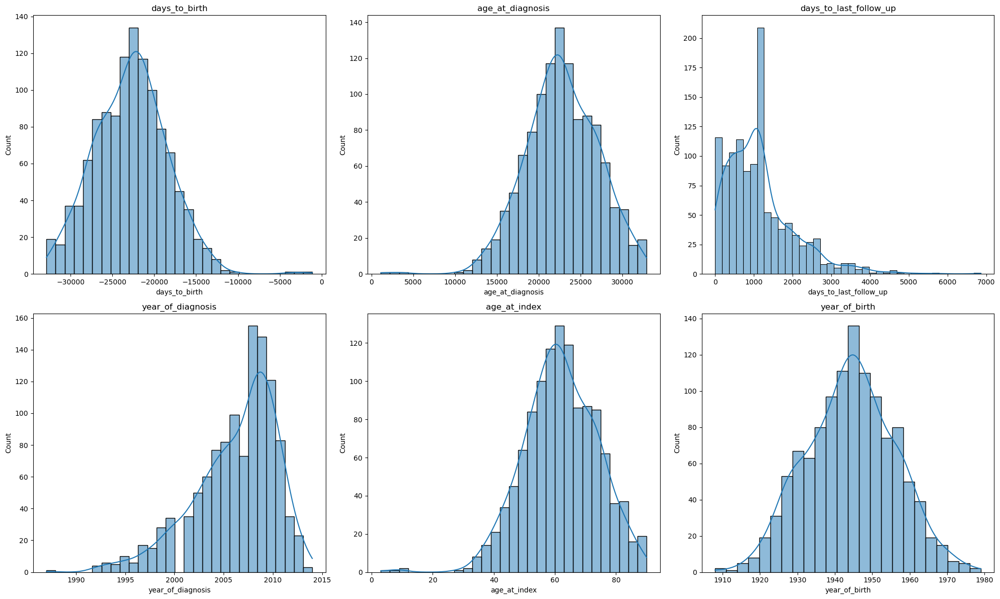

In [37]:
# making sure the distrubtions is correct 
fig, axes = plt.subplots(2, 3, figsize=(20,12))

for i, (column, ax) in enumerate(zip(to_fill, axes.flat)):
    sn.histplot(df_status[column], kde=True, ax=ax)
    ax.set_title(column)

plt.tight_layout()
plt.show()


In [38]:
# notice that the days to last follow up and the year of diagnosis is some what skewed so we need to deal with this 
# need to use standard scaler in the first thing to make our model 
categorical_columns = ['race' , 'figo_stage' , 'morphology', 'primary_diagnosis' ,'prior_malignancy','site_of_resection_or_biopsy' , 'synchronous_malignancy'  ,'tissue_or_organ_of_origin' ,'treatment_type' , 'treatment_or_therapy']

df_status.head()

,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_type,treatment_or_therapy
0,TCGA-D1-A17N,46.0,-17045.0,not hispanic or latino,not reported,0,1963.000000,17045.0,46.0,Stage IA,8380/3,"Endometrioid adenocarcinoma, NOS",no,Endometrium,No,Endometrium,2009.000000,"Pharmaceutical Therapy, NOS, Radiation Therapy...",no
1,TCGA-HS-A5NA,65.0,-24025.0,not reported,not reported,0,1944.323224,24025.0,298.0,Stage IIIC,8890/3,"Leiomyosarcoma, NOS",no,"Uterus, NOS",No,"Uterus, NOS",2006.236819,"Pharmaceutical Therapy, NOS, Radiation Therapy...","no, yes"
2,TCGA-BG-A0M6,73.0,-26666.0,not hispanic or latino,white,1,1935.000000,26666.0,241.0,Stage IIIC2,8441/3,"Serous cystadenocarcinoma, NOS",yes,Endometrium,Not Reported,Endometrium,2008.000000,"Pharmaceutical Therapy, NOS, Radiation Therapy...",yes
3,TCGA-61-1740,71.0,-26169.0,not hispanic or latino,white,1,1934.000000,26169.0,74.0,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",not reported,Ovary,Not Reported,Ovary,2005.000000,"Pharmaceutical Therapy, NOS, Radiation Therapy...","no, yes"
4,TCGA-13-0761,51.0,-18697.0,not hispanic or latino,white,1,1955.000000,18697.0,1036.0,Stage IV,8441/3,"Serous cystadenocarcinoma, NOS",not reported,Ovary,Not Reported,Ovary,2006.000000,"Pharmaceutical Therapy, NOS, Radiation Therapy...","no, yes"


# part 2 working on the gene part and merging the two dataframes based on the case id 


In [39]:
df_gene['Case'].value_counts()

Case
TCGA-BS-A0UT         1
TCGA-N1-A6IA         1
HCM-CSHL-0810-C54    1
TCGA-A5-A2K3         1
HTMCP-01-06-00146    1
TCGA-FI-A2CX         1
TCGA-25-2400         1
TCGA-QS-A8F1         1
TCGA-EO-A22U         1
TCGA-AJ-A3EL         1
TCGA-B5-A3F9         1
TCGA-BG-A2L7         1
                    ..
TCGA-AX-A1CN         1
TCGA-24-2020         1
TCGA-K1-A42X         1
TCGA-BG-A0M6         1
ER-ADC2              1
TCGA-25-2042         1
TCGA-24-1846         1
TCGA-AJ-A3OL         1
TCGA-AX-A3FZ         1
TCGA-EY-A1GX         1
ER-B1I5              1
ER-ABO1              1
Name: count, Length: 1000, dtype: int64

In [40]:
final_data = pd.merge(df_gene,df_status , left_on='Case' , right_on='case_submitter_id')
print(" the two dataframes has merged succefully ")

 the two dataframes has merged succefully 


In [41]:
final_data.shape

(961, 120)

In [42]:
gene_columns = ['SOCS1',
'LCP1',
 'CD79A',
 'PRF1',
 'CD74',
 'B2M',
 'HLA-A',
 'TNFRSF14',
 'CDKN1A',
 'ID3',
 'LMO2',
 'LEF1',
 'AXIN2',
 'CREB3L1',
 'TENT5C',
 'ALDH2',
 'CDH1',
 'TMPRSS2',
 'ESR1',
 'PIK3R1',
 'TP53',
 'GATA2',
 'FGFR2',
 'MECOM',
 'ERBB4',
 'PREX2',
 'MET',
 'POU5F1',
 'PAX8',
 'FGFR4',
 'TFRC',
 'CDKN2C',
 'CDKN1B',
 'CCNE1',
 'APOBEC3B',
 'CXCR4',
 'MYCL',
 'NFIB',
 'CEBPA',
 'NDRG1',
 'MYC',
 'BCL9L',
 'WT1',
 'BCL6',
 'SLC34A2',
 'MUC16',
 'IGF2BP2',
 'HMGA1',
 'TPM4',
 'CDKN2A',
 'MLF1',
 'SDHD',
 'BTG2',
 'JUN',
 'KLF6',
 'SGK1',
 'BIRC3',
 'TNFAIP3',
 'PTK6',
 'CBLC',
 'MUC1',
 'ELF3',
 'BCL3',
 'CARD11',
 'ERBB3',
 'MACC1',
 'TBX3',
 'FAT1',
 'PTPN13',
 'TNC',
 'PRRX1',
 'MLLT11',
 'CHST11',
 'SFRP4',
 'HOXA11',
 'FSTL3',
 'CSF1R',
 'SIRPA',
 'PDGFRA',
 'MAF',
 'MAFB',
 'PDGFRB',
 'COL3A1',
 'COL1A1',
 'CDH11',
 'CCND1',
 'ETV4',
 'ETV5',
 'SIX1',
 'FGFR1',
 'MYCN',
 'CCND2',
 'ERBB2',
 'ATP1A1',
 'PCBP1',
 'WNK2',
 'FBLN2',
 'ELN',
 'FGFR3',
 'ACKR3']

# part 3 


In [43]:
# encoding the data and using scaling methods and split the data to be able to put them into the machine learning model or the deep neural network to see the results
# we will try first the standard scaler and then quantile transformer and the robust scaler and see the results
# steps we have to make before 
# scaling the data 
# using encdoing tehcinques like get dummies or one hot encoder 
# splitting the data 

In [44]:
final_data.describe()

,SOCS1,LCP1,CD79A,PRF1,CD74,B2M,HLA-A,TNFRSF14,CDKN1A,ID3,LMO2,LEF1,AXIN2,CREB3L1,TENT5C,ALDH2,CDH1,TMPRSS2,ESR1,PIK3R1,TP53,GATA2,FGFR2,MECOM,ERBB4,PREX2,MET,POU5F1,PAX8,FGFR4,TFRC,CDKN2C,CDKN1B,CCNE1,APOBEC3B,CXCR4,MYCL,NFIB,CEBPA,NDRG1,MYC,BCL9L,WT1,BCL6,SLC34A2,MUC16,IGF2BP2,HMGA1,TPM4,CDKN2A,MLF1,SDHD,BTG2,JUN,KLF6,SGK1,BIRC3,TNFAIP3,PTK6,CBLC,MUC1,ELF3,BCL3,CARD11,ERBB3,MACC1,TBX3,FAT1,PTPN13,TNC,PRRX1,MLLT11,CHST11,SFRP4,HOXA11,FSTL3,CSF1R,SIRPA,PDGFRA,MAF,MAFB,PDGFRB,COL3A1,COL1A1,CDH11,CCND1,ETV4,ETV5,SIX1,FGFR1,MYCN,CCND2,ERBB2,ATP1A1,PCBP1,WNK2,FBLN2,ELN,FGFR3,ACKR3,age_at_index,days_to_birth,vital_status,year_of_birth,age_at_diagnosis,days_to_last_follow_up,year_of_diagnosis
count,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000,961.000000
mean,0.004977,0.002309,0.001174,-0.003984,0.014047,0.007218,0.002586,-0.016842,0.012980,0.002989,0.008872,0.009677,0.004924,0.011471,0.009271,-0.002703,0.005046,0.000632,0.007745,0.008363,0.018647,-0.001193,0.004098,0.007932,0.001270,-0.011585,-0.005454,-0.018305,-0.003759,-0.005641,-0.000897,-0.007419,-0.018001,-0.009230,-0.000909,0.001715,0.003024,0.010811,0.008393,-0.005011,0.008171,-0.001141,0.004198,0.013336,0.013862,0.006742,0.005957,0.010138,0.005280,0.009320,0.007655,0.008979,0.018489,0.016811,-0.011912,-0.005672,-0.002817,0.007536,-0.006038,0.003412,0.001980,0.011641,0.021476,-0.007053,0.001889,0.007551,-0.034775,-0.036531,-0.024657,0.000779,-0.006147,-0.023902,-0.013319,-0.002386,-0.005629,-0.001245,0.000949,-0.003585,-0.004926,-0.019025,0.000332,-0.001373,-0.000737,-0.006606,-0.007327,0.015608,0.004123,0.002098,-0.003127,0.003856,0.002021,-0.006109,0.002842,-0.004869,0.032219,0.006810,-0.000526,-0.006863,0.002238,0.011494,61.864953,-22810.980618,0.366285,1944.506638,22798.650968,1138.645877,2006.313544
std,1.006179,1.002073,1.004424,1.006477,1.002686,1.002174,1.004550,0.969705,1.013054,0.968981,1.012647,0.995433,1.005514,1.016169,1.010894,0.995982,0.990345,0.965138,0.994566,1.009992,1.003582,0.999047,1.001082,0.998655,1.000412,0.953533,0.978443,0.886918,0.973429,0.997761,0.994350,0.986188,0.989598,0.965374,1.005125,0.982798,1.015979,1.010175,1.013937,0.984447,1.012015,0.987995,0.995070,1.006496,1.008558,1.008139,1.010403,1.007585,1.004571,1.013632,1.008567,1.011960,1.012807,1.005198,0.906535,0.965707,1.009241,1.010757,0.999997,1.004939,0.999600,0.997873,1.004946,0.994813,0.995749,1.013092,0.718725,0.870871,0.895383,1.001961,0.992036,0.882368,0.942339,1.003577,0.999895,1.005204,0.982885,0.998650,0.965605,0.954908,1.005140,0.987395,1.006502,0.927750,0.942439,1.011314,1.001259,0.996223,0.998836,0.989909,0.994057,0.979786,1.019175,0.956490,1.002093,1.008543,1.004077,0.980641,1.015781,1.014029,11.497777,4185.023157,0.482040,11.877218,4175.704746,898.693493,4.244152
min,-0.936371,-0.902119,-0.335679,-0.405903,-0.999803,-1.305219,-0.861142,-1.103226,-0.902748,-0.842551,-0.859492,-

In [45]:
final_data.head()

,Case,SOCS1,LCP1,CD79A,PRF1,CD74,B2M,HLA-A,TNFRSF14,CDKN1A,ID3,LMO2,LEF1,AXIN2,CREB3L1,TENT5C,ALDH2,CDH1,TMPRSS2,ESR1,PIK3R1,TP53,GATA2,FGFR2,MECOM,ERBB4,PREX2,MET,POU5F1,PAX8,FGFR4,TFRC,CDKN2C,CDKN1B,CCNE1,APOBEC3B,CXCR4,MYCL,NFIB,CEBPA,NDRG1,MYC,BCL9L,WT1,BCL6,SLC34A2,MUC16,IGF2BP2,HMGA1,TPM4,CDKN2A,MLF1,SDHD,BTG2,JUN,KLF6,SGK1,BIRC3,TNFAIP3,PTK6,CBLC,MUC1,ELF3,BCL3,CARD11,ERBB3,MACC1,TBX3,FAT1,PTPN13,TNC,PRRX1,MLLT11,CHST11,SFRP4,HOXA11,FSTL3,CSF1R,SIRPA,PDGFRA,MAF,MAFB,PDGFRB,COL3A1,COL1A1,CDH11,CCND1,ETV4,ETV5,SIX1,FGFR1,MYCN,CCND2,ERBB2,ATP1A1,PCBP1,WNK2,FBLN2,ELN,FGFR3,ACKR3,case_submitter_id,age_at_index,days_to_birth,ethnicity,race,vital_status,year_of_birth,age_at_diagnosis,days_to_last_follow_up,figo_stage,morphology,primary_diagnosis,prior_malignancy,site_of_resection_or_biopsy,synchronous_malignancy,tissue_or_organ_of_origin,year_of_diagnosis,treatment_type,treatment_or_therapy
0,TCGA-N1-A6IA,-0.767204,-0.461749,-0.332902,-0.257786,-0.842213,0.003660,-0.527104,-0.822228,-0.343772,1.501626,-0.295488,0.139715,-0.380656,1.263603,-0.740763,-0.319106,-1.726621,-0.673239,-0.872486,0.377933,-1.433076,-0.486024,0.058893,-1.487496,-0.866327,-0.673629,-0.484130,-0.475253,-1.453000,-0.497579,0.429827,2.658164,0.119110,-0.386797,-0.260156,-1.000197,-0.315184,-0.756292,-0.580260,-0.381754,0.197716,-0.443828,-0.601349,0.647759,-0.824761,-0.652394,-0.757409,-1.252593,2.547049,-0.397943,-0.131313,-0.490966,-0.752673,0.709557,1.252128,1.267643,-0.445184,-0.532872,-0.607437,-0.878111,-1.056234,-1.613706,-0.781105,-0.640612,-1.128860,-0.759845,0.929133,1.157744,0.448694,8.260491,9.395804,6.386373,0.660883,6.537780,0.838784,-0.423304,0.180986,1.314447,4.869807,1.997252,16.704231,4.202193,15.756646,10.360689,3.328097,-0.871948,-0.848257,-0.549535,0.635468,0.429827,-0.647902,-0.301046,-0.329624,0.543024,-0.939416,-0.921838,-0.203160,0.554093,-0.395300,-0.100925,TCGA-N1-A6IA,41.000000,-15112.00000,not hispanic or latino,black or african american,1,1970.000000,15112.000000,124.000000,Stage IIIC,8890/3,"Leiomyosarcoma, NOS",no,"Uterus, NOS",No,"Uterus, NOS",2011.000000,"Pharmaceutical Therapy, NOS, Radiation Therapy...",no
1,HCM-CSHL-0810-C54,-0.930200,-0.346224,-0.325549,-0.405903,-0.980809,-0.918285,-0.566394,-1.011501,-0.269388,-0.476920,-0.859492,-0.861554,-0.618994,-0.395784,-0.886891,-0.125757,1.082894,12.331326,-1.043412,0.092914,-0.971831,-0.620610,-0.749988,-0.017502,-0.870980,-0.764033,3.223587,-0.446171,-1.444788,0.970887,1.662240,-0.603880,-0.847480,-0.067483,1.296977,-1.200012,-0.268273,-0.975802,1.892916,0.374015,0.788297,-0.820295,-0.763331,-0.996315,-0.827256,-0.653494,0.825677,-0.668593,-0.234372,-0.514641,-0.506694,0.198370,-0.690780,-1.039576,-0.143426,-0.738068,2.208961,-0.496460,1.518054,1.232752,-1.048023,-0.143120,-1.342941,3.638255,21.266446,7.191491,1.940652,9.449655,2.099031,-0.478821,-0.527675,-0.409178,-0.862794,-0.352656,-0.515034,-0.104033,-0.927062,-1.045497,-0.623015,-0.693148,-0.926729,-0.839006,-0.531234,-0.596023,-0.895637,0.176269,-0.393456,-0.663407,-0.564348,-1.145868,-0.636888,2.483832,0.193859,0.610308,-1.141286,-0.574715,-0.460560,-0.389508,1.119991,-0.739754,HCM-CSHL-0810-C54,61.745704,-22014.00000,not hispanic or latino,black or african american,0,1960.000000,22766.398614,1136.028293,Stage IIIC,8441/3,"Serous cystadenocarcinoma, NOS",no,Corpus uteri,Not Reported,"Uterus, NOS",2006.236819,"Targeted Molecular Therapy, Surgery, NOS, Immu...","no, yes"
2,TCGA-A5-A2K3,3.187190,4.934528,10.272691,23.847947,2.032977,5.452049,2.996784,5.350055,-0.051616,-0.026854,0.631557,-0.728904,-0.656230,-0.500964,4.176929,1.687911,-0.680556,-0.657767,-1.020769,-0.635925,-0.303844,-0.398905,-0.915168,-1.028921,-0.861300,-0.490115,0.126862,0.160840,-0.134846,1.816131,-0.808469,-0.137511,0.772040,1.046011,-0.926715,0.271204,-0.249647,-1.116455,1.509498,-0.199184,-0.563112,-1.071296,-0.754901,-1.021309,-0.738764,-0.615113,0.239369,0.944980,-0.777451,-0.657258,-0.755335,-0.038114,0.229497,-1.005829,-0.133118,-0.055435,0.

In [46]:
final_data['treatment_type'].value_counts()

treatment_type
Pharmaceutical Therapy, NOS, Radiation Therapy, NOS                                                                                                         945
Radiation Therapy, NOS                                                                                                                                        7
Pharmaceutical Therapy, NOS                                                                                                                                   4
Targeted Molecular Therapy, Surgery, NOS, Immunotherapy (Including Vaccines), Chemotherapy, Brachytherapy, High Dose, Hormone Therapy                         2
Targeted Molecular Therapy, Surgery, NOS, Immunotherapy (Including Vaccines), Chemotherapy, External Beam Radiation, Hormone Therapy                          1
Pharmaceutical Therapy, NOS, Chemotherapy, Radiation Therapy, NOS                                                                                             1
Targeted Molecular Therap

In [47]:
final_data['ethnicity'].value_counts()

ethnicity
not hispanic or latino    617
not reported              320
hispanic or latino         24
Name: count, dtype: int64

In [48]:
# second step using the encoding techinques 
# first define what is he categorical columns 
# beacuse the treatment or theapy and the treatment type is a list of values we need to split them and then encode them
final_data['treatment_or_therapy_yes'] = final_data['treatment_or_therapy'].apply(lambda x: 1 if 'yes' in x else 0)
final_data['treatment_or_therapy_no'] = final_data['treatment_or_therapy'].apply(lambda x: 1 if 'no' in x else 0)


In [49]:
# now we need to drop them from the data frame
final_data.drop(columns=['treatment_or_therapy'], inplace=True)

In [50]:
# now we need to encode the rest of the columns 
cat_columns = ['race' , 'figo_stage' , 'morphology', 'primary_diagnosis' ,'prior_malignancy','site_of_resection_or_biopsy' , 'synchronous_malignancy'  ,'tissue_or_organ_of_origin' ,'treatment_type' , 'ethnicity' ]
final_data = pd.get_dummies(final_data , columns=cat_columns , dtype=int)
final_data.drop(columns=['case_submitter_id' , 'Case'] , inplace=True)

In [63]:
print(final_data.iloc[[4]].vital_status)
sample = final_data.iloc[[4]].drop(columns='vital_status')
sample.to_csv('data/sample5.csv', index=False)

4    0
Name: vital_status, dtype: int64


In [53]:
# making the trainng set X and the target y
X = final_data.drop(columns=['vital_status'])
y = final_data['vital_status']

In [54]:
X.shape

(961, 189)

In [55]:

X.iloc[:2].to_csv('data/testing_18_april1.csv', index=False)

In [56]:
from sklearn.model_selection import train_test_split
x_train , x_test  , y_train , y_test  = train_test_split(X , y , stratify=y , random_state=42)

In [ ]:
X.head()

In [ ]:
y.iloc[:1]

In [62]:
list_190 = X.columns

In [ ]:
for item in list_190:
    print(item)


In [66]:
#putting the list of features into a empty excel file
import pandas as pd
df = pd.DataFrame([list_190] , columns= list_190)
df.to_csv('data/features_list_done.txt' , index=False)

## first the random forest classifier 

In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from scipy.stats import randint
import matplotlib.pyplot as plt
import numpy as np

# Split the data (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Define Pipeline with StandardScaler inside
pipeline = Pipeline([
    ('scaler', StandardScaler()),  
    ('smote', SMOTE(random_state=42)),  
    ('classifier', RandomForestClassifier(random_state=42))
])

# Define improved hyperparameter grid
param_distributions = {
    'classifier__n_estimators': randint(50, 250),  
    'classifier__max_depth': randint(5, 30),  
    'classifier__min_samples_split': randint(2, 10),  
    'classifier__min_samples_leaf': randint(2, 10),  
    'classifier__bootstrap': [True, False]
}

# Explicitly define Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Randomized Search with cross-validation
random_search = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions,
    n_iter=100,  # More efficient
    cv=skf,  # Use Stratified K-Fold
    scoring='f1_weighted',
    random_state=42,
    n_jobs=-1
)

# Fit model on training set
random_search.fit(X_train, y_train)

# Predictions on test set
y_pred = random_search.best_estimator_.predict(X_test)

# Evaluate model on the test set
print(classification_report(y_test, y_pred))



In [ ]:
#extracting the metrics
metrics_rf = classification_report(y_test, y_pred, output_dict=True)
metrics_rf = pd.DataFrame(metrics_rf).transpose()
metrics_rf

In [ ]:
# making the confusion matrix and roc curve and the auc score
from sklearn.metrics import confusion_matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sn.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()


# now we need to make the roc curve
from sklearn.metrics import roc_curve, roc_auc_score

y_pred_proba = random_search.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr, tpr ,color= 'orange', label=f'AUC score={auc:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Random Forest Classifier')
plt.legend()
plt.show()

## second the gradient boosting classifier 

In [ ]:
# now trying the gradinet boosting classifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, StratifiedKFold

pipeline = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('scaler', StandardScaler()),  
    ('classifier', GradientBoostingClassifier(random_state=42))
])
x_train , x_test , y_train , y_test = train_test_split(X , y , test_size=0.2 , stratify=y , random_state=42)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

param_grid = {
    'classifier__learning_rate': [0.01, 0.05, 0.1, 0.2],
    'classifier__n_estimators': [50, 100, 200, 300],
    'classifier__max_depth': [3, 4, 5, 6, 7],
    'classifier__min_samples_split': [2, 5, 10, 20],
    'classifier__min_samples_leaf': [1, 2, 4, 10],
    'classifier__subsample': [0.6, 0.8, 1.0],
    'classifier__max_features': ['sqrt', 'log2', None],
    'classifier__loss': ['log_loss', 'exponential']
}
random_search = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_grid,
    n_iter=100,
    cv=skf,
    scoring='f1_weighted',
    random_state=42,
    n_jobs=-1,
    verbose=2
)

random_search.fit(x_train, y_train)
y_pred = random_search.best_estimator_.predict(x_test)
print(classification_report(y_test, y_pred))


In [ ]:
print(random_search.best_params_)

In [ ]:
## extracting the probalities and puttning them alongside the x_test data to see the results
proba = random_search.best_estimator_.predict_proba(x_test)
proba_df = pd.DataFrame(
    proba, 
    columns=['prob_alive', 'prob_dead'], 
    index=x_test.index
)
proba_df['predicted'] = y_pred
proba_df['actual'] = y_test.to_numpy()

# Combine with test data
combined_df = pd.concat([x_test, proba_df], axis=1)

# Display the result
combined_df


In [ ]:
# making the combined df to a csv file to be able to use it in the tableau
combined_df.to_csv('data/final_predictions_data_df_24_march.csv')

In [ ]:
import joblib
joblib.dump(random_search.best_estimator_, 'gradient_boosting_model_24march.pkl')
scaler = random_search.best_estimator_.named_steps['scaler']
classifier = random_search.best_estimator_.named_steps['classifier'] ## saving the model alone beacuse the smote has nothing to do with prediction a single sample 
joblib.dump(classifier, 'gradient_boosting_classifier_24march.pkl')
joblib.dump(scaler, 'gradient_boosting_scaler_24march.pkl')

In [ ]:
from sklearn.calibration import CalibratedClassifierCV, calibration_curve
calibrated = CalibratedClassifierCV(random_search.best_estimator_, method='sigmoid', cv='prefit')
calibrated.fit(x_train, y_train)
y_prob_calibrated = calibrated.predict_proba(x_test)[:, 1]

fraction_of_positives, mean_predicted_value = calibration_curve(y_test, random_search.best_estimator_.predict_proba(x_test)[:,1], n_bins=10 , strategy='quantile')
fraction_of_positives_calibrated, mean_predicted_value_calibrated = calibration_curve(y_test, y_prob_calibrated, n_bins=10 , strategy='quantile')

plt.plot(mean_predicted_value, fraction_of_positives, 's-', label='Gradient Boosting')
plt.plot(mean_predicted_value_calibrated, fraction_of_positives_calibrated, 's-', label='Calibrated Gradient Boosting')
plt.plot([0, 1], [0, 1], '--', color='gray')
plt.xlabel('Mean Predicted Value')
plt.ylabel('Fraction of Positives')
plt.title('Calibration Curve')
plt.legend()
plt.show()

In [ ]:
gradient_boosting_best_params = random_search.best_params_
metrics_gradient_boosting = classification_report(y_test, y_pred, output_dict=True)
metrics_gradient_boosting = pd.DataFrame(metrics_gradient_boosting).transpose()

In [ ]:
print(gradient_boosting_best_params)

In [ ]:
# producing the shap values to see the importance of the features
import shap 
shap.initjs()
feature_names = X.columns  # Assuming X is the original DataFrame
# Convert X_val back to a DataFrame
X_val_df = pd.DataFrame(x_test, columns=feature_names)
explainer = shap.TreeExplainer(random_search.best_estimator_.named_steps['classifier'])
shap_values = explainer.shap_values(X_val_df)
plt.title('feature importance for the gradient boosting classifier')
shap.summary_plot(shap_values, X_val_df)

In [ ]:
# Identify the index of the "year of diagnosis" column
year_of_diagnosis_idx = list(X_val_df.columns).index("year_of_diagnosis")

# Filter out the unwanted feature from X_val_df
filtered_X_val_df = X_val_df.drop(columns=["year_of_diagnosis"])

# Filter the SHAP values - for a single output model
filtered_shap_values = np.delete(shap_values, year_of_diagnosis_idx, axis=1)

# Create the filtered plot
plt.figure(figsize=(10, 8))
plt.title('Feature importance for the gradient boosting classifier (excluding year of diagnosis)')
shap.summary_plot(filtered_shap_values, filtered_X_val_df)

In [ ]:
# creating the confusion matrix and the roc curve and the auc score
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score
conf_matrix = confusion_matrix(y_test, y_pred)
sn.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Gradient Boosting Classifier')
plt.show()

y_pred_proba = random_search.best_estimator_.predict_proba(x_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr, tpr ,color= 'orange', label=f'AUC score={auc:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Gradient Boosting Classifier')
plt.legend()
plt.show()

In [ ]:
# training using the optimal parameters througth all the folds
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, StratifiedKFold

parameters = {
    'classifier__subsample': 1.0,
    'classifier__n_estimators': 100,
    'classifier__min_samples_split': 5,
    'classifier__min_samples_leaf': 2,
    'classifier__max_features': None,
    'classifier__max_depth': 6,
    'classifier__loss': 'log_loss',
    'classifier__learning_rate': 0.2
}
pipeline = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('scaler', StandardScaler()),  
    ('classifier', GradientBoostingClassifier(random_state=42))]
    
    )
pipeline.set_params(**parameters)
all_reports = []
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for index ,  (train_index, test_index) in enumerate(skf.split(X, y)):
    print(f"now training the fold number {index}")
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    print(f"the classification report for the fold number {index} is : {classification_report(y_test, y_pred)}")
    report = classification_report(y_test, y_pred, output_dict=True)
    all_reports.append(report)


final_report = {}
for metric in ["precision", "recall", "f1-score"]:
    final_report[metric] = {
        label: np.mean([report[label][metric] for report in all_reports if label in report])
        for label in all_reports[0] if isinstance(all_reports[0][label], dict)
    }

print("\n=== Average Metrics Across Folds ===")
print(pd.DataFrame(final_report))





In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

# Define the pipeline with SMOTE, StandardScaler, and Gradient Boosting
pipeline = Pipeline([
    ('smote', SMOTE(sampling_strategy='auto', k_neighbors=5, random_state=42)),
    ('scaler', StandardScaler()),
    ('classifier', GradientBoostingClassifier(
        learning_rate=0.2,
        n_estimators=100,
        max_depth=6,
        min_samples_leaf=2,
        min_samples_split=5,
        subsample=1.0,
        max_features=None,
        loss='log_loss',
        random_state=42
    ))
])

# Initialize StratifiedKFold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Store classification reports for each fold
all_reports = []

for index, (train_index, test_index) in enumerate(skf.split(X, y)):
    print(f"Training fold {index + 1}...")

    # Split the data
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Fit and predict
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)

    # Get classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    all_reports.append(report)

# Compute mean metrics across all folds
final_report = {}
for metric in ["precision", "recall", "f1-score"]:
    final_report[metric] = {
        label: np.mean([report[label][metric] for report in all_reports if label in report])
        for label in all_reports[0] if isinstance(all_reports[0][label], dict)
    }

# Print average classification report
print("\n=== Average Metrics Across Folds ===")
print(pd.DataFrame(final_report))


## support vector classifier


In [ ]:
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from scipy.stats import randint
import matplotlib.pyplot as plt
import numpy as np



pipeline = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('scaler', StandardScaler()),  
    ('svm', SVC(random_state=42))
])

x_train , x_test , y_train , y_test = train_test_split(X , y , test_size=0.2 , stratify=y , random_state=42)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
param_grid = {
    'svm__C': [0.01, 0.1, 1, 10, 100, 1000],
    'svm__kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
    'svm__gamma': [0.0001, 0.001, 0.01, 0.1, 1, 'scale', 'auto'],
    'svm__class_weight': [None, 'balanced', {0:1, 1:2}, {0:1, 1:5}, {0:1, 1:10}],
    'svm__probability': [True],
    'svm__degree': [2, 3, 4, 5],  # Only matters for poly kernel
    'svm__coef0': [0.0, 0.1, 0.5, 1.0, 2.0],  # For poly and sigmoid kernels
    'svm__cache_size': [500]  # Increased cache for speed
}

random_search = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_grid,
    n_iter=100,
    cv=skf,
    scoring='roc_auc',
    random_state=42,
    n_jobs=-1,
    verbose=2
)
random_search.fit(x_train, y_train)
y_pred = random_search.best_estimator_.predict(x_test)
print(classification_report(y_test, y_pred))



In [ ]:
metrics_svc = classification_report(y_test, y_pred, output_dict=True)
metrics_svc = pd.DataFrame(metrics_svc).transpose()
metrics_svc

## neural networks

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
import numpy as np

# Making sure we use GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Convert to numpy arrays 
X_numpy = X.values
y_numpy = y.values

# Define the model
class MedicalNET(nn.Module):
    def __init__(self, input_size):
        super(MedicalNET, self).__init__()
        self.fc1 = nn.Linear(input_size, 64)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, 16)
        self.fc4 = nn.Linear(16, 1)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
        self.dropout = nn.Dropout(0.2)
        
    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.relu(self.fc3(x))
        x = self.sigmoid(self.fc4(x))
        return x

# Define training function
def train_model(model, train_loader, criterion, optimizer, epochs, device):
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        
        # Only print every 10 epochs to reduce output
        if (epoch + 1) % 10 == 0:
            print(f"Epoch {epoch+1}/{epochs} - Loss: {running_loss/len(train_loader):.4f}")
    
    return model

# Initialize cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
epochs = 200  # Reduced epochs for faster runs

# Metrics storage
all_accuracies = []
all_aucs = []

# Cross-validation loop
for fold, (train_index, val_index) in enumerate(skf.split(X_numpy, y_numpy)):
    print(f"\n===== Fold {fold+1}/5 =====")
    
    # Split data for this fold
    X_train, X_val = X_numpy[train_index], X_numpy[val_index]
    y_train, y_val = y_numpy[train_index], y_numpy[val_index]
    
    # Apply SMOTE only on training data
    smote = SMOTE(random_state=42)
    X_train, y_train = smote.fit_resample(X_train, y_train)
    
    # Standardize features - fit on training, transform on both
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_val = scaler.transform(X_val)
    
    # Convert to PyTorch tensors
    x_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1).to(device)
    x_val_tensor = torch.tensor(X_val, dtype=torch.float32).to(device)
    y_val_tensor = torch.tensor(y_val, dtype=torch.float32).unsqueeze(1).to(device)
    
    # Create dataloader
    train_data = TensorDataset(x_train_tensor, y_train_tensor)
    train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
    
    # Initialize model, loss, and optimizer
    input_size = X_train.shape[1]
    model = MedicalNET(input_size).to(device)
    criterion = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    # Train the model
    model = train_model(model, train_loader, criterion, optimizer, epochs, device)
    
    # Evaluate the model
    model.eval()
    with torch.no_grad():
        y_pred_proba = model(x_val_tensor)
        y_pred = (y_pred_proba >= 0.5).float()
        accuracy = (y_pred.eq(y_val_tensor)).float().mean()
        test_loss = criterion(y_pred_proba, y_val_tensor)
        
        # Move tensors back to CPU for sklearn metrics
        y_pred_proba_cpu = y_pred_proba.cpu().numpy()
        y_val_cpu = y_val_tensor.cpu().numpy()
        y_pred_cpu = (y_pred_proba_cpu >= 0.5).astype(int)
        
        # Calculate metrics
        fold_auc = roc_auc_score(y_val_cpu, y_pred_proba_cpu)
        all_accuracies.append(accuracy.item())
        all_aucs.append(fold_auc)
        
        # Print results for this fold
        print(f"Fold {fold+1} Results:")
        print(f"Validation Loss: {test_loss.item():.4f}")
        print(f"Validation Accuracy: {accuracy.item():.4f}")
        print(f"Validation AUC: {fold_auc:.4f}")
        print("\nClassification Report:")
        print(classification_report(y_val_cpu, y_pred_cpu))

# Print overall results
print("\n===== Overall Results =====")
print(f"Mean Accuracy: {np.mean(all_accuracies):.4f} ± {np.std(all_accuracies):.4f}")
print(f"Mean AUC: {np.mean(all_aucs):.4f} ± {np.std(all_aucs):.4f}")
print(f"All fold AUCs: {all_aucs}")

## logistic regression

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.metrics import classification_report
x_train , x_test , y_train , y_test = train_test_split(X , y , test_size=0.2 , stratify=y , random_state=42)
# Define Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
pipeline = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('scaler', StandardScaler()),  
    ('classifier', LogisticRegression(random_state=42))
])

param_grid = {
    'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100],
    'classifier__penalty': ['elasticnet'],
    'classifier__solver': ['saga'],  # Only solver that supports elasticnet
    'classifier__l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9],  # Mix of L1/L2, closer to 1 = more L1
    'classifier__class_weight': [None, 'balanced', {0:1, 1:3}],
    'classifier__max_iter': [2000],  # Higher value to ensure convergence
    'smote__sampling_strategy': [0.8, 1.0]
}
random_search = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_grid,
    n_iter=100,
    cv=skf,
    scoring='f1_weighted',
    random_state=42,
    n_jobs=-1,
    verbose=2
)

random_search.fit(x_train, y_train)
y_pred = random_search.best_estimator_.predict(x_test)
print(classification_report(y_test, y_pred))




In [ ]:
metrics_logistic_reg = classification_report(y_test, y_pred, output_dict=True)
metrics_logistic_reg = pd.DataFrame(metrics_logistic_reg).transpose()
metrics_logistic_reg

## plotting the results

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Assuming your DataFrames are named as before
models = {
    'SVC': metrics_svc,
    'Gradient Boosting': metrics_gradient_boosting,
    'Random Forest': metrics_rf,
    'Logistic regression': metrics_logistic_reg
}

# Extract precision values
precision_data = {
    'Model': [],
    'Class 0': [],
    'Class 1': [],
    'Overall': []
}

for model_name, metrics_df in models.items():
    precision_data['Model'].append(model_name)
    precision_data['Class 0'].append(metrics_df.loc['0', 'precision'])
    precision_data['Class 1'].append(metrics_df.loc['1', 'precision'])
    precision_data['Overall'].append(metrics_df.loc['weighted avg', 'precision'])

# Convert to DataFrame
precision_df = pd.DataFrame(precision_data)

# Set up the plot
plt.figure(figsize=(12, 6))
bar_width = 0.25  # Width of each bar
index = np.arange(len(precision_df['Model']))  # Positions for each model group

# Plot bars for each category
bars1 = plt.bar(index, precision_df['Class 0'], bar_width, label='Class 0', color='#FF9999')
bars2 = plt.bar(index + bar_width, precision_df['Class 1'], bar_width, label='Class 1', color='#66B2FF')
bars3 = plt.bar(index + 2 * bar_width, precision_df['Overall'], bar_width, label='Overall', color='#99FF99')

# Customize the plot
plt.title('Precision Comparison Across Models', fontsize=14, pad=15)
plt.xlabel('Model', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.xticks(index + bar_width, precision_df['Model'], rotation=45, ha='right')
plt.ylim(0, 1)  # Precision ranges from 0 to 1
plt.legend(title='Category')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels on top of bars
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2.,
            height,
            f'{height:.3f}',
            ha='center',
            va='bottom'
        )

add_labels(bars1)
add_labels(bars2)
add_labels(bars3)

plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Assuming your DataFrames are named as before
models = {
    'SVC': metrics_svc,
    'Gradient Boosting': metrics_gradient_boosting,
    'Random Forest': metrics_rf,
    'Logistic regression': metrics_logistic_reg
}

# Extract recall values
recall_data = {
    'Model': [],
    'Class 0': [],
    'Class 1': [],
    'Overall': []
}

for model_name, metrics_df in models.items():
    recall_data['Model'].append(model_name)
    recall_data['Class 0'].append(metrics_df.loc['0', 'recall'])
    recall_data['Class 1'].append(metrics_df.loc['1', 'recall'])
    recall_data['Overall'].append(metrics_df.loc['weighted avg', 'recall'])

# Convert to DataFrame
recall_df = pd.DataFrame(recall_data)

# Set up the plot
plt.figure(figsize=(12, 6))
bar_width = 0.25  # Width of each bar
index = np.arange(len(recall_df['Model']))  # Positions for each model group

# Plot bars for each category
bars1 = plt.bar(index, recall_df['Class 0'], bar_width, label='Class 0', color='#FF9999')
bars2 = plt.bar(index + bar_width, recall_df['Class 1'], bar_width, label='Class 1', color='#66B2FF')
bars3 = plt.bar(index + 2 * bar_width, recall_df['Overall'], bar_width, label='Overall', color='#99FF99')

# Customize the plot
plt.title('Recall Comparison Across Models', fontsize=14, pad=15)
plt.xlabel('Model', fontsize=12)
plt.ylabel('Recall', fontsize=12)
plt.xticks(index + bar_width, recall_df['Model'], rotation=45, ha='right')
plt.ylim(0, 1)  # Recall ranges from 0 to 1
plt.legend(title='Category')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels on top of bars
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2.,
            height,
            f'{height:.3f}',
            ha='center',
            va='bottom'
        )

add_labels(bars1)
add_labels(bars2)
add_labels(bars3)

plt.tight_layout()
plt.show()

## training the gradient boositng one more time with the best parameters